In [390]:
import sqlite3
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [477]:
# turn BAND_INFO into df
conn = sqlite3.connect('Metal_Bands.db')
data = pd.read_sql_query("SELECT * from BAND_INFO", conn)
conn.close()

In [7]:
# check out layout
data

,Band_Name,Status,Location,Year_Formed,Genre,Lyrical_Themes,Years_Active
0,۞,Split-up,N/A,N/A,Black Metal,N/A,N/A
1,...and Here I Lie,Split-up,"Holley, New York",1994,Death/Doom Metal,"Depression, Isolation, Suicide","1994-2000,\n2007"
2,...and They Will Meet God,Split-up,"Palestine, Texas",2002,Melodic Death Metal/Crossover,"Doom, Death, Hate",2002-?
3,...in Agony of the Eclipsed Moon,Active,"Midland City, Alabama",N/A,Black Metal/Dark Ambient,N/A,N/A
4,...Under a Full Moon,Active,"Midland, Michigan (early); North Carolina, Uni...",2017,Black/Doom Metal,"Depression, Suicide, Anti-capitalism","2016-2017 (as Disrhythmia),\n2017-present"
...,...,...,...,...,...,...,...
35874,Рая Нет,Active,"Denver, Colorado",N/A,Death Metal,N/A,"?-2002,\n2014-present"
35875,מזמור,Active,"Portland, Oregon",2012,Black/Drone/Doom Metal,"Nihilism, Absurdity, Apostasy",2012-present
35876,हनुमान,Active,"Baltimore, Maryland",N/A,Brutal Death Metal,N/A,N/A
35877,ロリVOMITS,Split-up,"New York, New York",2009,Funeral Doom/Black/Thrash Metal/Punk,"Despair, Suicide, Psychosis, Submission, Lolicon","2004-? (as Retaliation),\n? (as Life Sucks),\n..."


In [9]:
# check features
data.describe()

,Band_Name,Status,Location,Year_Formed,Genre,Lyrical_Themes,Years_Active
count,35879,35879,35879,35879,35879,35879,35879
unique,32938,6,6288,54,3745,12213,6357
top,Monolith,Active,"Los Angeles, California",N/A,Black Metal,N/A,N/A
freq,14,19553,1142,10369,3082,19720,9570


# Some Notes:

## General
- No NaN's but plenty of N/A's... means no errors in scraping

## Cleaning
- GOAL: have Genre and Lyrical_Themes as lists of strings and Years_Active as list of integers
- For Genre:
  - must split entries at each / and ,
     - split at / and ,
  - need to address parentheses indicating "early" and "later" genres 
     - delete " (early); " and " (later)" and " (mid) " and all variations
  - need to address entries with word "with" 
     - delete " with " and " elements" and " influences"
  - need to address the equivalence of entries such as Black/Doom Metal and Black Metal/Doom Metal
     - delete " Metal" but not "Metalcore"
  - deal with spaces separating what should be different genre labels
     - split on spaces, save for special genre names
  - deal with duplicates in an entry
- Must split up Lyrical_Themes entries at each ,
- For Years_Active:
 1) must split at commas
 2) strip all \n's
 3) must deal with ?'s. ...?
 4) must deal with name changes ...?
 5) must deal with "present"s 
 6) must turn elements with -'s into ranges of numbers

In [11]:
data.Status.unique()

array(['Split-up', 'Active', 'Unknown', 'On hold', 'Changed name',
       'Disputed'], dtype=object)

In [10]:
data.Genre.unique()

array(['Black Metal', 'Death/Doom Metal', 'Melodic Death Metal/Crossover',
       ..., 'Industrial/Death Metal/Grindcore',
       'Black Metal with Grindcore elements',
       'Funeral Doom/Black/Thrash Metal/Punk'], dtype=object)

## Let's start with Genre

In [109]:
[entry for entry in data.Genre]

['Black Metal',
 'Death/Doom Metal',
 'Melodic Death Metal/Crossover',
 'Black Metal/Dark Ambient',
 'Black/Doom Metal',
 'Black Metal/Grindcore',
 'Thrash Metal/Punk/Crossover',
 'Slam/Brutal Death Metal',
 'Black Metal/Crust',
 'Sludge/Doom Metal',
 'Doom Metal/Psychedelic Rock',
 'Black Metal',
 'Death Metal',
 'Sludge/Stoner Metal',
 'Progressive Death Metal/Grindcore',
 'Progressive Metalcore',
 'Metalcore/Crossover',
 'Drone/Doom Metal',
 'Death Metal',
 'Dark Ambient (early); Doom/Post-Metal (later)',
 'Death Metal/Grindcore',
 'Black Metal/Industrial',
 'Sludge/Post-Metal',
 'Avant-garde Black Metal',
 'Heavy/Thrash Metal',
 'Death Metal/Grindcore (early); Slam/Brutal Death Metal (later)',
 'Slam/Brutal Death Metal',
 'Technical Death Metal',
 'Stoner/Doom Metal/Rock',
 'Death Metal',
 'Melodic Death Metal',
 'Thrash/Heavy Metal',
 'Heavy Metal',
 'Psychedelic/Experimental Black Metal',
 'Death Metal',
 'Drone/Sludge Metal',
 'Avant-garde Black/Speed Metal',
 'Death/Groove Meta

In [107]:
[entry for entry in data.Genre if ("roots" in entry) or ("Roots" in entry)]

['Blues/Roots (early); Doom Metal/Hard Rock (later)']

In [108]:
[entry for entry in data.Genre if ("later" in entry) or ("early" in entry) or ("mid" in entry)]

['Dark Ambient (early); Doom/Post-Metal (later)',
 'Death Metal/Grindcore (early); Slam/Brutal Death Metal (later)',
 'Death/Groove Metal (early); Sludge/Doom/Death Metal (later)',
 'Noise (early); Metalcore (later)',
 'Djent (early); Progressive Metal (later)',
 'Death Metal/Grindcore (early); Black Metal (later)',
 'Symphonic Black Metal/Metalcore (early); Atmospheric Black Metal (later)',
 'Metalcore (early); Brutal Death Metal (later)',
 'Brutal Death Metal (early); Melodic Death Metal (later)',
 'Death Metal (early); Black/Thrash Metal (later)',
 'Death Metal/Crust (early); Death Metal (later)',
 'Black Metal (early); Industrial Black Metal (later)',
 'Raw Black Metal (early); Melodic Death/Black Metal (later)',
 'Technical Deathcore/Djent (early); Technical/Melodic Deathcore (later)',
 'Heavy/Power Metal (early/later); Doom Metal (mid)',
 'Brutal Death Metal (early); Progressive Brutal Death Metal (later)',
 'Thrash/Groove Metal (early); Alternative Metal (later)',
 'Brutal Death

In [111]:
[entry for entry in data.Genre if " Metal" in entry]

['Black Metal',
 'Death/Doom Metal',
 'Melodic Death Metal/Crossover',
 'Black Metal/Dark Ambient',
 'Black/Doom Metal',
 'Black Metal/Grindcore',
 'Thrash Metal/Punk/Crossover',
 'Slam/Brutal Death Metal',
 'Black Metal/Crust',
 'Sludge/Doom Metal',
 'Doom Metal/Psychedelic Rock',
 'Black Metal',
 'Death Metal',
 'Sludge/Stoner Metal',
 'Progressive Death Metal/Grindcore',
 'Progressive Metalcore',
 'Drone/Doom Metal',
 'Death Metal',
 'Death Metal/Grindcore',
 'Black Metal/Industrial',
 'Avant-garde Black Metal',
 'Heavy/Thrash Metal',
 'Death Metal/Grindcore (early); Slam/Brutal Death Metal (later)',
 'Slam/Brutal Death Metal',
 'Technical Death Metal',
 'Stoner/Doom Metal/Rock',
 'Death Metal',
 'Melodic Death Metal',
 'Thrash/Heavy Metal',
 'Heavy Metal',
 'Psychedelic/Experimental Black Metal',
 'Death Metal',
 'Drone/Sludge Metal',
 'Avant-garde Black/Speed Metal',
 'Death/Groove Metal (early); Sludge/Doom/Death Metal (later)',
 'Groove/Thrash Metal',
 'Heavy/Thrash Metal',
 'De

In [185]:
[entry for entry in data.Genre if ("word" in entry) or ("Word" in entry)]

['Symphonic Black Metal/Spoken Word',
 'Heavy/Groove/Thrash/Death Metal, Spoken Word']

In [186]:
[entry for entry in data.Genre if "Music" in entry]

['Gothic Metal (early); Darkwave/World Music (later)',
 'Progressive Rock/Metal, World Music']

In [200]:
[entry for entry in data.Genre if (("Hard " in entry) 
 or ("Hard/" in entry))
 and ("Hard Rock" not in entry)]

['Doom Metal/Hard/Progressive Rock', 'Heavy Metal/Hard/Punk Rock']

In [229]:
[entry for entry in data.Genre if "Music" in entry]

['Gothic Metal (early); Darkwave/World Music (later)',
 'Progressive Rock/Metal, World Music']

In [214]:
[entry for entry in data.Genre if "Rock" in entry]

['Doom Metal/Psychedelic Rock',
 'Stoner/Doom Metal/Rock',
 'Progressive Rock/Metal',
 'Heavy Metal/Progressive Hard Rock',
 'Heavy Metal/Hard Rock',
 'Gothic Rock/Ambient, Heavy/Gothic Metal',
 'Thrash/Southern Metal/Rock',
 'Heavy Metal/Hard Rock',
 'Progressive Rock/Metal',
 'Power/Thrash Metal/Hard Rock',
 'Progressive Metal/Rock',
 'Post-Black Metal, Post-Rock/Hardcore',
 'Heavy/Power Metal, Hard Rock',
 'Atmospheric Sludge/Post-Metal/Rock',
 'Southern Metal/Rock',
 'Progressive Metal/Rock',
 'Heavy Metal/Hard Rock',
 'Stoner Metal/Rock',
 'Melodic Heavy Metal/Hard Rock',
 'Heavy Metal/Hard Rock',
 'Heavy Metal/Hard Rock',
 'Progressive Metal/Rock',
 'Stoner Metal/Rock',
 'Progressive Psychedelic Doom/Stoner Metal/Rock',
 'Symphonic/Heavy Metal/Rock',
 'Progressive Metal, Alternative Rock, Ambient/Electronic',
 'Progressive Rock/Metal',
 'Heavy Metal/Hard Rock',
 'Hard Rock/Groove Metal',
 'Heavy Metal/Hard Rock',
 'Heavy Metal/Hard Rock',
 'Heavy Metal/Hard Rock/Punk, Synthwave',

In [251]:
[entry for entry in data.Genre if "Oi" in entry]

['Oi!/RAC (early); Thrash Metal/Crossover (later)',
 'Black Metal/Oi!',
 'Black/Viking Metal/Oi!',
 'Oi!/Punk (early); Heavy Metal/Hardcore (later)',
 'Crossover/Oi! (early); Crossover/Thrash Metal (later)']

In [254]:
[entry for entry in data.Genre if "Middle" in entry]

['Black/Death Metal with Middle Eastern Folk influences',
 'Progressive Metal with Middle Eastern influences',
 'Middle Eastern/Egyptian Ambient']

In [201]:
[entry for entry in data.Genre if "Punk" in entry]

['Thrash Metal/Punk/Crossover',
 'Crust Punk/Thrash Metal',
 'Black/Thrash Metal/Hardcore Punk',
 'Heavy Metal with Punk influences',
 'Black Metal/Punk',
 'Death Metal/Punk',
 'Black Metal/Punk',
 'Heavy Metal/Hard Rock/Punk, Synthwave',
 'Death/Thrash Metal/Crust Punk',
 'Heavy Metal with Punk elements',
 'Black Metal/Hardcore Punk',
 'Speed Metal/Punk',
 'Black/Thrash Metal/Punk',
 'Metalcore/Hardcore Punk',
 'Speed Metal/Punk/Rock',
 'Black Metal/Punk',
 'Crustcore/Thrash Metal (early); Heavy Metal/Hard Rock/Punk (later)',
 'Industrial Black Metal/Crust Punk',
 'Hardcore Punk/Crossover (early); Crossover/Thrash Metal (later)',
 'Hardcore Punk (early); Black Metal (later)',
 'Heavy Metal/Punk Rock',
 'Hardcore Punk/Crossover/Thrash Metal',
 'Black Metal/Punk',
 'Black/Thrash Metal/Punk',
 'Black Metal/Punk',
 'Crossover/Thrash Metal, Hardcore Punk',
 'Hardcore Punk (early); Black/Thrash Metal (later)',
 'Black Metal/Crust Punk',
 'Thrash Metal/Punk',
 'Sludge Metal/Hardcore Punk',
 

In [221]:
[entry for entry in data.Genre if "Age" in entry]

['New Age, Progressive Rock/Metal']

In [269]:
[entry for entry in data.Genre if "Trip" in entry]

['Trip Hop, Raw Black Metal']

In [213]:
arr = ["Black Power", "Brutal Death", "Doom", "Hard Rock", "New Wave"]
arr2 = []

#for i in range(len(arr)):
#    elts = arr[i].split()
#    print(elts)
#    #arr2.append(elt for elt in elts)
#    
#    arr2 = [x for _list in data2.Genre for x in _list]

#arr2 = [elt for elts in arr for elt in elts.split()] # WORKS
#      if ("Hard Rock" not in elt) and ("New Wave" not in elt)] # DOESN'T WORK    

arr2 = [elt for elts in arr 
        for elt in elts.split()] 

print(arr)
print(arr2)

['Black Power', 'Brutal Death', 'Doom', 'Hard Rock', 'New Wave']
['Black', 'Power', 'Brutal', 'Death', 'Doom', 'Hard', 'Rock', 'New', 'Wave']


In [444]:
# clean genre column according to notes above; store in new array
genre_arr = []
replace = [" (early); ", " (early/later); ", " (mid); ", " (early, later); ",
          " early);", " with ", " and "]
remove = [" (mid)", " (later)", " metal", " elements", " influences", " 'n' Roll", "/Roots"]
keep = ["Middle Eastern", "New Wave", "Spoken Word", "World Music", "New Age", "Trip Hop"]

# loop over rows of Genre feature
for entry in data.Genre:
    # replace N/A with np.nan and continue to next entry
    if entry == "N/A":
        genre_arr.append(np.nan)
        continue
    
    # replace necessary substrings with /
    for elt in replace:
        entry = entry.replace(elt, "/")
        
    # remove necessary substrings
    for elt in remove:
        entry = entry.replace(elt, "")
    
    # split at / and ,
    entry = re.split(r"[/,]", entry)
    
    # delete Metal but not Metalcore
    for i in range(len(entry)):
        #if entry[i] in keep:
        #    continue
        if (" Metal" in entry[i]) and ("Metalcore" not in entry[i]):
            entry[i] = entry[i].replace(" Metal", "")
            
    # strip extra spaces and append to array
    entry = [elt.strip() for elt in entry]
       
    # split genres at spaces when should be /'s, except for genres in keep list
    new_entry = []
    for i in range(len(entry)):
        if entry[i] in keep:
            new_entry.append(entry[i])
            continue
        for elt in entry[i].split():
            new_entry.append(elt)
            
    # append entry with no duplicate elts
    genre_arr.append([*set(new_entry)])

print(len(genre_arr))
genre_arr

35879


[['Black'],
 ['Death', 'Doom'],
 ['Death', 'Crossover', 'Melodic'],
 ['Ambient', 'Black', 'Dark'],
 ['Doom', 'Black'],
 ['Grindcore', 'Black'],
 ['Crossover', 'Thrash', 'Punk'],
 ['Death', 'Slam', 'Brutal'],
 ['Black', 'Crust'],
 ['Doom', 'Sludge'],
 ['Doom', 'Psychedelic', 'Rock'],
 ['Black'],
 ['Death'],
 ['Sludge', 'Stoner'],
 ['Progressive', 'Death', 'Grindcore'],
 ['Progressive', 'Metalcore'],
 ['Crossover', 'Metalcore'],
 ['Doom', 'Drone'],
 ['Death'],
 ['Post-Metal', 'Doom', 'Ambient', 'Dark'],
 ['Death', 'Grindcore'],
 ['Industrial', 'Black'],
 ['Post-Metal', 'Sludge'],
 ['Black', 'Avant-garde'],
 ['Heavy', 'Thrash'],
 ['Death', 'Grindcore', 'Slam', 'Brutal'],
 ['Death', 'Slam', 'Brutal'],
 ['Death', 'Technical'],
 ['Doom', 'Rock', 'Stoner'],
 ['Death'],
 ['Death', 'Melodic'],
 ['Thrash', 'Heavy'],
 ['Heavy'],
 ['Psychedelic', 'Black', 'Experimental'],
 ['Death'],
 ['Drone', 'Sludge'],
 ['Black', 'Speed', 'Avant-garde'],
 ['Death', 'Groove', 'Sludge', 'Doom'],
 ['Groove', 'Thra

In [425]:
# set genre_arr as Genre feature
data2 = data.copy()
data2.Genre = genre_arr
# check feature type
print(data2.Genre.dtype)
# check individual entry type
print(type(data2.Genre[0]))
# check feature
data2.Genre.head()

object
<class 'list'>


0                        [Black]
1                  [Death, Doom]
2    [Death, Crossover, Melodic]
3         [Ambient, Black, Dark]
4                  [Doom, Black]
Name: Genre, dtype: object

In [272]:
# get unique genres and their counts
genre_counts = pd.Series([x for _list in data2.Genre for x in _list]).value_counts()
unique_genres = genre_counts.index
print(genre_counts)

Death       12158
Black        7776
Thrash       7748
Heavy        5269
Doom         3574
            ...  
Trip Hop        1
Middle          1
16-bit          1
Cowpunk         1
Eastern         1
Length: 131, dtype: int64


In [276]:
# check unique genres so far
pop_genres = [genre_counts.index[i] 
                 for i in range(len(genre_counts)) if genre_counts[i] > 100]
print(len(unique_genres))
unique_genres[:10]

45


['Death',
 'Black',
 'Thrash',
 'Heavy',
 'Doom',
 'Progressive',
 'Melodic',
 'Sludge',
 'Groove',
 'Power']

In [ ]:
# Notes: keep New Wave, remove 'n' Roll, keep Spoken Word, keep Middle Eastern ... DONE!
#        maybe keep Hard Rock, Pop Rock, Soft Rock
# maybe keep Brutal Death??? prob not then would have to keep Melodic Death, Raw Black, etc.

<ipython-input-309-4fb33aa326c4>:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


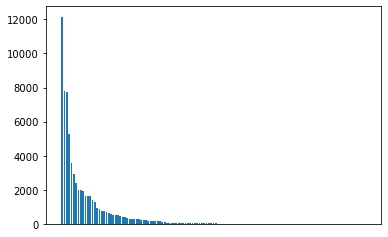

In [309]:
# see exponential dropoff in count of genres
plt.bar(genre_counts.index, genre_counts, labels="Genre Count")
ax = plt.axes()
ax.get_xaxis().set_visible(False)
plt.show()

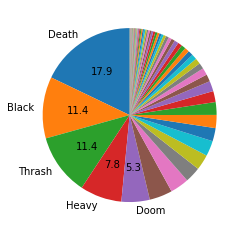

In [726]:
# pie chart of genre count
sizes = genre_counts
labels = genre_counts.index

def my_autopct(pct):
    return ('%1.1f' % pct) if pct > 5 else ''

def get_new_labels(sizes, labels):
    new_labels = [label if size > 3000 else '' for size, label in zip(sizes, labels)]
    return new_labels

fig, ax = plt.subplots()
_,_,_ = ax.pie(sizes, labels=get_new_labels(sizes, labels), 
               autopct=my_autopct, startangle=90, rotatelabels=False)

In [311]:
data2

,Band_Name,Status,Location,Year_Formed,Genre,Lyrical_Themes,Years_Active
0,۞,Split-up,N/A,N/A,[Black],N/A,N/A
1,...and Here I Lie,Split-up,"Holley, New York",1994,"[Death, Doom]","Depression, Isolation, Suicide","1994-2000,\n2007"
2,...and They Will Meet God,Split-up,"Palestine, Texas",2002,"[Melodic, Death, Crossover]","Doom, Death, Hate",2002-?
3,...in Agony of the Eclipsed Moon,Active,"Midland City, Alabama",N/A,"[Black, Dark, Ambient]",N/A,N/A
4,...Under a Full Moon,Active,"Midland, Michigan (early); North Carolina, Uni...",2017,"[Black, Doom]","Depression, Suicide, Anti-capitalism","2016-2017 (as Disrhythmia),\n2017-present"
...,...,...,...,...,...,...,...
35874,Рая Нет,Active,"Denver, Colorado",N/A,[Death],N/A,"?-2002,\n2014-present"
35875,מזמור,Active,"Portland, Oregon",2012,"[Black, Drone, Doom]","Nihilism, Absurdity, Apostasy",2012-present
35876,हनुमान,Active,"Baltimore, Maryland",N/A,"[Brutal, Death]",N/A,N/A
35877,ロリVOMITS,Split-up,"New York, New York",2009,"[Funeral, Doom, Black, Thrash, Punk]","Despair, Suicide, Psychosis, Submission, Lolicon","2004-? (as Retaliation),\n? (as Life Sucks),\n..."


# Next up is Lyrical_Themes (turned out to not be super necessary)

In [315]:
# check the feature
data.Lyrical_Themes

0                                                     N/A
1                          Depression, Isolation, Suicide
2                                       Doom, Death, Hate
3                                                     N/A
4                    Depression, Suicide, Anti-capitalism
                               ...                       
35874                                                 N/A
35875                       Nihilism, Absurdity, Apostasy
35876                                                 N/A
35877    Despair, Suicide, Psychosis, Submission, Lolicon
35878           Depression, Suicide, Death, Fantasy, Weed
Name: Lyrical_Themes, Length: 35879, dtype: object

In [319]:
[entry for entry in data.Lyrical_Themes if "/" in entry]

['N/A',
 'N/A',
 'N/A',
 'N/A',
 'Ranma 1/2, Negative thoughts',
 'N/A',
 "Navajo/Native American mythology, Diné Bahane', Genocide, History",
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'N/A',
 'Personal issues/struggles',
 'N/A',
 'N/A',
 'N/A',
 'Anti-life

In [464]:
# let's turn the themes feaurs into a list of strings
themes_arr = []
replace = [" (early); ", " (early/later); ", " (mid); ", " (early, later); ",
          " early);", " and "]
remove = [" (mid)", " (later)", " (early)"]

# loop over rows of Lyrical_Themes
for entry in data.Lyrical_Themes:
    
    # replace N/A with np.nan and continue to next entry
    if entry == "N/A":
        themes_arr.append(np.nan)
        continue
    
    # replace necessary substrings with ,
    for elt in replace:
        entry = entry.replace(elt, ",")
    
    # remove necessary substrings
    for elt in remove:
        entry = entry.replace(elt, "")
    
    # split at commas
    entry = entry.split(",")
    
    # strip any resulting spaces
    entry = [elt.strip() for elt in entry]
    
    themes_arr.append(entry)
    
print(len(themes_arr))
themes_arr

35879


[nan,
 ['Depression', 'Isolation', 'Suicide'],
 ['Doom', 'Death', 'Hate'],
 nan,
 ['Depression', 'Suicide', 'Anti-capitalism'],
 nan,
 ['Flaws', 'Serial killers', 'Pizza', 'Politics', 'Humour'],
 nan,
 ['Misanthropy', 'Anti-Capitalism'],
 ['Ranma 1/2', 'Negative thoughts'],
 nan,
 ['Navajo/Native American mythology', "Diné Bahane'", 'Genocide', 'History'],
 nan,
 nan,
 ['Gore', 'Self-destruction'],
 nan,
 nan,
 ['Instrumental'],
 nan,
 ['Sorrow', 'Love', 'Nature', 'Death'],
 ['Murder', 'Insanity'],
 ['Death', 'Technology', 'Corruption'],
 nan,
 nan,
 ['Politics', 'Humanity'],
 ['Memes', 'Nonsense'],
 ['Gore'],
 nan,
 nan,
 nan,
 ['Gore', 'War', 'Pirates'],
 ['Anti-religion'],
 nan,
 ['Instrumental'],
 nan,
 ['Christianity'],
 nan,
 ['Hate', 'Murder', 'Death'],
 nan,
 ['Politics'],
 ['Hate', 'Violence', 'Death', 'Gore'],
 nan,
 nan,
 nan,
 ['Anarchy'],
 nan,
 nan,
 ['Death', 'Nihilism', 'Horror'],
 ['Tragedy'],
 ['Strength', 'weakness', 'Personal issues'],
 ['Alienation', 'Abuse'],
 nan

In [465]:
# set new themes feature for data2 df
data2.Lyrical_Themes = themes_arr
# check feature type
print(data2.Lyrical_Themes.dtype)
# check individual entry type
print(type(data2.Lyrical_Themes[0]))
# check feature
data2.Lyrical_Themes.head()

object
<class 'float'>


0                                       NaN
1          [Depression, Isolation, Suicide]
2                       [Doom, Death, Hate]
3                                       NaN
4    [Depression, Suicide, Anti-capitalism]
Name: Lyrical_Themes, dtype: object

In [334]:
# get unique genres and their counts
themes_counts = pd.Series([x for _list in data2.Lyrical_Themes for x in _list]).value_counts()
unique_themes = themes_counts.index
print(themes_counts)

N/A                               19720
Death                              3530
Gore                               1322
War                                1273
Violence                            999
                                  ...  
Ascending to the 4th dimension        1
The Messiah                           1
Christianity/Biblicism                1
World/personal issues                 1
Alien conspiracies/abductions         1
Length: 5293, dtype: int64


In [339]:
# check unique genres so far
pop_themes = [themes_counts.index[i] 
                 for i in range(len(themes_counts)) if themes_counts[i] > 100]
print(len(pop_themes))
pop_themes

67


['N/A',
 'Death',
 'Gore',
 'War',
 'Violence',
 'Christianity',
 'Instrumental',
 'Darkness',
 'Life',
 'Fantasy',
 'Horror',
 'Society',
 'Depression',
 'Satanism',
 'Politics',
 'Nature',
 'Misanthropy',
 'Evil',
 'Occultism',
 'Hate',
 'Anti-Christianity',
 'Hatred',
 'Murder',
 'Humour',
 'Religion',
 'Anti-religion',
 'Sex',
 'Blasphemy',
 'Occult',
 'Mythology',
 'Philosophy',
 'Satan',
 'Science fiction',
 'Destruction',
 'Drugs',
 'Suicide',
 'Love',
 'Metal',
 'Anger',
 'Insanity',
 'History',
 'Pain',
 'Inner struggles',
 'Despair',
 'Torture',
 'Nihilism',
 'Apocalypse',
 'Suffering',
 'Space',
 'Sorrow',
 'Chaos',
 'Paganism',
 'Personal struggles',
 'Corruption',
 'Perversion',
 'Mysticism',
 'Loss',
 'Social issues',
 'Hell',
 'Spirituality',
 'National Socialism',
 'Political',
 'Humanity',
 'Relationships',
 'Zombies',
 'Alcohol',
 'Doom']

# Next is Years_Active

In [378]:
# original data for years active
[elt for elt in data.Years_Active]

['N/A',
 '1994-2000,\n2007',
 '2002-?',
 'N/A',
 '2016-2017  (as Disrhythmia),\n2017-present',
 '2004-2006',
 '2001-?',
 '2020 (as 50calibectomy),\n 2020-present',
 '1995-1999',
 'N/A',
 'N/A',
 '2018-present',
 '2009 (as Massacre Inc.),\n2009-?',
 '2007-present',
 '2005-?',
 '2003-2005 (as Wolf and Cub),\n2005-?',
 '1998-2003,\n2004-?',
 '2010-present',
 '1993-1996',
 '2007-2018',
 '2006-2015',
 '2007-present',
 'N/A',
 '2011-?',
 '1992-1994 (as Simon Le Greed),\n1994-1996 (as Greed),\n1999-?',
 '2016-2017,\n2017-present',
 '2013-2015,\n2017-2019',
 '2016-present',
 'N/A',
 'N/A',
 '2010-2016',
 '1998-2015,\n2015-? (as Blackwolfe)',
 '1993-present',
 '2019-present',
 '2004-present',
 '2001-?,\n?-present (as Growing)',
 'N/A',
 '1998-2001,\n2015-present',
 '2002-2003',
 '2005-present',
 '2004-present',
 '2002-?',
 '2014-present',
 '2011-present',
 '1998-2002',
 'N/A',
 '2005-2009',
 '2006-2008',
 '1997-2007',
 '2001-?',
 '1990-1992 (as Thunderpussy 13),\n1992-1996',
 'N/A',
 '1991-?',


In [379]:
[elt for elt in data.Years_Active if "?-" in elt]

['2001-?,\n?-present (as Growing)',
 '2006-?,\n?-2007 (as Splatter the Cadaver),\n2008 (as Splatter the Cadaver)',
 '2005-?,\n?-present (as Romeo Falls)',
 '?-?,\n?-present (as Praefector)',
 '?-2013',
 '?,\n?-present (as Bies)',
 '?-2008',
 '2003-?,\n?-present (as Lets Fighting)',
 '1984-1993,\n?-present',
 '?-? (as Identities),\n2013-2018',
 '1990-?,\n?-present (as Ethereal Soul)',
 '?-1991 (as Biocide),\n1991-1994',
 '2002-?,\n?-? (as A Bombing Nation)',
 '1993-? (as Impending Doom),\n?-?',
 '?-2016',
 '2007-? (as Spewage),\n?-?',
 '?-1996 (as One Flesh),\n1996-?',
 '?-? (as Nocturnal Abyss),\n2005-present',
 '?-1995 (as Agape Christian Preschool),\n1995-2002,\n2002-? (as Abhorrent),\n 2015-present',
 '?-1992,\n1992-? (as Cry of Justice)',
 '?-2008',
 '?-1995',
 '?-2019',
 '2001-? (as Intestinal Lynching),\n?-present',
 '?-2005 (as Bullet Therapy),\n2005-present',
 '1997-2004 (as Claymore),\n2004-?,\n?-present (as Staring into Fire)',
 '? (as Afterlife),\n?-2013',
 '?-?,\n?-? (as Po

In [ ]:
# NOTES: turn xxxx-xxxx into a range of ints, basically delete any "-?" parts, delete any ? elts
#        how to deal with bands changing name?
# Plan:
    # split on commas
    # strip new lines and spaces
    # delete entries with "(as...)" indicating a name change, since will lead to duplicates
    # delete entries with "?" since not helpful
    # delete "-?" and "-?" since not conclusive
    # replace "present" with current year (2022)
    # turn hyphenated ranges into an equivalent set of ints; turn single year elt into int

In [373]:
# below shows why years under different name must be removed
print(data.iloc[25675][6])
data[data["Band_Name"]=="Retaliation"]

2004-?,
? (as Life Sucks),
2009-present (as ロリＶＯＭＩＴＳ)


,Band_Name,Status,Location,Year_Formed,Genre,Lyrical_Themes,Years_Active
25675,Retaliation,Changed name,"New York, New York",2004,Black Metal/Punk,"Hatred, Misogyny, Anarchy, Rebellion, Blasphemy","2004-?,\n? (as Life Sucks),\n2009-present (as ..."
25676,Retaliation,Unknown,"Tampa, Florida",2005,Power Metal,"War, Battles, Epic",2005-?
25677,Retaliation,Split-up,"Pittsburgh, Pennsylvania",1994,Power/Progressive Metal,N/A,1994-?


In [461]:
# clean Year_Active feature into a list of integers (use plan above)
years_arr = []
remove = ["-?", "?-", "?", "\n"]

# loop over entries
for entry in data.Years_Active:
    # remove unwanted substrings
    for elt in remove:
        entry = entry.replace(elt, "")
        
    # replace "present" with "2022"
    entry = entry.replace("present", "2022")
    
    # split at commas
    entry = entry.split(",")
    
    # remove years associated with name change and strip elts
    new_entry = [elt.strip() for elt in entry if ("(" not in elt) and (")" not in elt)]
    
    final_entry = []
    
    # turn into list of integers
    for i in range(len(new_entry)):
        
        # turn N/A entries into numpy NaNs
        if (new_entry[i] == "N/A"):
            final_entry = np.nan
            
        # ignore empty elts
        elif new_entry[i] == "":
            continue

        # turn hyphenated range into a list of numbers
        elif "-" in new_entry[i]:
            start = int(new_entry[i][:4])
            end = int(new_entry[i][-4:])+1
            for elt in list(range(start, end)):
                final_entry.append(elt)
        
        # convert single year to int
        else:
            final_entry.append(int(new_entry[i]))
        
    years_arr.append(final_entry)
    
print(len(years_arr))
years_arr

35879


[nan,
 [1994, 1995, 1996, 1997, 1998, 1999, 2000, 2007],
 [2002],
 nan,
 [2017, 2018, 2019, 2020, 2021, 2022],
 [2004, 2005, 2006],
 [2001],
 [2020, 2021, 2022],
 [1995, 1996, 1997, 1998, 1999],
 nan,
 nan,
 [2018, 2019, 2020, 2021, 2022],
 [2009],
 [2007,
  2008,
  2009,
  2010,
  2011,
  2012,
  2013,
  2014,
  2015,
  2016,
  2017,
  2018,
  2019,
  2020,
  2021,
  2022],
 [2005],
 [2005],
 [1998, 1999, 2000, 2001, 2002, 2003, 2004],
 [2010,
  2011,
  2012,
  2013,
  2014,
  2015,
  2016,
  2017,
  2018,
  2019,
  2020,
  2021,
  2022],
 [1993, 1994, 1995, 1996],
 [2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018],
 [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015],
 [2007,
  2008,
  2009,
  2010,
  2011,
  2012,
  2013,
  2014,
  2015,
  2016,
  2017,
  2018,
  2019,
  2020,
  2021,
  2022],
 nan,
 [2011],
 [1999],
 [2016, 2017, 2017, 2018, 2019, 2020, 2021, 2022],
 [2013, 2014, 2015, 2017, 2018, 2019],
 [2016, 2017, 2018, 2019, 2020, 2021, 2022],
 

In [462]:
# set years_arr as Years_Active feature
data2.Years_Active = years_arr
# check feature type
print(data2.Years_Active.dtype)
# check individual entry type
print(type(data2.Years_Active[0]))
# check feature
data2.Years_Active.head()

object
<class 'float'>


0                                                 NaN
1    [1994, 1995, 1996, 1997, 1998, 1999, 2000, 2007]
2                                              [2002]
3                                                 NaN
4                [2017, 2018, 2019, 2020, 2021, 2022]
Name: Years_Active, dtype: object

In [466]:
data2

,Band_Name,Status,Location,Year_Formed,Genre,Lyrical_Themes,Years_Active
0,۞,Split-up,N/A,N/A,[Black],NaN,NaN
1,...and Here I Lie,Split-up,"Holley, New York",1994,"[Death, Doom]","[Depression, Isolation, Suicide]","[1994, 1995, 1996, 1997, 1998, 1999, 2000, 2007]"
2,...and They Will Meet God,Split-up,"Palestine, Texas",2002,"[Death, Crossover, Melodic]","[Doom, Death, Hate]",[2002]
3,...in Agony of the Eclipsed Moon,Active,"Midland City, Alabama",N/A,"[Ambient, Black, Dark]",NaN,NaN
4,...Under a Full Moon,Active,"Midland, Michigan (early); North Carolina, Uni...",2017,"[Doom, Black]","[Depression, Suicide, Anti-capitalism]","[2017, 2018, 2019, 2020, 2021, 2022]"
...,...,...,...,...,...,...,...
35874,Рая Нет,Active,"Denver, Colorado",N/A,[Death],NaN,"[2002, 2014, 2015, 2016, 2017, 2018, 2019, 202..."
35875,מזמור,Active,"Portland, Oregon",2012,"[Doom, Drone, Black]","[Nihilism, Absurdity, Apostasy]","[2012, 2013, 2014, 2015, 2016, 2017, 2018, 201..."
35876,हनुमान,Active,"Baltimore, Maryland",N/A,"[Death, Brutal]",NaN,NaN
35877,ロリVOMITS,Split-up,"New York, New York",2009,"[Funeral, Thrash, Doom, Black, Punk]","[Despair, Suicide, Psychosis, Submission, Loli...","[2009, 2010, 2011, 2012, 2013]"


# Now for Location and State data

In [481]:
# check out feature
[entry for entry in data.Location]

['N/A',
 'Holley, New York',
 'Palestine, Texas',
 'Midland City, Alabama',
 'Midland, Michigan (early); North Carolina, United States / Norway (later)',
 'Jackson, Mississippi',
 'Syracuse, New York',
 'Philadelphia, Pennsylvania',
 'Detroit, Michigan',
 'Peekskill, New York',
 'Nashville, Tennessee',
 'Albuquerque, New Mexico',
 'Apopka/Orlando, Florida',
 'Cape Girardeau, Missouri',
 'Rochester, New York',
 'Chicago, Illinois',
 'Ashburn/Sterling, Virginia',
 'Boston, Massachusetts',
 'Minneapolis, Minnesota',
 'Sacramento, California',
 'Los Angeles, California',
 'Weslaco, Texas',
 'Seattle, Washington',
 'Mission, Texas',
 'Los Angeles, California',
 'Cary, Illinois',
 'Nevada / North Carolina / Texas',
 'Las Vegas, Nevada',
 'New Jersey',
 'Converse, Indiana',
 'Bedford/Bloomington, Indiana',
 'Dallas, Texas',
 'Minneapolis, Minnesota',
 'California',
 'San Francisco, California',
 'Olympia, Washington',
 'Philadelphia, Pennsylvania',
 'Wyandotte (early); Detroit (later), Michig

In [489]:
# load STATES_INFO as df
conn = sqlite3.connect('Metal_Bands.db')
state_data = pd.read_sql_query("SELECT * from STATE_INFO", conn)
conn.close()

In [497]:
# turn populations into integers
state_data.Population = [int(state_data.Population[i].replace(",", "")) 
                         for i in range(len(state_data))]

In [504]:
# we are mainly interested in the STATE where a band is FROM

# store list of states
states = [elt for elt in state_data.State]

# initialize band count, bands per 100k, and locations arrays
band_count = [0]*50
bp100k = [0]*50
locations = list(data.Location)

# loop over states
for i in range(len(states)):
    
    # loop over locations
    for j in range(len(locations)):
        # increment count if state present in location entry
        if states[i] in locations[j]:
            band_count[i] += 1
            
    # calculate and store bands per 100k
    bp100k[i] = (band_count[i]/state_data.Population[i])*100000
            
print(band_count)
print(bp100k)

[227, 64, 804, 172, 5548, 848, 482, 91, 1465, 604, 47, 134, 1748, 645, 225, 359, 407, 321, 169, 618, 1175, 1034, 666, 95, 487, 94, 152, 295, 205, 1156, 270, 2631, 790, 73, 1688, 264, 1052, 1772, 222, 225, 50, 545, 2456, 271, 75, 1057, 1341, 161, 870, 67]
[4.504078174923713, 8.735138322280198, 11.049547600736418, 5.684276135525041, 14.139413804573728, 14.59032919258185, 13.368105198667516, 9.069309456798194, 6.726006109509112, 5.592817340993147, 3.260372667532862, 7.0492071483168965, 13.794769967081166, 9.476953005332806, 7.04649023716607, 12.23342881541562, 9.025602996766306, 6.941970961800345, 12.315567095428156, 10.024121149776429, 16.82242803329495, 10.287727030186916, 11.669081664298393, 3.2203771909158245, 7.895350773249903, 8.512403205372594, 7.740521425967005, 9.382978513615338, 14.758904298944845, 12.474196434063188, 12.760666144582128, 13.263821030068039, 7.487326988250205, 9.419986889442905, 14.329351137608716, 6.622119534776036, 24.775355586406995, 13.668561752587307, 20.262

In [486]:
# see how bloated the sum is... 36217 isn't bad
total = 0
for n in band_count:
    total += n
total

36217

In [505]:
# set band_count and bands per 100k as new features in states_data
state_data["Band_Count"] = band_count
state_data["BP100k"] = bp100k

In [506]:
# check it out
state_data

,State,Population,Band_Count,BP100k
0,Alabama,5039877,227,4.504078
1,Alaska,732673,64,8.735138
2,Arizona,7276316,804,11.049548
3,Arkansas,3025891,172,5.684276
4,California,39237836,5548,14.139414
5,Colorado,5812069,848,14.590329
6,Connecticut,3605597,482,13.368105
7,Delaware,1003384,91,9.069309
8,Florida,21781128,1465,6.726006
9,Georgia,10799566,604,5.592817


# Final sweep through

In [507]:
# turn all "N/A" into np.nan for Location and Year_Formed; convert years formed to ints
for i in range(len(data2)):
    if data2.Location[i] == "N/A":
        data2.Location[i] = np.nan
    if data2.Year_Formed[i] == "N/A":
        data2.Year_Formed[i] = np.nan
    else:
        data2.Year_Formed[i] = int(data2.Year_Formed[i])

In [508]:
data2

,Band_Name,Status,Location,Year_Formed,Genre,Lyrical_Themes,Years_Active
0,۞,Split-up,NaN,NaN,[Black],NaN,NaN
1,...and Here I Lie,Split-up,"Holley, New York",1994,"[Death, Doom]","[Depression, Isolation, Suicide]","[1994, 1995, 1996, 1997, 1998, 1999, 2000, 2007]"
2,...and They Will Meet God,Split-up,"Palestine, Texas",2002,"[Death, Crossover, Melodic]","[Doom, Death, Hate]",[2002]
3,...in Agony of the Eclipsed Moon,Active,"Midland City, Alabama",NaN,"[Ambient, Black, Dark]",NaN,NaN
4,...Under a Full Moon,Active,"Midland, Michigan (early); North Carolina, Uni...",2017,"[Doom, Black]","[Depression, Suicide, Anti-capitalism]","[2017, 2018, 2019, 2020, 2021, 2022]"
...,...,...,...,...,...,...,...
35874,Рая Нет,Active,"Denver, Colorado",NaN,[Death],NaN,"[2002, 2014, 2015, 2016, 2017, 2018, 2019, 202..."
35875,מזמור,Active,"Portland, Oregon",2012,"[Doom, Drone, Black]","[Nihilism, Absurdity, Apostasy]","[2012, 2013, 2014, 2015, 2016, 2017, 2018, 201..."
35876,हनुमान,Active,"Baltimore, Maryland",NaN,"[Death, Brutal]",NaN,NaN
35877,ロリVOMITS,Split-up,"New York, New York",2009,"[Funeral, Thrash, Doom, Black, Punk]","[Despair, Suicide, Psychosis, Submission, Loli...","[2009, 2010, 2011, 2012, 2013]"


In [509]:
data2.describe()

,Band_Name,Status,Location,Year_Formed,Genre,Lyrical_Themes,Years_Active
count,35879,35879,34800,25510,35879,16159,26309
unique,32938,6,6287,53,2397,12203,2559
top,Monolith,Active,"Los Angeles, California",2005,[Black],[Instrumental],"[2012, 2013, 2014, 2015, 2016, 2017, 2018, 201..."
freq,14,19553,1142,1216,3099,837,736


In [517]:
# lastly add state IDs to state_data
state_data["State_ID"] = ["AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", 
                          "GA", "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", 
                          "MD", "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", 
                          "NJ", "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", 
                          "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY"]

In [518]:
state_data

,State,Population,Band_Count,BP100k,State_ID
0,Alabama,5039877,227,4.504078,AL
1,Alaska,732673,64,8.735138,AK
2,Arizona,7276316,804,11.049548,AZ
3,Arkansas,3025891,172,5.684276,AR
4,California,39237836,5548,14.139414,CA
5,Colorado,5812069,848,14.590329,CO
6,Connecticut,3605597,482,13.368105,CT
7,Delaware,1003384,91,9.069309,DE
8,Florida,21781128,1465,6.726006,FL
9,Georgia,10799566,604,5.592817,GA


# Load new cleaned df's as csv's for reuse

In [698]:
# load cleaned band data and state data as csv's
data2.to_csv("Cleaned_Bands.csv", index=False)
state_data.to_csv("State_Data.csv", index=False)

# Time to make a dataframe for genre popularity per year

In [615]:
# we already have a list of unique genres and their counts
# let's get a list of genres with at least 100 bands
num_pop_genres = len([genre for genre in genre_counts if genre > 100])

pop_genres = genre_counts.index[:num_pop_genres]
pop_genres

Index(['Death', 'Black', 'Thrash', 'Heavy', 'Doom', 'Progressive', 'Melodic',
       'Sludge', 'Groove', 'Power', 'Stoner', 'Rock', 'Grindcore', 'Metalcore',
       'Brutal', 'Hard', 'Crossover', 'Technical', 'Deathcore', 'Speed',
       'Hardcore', 'Raw', 'Punk', 'Atmospheric', 'Blackened', 'Symphonic',
       'Ambient', 'Experimental', 'Gothic', 'Industrial', 'Post-Metal',
       'Goregrind', 'Crust', 'Southern', 'Depressive', 'Psychedelic', 'Folk',
       'Shred', 'Noise', 'Drone', 'Post-Black', 'Funeral', 'Slam',
       'Avant-garde', 'Epic'],
      dtype='object')

In [666]:
# let's take the top ten of these that are actually metal genres (some are not)
final_genres = ['Death', 'Black', 'Thrash', 'Heavy', 'Doom', 'Progressive', 'Melodic',
       'Sludge', 'Groove', 'Power', 'Stoner', 'Grindcore', 'Metalcore',
       'Brutal', 'Crossover', 'Technical', 'Deathcore', 'Speed',
       'Hardcore', 'Atmospheric', 'Symphonic',
       'Ambient', 'Experimental', 'Gothic', 'Industrial', 'Post-Metal',
       'Goregrind', 'Crust', 'Psychedelic', 'Folk',
       'Noise', 'Drone', 'Post-Black', 'Funeral', 'Slam',
       'Avant-garde']

In [591]:
# get a list of unique_years
unique_years = []

# loop over lists in years active entries and add years
for entry in data2.Years_Active:
    # skip if nan
    if type(entry)==float:
        continue
    else:
        for elt in entry:
            if elt not in unique_years:
                unique_years.append(elt)
            
# sort years
unique_years.sort()

print(unique_years)

[1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]


In [667]:
# make array of zeros for counts of final genres per year (num years by num genres)
final_counts = np.arange(len(unique_years)*len(final_genres))
final_counts = final_counts.reshape((len(unique_years), len(final_genres)))
final_counts = np.zeros_like(final_counts)

# now lets get counts for the final genres per year

# loop over years
for i in range(len(unique_years)):  
    
    # loop over rows in main df
    for k in range(len(data2)):   
        
        # skip if year entry is nan
        if type(data2.Years_Active[k])==float:
            continue        
            
        # check if year is present
        elif unique_years[i] in data2.Years_Active[k]:
            
            # loop over final genres
            for j in range(len(final_genres)):
                
                # increment genre count if found in genre entry
                if final_genres[j] in data2.Genre[k]:
                    final_counts[i][j] += 1

1968 Sir Lord Baltimore
1969 Sir Lord Baltimore
1970 Sir Lord Baltimore
1971 Bang
1971 Pentagram
1971 Sir Lord Baltimore
1971 Stone Axe
1972 Bang
1972 Blind Owl
1972 Cirith Ungol
1972 Dr. Heathen Scum
1972 Laughing House
1972 Macabre
1972 Pentagram
1972 Sir Lord Baltimore
1972 Stone Axe
1973 Bang
1973 Bedemon
1973 Cirith Ungol
1973 Dr. Heathen Scum
1973 Laughing House
1973 Pentagram
1973 Shadow
1973 Spike
1973 Twisted Sister
1974 Bang
1974 Bedemon
1974 Cirith Ungol
1974 Dr. Heathen Scum
1974 Laughing House
1974 Liquid Earth
1974 Pentagram
1974 Shadow
1974 Spike
1974 Twisted Sister
1975 Bad Axe
1975 Bang
1975 Cirith Ungol
1975 Dr. Heathen Scum
1975 Laughing House
1975 Liquid Earth
1975 Pentagram
1975 Quiet Riot
1975 Rainbow
1975 Shadow
1975 Sorcery
1975 Spike
1975 Twisted Sister
1976 Annex
1976 Bad Axe
1976 Bang
1976 Beowulf
1976 Cirith Ungol
1976 Dr. Heathen Scum
1976 Force
1976 Image
1976 Laughing House
1976 Liquid Earth
1976 Mentors
1976 Pentagram
1976 Quiet Riot
1976 Rainbow
1976 Sh

1981 Zion
1981 Zoetrope
1982 3rd Stage Alert
1982 Abattoir
1982 Abraxas
1982 Aerian Rage
1982 Alexander
1982 Alien
1982 Aloha
1982 Annex
1982 Anthrax
1982 Anvil Chorus
1982 Argus
1982 Armored Saint
1982 Arsin
1982 Arson
1982 Aryon
1982 Assassin
1982 Asylum
1982 Asylum
1982 August Redmoon
1982 Avatar
1982 Axe Minister
1982 Axehammer
1982 Axemaster
1982 Axis
1982 Axtion
1982 Bad Axe
1982 Bad Heaven
1982 Bible Black
1982 Bitch
1982 Black Death
1982 Black Sheep
1982 Black Star
1982 Black Virgin
1982 BlackLace
1982 Blind Fury
1982 Blind Illusion
1982 Bludgeon
1982 Boss Tweed
1982 Bram Stoker
1982 Breaker
1982 Briton
1982 Brocas Helm
1982 Cannibal
1982 Cerberus
1982 Childz Play
1982 China White
1982 Cirith Ungol
1982 Cities
1982 Corrosion of Conformity
1982 Crisis
1982 Cro-Mags
1982 Cross
1982 Crumbsuckers
1982 Culprit
1982 Cyperus
1982 Czar
1982 Damien
1982 Damien
1982 Damien Steele
1982 Dammaj
1982 DarkStarr
1982 Dead Silence
1982 Death Angel
1982 Death Row
1982 Deathslayer
1982 Ded Engine

1983 Resless
1983 Rightful Heir
1983 Rigor Mortis
1983 Ripper
1983 Rising
1983 Rising Power
1983 Rizzo
1983 Roadrunner
1983 Rosie
1983 Rottweiller
1983 Roxx Regime
1983 Ruffians
1983 Ruthless
1983 Rychus Syn
1983 Sabotage
1983 Sabre
1983 Sabre
1983 Sacred Rite
1983 Sacred Steel
1983 Saint
1983 Saint Vitus
1983 Saintly Sinner
1983 Salem Spade
1983 Salem's Wych
1983 Sanctuary
1983 Sarcasm
1983 Sardo
1983 Sat'yr
1983 Satan's Host
1983 Satin Steel
1983 Sato
1983 Savage Grace
1983 Savatage
1983 Sceptre
1983 School of Violence
1983 Scythian Oath
1983 Serpent's Knight
1983 Severe Warning
1983 Sexist
1983 Shadow
1983 Sheer Greed
1983 Shellshock
1983 Shire
1983 Shok Paris
1983 Shyzgifter
1983 Silence Death
1983 Sin
1983 Sinful
1983 Sinister Angel
1983 Siren
1983 Skitz
1983 Skitzo
1983 Slasher
1983 Slauter Xstroyes
1983 Slayer
1983 Smokescreen
1983 Snakebyte
1983 Sneak Attack
1983 Solitude
1983 Sonick Plague
1983 Sound Barrier
1983 Spike
1983 Spinal Tap
1983 St. Elmos Fire
1983 Steel Assassin
19

1984 Slayer
1984 Smokescreen
1984 Snakebyte
1984 Social Decay
1984 Solitude
1984 Sonick Plague
1984 Sound Barrier
1984 Soundgarden
1984 Spike
1984 Spike Raven
1984 Spinal Tap
1984 Squealer
1984 St. Elmos Fire
1984 Steel Assassin
1984 Steel Prophet
1984 Steeler
1984 Steelgrave
1984 SteelReign
1984 Steelwolf
1984 Stiletto
1984 Stone Vengeance
1984 Stonehenge
1984 Storm
1984 Stormtrooper
1984 Stormtrooper
1984 Street Elite
1984 Strike
1984 Strikeforce
1984 Strychnine
1984 Stryken
1984 Stryker
1984 Stryker
1984 Stryper
1984 Stutz
1984 Stygian Shore
1984 Suicidal Tendencies
1984 Sword
1984 Sycoman
1984 Syranax
1984 Syrus
1984 Taist of Iron
1984 Takashi
1984 Talon
1984 Tantrum
1984 Tattoo
1984 Teachers Pett
1984 Tempest
1984 Tempter
1984 Terminal Death
1984 Terminal Shock
1984 Terracuda
1984 THC
1984 The Accüsed
1984 The Boneless Ones
1984 The Braindead
1984 The Brood
1984 The End
1984 The Icemen
1984 The Kill
1984 The Lead
1984 The Mezmerist
1984 The Obsessed
1984 The Pact
1984 The Rods
198

1985 Manimals
1985 Manowar
1985 Marauder
1985 Mark B Schuster
1985 Mars
1985 Mass
1985 Massacre
1985 Massacre
1985 Master
1985 Matakopas
1985 Matrix
1985 Matrixx
1985 Matthias Steele
1985 Max Force
1985 Max Havoc
1985 Max Plänck
1985 Maxx Warrior
1985 Mayhem
1985 Mayhem
1985 Meanstreak
1985 Medieval
1985 Medieval Steel
1985 Medusa
1985 Megadeth
1985 Megalith
1985 Megattack
1985 Melvins
1985 Mentors
1985 Mercenary
1985 Merciless Sin
1985 Mercy Rule
1985 Messiah
1985 Messiah
1985 Messiah Prophet
1985 Metal Axxe
1985 Metal Church
1985 Metal Onslaught
1985 Metallica
1985 Metalourd
1985 MetalStorm
1985 Metalwolf
1985 Midnight Hero
1985 Militia
1985 Mind over Four
1985 Ministry
1985 Mirrored Image
1985 Missdemeanor
1985 Mistreater
1985 Mistrust
1985 Molotov
1985 Moltens Lore
1985 Monolith
1985 Morbid Angel
1985 Morbid Death
1985 Morbid Saint
1985 Morbid Sin
1985 Mordred
1985 Morriah
1985 Mortal Reign
1985 Morticia
1985 Mosh Until Death
1985 Mötley Crüe
1985 Mr. Bungle
1985 Mudslide
1985 Muti

1986 Crucifix
1986 Cruella
1986 Crumbsuckers
1986 Cryptic Slaughter
1986 Cryptic Void
1986 Crystal Myth
1986 Crystal Myth
1986 Cyanide
1986 Cycle Sluts from Hell
1986 Cyperus
1986 D.C. Lacroix
1986 D.R.I.
1986 Daggers Edge
1986 Dagoth
1986 Damaged
1986 Damascus
1986 Damien
1986 Damien's Viper
1986 Dammaj
1986 Damnability
1986 Dark Age
1986 Dark Age
1986 Dark Angel
1986 Dark Fate
1986 David Neil Cline
1986 Dead
1986 Dead Conspiracy
1986 Dead On
1986 Dead Serios
1986 Deadly Blessing
1986 Deadly Weapon
1986 Death
1986 Death Angel
1986 Death Corps
1986 Death Force
1986 Death Mask
1986 Death Mask
1986 Death Sentence
1986 Death Squad
1986 Death Tripper
1986 Deathcorp
1986 Deathforce
1986 Deathrash
1986 Deceased
1986 Decoy Paris
1986 Ded Engine
1986 Deeler
1986 Defcon
1986 Defcon
1986 Defiance
1986 Defiance
1986 Deliverance
1986 Demented
1986 Demented Ted
1986 Dementia
1986 Demise
1986 Demolition
1986 Demonax
1986 Descending Darkness
1986 Desecration
1986 Destruction Ahead
1986 Destructor
198

1986 Stillborn
1986 Stone Vengeance
1986 Stonehenge
1986 Storm
1986 Stormtrooper
1986 Stormtrooper
1986 Strange Flesh
1986 Straw Dogs
1986 Street Elite
1986 Street Toyz
1986 Strikeforce
1986 Strychnine
1986 Stryken
1986 Stryker
1986 Stryper
1986 Stutz
1986 Stygian
1986 Stygian Shore
1986 Subvert
1986 Suicidal Tendencies
1986 Sycoman
1986 Synastryche
1986 Syranax
1986 Syrus
1986 TableTops
1986 Tactics
1986 Taist of Iron
1986 Takashi
1986 Talon
1986 Talon
1986 Tazz
1986 Teachers Pett
1986 Telestai
1986 Tempest
1986 Tempest
1986 Temporary Insanity
1986 Tempter
1986 Tension
1986 Terminal Death
1986 Terminus Est
1986 Terror
1986 THC
1986 The Accüsed
1986 The Braindead
1986 The Brood
1986 The Crucified
1986 The End
1986 The Great Kat
1986 The Icemen
1986 The Lead
1986 The Mezmerist
1986 The Mofo Homeboys
1986 The Obsessed
1986 The Rods
1986 The Seventh Seal
1986 The Uninvited
1986 The Unjust
1986 The Warning
1986 Thirty Pieces
1986 Thorn
1986 Thrash Forward
1986 Thrash Queen
1986 Threshold o

1987 Hendrickson
1987 Herazz
1987 Heresy
1987 Heretic
1987 HexenHammer
1987 Hexx
1987 High Ridge Crew
1987 High Risk
1987 Hirax
1987 Hittman
1987 Holy Terror
1987 Hostile Rage
1987 Hostility
1987 Human Evil
1987 HYD
1987 Hyper as Hell
1987 Hyperthermia
1987 I.N.C.
1987 Ice Water Mansion
1987 Icon
1987 Idle Threat
1987 Image
1987 Immaculate Mary
1987 Immortal Sin
1987 Impact
1987 Impact
1987 Impaler
1987 Impellitteri
1987 Impetigo
1987 Implement of Prognosis
1987 Incinerate
1987 Incubus
1987 Incubus
1987 Indestroy
1987 Infamous Sinphony
1987 Infect
1987 Inferno
1987 Inner Sanctum
1987 Inner Strength
1987 Insaniac
1987 Insanity
1987 Insecticide
1987 Insomnia
1987 Instant Death
1987 Intense
1987 Intense Regret
1987 Internal Void
1987 Intrinsic
1987 Intruder
1987 Invader
1987 Irenicon
1987 Iron Cross
1987 Iron Cross
1987 Iron Kross
1987 Iron Rage
1987 Ironchrist
1987 Iscariot
1987 Ivory Tiger
1987 Ixion Lux
1987 Jack Starr's Burning Starr
1987 Jack the Ripper
1987 Jaded Lady
1987 Jag Panze

1987 Taker
1987 Talon
1987 Talon
1987 Tantrum
1987 Teachers Pett
1987 Technakill
1987 Telestai
1987 Tempered Steel
1987 Tempest
1987 Tempest
1987 Temporary Insanity
1987 Tempter
1987 Tension
1987 Terminal Confusion
1987 Terminus Est
1987 Terror
1987 Terrorizer
1987 Testament
1987 Teste Fungus
1987 Thanatos
1987 THC
1987 The Accüsed
1987 The Answer
1987 The Braindead
1987 The Brood
1987 The Council
1987 The Coup de Grace
1987 The Crucified
1987 The End
1987 The Family
1987 The Fury
1987 The Great Kat
1987 The Icemen
1987 The Lead
1987 The Meanies
1987 The Mezmerist
1987 The Mofo Homeboys
1987 The Plague
1987 The Rods
1987 The Seventh Seal
1987 The Stand
1987 The Unjust
1987 The Unsane
1987 The Warning
1987 Third Degree
1987 Thirty Pieces
1987 Thorn
1987 Thrash Forward
1987 Thrash Queen
1987 ThrashFlud
1987 Threshold of Pain
1987 Thrust
1987 Thunder
1987 Tim Donahue
1987 Tirant Sin
1987 Titan Force
1987 TKO
1987 Tony MacAlpine
1987 Torment
1987 Torn Flesh
1987 Torrid Reign
1987 Torrod
19

1988 Dreadnot
1988 Dreadnought
1988 Dream Death
1988 Dream Theater
1988 Dredful Etiquette
1988 Dreemwich
1988 Drills
1988 DUMT
1988 Dwarr
1988 Dwelling Madness
1988 E-X-E
1988 Eden
1988 Eisenbläkk
1988 Elimination
1988 Elysium
1988 Embalmed
1988 Emerald
1988 Eminence
1988 Empty Grave
1988 En Force
1988 Enchanter
1988 Enchanter
1988 Endangered Species
1988 Endless Void
1988 Enforcer
1988 Enforcer
1988 Environmental Hazzard
1988 Epidemic
1988 Epitaph
1988 Epitaph
1988 Equinox
1988 Eratic Pace
1988 Espionage
1988 Ether Breather
1988 Eviction
1988 Evil Trimegistus
1988 Evildead
1988 Evol
1988 Excel
1988 Excruciating Pain
1988 Executioner
1988 Exhorder
1988 Exmortis
1988 Exodus
1988 Expatriate
1988 Experiment
1988 Explicit Death
1988 Extermination
1988 Extinction
1988 Extra Hot Sauce
1988 Exxplorer
1988 Eyegouger
1988 Eyehategod
1988 Face First
1988 Faith No More
1988 Faith or Fear
1988 Fallacy
1988 Fallen Angel
1988 False Modulation
1988 Famine
1988 Fantasmagoria
1988 Fantom Warior
1988 Fa

1988 Punchin' Judy
1988 Purgatory
1988 Purgatory
1988 Pus
1988 Quasimodo
1988 Queensrÿche
1988 Quick Change
1988 Quick Fix
1988 Quiet Riot
1988 R.I.P.
1988 R.O.C.K.
1988 R.U. Deadly
1988 Rabid Flesh Eaters
1988 Rabid Lassie
1988 Racer X
1988 Radakka
1988 Radical Dream
1988 Radio Planet
1988 Radium
1988 Rage of Angels
1988 Raging Grace
1988 Raid
1988 Rancid Decay
1988 Random Conflict
1988 Random Draw
1988 Ransom
1988 Raped Ape
1988 Rapscallion
1988 Rapture
1988 Raven Bitch
1988 Razor White
1988 Reactor
1988 Real Steel
1988 Realm
1988 Rebellious Angel
1988 Recipients of Death
1988 Recon
1988 Red Machete
1988 Redd Barron
1988 Redstorm
1988 Regurgitation
1988 Reign of Terror
1988 Relayer
1988 Rellik
1988 Renegade
1988 Requiem
1988 Resistance
1988 Restless Breed
1988 Retched
1988 Retribution
1988 Revelation
1988 Revenant
1988 Rhett Forrester
1988 Rhoar
1988 Ricochet
1988 Righteous Metal Missionaries
1988 Righteous Pigs
1988 Rightful Heir
1988 Rigor Mortis
1988 Rigor Mortis
1988 Rigor Sardon

1989 Bishop Steel
1989 Bitch
1989 Bitter End
1989 Black Mass
1989 Black Ritual
1989 Black Virgin
1989 Blackened Sky
1989 Blackkout
1989 Blacksmith
1989 Blacksmith
1989 Blasphemy
1989 Blatant Disregard
1989 Bleed
1989 Bleeder
1989 Blessed Death
1989 Blind Ambition
1989 Blind Assassin
1989 Blind Eye
1989 Blind Hatred
1989 Blind Illusion
1989 Blind Surgeon
1989 Blinded Destiny
1989 Blood Farmers
1989 Blood Feast
1989 Blood Thirsty Death
1989 Bloodbath
1989 Bloodgood
1989 Bloody Mary
1989 Bludgeon
1989 Bold Decree
1989 Born Rude
1989 Bound for Glory
1989 Brain Dead
1989 Brainicide
1989 Breaker
1989 Brethren
1989 Briar Rose
1989 Brick Mistress
1989 Bride
1989 Brocas Helm
1989 Broken Hope
1989 Broken Silence
1989 Brothers Grimm
1989 Brutality
1989 Brutality
1989 Buckethead
1989 Burnt Offering
1989 Buzzard
1989 Byfist
1989 Byron Nemeth Group
1989 C.I.A.
1989 Cacophony
1989 Cadense
1989 Candy Striper Death Orgy
1989 Cannibal
1989 Cannibal Corpse
1989 Carbide
1989 Carnage
1989 Carnivore
1989 Ca

1989 Lucifer
1989 Lucifer's Hammer
1989 Lucifixion
1989 Ludaci
1989 Ludichrist
1989 Lunacy
1989 Lunacy
1989 Lunattick Fringe
1989 Lurch Killz
1989 Luv Hunter
1989 M-16
1989 M.F. Inc.
1989 M.O.D.
1989 M.S.W.
1989 M1-A1
1989 Macabre
1989 Mace
1989 Mach X
1989 Machine
1989 Machinery
1989 Mad Hatter
1989 Mad Whip Thunder
1989 Maddax
1989 Maddoxx
1989 Maelstrom
1989 Magellan
1989 Maimed
1989 Mainiax
1989 Majeste
1989 Malachi
1989 Malevolent Creation
1989 Malice
1989 Malicious Damage
1989 Malicious Intent
1989 Malicious Onslaught
1989 Mallet-Head
1989 Malyon
1989 Manifest Destiny
1989 Manilla Road
1989 Manitoba's Wild Kingdom
1989 Manowar
1989 Manson
1989 Manta Ray
1989 Marauder
1989 Mark B Schuster
1989 Marty Friedman
1989 Martyr
1989 Masada
1989 Mask
1989 Mass
1989 Massacre
1989 Massakist
1989 Master
1989 Mastermind
1989 Matt Harding's Steel Armada
1989 Matthias Steele
1989 Mausoleum
1989 Max Havoc
1989 Max Trixi
1989 Max Wattz
1989 Maxx Thrust
1989 Mayhem
1989 Mayhemesis
1989 Meanstreak
1

1989 The Mofo Homeboys
1989 The Moshketeers
1989 The Reckoning
1989 The Roadcrew
1989 The Rod Squad
1989 The Seventh Seal
1989 The Spudmonsters
1989 The Unjust
1989 The Warning
1989 There
1989 Therion
1989 Thorn
1989 Thought Industry
1989 Thrash Forward
1989 Threnody
1989 Throttle
1989 Thrust
1989 Tiberius
1989 Tiger Bay
1989 Tilt
1989 Tim Donahue
1989 Tipper Gore
1989 Titan Force
1989 Toadliquor
1989 Toby Knapp
1989 Tony MacAlpine
1989 Torment
1989 Torture
1989 Total Eclipse
1989 Total Eclipse
1989 Total Irrelevance
1989 Tourniquet
1989 Toxic Shock
1989 Toxic Virus
1989 Toxik
1989 Toximia
1989 Tramontane
1989 Transgressor
1989 Trauma
1989 Travesty
1989 Treachery
1989 Treachery
1989 Trëllebörg
1989 Triathlon
1989 Tribe
1989 Trigger Zone
1989 Triphammer
1989 Troll
1989 Trouble
1989 Tryax
1989 Trytan
1989 Tsunami
1989 TT Quick
1989 Turmoil
1989 Tyranny
1989 Tyranny at Large
1989 Tyrant's Reign
1989 Tyrant's Reign
1989 Tyrranicide
1989 Tyrus
1989 Tyton
1989 Uglor
1989 Ugly But Proud
1989 

1990 DEWar
1990 Diabolic Possession
1990 Diabolicus
1990 Diamond Rexx
1990 Diamond Tyr
1990 Die Happy
1990 Dimage
1990 Dio
1990 Dionysus
1990 Disciple
1990 Disciples of Hate
1990 Discourse
1990 Disembodied
1990 Disembodied
1990 Disgorged
1990 Disinter
1990 Dismembered
1990 Dissident Aggressor
1990 Distilled Spirits
1990 Dityme
1990 Divine Regale
1990 Dmize
1990 Dofka
1990 Dogod
1990 Dolmen
1990 Domestic Crisis
1990 Dominus
1990 Dominus
1990 Doom Patrol
1990 Doomwatch
1990 Dover Trench
1990 Dr. Grind
1990 Dr. Heathen Scum
1990 Dr. Know
1990 Dr. Mastermind
1990 Dr. Shrinker
1990 Dr. Unknown
1990 Drawback
1990 Draxxis
1990 Dread
1990 Dreaded Infection
1990 Dreadnought
1990 Dream Theater
1990 Dredful Etiquette
1990 Dreemwich
1990 Drifter
1990 Drills
1990 Driven Steel
1990 Driver
1990 Drop Hammer
1990 Dross
1990 DUMT
1990 Dwarr
1990 Dyers Eve
1990 E-X-E
1990 Earth
1990 Ebullition
1990 Eden in Ruins
1990 Eisenbläkk
1990 El Duce
1990 Emaciated
1990 Embalmed
1990 Embalmer
1990 Eminence
1990 Em

1990 R.U. Deadly
1990 Rabid Flesh Eaters
1990 Radakka
1990 Radical Dream
1990 Radio Planet
1990 Radium
1990 Raid
1990 Rampage
1990 Rampage
1990 Random Conflict
1990 Random Draw
1990 Raped Ape
1990 Rawhead
1990 Razor White
1990 Reactor
1990 Real Steel
1990 Realm
1990 Rebellion
1990 Rebellious Angel
1990 Recalcitrance
1990 Recipients of Death
1990 Recon
1990 Red Machete
1990 Redd Barron
1990 Refractory Period
1990 Regime
1990 Regime
1990 Relayer
1990 Rellik
1990 Remnant
1990 Renegade
1990 Repulsa
1990 Repulsion
1990 Repulsion
1990 Requiem
1990 Resistance
1990 Restless Breed
1990 Resurrection
1990 Resurrection
1990 Retched
1990 Retribution
1990 Revelation
1990 Revenant
1990 Reverend
1990 Rhett Forrester
1990 Rhoar
1990 Righteous Metal Missionaries
1990 Righteous Pigs
1990 Rigor Mortis
1990 Rigor Sardonicous
1990 Riphouse
1990 Ripped
1990 Ripper
1990 Ripping Corpse
1990 Rising
1990 Ritual
1990 Ritual of Agony
1990 Ritual Sacrifice
1990 Rival
1990 Roadhorse
1990 Roadkill
1990 Ron Jarzombek


1991 Blasphemy
1991 Blatant Disregard
1991 Blessed Death
1991 Blessed Sickness
1991 Blind Hatred
1991 Blind Illusion
1991 Blinded Destiny
1991 Blohole
1991 Blood Feast
1991 Blood of Christ
1991 Bloodbath
1991 Bloodbath S.A.F.
1991 Bloodgood
1991 Bloody Mary
1991 Bludgeon
1991 Bludgeon
1991 Blüdstone
1991 Body Bag
1991 BodyBag
1991 Born Rude
1991 Boulder
1991 Bound for Glory
1991 Brant
1991 Breadwinner
1991 Breaker
1991 Briar Rose
1991 Brick Mistress
1991 Bride
1991 Brocas Helm
1991 Broken Hope
1991 Brothers Grimm
1991 Bruized Wang
1991 Brutal Groove
1991 Brutal Truth
1991 Brutality
1991 Brutality
1991 Buckethead
1991 Bung
1991 Burial
1991 Burial Ground
1991 Burning Human
1991 Busted Wig
1991 Butcher
1991 Butchery
1991 Buzzard
1991 Buzzov•en
1991 Byfist
1991 Byron Nemeth Group
1991 Cadense
1991 Cains Rage
1991 Cancerous Factor
1991 Candy Striper Death Orgy
1991 Cannibal Corpse
1991 Carbide
1991 Carcinogen
1991 Carnal Dissection
1991 Carri-On
1991 Castle Blood
1991 Catastrophic
1991 Cata

1991 Hurricane Rachael
1991 HyperChild
1991 Hyperterex
1991 HyperTribe
1991 Hypothermëa
1991 Ice Water Mansion
1991 Iceburn
1991 Iced Earth
1991 Igniter
1991 Ignorance
1991 Ile Mauzar
1991 Ill Will
1991 Illustria
1991 Immolation
1991 Immortal
1991 Immortal Aggression
1991 Immortal Terror
1991 Impact
1991 Impact
1991 Impact
1991 Impaler
1991 Impellitteri
1991 Impetigo
1991 Impiety
1991 Implement of Prognosis
1991 Imprecation
1991 Incantation
1991 Incarnate Fear
1991 Incarnis
1991 Incest
1991 Incinerate
1991 Incubus
1991 Indica
1991 Infamous Sinphony
1991 Infect
1991 Infectious Grooves
1991 Infernal Death
1991 Infernal Faith
1991 Inferno
1991 Infiltrator
1991 Infrared
1991 Inhabitense
1991 Inhuman Visions
1991 Inhumation
1991 Iniquity
1991 Inner Fear
1991 Inner Sanctum
1991 Inner Strength
1991 Insane
1991 Insaniac
1991 Insanity
1991 Insecticide
1991 Integrity
1991 Intensity
1991 Interment
1991 Internal Bleeding
1991 Internal Void
1991 Intrinsic
1991 Intruder
1991 Invader
1991 Invain
1991

1991 Rose
1991 Rosetta Stone
1991 Rosie
1991 Rotting Souls
1991 Rottrevore
1991 Royal Anguish
1991 Rude Awakening
1991 Rude Awakening
1991 Ruin
1991 Rupture
1991 Ruthless Horde
1991 S.I.K.
1991 S.M.D.
1991 Sabbath Knights
1991 Sabre
1991 Sacrament
1991 Sacred Oath
1991 Sacred Reich
1991 Sacred Warrior
1991 Sacrification
1991 Sacrificial Death
1991 Sacrilege B.C.
1991 Saddleback Shark
1991 Sadistic
1991 Sadistic Intent
1991 Sadistic Torment
1991 Sado Massakist
1991 Sadus
1991 Safe Haven
1991 Saint Chaos
1991 Saint Vitus
1991 Salem Cross
1991 Sam Black Church
1991 Sanctuary
1991 Sanctum
1991 Sanctum Defile
1991 Sanctus
1991 Sanhedrin
1991 Santa Claus
1991 Sanxtion
1991 Sapremia
1991 Saprophagia
1991 Sarcoma
1991 Sarcophagus
1991 Sardonyx
1991 Sarin Ace
1991 Sarkoma
1991 Saturn Transit
1991 Savage Bliss
1991 Savage Grace
1991 Savage Thrust
1991 Savant
1991 Savatage
1991 Savior
1991 Saviour Machine
1991 Scalpal
1991 Scare Tactics
1991 Scarlet Angel
1991 Scarlet Rayne
1991 Scatterbrain
1991

1992 Burial Ground
1992 Buried Beneath
1992 Burning Human
1992 Busted Wig
1992 Butcher
1992 Butchery
1992 Buzzard
1992 Buzzov•en
1992 Byron Nemeth Group
1992 Cadaveric Mass
1992 Cadense
1992 Cage
1992 Cains Rage
1992 Candy Striper Death Orgy
1992 Cannibal Corpse
1992 Carbide
1992 Carcinogen
1992 Carnal Dissection
1992 Carri-On
1992 Carrion Lord
1992 Castle Blood
1992 Cataclysm
1992 Catastrophic
1992 Catch 22
1992 Catharsis
1992 Caustic Descent
1992 Cemetery Earth
1992 Cephalic Carnage
1992 Cerberus
1992 Cerberus
1992 Ceremonium
1992 Ceremonius
1992 Ceremony
1992 Ceremony
1992 Chainsaw Alice
1992 Chaos
1992 Chaotic
1992 Chaotic Order
1992 Chaotic Realm
1992 Charlotte's Webb
1992 Chastain
1992 Chemical Straightjacket
1992 Chemikill
1992 Childz Play
1992 Choke
1992 Cholos on Acid
1992 Choronzon
1992 Chowder
1992 Chris Poland
1992 Chronic Black
1992 Chronic Decay
1992 Chronic Disorder
1992 Church of Misery
1992 Cianide
1992 Circle of Force
1992 Circus of Fear
1992 Cirith Ungol
1992 Civil D

1992 Human Remains
1992 Hunger
1992 Hurricane Rachael
1992 Hybris
1992 Hydeaway
1992 HyperChild
1992 HyperTribe
1992 I.N.R.I.
1992 Iabhorher
1992 Ice Age
1992 Ice Water Mansion
1992 Iceburn
1992 Iced Earth
1992 Ignorance
1992 Ikki Crane
1992 Illustria
1992 Immolation
1992 Immortal
1992 Immortal Cringe
1992 Immortal Suffering
1992 Immortal Terror
1992 Impact
1992 Impact
1992 Impaler
1992 Impellitteri
1992 Impetigo
1992 Implement of Prognosis
1992 Imprecation
1992 Impure
1992 Inborn
1992 Incantation
1992 Incarnate
1992 Incubus
1992 Indica
1992 Inebriation
1992 Infamous Sinphony
1992 Infant Slug
1992 Infaustus
1992 Infect
1992 Infected Messiah
1992 Infectious Grooves
1992 Infernal Aggression
1992 Infernal Death
1992 Infernal Faith
1992 Infernal Heirarchy
1992 Inferno
1992 Infestation
1992 Infester
1992 Infiltrator
1992 Infinition
1992 Infirmary
1992 Inhalent
1992 Inhuman Visions
1992 Inhumation
1992 Iniquity
1992 Inner Fear
1992 Inner Sanctum
1992 Inner Strength
1992 Insane
1992 Insanity


1992 Smokescreen
1992 Snail
1992 Social Degeneration of Poets
1992 Social Disease
1992 Soil Creep
1992 Soilent Green
1992 Soilent Green
1992 Solemn
1992 Solitude
1992 Solitude Aeturnus
1992 Solstice
1992 Son of Dog
1992 Sonic Voodoo
1992 Sorath
1992 Sorrow
1992 Souls at Zero
1992 Soundgarden
1992 SP 111
1992 SpaceCore
1992 Spare Change
1992 Spater
1992 Speaking in Tongues
1992 Speckmann Project
1992 Spectre
1992 Spectre
1992 Spiderworks
1992 Spike Raven
1992 Spinal Tap
1992 Spiritul Winter
1992 Splat
1992 Splattered Cadaver
1992 Splatterreah
1992 Spout Mouth
1992 St. Elmos Fire
1992 Stagnated
1992 Starkweather
1992 Starved and Delirious
1992 Steel Angel
1992 Steel Prophet
1992 Steelgrave
1992 SteelReign
1992 Steelwolf
1992 Steve Von Till
1992 Stigmata
1992 Stigmata
1992 Stone Ambition
1992 Stone Vengeance
1992 Stonehead
1992 Storm
1992 Stormbringer
1992 Stormbringer
1992 Stormtrooper
1992 Stradion
1992 Strange Flesh
1992 Strikeforce
1992 Strip Mind
1992 Strychnine
1992 Stryper
1992 Sty

1993 Dirty Dealin'
1993 Dirty Monkey
1993 Disarray
1993 Disassociate
1993 Discordance Axis
1993 Disdain
1993 Disencumbrance
1993 Disgorge
1993 Disgorged
1993 Disgust
1993 Disinhumed
1993 Disinter
1993 Dismembered Fetus
1993 Disordered
1993 Dissident Aggressor
1993 Distant Warning
1993 Distilled Spirits
1993 Distorted Rage
1993 Ditchwater
1993 Dityme
1993 Divertigo
1993 Divine Eve
1993 Divine Regale
1993 Dmize
1993 Doctor Butcher
1993 Dofka
1993 Dogod
1993 Dokken
1993 Domestic Crisis
1993 Dominion
1993 Dominion
1993 Dominus
1993 Dominus
1993 Dominyon
1993 Doom Formation
1993 Doom Nation
1993 Doomed
1993 Doomsayer
1993 Down
1993 Dr. Grind
1993 Dr. Heathen Scum
1993 Dr. Mastermind
1993 Dr. Unknown
1993 Drastik Meazures
1993 Draxxis
1993 Dread
1993 Dream Theater
1993 Dreams of Damnation
1993 Dredful Etiquette
1993 Dreemwich
1993 Drifter
1993 Driven by Hate
1993 Driven Steel
1993 Drogheda
1993 Drop Dead
1993 Drop Hammer
1993 Dry Bones
1993 DUMT
1993 Dusk
1993 Dwarr
1993 Dyers Eve
1993 Dyevy

1993 Mindstorm
1993 MindZone
1993 Ministry
1993 Misconception
1993 Mission Red
1993 Mithril
1993 Mo Rage
1993 Mobchild
1993 Modifidious
1993 Molested Senses
1993 Moment of Truth
1993 Monolith
1993 Monolith
1993 Monster
1993 Monstrosity
1993 Monument
1993 Morbid Angel
1993 Morbid Saint
1993 Morbosidad
1993 Morbus
1993 Mordred
1993 Morgion
1993 Morgophobia
1993 Morgue
1993 Moriah
1993 Morpheus
1993 Morpheus Descends
1993 Morriah
1993 Morta Skuld
1993 Mortal Decay
1993 Mortal Dread
1993 Mortal Reign
1993 Mortality
1993 Mortdant
1993 Morticia
1993 Mortician
1993 Morticite
1993 Mortifix
1993 Mortimer Dipthong
1993 Mortitron
1993 Mortuary
1993 Mother Mercy
1993 Mötley Crüe
1993 Mournblade
1993 Mr. Bungle
1993 Mucky Pup
1993 Mudslide
1993 Mule Skinner
1993 Murder Basket
1993 Murder Circle
1993 Murder Ink
1993 Mutilador
1993 Mutilage
1993 My Victim
1993 Myocarditis
1993 Mystic Cross
1993 Mystic-Force
1993 Mystik
1993 Myth
1993 Myza Tiva
1993 N.M.E
1993 N.R.G.
1993 Nailbomb
1993 Nailed
1993 Nak

1993 Thrust
1993 Thud
1993 Thunderchild
1993 Thyatira
1993 Tiger Bay
1993 Tim Donahue
1993 Timeghoul
1993 Tipper Gore
1993 Titan Force
1993 Toadliquor
1993 Toby Knapp
1993 Tolerance
1993 Tomorrow
1993 Ton
1993 Tony Fredianelli
1993 Tony MacAlpine
1993 Torment
1993 Torment Defined
1993 Tormented Souls
1993 Tortured Souls
1993 Total Eclipse
1993 Total Irrelevance
1993 Totally Lost Cause
1993 Tourniquet
1993 Toxic Shock
1993 Toxikdeth
1993 Tractor
1993 Tramontane
1993 Tranquil Passing
1993 Trans-Siberian Orchestra
1993 Transgression
1993 Trauma
1993 Treachery
1993 Treachery
1993 Tread
1993 Tribes of Neurot
1993 Tribulance
1993 Trigger Zone
1993 Triphammer
1993 Trouble
1993 Troubled Fuckin' Souls
1993 Truncator
1993 Tsunami
1993 Tungsten
1993 Turning of the Gears
1993 Twilight Kingdom
1993 Type O Negative
1993 Tyranny
1993 Tyrranicide
1993 Ugly But Proud
1993 Ultimatum
1993 Unblessed
1993 Unborn Death
1993 Unbound
1993 Uncertain Future
1993 Uncle Slam
1993 Uncomposing
1993 Undertaker
1993 

1994 Dagger
1994 Daggers Edge
1994 Dahmer
1994 Dali's Dilemma
1994 Damad
1994 Damaged Faith
1994 Damascus
1994 Damascus Steel
1994 Damian Kross
1994 Damien
1994 Damn the Machine
1994 Damnage
1994 Damnation
1994 Dancyr
1994 Danzig
1994 Dark as Death
1994 Dark Legend
1994 Dark Lore
1994 Dark Prophet
1994 Dark Reign
1994 Dark Seraf
1994 Dark Truth
1994 Darklin Reach
1994 Darkness
1994 Darkness Enshroud
1994 Darkside
1994 Darkside NYC
1994 David Neil Cline
1994 David T. Chastain
1994 Dead
1994 Dead Cowboyz
1994 Dead Fly Boy
1994 Dead Horse
1994 Dead Industry
1994 Dead Nervous System
1994 Dead Orchestra
1994 Dead Precious
1994 Dead Serenade
1994 Dead Serios
1994 Dead Silence
1994 Dead Speak
1994 Dead World
1994 Deaden
1994 Deadguy
1994 Deadly Intentions
1994 Death
1994 Death Con 1
1994 Death Mask
1994 Death of Millions
1994 Death Squad
1994 Death Squad
1994 Deathcult
1994 Deathrune
1994 Debauchery
1994 Decapitate
1994 Decay
1994 Decayed Existence
1994 Deceased
1994 Deceiver
1994 December
19

1994 Lost Breed
1994 Lost Soul
1994 Loupgarou
1994 Love and War
1994 Lovecraft Symphony
1994 Lucian Blaque
1994 Lucifer's Hammer
1994 Lucifixion
1994 Ludaci
1994 Lumbricosis
1994 Lunacy
1994 Lunatic
1994 Lunatic Zoo
1994 Lycanthropy
1994 Lysergic
1994 M.I.
1994 M.O.D.
1994 Macabre
1994 Machine
1994 Machine Head
1994 Machinery
1994 Mad Posture
1994 Mad Whip Thunder
1994 Maddax
1994 Madhouse
1994 Maelstrom
1994 Maestro Alex Gregory
1994 Magellan
1994 Maladdiction
1994 Malamor
1994 Malediction
1994 Maleficent
1994 Malevolent Creation
1994 Malformity
1994 Malicious
1994 Malicious Intent
1994 Malicious Intent
1994 Malicious Intent
1994 Malicious Onslaught
1994 Malignancy
1994 Malignant Inception
1994 Mangled
1994 Manifest
1994 Manifest Destiny
1994 Manilla Road
1994 Manowar
1994 Manson
1994 Mansoul
1994 Mantapus
1994 Mark B Schuster
1994 Marquis de Sade
1994 Marty Friedman
1994 Masochism
1994 Masochist
1994 Mass
1994 Massacre
1994 Master
1994 Masterfister
1994 Mastermind
1994 Masticated Ent

1994 Tempo Tantrum
1994 Teratosis
1994 Terminal Confusion
1994 Terminal Reign
1994 Terracide
1994 Terry Goss
1994 Testament
1994 Thanatopsis
1994 THC
1994 The Accüsed
1994 The Art of Choking
1994 The Awakening
1994 The Beast
1994 The Braindead
1994 The Calm
1994 The Electric Hellfire Club
1994 The Esseness Project
1994 The Fallen
1994 The Fallen
1994 The Family
1994 The Forgotten
1994 The Fucking Champs
1994 The Gersch
1994 The Great Kat
1994 The Guff
1994 The Henchmen
1994 The Killer Kitchen Utensils
1994 The Kings Machine
1994 The Kursed
1994 The Lord Weird Slough Feg
1994 The Mezmerist
1994 The Obsessed
1994 The Organization
1994 The Quiet Room
1994 The Raunchous Brothers
1994 The Spudmonsters
1994 The Unholy
1994 The Warning
1994 Theater of Madness
1994 Theory of Negativity
1994 Third Degree
1994 This Tortured Soul
1994 Thokk
1994 Thorazine Rush
1994 Thorns of the Carrion
1994 Thornspawn
1994 Thought Industry
1994 Throes of Sanity
1994 Thrones
1994 Thrust
1994 Thud
1994 Thunderchil

1995 Clusterfux
1995 Cobzweb
1995 Coffin for Mary
1995 Coffin Texts
1995 Collapse
1995 Colourfast
1995 Company of Strangers
1995 Conflict Theory
1995 Conquest
1995 Contradiction
1995 Control Denied
1995 Coprophagia
1995 Coprophilia
1995 Core
1995 Corporate Mass
1995 Corpsegrinder
1995 CorpseVomit
1995 Corpsicle
1995 Corpus Delecti
1995 Corpus Rottus
1995 Corrin
1995 Corrosion of Conformity
1995 Corrosive Vengence
1995 Corum
1995 Cottonmouth
1995 Counter Attak
1995 CounterShaft
1995 Cranium
1995 Crash Alley
1995 Crawl
1995 Crayon Death
1995 Cremator
1995 Crematorian
1995 Crematorium
1995 Crepitus
1995 Cretin
1995 Crillson
1995 Criminal Sanity
1995 Crimson
1995 Crimson Moon
1995 Crimson Relic
1995 Crimson Thorn
1995 Crisis
1995 Cro-Mags
1995 Crom
1995 Cronic Disorder
1995 Crossfire
1995 Crowbar
1995 Crowhaven
1995 Crown of Thorns
1995 Crucifer
1995 Crucifier
1995 Crucifix
1995 Crucifixion
1995 Crush Efekt
1995 Cryptic
1995 Cryptkicker
1995 Curse
1995 Cursed for Eternity
1995 Cutthroat
19

1995 Infectious Grooves
1995 Inferion
1995 Infernal Death
1995 Infernal Faith
1995 Inferno
1995 Infinition
1995 Infusion
1995 Inhuman
1995 Inhuman Visions
1995 Inhumation
1995 Iniquity
1995 Inner Child
1995 Inner Strength
1995 Innerface
1995 Innerlogic
1995 Innersanctum
1995 Insatanity
1995 Insecticide
1995 Insolence
1995 Integrity
1995 Internal Bleeding
1995 Internal Corrosion
1995 Internal Void
1995 Interration
1995 Into the Sunless Meridian
1995 Intoxicated
1995 Intrinsic
1995 Introvenus Demilo
1995 Invasion
1995 Invicta
1995 Ion Vein
1995 Irate
1995 Iron Cross
1995 Iron Cross
1995 Iron Man
1995 Iron Rainbow
1995 Ironwrath
1995 Irreverent
1995 Ixion Lux
1995 J.J. Merciless' Wicked Witch
1995 Jabladav
1995 Jack Starr
1995 Jacobs Ladder
1995 Jaded Reign
1995 Jag Panzer
1995 James Byrd
1995 James D. Gilmore
1995 James Murphy
1995 Jason Becker
1995 Java
1995 Jesus Joshua 24:15
1995 Jim Dofka
1995 Jim Matheos
1995 Joe Hasselvander
1995 Joe Lynn Turner
1995 Joe Stump
1995 Joey Tafolla
199

1995 Shattered Reality
1995 Shimera
1995 Shine
1995 Shining Force
1995 Shortfuse
1995 Shovelhead
1995 Shredded Corpse
1995 Shroud
1995 Shroud of Bereavement
1995 Shrüm
1995 Sick Society
1995 Sickened
1995 Sickness
1995 Side Show Freaks
1995 Silent Home
1995 Simmonz
1995 Simple Aggression
1995 Sindican
1995 Sinful Lust
1995 Sinister Creed
1995 Six Feet Under
1995 Skaven
1995 Skeletal Earth
1995 Skeletense
1995 Skeleton of God
1995 Skid Row
1995 Skinlab
1995 Skinless
1995 Skitzo
1995 Skitzotik
1995 Skrew
1995 Skullbuzz
1995 Skullview
1995 Skweeg
1995 Slain Faith
1995 Slamcat
1995 Slave Whipping Blasphemy
1995 Slayer
1995 Sleep
1995 Sleepy Hollow
1995 Slight of Mind
1995 Sloth
1995 Slough
1995 Slugnut
1995 Smokescreen
1995 Snail
1995 Snake Plissken
1995 Snuffleupagus
1995 Social Infestation
1995 Sodomized
1995 Soil Creep
1995 Soilent Green
1995 Solace in the Shadows
1995 Solitude
1995 Solitude Aeturnus
1995 Solstice
1995 Somnus
1995 Sonic Voodoo
1995 Sorrow Bequest
1995 Souls at Zero
1995

1996 Big Iron
1996 BioChrist
1996 Biogenesis
1996 Bird of Ill Omen
1996 Bison
1996 Bite
1996 Black Autumn
1996 Black Circle
1996 Black Dawn
1996 Black End Future
1996 Black Funeral
1996 Black Goat
1996 Black Manta
1996 Black Mass
1996 Black Obsidian
1996 Black Seas of Infinity
1996 Black Symphony
1996 Black Thorns
1996 Black Triangle
1996 Blackened Chapel
1996 Blackstone
1996 Blackthrone
1996 Blakk Daze
1996 Blasphemer
1996 Blasted
1996 Bleed Christine
1996 Bleed the Son
1996 Bleeding Faith
1996 Bleeding Ground
1996 Blessed Be the Wretched
1996 Blessed Sickness
1996 Blind Rage
1996 Blood Coven
1996 Blood Cult
1996 Blood Ritual
1996 Blood Storm
1996 Bloodbourne
1996 Bloodgin
1996 Bloodhole
1996 Bloodsick
1996 Bludgeont
1996 Bodies Lay Broken
1996 Bodragaz
1996 Body Bag
1996 BodyBag
1996 Bohaln
1996 Bolder Brain
1996 Bombs of Death
1996 Bonesaw
1996 Bongzilla
1996 Borgo Pass
1996 Born of Fire
1996 Bother
1996 Botulism
1996 Boulder
1996 Bound for Glory
1996 Brain Surgeons
1996 Bralalalala

1996 Infant Slug
1996 Infanticide
1996 Infectious Grooves
1996 Inferion
1996 Infernal Death
1996 Infernal Hammer
1996 Infusion
1996 Inhuman Visions
1996 Inhumation
1996 Iniquity
1996 Inner Strength
1996 Innerlogic
1996 Insatanity
1996 Insecticide
1996 Insolence
1996 Integrity
1996 Internal Bleeding
1996 Internal Corrosion
1996 Internal Tension
1996 Internal Void
1996 Interration
1996 Intestinal Disgorge
1996 Into the Sunless Meridian
1996 Intoxicated
1996 Intrinsic
1996 Introvenus Demilo
1996 Invasion
1996 Invicta
1996 Ion Vein
1996 Irate
1996 Iron Cross
1996 Iron Cross
1996 Iron Lung
1996 Iron Man
1996 Iron Rainbow
1996 Irreverent
1996 Isolation Chamber
1996 Ixion Lux
1996 J.J. Merciless' Wicked Witch
1996 Jabladav
1996 Jack Starr
1996 Jacobs Dream
1996 Jacobs Ladder
1996 Jaded Reign
1996 Jag Panzer
1996 James Byrd
1996 James D. Gilmore
1996 Jamie Saft
1996 Jason Becker
1996 Java
1996 Jerry Cantrell
1996 Jesus Joshua 24:15
1996 Jesus Skin
1996 Jim Dofka
1996 Jim Martin
1996 Jim Matheo

1996 Sabbatic Feast
1996 Sabinas Rex
1996 Sabnack
1996 Sacred Oath
1996 Sacred Reich
1996 Sacrificial Death
1996 Sacrum
1996 Saddleback Shark
1996 Sadistic Intent
1996 Sadistic Torment
1996 SadoCrawl
1996 Sadus
1996 Safe Haven
1996 Saint Vitus
1996 Saints of Pain
1996 Salem's Childe
1996 Salted Wounds
1996 Sam Black Church
1996 Sanctum Defile
1996 Sanguinary Carnage
1996 Sanity in Ashes
1996 Santa Claus
1996 Sanxtion
1996 Sapremia
1996 Saq
1996 Sarcophagus
1996 Sarcophagy
1996 Satan's Host
1996 Sathanas
1996 Sattarium
1996 Saturn Transit
1996 Savage Bliss
1996 Savatage
1996 Savior Servant
1996 Saviour Machine
1996 Scab
1996 Scab Picker
1996 Scapegoat
1996 Scarlet Angel
1996 Scattered Remnants
1996 Scavenger B.C.
1996 Scepter
1996 Schnauzer
1996 Scholomance
1996 Scissorfight
1996 Scorched-Earth
1996 Scott Mosher
1996 Scott von Heldt
1996 Sculptured
1996 Scum
1996 Scythe
1996 Sea of Tranquillity
1996 Season of Fear
1996 Season of Pain
1996 Seasons of the Wolf
1996 Secretion
1996 Sect
199

1997 Angels of Deception
1997 Anger Management
1997 Anger on Anger
1997 Anger Within
1997 Angrius
1997 Anguish in Exile
1997 Annex
1997 Anomaly
1997 Anomy
1997 Anoxia
1997 Anshar
1997 Antagonist
1997 Anthrax
1997 Antithesis
1997 Anubis Rah
1997 Anwyl
1997 Apathemy
1997 Apathy
1997 Apollyn
1997 Apostisy
1997 Apotheosis
1997 Arcane Shadows
1997 Arch Enemy
1997 Arch Rival
1997 Archaic Mass
1997 Archetype
1997 Arena
1997 Ares Kingdom
1997 Arghoslent
1997 Argot
1997 Arise from Thorns
1997 Army of in Between
1997 Arsyn
1997 Artension
1997 As Fate Burns
1997 As the Sea Parts
1997 Asbestos
1997 Aska
1997 Assault F.Y.C.
1997 Assisting Sorrow
1997 Asskicker
1997 Assück
1997 Asylum
1997 Asystole
1997 Ataxia
1997 Atraphine
1997 Attica
1997 Audiostagg
1997 Auditory Imagery
1997 Aurora Borealis
1997 Automag
1997 Autumn Tears
1997 Avalanche
1997 Avernus
1997 Averse Sefira
1997 Avulsion
1997 Avulsion
1997 Awaken
1997 Axen Province
1997 Azathoth
1997 Azazel
1997 B.C.
1997 Baba Yaga
1997 Baboon Rising
1

1997 Feces Pieces
1997 Fellatia
1997 Female Dominated Society
1997 Festering Puke
1997 Festering Sore
1997 Fetal Hymen
1997 Fiend
1997 Fiend
1997 Fiendance
1997 Fifty Lashes
1997 Finality
1997 Fireaxe
1997 Fireball Ministry
1997 Firstryke
1997 Fishkiller
1997 Flaw
1997 Fledgling Death
1997 Flesh Assembly
1997 Flesh Gallery
1997 Flesh Parade
1997 Fleshgrind
1997 Fleshold
1997 Fleshtized
1997 Floater
1997 Floor
1997 Flotsam and Jetsam
1997 Focal Point
1997 Fog
1997 For the Love of Suffering
1997 Forbidden
1997 Forbidden Glory
1997 Force Fed
1997 Foreseen
1997 Forest of Impaled
1997 Forever Sleep
1997 Forever's End
1997 Forge
1997 Formaldehyde
1997 Fornever
1997 Forth Yeer Freshman
1997 Foul Stench
1997 Fourth Watch
1997 Frank's Enemy
1997 Frankenshred
1997 Freak Seed
1997 From Ashes
1997 From Below
1997 From the Depths
1997 From Within
1997 Full Blown Chaos
1997 Full Power
1997 Funeral Nation
1997 Funeral Pyre
1997 Funeral Rites
1997 Funerus
1997 Future Disorder
1997 Future Shock
1997 Ga

1997 Ol Sonuf
1997 Old Serpent
1997 Oliver Magnum
1997 Omen
1997 One Bad Apple
1997 One Last Sin
1997 One Way Down
1997 Opaque
1997 Oppressor
1997 Ordained
1997 Origin
1997 Orosius
1997 Osmium
1997 Outworld
1997 Overcast
1997 Overkill
1997 Overlord
1997 Overture
1997 P.I.S.T.
1997 Pagan Invader
1997 Paingod
1997 Pale Creation
1997 Pale Divine
1997 Pale Existence
1997 Pale Horse
1997 Pamela Moore
1997 Pancho Villa
1997 Pantalones Abajo Marinero
1997 Panteon
1997 Pantera
1997 Pantheon
1997 Pantheon
1997 Papsmear
1997 Parabellum
1997 Paradox
1997 Paranoia
1997 Path
1997 Pathos
1997 Peace Sanctuary
1997 Pelvic Meatloaf
1997 Penance
1997 Pensive Fear
1997 Pentagram
1997 Percussor
1997 Perdition
1997 Perpetual
1997 Perpetual Doom
1997 Perpetual Maddness
1997 Persevere
1997 Perverseraph
1997 Pessimist
1997 Phantom Blue
1997 Phantom Crew
1997 Phantom Stranger
1997 Pharaoh
1997 Phlegethon
1997 Phobia
1997 Pig Destroyer
1997 Pipe
1997 Piranah
1997 Pissing Razors
1997 Planet Gemini
1997 Platform 

1997 Ulcer
1997 Ultimatum
1997 Unbecoming
1997 Unblessed
1997 Unbound
1997 Unburied
1997 Uncertain Future
1997 Unchrist
1997 Unconquered
1997 Under
1997 Underoath
1997 Undivided
1997 Undying
1997 Unearthed
1997 Unhallowed
1997 Unholy Cadaver
1997 Unholy Death
1997 Unleashed Power
1997 Unnatural End
1997 Unorthodox
1997 Unpersons
1997 Unruh
1997 Untamed
1997 Up Spook Hill
1997 Upheaval
1997 Upside Down
1997 Upsidedown Cross
1997 Urn
1997 Usurper
1997 Utopia Banished
1997 Utter Bastard
1997 V.S.I.
1997 Vacant Grave
1997 Vagrant
1997 Valefor
1997 Vanderhoof
1997 Vasaria
1997 Vehemence
1997 Vengince
1997 Vernicious Knid
1997 Vesperian Sorrow
1997 Vessels of Wrath
1997 Vesterian
1997 Vicious Circle
1997 Vicious Cycle
1997 Vicious Rumors
1997 Victim of Pain
1997 Victims of Internal Decay
1997 Victor Griffin
1997 Victory Flag
1997 Viking Crown
1997 Vile
1997 Vile Vindiction
1997 Villain
1997 Vinnie Moore
1997 Violent Fury
1997 Viral Load
1997 Virgin Steele
1997 Visionaire
1997 Vital Pain
1997

1998 Clown Carcass
1998 Clusterfux
1998 Coagulated Blood
1998 Cobzweb
1998 Coffin Texts
1998 Coherent Liquid Form
1998 Collapse
1998 Conditioned Response
1998 Confined
1998 Conflict Theory
1998 Conquest
1998 Conspiracy
1998 Construkt
1998 Control Denied
1998 Controlled Chaos
1998 Cor
1998 Core
1998 Core Device
1998 Corporate Mass
1998 Corpse
1998 CorpseVomit
1998 Corpsicle
1998 Corpus Rottus
1998 Corretja
1998 Corrosion of Conformity
1998 Corrosive Vengence
1998 Cottonmouth
1998 Council of the Fallen
1998 Cranium
1998 Crash Kennedy
1998 Crawl
1998 Crayon Death
1998 Creation Is Crucifixion
1998 Creative Pain
1998 Cremator
1998 Crematorium
1998 Crepitus
1998 Crillson
1998 Crimson Moon
1998 Crimson Thorn
1998 Cringe
1998 Crisis
1998 Critical Mass
1998 Cro-Mags
1998 Crom
1998 Crone
1998 Cronic Disorder
1998 Crowbar
1998 Crowhaven
1998 Crucial Torque
1998 Crucial Unit
1998 Crucible
1998 Crucifer
1998 Crucified Dawn
1998 Crucifier
1998 Crucifixion
1998 Crutch
1998 Cryptameria
1998 Cryptic
19

1998 High on Fire
1998 High Risk
1998 Highlander
1998 Himsa
1998 Hold on Humanity
1998 Hollow Ground
1998 Hollow Ground
1998 Holy Enema
1998 Holy Ghost
1998 Holy Mother
1998 Holy Sceptre
1998 Hordes of the Lunar Eclipse
1998 Hostile
1998 Hostile Rage
1998 Hostility
1998 Hourglass
1998 Humanity Raped
1998 Hurtlocker
1998 Hylas
1998 HyperChild
1998 I Decline
1998 I Shalt Become
1998 I.N.R.I.
1998 Ibex Throne
1998 Ice Age
1998 Iceburn
1998 Iced Earth
1998 Icepick Revival
1998 Idiom
1998 If Hope Dies
1998 Ikki Crane
1998 Ill Logic
1998 Illustria
1998 Images of Eden
1998 Imagika
1998 Immolation
1998 Immortal Dominion
1998 Immortal Soul
1998 Immortal Suffering
1998 Impact
1998 Impaled
1998 Impaler
1998 Impellitteri
1998 Imperial Rage
1998 Implement of Prognosis
1998 Imprecation
1998 Impurity
1998 In Harm's Way
1998 In Memorium
1998 In the Suffering
1998 Inborn
1998 Inbreed
1998 Incantation
1998 Incarrion
1998 Incestuous
1998 Incinerate
1998 Incineration
1998 Incubus
1998 Indignation
1998 Ind

1998 Rebel's Mother
1998 Red Giant
1998 Red Right Hand
1998 Red Tide
1998 Regurgitation
1998 Reign of Terror
1998 Relentless
1998 Rellik
1998 Reprobation
1998 Repudilation
1998 Requiem
1998 Requiem
1998 Resound
1998 Resurrection
1998 Retched
1998 Retribution
1998 Revelation
1998 Reverend
1998 Rezin
1998 Rhoar
1998 Rictus Grin
1998 Rigor Sardonicous
1998 Riphouse
1998 Rise
1998 Rise from the Ashes
1998 Ritual
1998 Ritual
1998 Ritual Autopsy
1998 Ritual Sacrifice
1998 Rival
1998 Rmisery
1998 Roadhorse
1998 Ron Jarzombek
1998 Ron Wasserman
1998 Rorschach Test
1998 Rotting Stiffs
1998 Royal Anguish
1998 Rwake
1998 S.A. Adams
1998 S.M.D.
1998 S.O.D.
1998 S.O.S.
1998 S1ft
1998 SA-Sanctuary
1998 Sabbatic Feast
1998 Sabinas Rex
1998 Sabnack
1998 Sacred Oath
1998 Sacred Reich
1998 Sacrificial Death
1998 Sacriphant
1998 Sacrum
1998 Saddleback Shark
1998 Sadistic Intent
1998 SadoCrawl
1998 Sadus
1998 Safe Haven
1998 Salem's Childe
1998 Salted Wounds
1998 Sam Black Church
1998 Sanctity
1998 Sancto

1999 Anemosity
1999 Anesthesia
1999 Angel's Decay
1999 Angelblood
1999 Angelcorpse
1999 Angelkunt
1999 Angelrage
1999 Angelrust
1999 Angels in Exile
1999 Angels of Deception
1999 Anger Management
1999 Anger Mgt.
1999 Anger Within
1999 Angerkill
1999 Angrius
1999 Angry Hate Infestation
1999 Anguish in Exile
1999 Animus
1999 Animus
1999 Ankhelgloknar
1999 Annex
1999 Anno Domini
1999 Anomy
1999 Anoxia
1999 Antagonist
1999 Antagonist
1999 Antagony
1999 Anthesteria
1999 Anthrax
1999 Antithesis
1999 Anu
1999 Anubis Rising
1999 Apathemy
1999 Apathy
1999 Apnea
1999 Apostisy
1999 Arcane Shadows
1999 Arch Demon Choir
1999 Archaic Mass
1999 Archdragon
1999 Arena
1999 Ares Kingdom
1999 Arghoslent
1999 Argonaut
1999 Argot
1999 Arise from Thorns
1999 Armored Saint
1999 Army of in Between
1999 Arson
1999 Artension
1999 Artery Knife
1999 As Fate Burns
1999 As the Sea Parts
1999 Asbestos
1999 Ascendancy
1999 Ascent
1999 Aska
1999 Asschapel
1999 Assisting Sorrow
1999 Asskicker
1999 Asunder
1999 Asylum
1

1999 Delusive Dream
1999 Demaculate
1999 Demallion
1999 Demized
1999 Demon Eyes
1999 Demon Sword
1999 Demoncy
1999 Demonhammer
1999 Demonian
1999 Demonic Orgy
1999 Demonio
1999 Demons & Wizards
1999 Demonseed
1999 Denied Existence
1999 Deprecated
1999 Depressor
1999 Dereistic
1999 Derek Sherinian
1999 Derkéta
1999 Descent
1999 Descent
1999 Desiccant
1999 Desperate Cry
1999 Despondency
1999 Despondency
1999 Destination
1999 Destiny's End
1999 Destructor
1999 Detachment
1999 Deteriorot
1999 Dethroned
1999 Detriment
1999 Detrimental
1999 Devane
1999 Deviant
1999 Devils Hopyard
1999 Devoid
1999 Devolution
1999 Devotee
1999 Devour
1999 Devoured Existence
1999 Devourment
1999 DEWar
1999 Diabolic
1999 Diabolic Intent
1999 Diadem
1999 Dim Mak
1999 Dimaension X
1999 Dio
1999 Dirgus
1999 Dirt
1999 Dirtnapp
1999 Disarray
1999 Disassociate
1999 Discern
1999 Disciples of Berkowitz
1999 Discordance Axis
1999 Discreation
1999 Disdain
1999 Disembowel
1999 Disgorge
1999 Disinterment
1999 Diskreet
1999 

1999 Kalibas
1999 Kalopsia
1999 Kamelot
1999 Kandela
1999 Kaos
1999 Kaos
1999 Kaos Rising
1999 Karl Krueger
1999 Karma to Burn
1999 Karnival Lust
1999 Katagory V
1999 Katella
1999 Katharia
1999 Keelhaul
1999 Kenny Texeira
1999 Kettle Cadaver
1999 Kevorkian
1999 Kevorkian's Angels
1999 KeyDragon
1999 Khasm
1999 Khisanth
1999 Khrinj
1999 Killer Khan
1999 Killers of Modern Agony
1999 Killing 4
1999 Killing Season
1999 Killing Spree
1999 Killswitch Engage
1999 Kindred Idol
1999 Kitchen Knife Conspiracy
1999 Knifethruhead
1999 Kopecky
1999 Korotory
1999 Korporal Punishment
1999 Korr
1999 Korupt
1999 Krakatoa
1999 Kranc
1999 Krank
1999 Krankenstein
1999 Krass Judgement
1999 Krieg
1999 Krohm
1999 Krommodon
1999 Krullur
1999 Krusifire
1999 Kry
1999 Kryoburn
1999 Kryptik Embrace
1999 Kult Shock
1999 Kunfind
1999 Kungfu Rick
1999 Kurai
1999 Kurgan
1999 Kurgan's Bane
1999 L.S.N.
1999 Laid to Rest
1999 Lamb of God
1999 Lana Dagales
1999 Lance King
1999 Las Cruces
1999 Last Chapter
1999 Last Transg

1999 Rutah
1999 Ruwach
1999 Rwake
1999 S.A. Adams
1999 S.M.D.
1999 S.O.D.
1999 S.O.S.
1999 S.S. Dagger
1999 S1ft
1999 SA-Sanctuary
1999 Sabbatic Feast
1999 Sabinas Rex
1999 Sabnack
1999 Sacred Oath
1999 Sacred Reich
1999 Sacreligious Torment
1999 Sacrificial Death
1999 Sacrificial Totem
1999 Sacriphant
1999 Sacristy
1999 Sacrum
1999 Sad Eyed Angel
1999 Saddleback Shark
1999 Sadistic Intent
1999 SadoCrawl
1999 Sadomasochism
1999 Sadus
1999 Safe Haven
1999 Saint
1999 Salem Fires
1999 Salem's Childe
1999 Salted Wounds
1999 Sam Black Church
1999 Sanctions
1999 Sanctity
1999 Sanctorum
1999 Sanctum Defile
1999 Sanctus
1999 Sangre
1999 Sanguinary Perversion
1999 Santa Sangre
1999 Sapphist
1999 Saq
1999 Sarcophagus
1999 Sarcophagy
1999 Satan's Almighty Penis
1999 Satan's Host
1999 Satanicon
1999 Sathanas
1999 Saturn Transit
1999 Savage Bliss
1999 Savatage
1999 Saviour Machine
1999 Scapegoat
1999 Scarlet Angel
1999 Scat
1999 Scavenger B.C.
1999 Scepter
1999 Schnauzer
1999 Scholomance
1999 Sciss

2000 Ace of Sin
2000 Ace the Raven
2000 Acerbus
2000 Acetylene
2000 Achaemenid
2000 Acheron
2000 Acheronian Dirge
2000 Acid Enema
2000 Acid King
2000 Acid Soul
2000 Actual Time
2000 Adnauseam
2000 Adumus
2000 Adversary
2000 Adversary
2000 Aerial View
2000 Aerik Von
2000 Aesma Daeva
2000 Aeternum
2000 Ætheria
2000 Æthyria
2000 Afflitus
2000 After Death
2000 After Fall
2000 After the Sun
2000 Aftershock
2000 Aftershok
2000 Against All
2000 Agalloch
2000 Age of Ruin
2000 Agent Steel
2000 Aggressia
2000 Aggressor
2000 Aghora
2000 Aghori
2000 Agiel
2000 Agony Column
2000 Agony Within
2000 Agoraphobic Nosebleed
2000 Agressor
2000 AK-47
2000 Akatharta
2000 Akeldama
2000 Alabama Thunderpussy
2000 Alchemy X
2000 Alexandria
2000 Alice in Chains
2000 Alice's Garden
2000 Alien Crucifixion
2000 All Hallow's Evil
2000 All Is Suffering
2000 All Out War
2000 All That Remains
2000 All Too Human
2000 Altar of Flesh
2000 Altered Existence
2000 Ambush
2000 Amerced
2000 America Gomorrah
2000 American Herit

2000 Dim Mak
2000 Dimaension X
2000 Dio
2000 Direwolf
2000 Dirt
2000 Dirtnap
2000 Disarray
2000 Disassociate
2000 Discern
2000 Discharge by Death
2000 Disciples of Berkowitz
2000 Discordance Axis
2000 Discreate
2000 Discreation
2000 Disdain
2000 Disembowel
2000 Disgorge
2000 Disharmony
2000 Diskreet
2000 Dispirit
2000 Dissent
2000 Disseverment
2000 Dissolute
2000 Distant Warning
2000 Distilled Spirits
2000 Distorted Rage
2000 Ditchwater
2000 Divertigo
2000 Dividing Light
2000 Divination
2000 Divine Rapture
2000 Divine Regale
2000 Divine Riot
2000 Divine Ruins
2000 Divine Silence
2000 Divine Tragedy
2000 Divinity Destroyed
2000 Divinity of Wisdom
2000 Division
2000 Dofka
2000 Dog Day Sunrise
2000 Dog Head
2000 Dokken
2000 Dominions of Our Endeavor
2000 Dominium
2000 Doom Lit Sky
2000 Doom Nation
2000 Doom Syndicate
2000 Dopamean
2000 Dove
2000 Down
2000 Down Factor
2000 Downsize
2000 Downspell
2000 Dr. Heathen Scum
2000 Dr. Know
2000 Dr. Mastermind
2000 Draconis
2000 Dragfoot
2000 Drago

2000 Jucifer
2000 Judah First
2000 Judas Iscariot
2000 Juggernaut
2000 Jumbo's Killcrane
2000 Jungle Rot
2000 Juror13
2000 K-Octave
2000 Kadath
2000 Kalibas
2000 Kalopsia
2000 Kamelot
2000 Kandela
2000 Kaos
2000 Kaos Rising
2000 Karl Krueger
2000 Karma to Burn
2000 Karnival Lust
2000 Katagory V
2000 Katella
2000 Keelhaul
2000 Keeper of Decay
2000 Kenny Texeira
2000 Kettle Cadaver
2000 Kevorkian
2000 Kevorkian's Angels
2000 KeyDragon
2000 Khanate
2000 Khasm
2000 Khiazma
2000 Khisanth
2000 Khrinj
2000 Kill the Messenger
2000 Killer Instinct
2000 Killer Khan
2000 Killing Machine
2000 Killing Season
2000 Killingsworth
2000 Killswitch Engage
2000 Kindred Idol
2000 Kitchen Knife Conspiracy
2000 Knifethruhead
2000 Know Fear
2000 Kopecky
2000 Korotory
2000 Korr
2000 Korupt
2000 Krakatoa
2000 Kranc
2000 Krank
2000 Krankenstein
2000 Krass Judgement
2000 Krieg
2000 Krohm
2000 Krommodon
2000 Krullur
2000 Krusifire
2000 Kryoburn
2000 Kryptik Embrace
2000 Kult ov Azazel
2000 Kult Shock
2000 Kunfind


2000 Rebreather
2000 Red Giant
2000 Red Right Hand
2000 Red Tide
2000 Reflections of Mortality
2000 Regurgitation
2000 Relent for No One
2000 Relentless
2000 Relik
2000 Rellik
2000 Rellik
2000 Remaining Anonymous
2000 Reprobation
2000 Requiem
2000 Requiem
2000 Residue
2000 Resurrection
2000 Retch
2000 Retched
2000 Retribution
2000 Revelation
2000 Reverend
2000 Rezinate
2000 Rhoar
2000 Rick Renstrom
2000 Rictus Grin
2000 Rigor Sardonicous
2000 Ring of Fire
2000 Ringworm
2000 Ripfence
2000 Riphouse
2000 Rise
2000 Rise from the Ashes
2000 Ritual
2000 Ritual Autopsy
2000 Ritual Sacrifice
2000 Rival
2000 Rival
2000 Rivera/Bomma
2000 Roadhorse
2000 Rob Rock
2000 Ron Jarzombek
2000 Ron Wasserman
2000 Rorschach Test
2000 Rotten Funeral
2000 Rotting Stiffs
2000 Royal Anguish
2000 Rupture Christ
2000 Rutah
2000 Rwake
2000 S.A. Adams
2000 S.M.D.
2000 S.M.I.
2000 S.O.D.
2000 S.O.S.
2000 S.P.O.R.E.
2000 S1ft
2000 SA-Sanctuary
2000 Sabbatic Feast
2000 Sabinas Rex
2000 Sabnack
2000 Sacred Oath
2000 S

2000 Warbutcher
2000 Warface
2000 Warhorse
2000 Warhorse
2000 Warlock Moon
2000 Warning S.F.
2000 Warrior
2000 Watch Me Burn
2000 Watch Them Die
2000 Watchmaker
2000 Weedeater
2000 Weird Hero
2000 Weirding Way
2000 Well of Souls
2000 Weltmacht
2000 When Heaven Bleeds
2000 When Life Has Ceased
2000 Where She Wept
2000 While Heaven Wept
2000 Whisper
2000 White Witch
2000 Whores of Tijuana
2000 Whorror
2000 Whorror
2000 Wicked Innocence
2000 Widow
2000 Wild Dogs
2000 Willow Wisp
2000 Wind of the Black Mountains
2000 Wind Wraith
2000 Winged Serpent Master
2000 Winter of Apokalypse
2000 Winter Reign
2000 Winter Solstice
2000 Winter's Mourn
2000 Winterfell
2000 Wir sind Thule
2000 Wisteria
2000 Witch Meadow
2000 Witch Mountain
2000 Witch-Hunt
2000 Witch-Lord
2000 Witchcross
2000 With Death Comes Despair
2000 With Immortality
2000 Wither
2000 Withering Soul
2000 Within
2000 WolfeBlitzer
2000 Wolfen Society
2000 Wood
2000 Woodland's Edge
2000 Wooly Mammoth
2000 World Bang
2000 World Gone Mad
2

2001 Crepitus
2001 Crepitus
2001 Crescent Shield
2001 Cretin
2001 Criminal Element
2001 Criminally Insane
2001 Crimson Miscarriage
2001 Crimson Moon
2001 Crimson Thorn
2001 Cringe
2001 Crisis
2001 Critical Mass
2001 Critical Mass
2001 Cro-Mags
2001 Crom
2001 Crone
2001 Cronic Disorder
2001 Cross Rising Fog
2001 Cross Sodomy
2001 Crotalus
2001 Crowbar
2001 Crowhaven
2001 Crucial Unit
2001 Crucible
2001 Crucible
2001 Crucified Mortals
2001 Crucifier
2001 Cruelty Divine
2001 Cruevo
2001 Cruoris
2001 Crusher
2001 Crutch
2001 Cryptameria
2001 Cryptic
2001 Cryptic Warning
2001 Crypticus
2001 Culprit
2001 Cult of Daath
2001 Cumchrist
2001 Cuntworm
2001 Curb Jaw
2001 Curse Your Name
2001 Cursed
2001 Cwn Annwn
2001 Cyclic Creation
2001 Cyst
2001 Cythraul
2001 D.C. Cooper
2001 D.I.E.
2001 D.R.I.
2001 D.V.NT
2001 D'vine Ryte
2001 Daemongrinder
2001 Daemos
2001 Daimonion
2001 Daitribe
2001 Damad
2001 Damage OverDose
2001 Damien
2001 Damnation
2001 Dämon Mörder
2001 Dancyr
2001 Danzig
2001 Dark as 

2001 Fireaxe
2001 Fireball Ministry
2001 Fireborn
2001 Firstryke
2001 Fishkiller
2001 Fishslaughter
2001 Fistaface
2001 Fistula
2001 Fjellsiam
2001 Flatline
2001 Fledgling Death
2001 Flesh Gallery
2001 Flesh Parade
2001 Fleshgrind
2001 Fleshold
2001 Fleshtized
2001 Floater
2001 Floating Goat
2001 Floor
2001 Flotsam and Jetsam
2001 Focused
2001 Foetor
2001 Forbidden Evil
2001 Force Fed
2001 Forces of Nature
2001 Foreseen
2001 Forest of Impaled
2001 Forest of Witchery
2001 Forest Whitaker
2001 Forever Autumn
2001 Forever Mourne
2001 Forever Mourning
2001 Forever's End
2001 Forevers' Fallen Grace
2001 Forge
2001 Forgive Her Choke Her
2001 Forgotten Future
2001 Fornicator
2001 Forsaken
2001 Foul Stench
2001 Foundre
2001 Fozzy
2001 Frank's Enemy
2001 Frankenshred
2001 Freek
2001 Frexonzo
2001 Freya
2001 From Ashes
2001 From Below
2001 Frost
2001 Frost like Ashes
2001 Frozen
2001 Fuck U All
2001 Fuckfest
2001 Full Blown Chaos
2001 Full Contact
2001 Full Frontal Assault
2001 Full Power
2001 F

2001 Maleficent
2001 Malevolent Creation
2001 Malevolent Sneaker Tooth
2001 Malice 420
2001 Malignancy
2001 Manditory
2001 Mangled Atrocity
2001 Mangled Meat
2001 Maniac Killer
2001 Maniacal
2001 Manifest Destiny
2001 Manilla Road
2001 Manimals
2001 Manntis
2001 Manowar
2001 Manticore
2001 March to Victory
2001 Mark B Schuster
2001 Mark Boals
2001 Martriden
2001 Martus
2001 Marty Friedman
2001 Martyr
2001 Martyr AD
2001 Marzi
2001 Masochism
2001 Masokist
2001 Mass
2001 Masshu
2001 Master
2001 Mastermind
2001 Masticated Entrails
2001 Mastodon
2001 Matt McCourt
2001 Matthias Steele
2001 Maudlin of the Well
2001 Mausoleum
2001 Max Wattz
2001 Maxmillion
2001 Maxx Thrust
2001 Mazafakt
2001 Mazzey
2001 mē◦āt◦َus
2001 Meatcurtain
2001 Meathook
2001 Meatjack
2001 Medalyon
2001 Megadeth
2001 Megalith
2001 Melvins
2001 Memorium
2001 Mendacity
2001 Mental Infection
2001 Mentors
2001 Mephistopheles Death Canister
2001 Merauder
2001 Mercenary
2001 Mercurial
2001 Merry-Go-Drown
2001 Metadox
2001 Met

2001 Royal Anguish
2001 Rupture Christ
2001 Rusty Cooley
2001 Rutah
2001 Rwake
2001 S.A. Adams
2001 S.M.D.
2001 S.M.I.
2001 S.O.D.
2001 S.O.S.
2001 S1ft
2001 SA-Sanctuary
2001 Sabbatic Feast
2001 Sabinas Rex
2001 Sabnack
2001 Sacred Hades
2001 Sacred Oath
2001 Sacred Realm
2001 Sacred Warrior
2001 Sacrificial Death
2001 Sacrificial Slaughter
2001 Sacrificial Totem
2001 Sacristy
2001 Sacrum
2001 Saddleback Shark
2001 Sadistic Intent
2001 SadoCrawl
2001 Sadomaniac
2001 Sadomasochism
2001 Sadus
2001 Sadville
2001 Safe Haven
2001 Saint
2001 Salem Fires
2001 Salem's Childe
2001 Salt the Wound
2001 Salted Wounds
2001 Sanctity
2001 Sanctum Defile
2001 Sanctus
2001 Sangre
2001 Sanguinary Perversion
2001 Santa Sangre
2001 Sapphist
2001 Saprogenic
2001 Saprophagous
2001 Saq
2001 Sarcophagus
2001 Sarcophagy
2001 Sarnath
2001 Sasquatch
2001 Satan's Host
2001 Satanicon
2001 Sathanas
2001 Saturn Transit
2001 Sauron
2001 Savage Bliss
2001 Savage Thrust
2001 Savatage
2001 Saviour Machine
2001 Scar Cul

2001 Whisper
2001 White Witch
2001 Whoracle
2001 Whores of Tijuana
2001 Whorror
2001 Wicked Innocence
2001 Widow
2001 Wild Dogs
2001 Willow Wisp
2001 Wind of the Black Mountains
2001 Winter of Apokalypse
2001 Winter Solstice
2001 Winter's Mourn
2001 Winterfell
2001 Wir sind Thule
2001 Wisteria
2001 Witch Meadow
2001 Witch Mountain
2001 Witch-Hunt
2001 Witch-Lord
2001 Witchcross
2001 With Dead Hands Rising
2001 With Death Comes Despair
2001 With Immortality
2001 Wither
2001 Withering Soul
2001 Within
2001 WithinAnother
2001 WolfeBlitzer
2001 Wood
2001 World Bang
2001 World of Lies
2001 Wormwood
2001 Wormwood Earth
2001 Worwyk
2001 Wotanorden
2001 Wraith of the Ropes
2001 Wraithen
2001 Wrath
2001 Wrath of Killenstein
2001 Wrath Ritual
2001 Wrecker
2001 Wrench
2001 Wretched Legacy
2001 Wulfhere
2001 WWIII
2001 Wycked Heart
2001 Wycked Synn
2001 Wykked Wytch
2001 X-Terra
2001 Xaphan
2001 Xasthur
2001 Xenophobia
2001 Xenward
2001 Xeper
2001 Xero
2001 XEX
2001 Xoth
2001 Year of Desolation
20

2002 Clusterfux
2002 Coagulated Blood
2002 Coathanger Abortion
2002 Cobzweb
2002 Cockroach Dominion
2002 Coffin Born
2002 Coffin Texts
2002 Coherent Liquid Form
2002 Cold Colours
2002 Cold Northern Vengeance
2002 Coldcast
2002 Collapsar
2002 Combat
2002 Concrete Coffin
2002 Condemned to Suffer
2002 Condemption
2002 Conditioned Response
2002 Confessor
2002 Conquest
2002 Construkt
2002 Controlled Chaos
2002 Convectum
2002 Convergence from Within
2002 Cookie Mongoloid
2002 Copremesis
2002 Core Device
2002 Core of the Earth
2002 Cormid
2002 Corphagy
2002 Corporate Mass
2002 Corpse Disposal Unit
2002 Corpse of Christ
2002 CorpseVomit
2002 Corpus Rottus
2002 Corretja
2002 Corrosion of Conformity
2002 Corrosive Vengence
2002 Corruptus
2002 Cottonmouth
2002 Couldron
2002 Council of the Fallen
2002 Course of Anger
2002 Crackerjack Tattoo
2002 Cranial Seepage
2002 Cranium
2002 Crash Kennedy
2002 Crawl
2002 Creation Is Crucifixion
2002 Creeper
2002 CreepShow
2002 Cremator
2002 Crematorium
2002 Cr

2002 Frank's Enemy
2002 Frankenshred
2002 Freedom
2002 Freek
2002 Frexonzo
2002 Freya
2002 Frightmare
2002 From Ashes
2002 From Below
2002 Frost
2002 Frost & Fury
2002 Frost like Ashes
2002 Frozen
2002 FuckThis
2002 Fueled by Failure
2002 Fueled by Fire
2002 Full Blown Chaos
2002 Full Body Hemorrhage
2002 Full Contact
2002 Full Frontal Assault
2002 Full Power
2002 Full Shred Ahead
2002 Funebrarum
2002 Funebre
2002 Funeral Dawn
2002 Funeral for Rosewater
2002 Funeral Lust
2002 Funeral Rites
2002 Funeral Rites
2002 Funeral Winds
2002 Funerot
2002 Funerus
2002 Funnel Head
2002 Further Lo
2002 Future Disorder
2002 Gadrel
2002 Gallows Hill
2002 Ganon
2002 Ganzmord
2002 Garden of Eden
2002 Garden of Shadows
2002 Gardy-Loo!
2002 Garuda
2002 Gas Attack
2002 GasHead
2002 Gaspar Minga
2002 Gatekeeper
2002 Gates of Dis
2002 Gates of Sodom
2002 Gatoebrio
2002 Gaveldown
2002 Geezer
2002 Gehenna
2002 Generichrist
2002 Genocaust
2002 Genocya
2002 Geoff Tate
2002 Geoffe Hein & Frozen Ghost
2002 George

2002 Marty Friedman
2002 Martyr AD
2002 Martyrvore
2002 Marzi
2002 Masochism
2002 Masokist
2002 Mass
2002 Masshu
2002 Master
2002 Mastermind
2002 Masticated Entrails
2002 Mastodon
2002 Matanza
2002 Matt McCourt
2002 Matthias Steele
2002 Maudlin of the Well
2002 Mausoleum
2002 Max Wattz
2002 Maxx Thrust
2002 Mazafakt
2002 Meatcurtain
2002 Meatjack
2002 Meatslab
2002 Megadeth
2002 Megalith
2002 Melvins
2002 Memorium
2002 Mensrea
2002 Mentors
2002 Mephistopheles Death Canister
2002 Mephistophelian
2002 Merauder
2002 Mercenary
2002 Mercurial
2002 Merry-Go-Drown
2002 Metadox
2002 Metal Church
2002 Metal Illusion
2002 Metal Tears
2002 Metallian
2002 Metallica
2002 Metalourd
2002 Metalstorm
2002 Metalwolf
2002 Metatron
2002 Methius
2002 Metrix
2002 Metus
2002 Michael Angelo Batio
2002 Michael Harris
2002 Michael Knight
2002 Michael R. Stevenson
2002 Michael Sweet
2002 Mico de Noche
2002 Mictlantecuhtli
2002 Midgard
2002 Midian
2002 Midnight Hero
2002 Midnight Reign
2002 Midnight Symphony
2002

2002 SadoCrawl
2002 Sadomaniac
2002 Sadomasochism
2002 Sadus
2002 Sadville
2002 Safe Haven
2002 Sage
2002 Saint
2002 Salem Fires
2002 Salem's Childe
2002 Salt the Wound
2002 Salted Wounds
2002 Salvaged
2002 Sanctity
2002 Sanctum
2002 Sanctum Defile
2002 Sanctus
2002 Sangre
2002 Sanguinary Perversion
2002 Sanitarius
2002 Sapphist
2002 Saprogenic
2002 Saprophagia
2002 Saprophagous
2002 Saq
2002 Sarcophagus
2002 Sarcophagy
2002 Sardonyx
2002 Sarin's Gift
2002 Sasquatch
2002 Satan's Host
2002 Satanicon
2002 Sathanas
2002 Saturn Transit
2002 Satyrica
2002 Sauron
2002 Savage Bliss
2002 Savatage
2002 Saviour Machine
2002 Scalafrea
2002 Scar Culture
2002 Scarlet Angel
2002 Scarred
2002 Scepter
2002 Schnauzer
2002 Scholomance
2002 Scissorfight
2002 Scorched-Earth
2002 Scorched-Earth Policy
2002 Scott Kelly
2002 Scott Mosher
2002 Scott von Heldt
2002 Screaming Afterbirth
2002 Scrotesque
2002 Sculptured
2002 Scum
2002 Scum Scunge
2002 Sea of Deprivation
2002 Sea of Thousand
2002 Sea of Tranquilli

2002 Tribalpython
2002 Tribes of Neurot
2002 Tribus
2002 Trinity Test
2002 Trioxin
2002 Triton
2002 Trivium
2002 Troglodyte Dawn
2002 Trokar
2002 Trouble
2002 Truculence
2002 True Illusion
2002 Truth in Ruin
2002 Try Redemption
2002 Tsavo
2002 Tsunami
2002 Tummler
2002 Tumorhead
2002 Tungsten
2002 Turbid North
2002 Turbulance
2002 Turning of the Gears
2002 Twelfth Gate
2002 Twelve Gauge
2002 Twilight Odyssey
2002 Twilight Symphony
2002 Twisted Tower Dire
2002 Twistedbliss
2002 Twytch
2002 Tykküs
2002 Type O Negative
2002 Tyr
2002 Tyranath
2002 Tyranis
2002 Tyranny
2002 Uccultum
2002 Ulcer
2002 Ulceration
2002 Ultimatum
2002 Ulysses Siren
2002 Umberhulk
2002 Unbecoming
2002 Unblessed
2002 Unburied
2002 Unchecked Aggression
2002 Unchrist
2002 Unconquered
2002 Under Eden
2002 Under the Surface
2002 Underoath
2002 Undying
2002 Unearth
2002 Unearthly Trance
2002 Unfathomed of Abyss
2002 Unhallowed
2002 Unholy Crusade
2002 Unholy Lust
2002 Unholy Trinity
2002 Unhuman Disease
2002 Unida
2002 

2003 Ballistic
2003 Ballistic Whiplash
2003 Bane of Existence
2003 Bang
2003 Banshee
2003 Baran
2003 Bare-Sark
2003 Baroness
2003 Basilisk
2003 Basiliskk
2003 Bastard Sons
2003 Bat Castle
2003 Battle Bratt
2003 Battlecross
2003 Battlecry
2003 Battlemaster
2003 Beastlor
2003 Beat Us with a Fetus
2003 Beaten Back to Pure
2003 Beautiful Chaos
2003 Becoming
2003 Bedemon
2003 Bedlam
2003 Before God
2003 Begin the End
2003 Beguile
2003 Behead the Romantic
2003 Beheaded Bitch
2003 Behind Enemy Lines
2003 Behind the Sun
2003 Belial
2003 Belladonna
2003 Bellicose
2003 Beltfed Weapon
2003 Ben Kuzay
2003 Beneath Oblivion
2003 Beneath the Ashes
2003 Beneath the Remains
2003 Benevolence
2003 Benign
2003 Bergen 88 Belsen
2003 Bernard Edwards' Project Homicide
2003 Besieged
2003 Bestemmia Aeternalis
2003 Bestial Incarnation
2003 Bete Noire
2003 Bethledeign
2003 Betrayed
2003 Between Love and Murder
2003 Beyond Fallen
2003 Beyond Fatal
2003 Beyond Glory
2003 Beyond Shadows
2003 Beyond the Embrace
2003

2003 Desolatevoid
2003 Despoilment
2003 Despondency
2003 Despondency
2003 Destination
2003 Destined
2003 Destroy Destroy Destroy
2003 Destroyed by Voices
2003 Destructive Cell
2003 Destructor
2003 Desuetude
2003 Detachment
2003 Deterioration
2003 Deteriorot
2003 Dethroned
2003 Detonated
2003 Detoura
2003 Detriment
2003 Detrimental
2003 Devane
2003 Devastation Inc.
2003 Devastator
2003 Deviant
2003 Devil in the Kitchen
2003 Devil to Pay
2003 Devil's Champion
2003 DevilDriver
2003 Devils Hopyard
2003 Devolution
2003 Devour
2003 Devoured Existence
2003 DEWar
2003 Dia de los Muertos
2003 Diabolic
2003 Diabolic Intent
2003 Diabolic Possession
2003 Diamond Lane
2003 Diamond Rexx
2003 Dick Butkis
2003 Die
2003 Die Alone
2003 Diesel Theory
2003 Digested Flesh
2003 Dim the Lights
2003 Dimaension X
2003 DimDred
2003 Dimentianon
2003 Dio
2003 Dirt
2003 Dirtnap
2003 Dirty Rig
2003 DIS
2003 Disarray
2003 Disassociate
2003 Disaster Complex
2003 Discern
2003 Discharge by Death
2003 Discidium
2003 Dis

2003 Hibernus Mortis
2003 Hidden
2003 Hideous
2003 Hideous Mangleus
2003 Hideously Defleshed
2003 Hierarchy
2003 Hierophant
2003 High Council
2003 High on Fire
2003 High Risk
2003 High Tone Son of a Bitch
2003 Highlander
2003 Hills of Sefiroth
2003 Himsa
2003 Hirax
2003 Hirudinea
2003 His Name in Vain
2003 Hog Mountin
2003 Hold on Humanity
2003 Holier than Thou?
2003 Hollow Ground
2003 Hollowed
2003 Holocaust
2003 Holy Ghost
2003 Holy Mother
2003 Hordes of the Lunar Eclipse
2003 Horrific Majesty
2003 Horroble
2003 Horror
2003 Horse Called War
2003 Hostile
2003 Hostile Rage
2003 Hostility
2003 Hotblack Desiato
2003 Hour of Thirteen
2003 Hourglass
2003 House of Low Culture
2003 Hovel
2003 Howitzer
2003 Hrodvitnir
2003 Human Cyborg Relations
2003 Human Decline
2003 Human Ritual
2003 Human Skum
2003 Human Taxidermy
2003 Humanicide
2003 Hung by Fate
2003 I Decay
2003 I Decline
2003 I Drowned in a Stream of Mourn
2003 I Klatus
2003 I Rot
2003 I Shalt Become
2003 I-Six
2003 I, Destroyer
2003 

2003 Misery Index
2003 Misogyny
2003 Miss Leota
2003 Mist of the Maelstrom
2003 Mo Rage
2003 Moat
2003 Mob Scene
2003 Moiré
2003 Molested Senses
2003 Monarch
2003 Monolith
2003 Monolith
2003 Monstrosity
2003 Monument
2003 Moon Ar
2003 Moonlight Awakening
2003 Moonthrone
2003 Moral Decay
2003 Moral Decay
2003 Morality Check
2003 Morbid Anal Fog
2003 Morbid Angel
2003 Morbosidad
2003 Mordred
2003 Morgion
2003 Morgophobia
2003 Morgue Supplier
2003 Moria
2003 Moribound
2003 Morke Helvetes
2003 Morningstar
2003 Morose Vitality
2003 Mortal Decay
2003 Mortal Enemy
2003 Mortal Treason
2003 Mortician
2003 Morticite
2003 Mortiferus
2003 Mortridan
2003 Mortuus Terror
2003 Mose Giganticus
2003 Mother Leeds
2003 Mother Mercy
2003 Motive
2003 Mötley Crüe
2003 MotorStone
2003 Mountain of Judgement
2003 Mournblade
2003 Mourning
2003 Mourning Glory
2003 Mouth of the Architect
2003 Mr. Bungle
2003 Mr. Hyde
2003 Mr. Plow
2003 Ms. Fortune
2003 Mucky Pup
2003 Mudslide
2003 Mudslinger
2003 Mukrud
2003 Mule 

2003 Relent for No One
2003 Relentless
2003 Relic
2003 Relik
2003 Rellik
2003 Remains of Eden
2003 Rend
2003 Reprobation
2003 Repulsion
2003 Requiem
2003 Resigned to Fate
2003 Resistant Culture
2003 Respawn the Ancients
2003 Response Negative
2003 Resurrection
2003 Retch
2003 Retched
2003 Retribution
2003 Retribution
2003 Revelation
2003 Revengeance
2003 Reverend
2003 Reverie
2003 Reviance
2003 Rhome
2003 Ribbed
2003 Rick Renstrom
2003 Rictus Grin
2003 Riders of Odin
2003 Rifles at Recess
2003 Right Stripped
2003 Rigor Mortis
2003 Rigor Sardonicous
2003 Ring of Fire
2003 Ringworm
2003 Rip Haven
2003 Ripfence
2003 Riphead
2003 Riphouse
2003 Ripped Imprints
2003 Rise
2003 Rising Pain
2003 Ritual
2003 Ritual Autopsy
2003 Ritual in Death
2003 Ritual Sacrifice
2003 Rival
2003 Riven
2003 Rivera/Bomma
2003 Rivet
2003 Roadhorse
2003 Roadkill Sodomizer
2003 Rob Rock
2003 Ron Jarzombek
2003 Ron Wasserman
2003 Rosenguard
2003 Rotfest
2003 Rotten Funeral
2003 Rotting Stiffs
2003 Rottweiller
2003 R

2003 Tomorrow Will Be Worse
2003 Tomorrow's Victim
2003 Ton
2003 Tondra
2003 Tongue of Razors
2003 Tonnage
2003 Tony Fredianelli
2003 Tony MacAlpine
2003 Torch the Day
2003 Torches of Fury
2003 Torment Defined
2003 Torn Asunder
2003 Torn Lace
2003 Torn Within
2003 Torok
2003 Torture Wheel
2003 Tortured Conscience
2003 Total Eclipse
2003 Total Fucking Destruction
2003 Tourniquet
2003 Toxic Holocaust
2003 Tragedy
2003 Tramp Vest
2003 Trans-Siberian Orchestra
2003 Transcendence
2003 Transfix
2003 Transgression
2003 Trap Them
2003 Trauma Concept
2003 Traumatize
2003 Traveler in Pain
2003 Treachery
2003 Tread
2003 Treading on Divine
2003 Tremble Saith Thy Master
2003 Tremulus
2003 Trench
2003 Trenchfoot
2003 Trephination
2003 Tribalpython
2003 Tribes of Neurot
2003 Tribus
2003 Tridium
2003 Trinity Test
2003 Trioxin
2003 Triphammer
2003 Triplever
2003 Triton
2003 Trivium
2003 Troglodyte Dawn
2003 Trokar
2003 Trouble
2003 Truculence
2003 True Illusion
2003 True Metal Conspiracy
2003 Truth in 

2004 Aeons of Eclipse
2004 Aerial View
2004 Aerik Von
2004 Aesma Daeva
2004 Aeternum
2004 Aetherius
2004 Æthyria
2004 Afflitus
2004 After Dark
2004 After Death
2004 After Fall
2004 After the Burial
2004 After the Eulogy
2004 After the Sun
2004 After the Sun
2004 Afterbirth
2004 Afterimage
2004 Afterlife
2004 Aftershok
2004 Aftertayst
2004 Against Nature
2004 Agalloch
2004 Age of Ruin
2004 Agenda of Swine
2004 Agent Steel
2004 Aggressia
2004 Aggressive Disorder
2004 Aggressor
2004 Aggressor State
2004 Aghast
2004 Aghora
2004 Aghori
2004 Agiel
2004 Agnosis
2004 Agonist
2004 Agony Column
2004 Agony Divine
2004 Agony Eclipsed
2004 Agony Within
2004 Agoraphobic Nosebleed
2004 Agrath
2004 Agrippa93
2004 Ahnkou
2004 Ailament
2004 Air Raid
2004 AK-47
2004 AKA White Devil
2004 Akallabeth
2004 Akashah
2004 Akatharta
2004 Alabama Thunderpussy
2004 Alabaster Morgue
2004 Alazith
2004 Alchemy X
2004 Aldebaran
2004 Aletheian
2004 Alexandria
2004 Alice's Garden
2004 All Hallow's Evil
2004 All Hell's F

2004 Chemical Burn
2004 ChemiKiller
2004 Chest Rockwell
2004 Chidied
2004 Chimaira
2004 Chiroptera
2004 ChoiceFatal
2004 Choke
2004 Chokeslam
2004 Cholernik
2004 Choose Death
2004 Choronzon
2004 Chosen by Force
2004 Chris Caffery
2004 Chris Poland
2004 Christpuncher
2004 Chronic Disorder
2004 Chronological Decay
2004 Chronzon
2004 Chrysalis
2004 Chrysaor
2004 Chthoniac
2004 Chunk Bucket
2004 Churchill Downs
2004 Cianide
2004 Cinerary
2004 Circle II Circle
2004 Circle of Force
2004 Circumsodomy
2004 Cirrhosis
2004 Cities Burn Away
2004 Citizen
2004 Citranomicon
2004 Civil Unrest
2004 Civilized Anarchy
2004 Clad in Darkness
2004 Clairvoyant
2004 Clamfight
2004 Clash with Society
2004 Claymore
2004 Cline's Mind
2004 Clitorture
2004 Clouds Turned Black
2004 Clusterfux
2004 Coagulated Blood
2004 Coathanger Abortion
2004 Cobalt
2004 Cobzweb
2004 Cockroach Dominion
2004 Cocytus
2004 Code of the Zodiac
2004 Coffin
2004 Coffin Birth
2004 Coffin Born
2004 Coffin Fuck
2004 Coffin Syrup
2004 Coffi

2004 Emblazoned
2004 Embodyment
2004 Embracing Carpathian Mourning
2004 Embryonic Cryptopathia
2004 Embryonic Devourment
2004 Emesis
2004 Emetic Death
2004 Emissary
2004 EMK
2004 Emotional Baggage
2004 Empyrean Eclipse
2004 Empyrean Sky
2004 Enamored
2004 Enchant
2004 Enchanter
2004 Encomia
2004 Encompass
2004 End It All
2004 End-Time Illusion
2004 Endangered Reign
2004 Enders Game
2004 Endless Blizzard
2004 Endless Void
2004 Endzone
2004 Enertia
2004 Enewetak
2004 Enforcer
2004 Enforsaken
2004 Engage
2004 Engorge
2004 Engrave
2004 Enola Grey
2004 Enraged
2004 Enraged
2004 Enrapture
2004 Enshadowed Empire
2004 Enshrined
2004 Enslaughterment
2004 Enslavior
2004 Enthral
2004 Enthrone
2004 Entruce
2004 Ephemeral Sun
2004 Epherus
2004 Ephexis Solemne
2004 Ephus
2004 Epicurean
2004 Epitome of Dog
2004 Epoch of Unlight
2004 Equinox
2004 Equitant
2004 Erasmus
2004 Erebus
2004 Ered Wethrin
2004 Erethe
2004 Eric VanLandingham
2004 Erik Larson
2004 Erik Norlander
2004 Ernie Carletti
2004 Erode
2

2004 Himsa
2004 Hirax
2004 Hirudinea
2004 His Name in Vain
2004 Hithlum
2004 Hog Mountin
2004 Hokori
2004 Hold on Humanity
2004 Holier than Thou?
2004 Hollow Ground
2004 Hollowed
2004 Holocaust
2004 Holy Ghost
2004 Holy Mother
2004 Honor the Fallen
2004 Hope Collapse
2004 Hope Has Failed Us
2004 Hordes of the Lunar Eclipse
2004 Horns of Moses
2004 Horrific Majesty
2004 Horrifier
2004 Horror
2004 Horse Called War
2004 Hospice Widowed
2004 Hostile
2004 Hostile Rage
2004 Hostility
2004 Hotblack Desiato
2004 Hourglass
2004 House of Broken Promises
2004 House of Low Culture
2004 Hovel
2004 Howitzer
2004 Hrodvitnir
2004 Hull
2004 Human Cyborg Relations
2004 Human Decline
2004 Human Incineration
2004 Human Ritual
2004 Human Taxidermy
2004 Humanicide
2004 Humanity Abandoned
2004 Hung by Fate
2004 Hyatari
2004 Hydeaway
2004 Hysteria
2004 I Decay
2004 I Decline
2004 I Klatus
2004 I Rot
2004 I Shalt Become
2004 I-Six
2004 I, Destroyer
2004 I.X.R.I.
2004 Ibex Throne
2004 Icarus Witch
2004 Ice Age


2004 Midian
2004 Midian
2004 Midnight
2004 Midnight Descension
2004 Midnight Hero
2004 Midnight Idöls
2004 Midnight Reign
2004 Midnight Symphony
2004 Midwynter
2004 Migas
2004 Mikhail
2004 Millenium
2004 Minas Morgul
2004 Mincery
2004 Mind at Wrest
2004 Mind Eraser
2004 Mind Furnace
2004 Mindcage
2004 Mindrape
2004 Mine
2004 Ministry
2004 Ministry of Pain
2004 Minotar
2004 Minsk
2004 Misanthrope
2004 Misanthropic Oath
2004 Misanthropist
2004 Misanthropy
2004 Misericordiam
2004 Misery Index
2004 Miss Leota
2004 Mjøllnir
2004 Mo Rage
2004 Moat
2004 Moiré
2004 Molestation
2004 Molested Senses
2004 Molotov Solution
2004 Monarch
2004 Monolith
2004 Monolith
2004 Monotheist
2004 Monstrosity
2004 Monument
2004 Monument of Urns
2004 Moon Ar
2004 Moon Dark
2004 Moonlight Awakening
2004 Moonshine
2004 Moonthrone
2004 Moral Decay
2004 Moral Decay
2004 Morbid Anal Fog
2004 Morbid Angel
2004 Morbid Remains
2004 Morbid Terror
2004 Morbosidad
2004 Mordis
2004 Mordred
2004 Morgion
2004 Morgophobia
2004

2004 Sacred Oath
2004 Sacred Storm
2004 Sacred Warrior
2004 Sacrificial Blood
2004 Sacrificial Death
2004 Sacrificial Slaughter
2004 Sacrificial Totem
2004 Sacristy
2004 Sacrum
2004 Saddleback Shark
2004 Sadistic Intent
2004 SadoCrawl
2004 Sadomasochism
2004 Sadus
2004 Sadville
2004 Safe Haven
2004 Sage
2004 Saint
2004 Salem Fires
2004 Salt the Wound
2004 Salted Wounds
2004 Samsarra
2004 Sanctity
2004 Sanctum
2004 Sanctum Defile
2004 Sanctus
2004 Sangraal
2004 Sangre
2004 Sanguinarian
2004 Sanitarius
2004 Sanity in Death
2004 Saprogenic
2004 Saprophagous
2004 Sapthuran
2004 Saq
2004 Sarcolytic
2004 Sarcoma
2004 Sarcophagy
2004 Sarcous
2004 Sardonyx
2004 Sarin's Gift
2004 Saros
2004 Sars Infected
2004 Sasquatch
2004 Satan Sluts
2004 Satan's Host
2004 Satan's Soldiers
2004 Satanic Funeral
2004 Satanic Grounds
2004 Satanicon
2004 Sathanas
2004 Sator Square
2004 Satus
2004 Satyrasis
2004 Sauron
2004 Savage Bliss
2004 Savage Machiine
2004 Savage Wizdom
2004 Savagery
2004 Saviour Machine
200

2004 Throne of Anguish
2004 Throne of Serpents
2004 Throne of the Falcon
2004 Throne ov Blood
2004 Thrones
2004 Thrones of Scorn
2004 Throttle Z
2004 Throttlerod
2004 Through the Discipline
2004 Through the Eyes of the Dead
2004 Through the Mist
2004 Throwdown
2004 Thrust
2004 Thrustor
2004 Thulcandra
2004 Thunderbrew
2004 Thunderchild
2004 Thunderfist
2004 Thunderlip
2004 Thy Feeble Saviour
2004 Thy Vast Despair
2004 Thyne Scabbard
2004 Ti22
2004 Tides
2004 Tim Donahue
2004 Timeless Memory
2004 Titanic
2004 Titanic
2004 Titarius
2004 Tiwanaku
2004 Tjolgtjar
2004 To Scale the Throne
2004 Toby Knapp
2004 Todesbonden
2004 Todesfaust
2004 Tomb
2004 Tomorrow Comes Today
2004 Tomorrow's Victim
2004 Tondra
2004 Tonnage
2004 Tony Fredianelli
2004 Tony MacAlpine
2004 Tor
2004 Torche
2004 Torches of Fury
2004 Torment Defined
2004 Tormentium
2004 Tormentor
2004 Torn Asunder
2004 Torn Lace
2004 Torn the Fuck Apart
2004 Torn Within
2004 Torok
2004 Torrid Flesh
2004 Torrid Remains
2004 Tortuary
200

2005 Altered Existence
2005 Altruist
2005 Amalgama
2005 Amass the Grave
2005 Ambassador Gun
2005 Ambush
2005 Amerced
2005 America Gomorrah
2005 American Gothic
2005 American Heritage
2005 Amethyst
2005 Amidst the Withering
2005 Amigazo
2005 Aminion
2005 Amityville Whore
2005 Amoebic Dysentery
2005 Among the Decayed
2005 Amongst the Swarm
2005 Amoricide
2005 Amorphic Form
2005 Amorte
2005 Amplified Heat
2005 Ampütator
2005 An End to Flesh
2005 Anagnorisis
2005 Anaka
2005 Anal Blast
2005 Ancestor
2005 Ancestors
2005 Ancestral Blood
2005 Ancient at Birth
2005 Ancient Cross
2005 Ancient Gods
2005 Ancient Malus
2005 Ancient Wound
2005 And Hell Followed
2005 And the Sky Went Red
2005 And Utero Dominae
2005 Andeathion
2005 Andrew W. Bordoni
2005 Andy Reisert Natural Disaster
2005 Anesthesia
2005 Anfauglir
2005 Angel Dissection
2005 Angel Fallen
2005 Angel Flesh
2005 Angel Guts
2005 Angelcide
2005 Angelcorpse
2005 Angelrage
2005 AngelRuin
2005 Angels in Exile
2005 Angels of Deception
2005 Ange

2005 Bound for Glory
2005 Bowel
2005 Bowels Out
2005 Bowlscraper
2005 Boxcutter Facelift
2005 Bozzio Levin Stevens
2005 Brain Surgeons
2005 BrainDead
2005 Brainoil
2005 Bralalalala
2005 Brant
2005 Brave
2005 Brazen Angel
2005 Break the Chair
2005 Breaker
2005 Breaking Wheel
2005 Breath of Sorrows
2005 Breath of the Dying
2005 Breviarium
2005 Briar Rose
2005 Bride
2005 Bringing Down Broadway
2005 Broca's Aphasia
2005 Brocas Helm
2005 Brodequin
2005 Broken Existence
2005 Broken Flesh
2005 Brotherhood
2005 Brotherhood of Spine
2005 Brothers of Conquest
2005 Brothers Rage
2005 Brutal Forbid
2005 Brutal Hand
2005 Brutal Planet
2005 Brutalitarian Supremacy
2005 Brutality
2005 Bubonic Wrath
2005 Buckethead
2005 Buckshot Facelift
2005 Bullet Therapy
2005 Bullistic
2005 Bunk Dope
2005 Burial
2005 Burial Horg
2005 Burial of an Era
2005 Burial Ritual
2005 Burial Within
2005 Buried at Sea
2005 Buried Future
2005 Buried in Fire
2005 Burn Blue Sky
2005 Burn in Silence
2005 Burn My Remains
2005 Burn 

2005 Defyance
2005 Degradation
2005 Degree Absolute
2005 Dehumanation
2005 Dehumanized
2005 Dehumanizer
2005 Deicide
2005 Deimos
2005 Deimos
2005 Deist
2005 Deity
2005 Deity Undead
2005 Dekreped
2005 Delian League
2005 Delirium Endeavor
2005 Deliver Us from Evil
2005 Delorean
2005 Demean
2005 Demented Assault
2005 Demilitia
2005 Demiricous
2005 Demise Awaits
2005 Demise of Eros
2005 Demised
2005 Demized
2005 Demogorgon
2005 Demon Sword
2005 Demon Wind
2005 Demoncy
2005 Demonhammer
2005 Demonian
2005 Demonic Mortuary
2005 Demonio
2005 Demonium
2005 Demonomancy
2005 Demons & Wizards
2005 Demonseed
2005 Demonsryche
2005 Demontuary
2005 Demuredin
2005 Den of Germs
2005 Dendura
2005 Denizen
2005 Deprecated
2005 Depressor
2005 Depths of Chaos
2005 Derek Sherinian
2005 Deretla
2005 Derkéta
2005 Descension Rate
2005 Descent
2005 Descent into Madness
2005 Descention
2005 Descry
2005 Desecrate
2005 Desecrate the Hour
2005 Desecration
2005 Desecrhate
2005 Desecrion
2005 Desiccant
2005 Desolate
20

2005 Fallen Man
2005 Fallen Martyr
2005 Fallen Sanctuary
2005 Falling to Pieces
2005 Falls of Rauros
2005 False
2005 Fanatic
2005 Fanisk
2005 Fantômas
2005 Farewell My Angel
2005 Fase Down
2005 Fat Tortoise Butcher
2005 Fatal Agenda
2005 Fatal Aggression
2005 Fatal Influence
2005 Fatal Irony
2005 Fatal Prophecy
2005 Fatal X
2005 Fate
2005 Fateful Moon
2005 Fateless Tears
2005 Fates Warning
2005 Father of Sin
2005 Fatherland
2005 Fatt Matt
2005 Fauna
2005 Fear Factory
2005 Fear Nature
2005 Feast of Herod
2005 Feces Pieces
2005 Feinstein
2005 Feldgrau
2005 Fenrazor
2005 Fenrisulfr
2005 Festercyst
2005 Festering Puke
2005 Fetal Butchery
2005 Fetal Eatery
2005 Fetus Flusher
2005 Fetus Omelet
2005 Fetus Ripper
2005 Fields of Elysium
2005 Fierce Atmospheres
2005 Figure Without Form
2005 Filth Porn
2005 Final Drive
2005 Final Redemption
2005 Final Reign
2005 Final Underground
2005 Finisher
2005 Fire for Effect
2005 Fire Within
2005 Fireaxe
2005 Fireball Ministry
2005 Fireborn
2005 First Dead 

2005 Intoxicated
2005 Intoxicator
2005 Intralus
2005 Intronaut
2005 Introvenus Demilo
2005 Introvert
2005 Invasion
2005 Invasive Command
2005 Inverted Trifixion
2005 Invicta
2005 Invictus
2005 Invocation of Nehek
2005 Ion Vein
2005 Irate
2005 Iron Age
2005 Iron Cross
2005 Iron Cross
2005 Iron Fist
2005 Iron Man
2005 Iron Rainbow
2005 Iron Thrones
2005 Iron Will
2005 Ironhead
2005 Irreversible
2005 Irritant
2005 Isis
2005 Israfel
2005 Isthmus
2005 It Dies Today
2005 Ivebeenshot
2005 Iwatchedherdie
2005 Ixion Lux
2005 J.J. Merciless' Wicked Witch
2005 Jabladav
2005 Jack Havoc
2005 Jack Starr
2005 Jack Starr's Burning Starr
2005 Jack-in-Irons
2005 Jacknife
2005 Jacobs Dream
2005 Jacobs Ladder
2005 Jaded
2005 Jag Panzer
2005 Jäger
2005 Jahai
2005 James Byrd
2005 James D. Gilmore
2005 Jamie Saft
2005 Jason Becker
2005 Java
2005 Javelina
2005 JBD
2005 JD Bradshaw
2005 Jeff Loomis
2005 Jesus Corpus
2005 Jesus Joshua 24:15
2005 Jesusegg
2005 Jettison Greymatter
2005 JFKFC
2005 Jim Dofka
2005 J

2005 Mutilated
2005 MVP
2005 My Buried Soul
2005 My Last War
2005 My Life's Despair
2005 My Son My Executioner
2005 My Uncle the Wolf
2005 My Victim
2005 MyChildren MyBride
2005 Myndissent
2005 Myopia
2005 Myriad
2005 Mysterian
2005 Mysteriarch
2005 Mystic Rage
2005 Mysticism Black
2005 Myth 410
2005 Mythology
2005 Myza Tiva
2005 N.A.M.E.
2005 N.I.L.
2005 N.R.G.
2005 Nachtmystium
2005 Nachtseer
2005 Nahum
2005 Naildown
2005 Nailed Shut
2005 Nailshitter
2005 Naked Truth
2005 Namtaru
2005 Narcotic Self
2005 Narsilion
2005 Nascent
2005 Naskar Nazarene
2005 Nasty
2005 Nasty Savage
2005 Nathan P. Holly
2005 Nathaniel White
2005 Natte Ulf
2005 Natten
2005 NatterVrede
2005 Nauglath
2005 Nausea
2005 Nazarene Whore
2005 Near Life
2005 Nebula
2005 Nechochwen
2005 Neckbrace
2005 Necrite
2005 NecroBound
2005 Necrochamber
2005 Necrodemon
2005 Necrofaith
2005 Necrofuckinglicious
2005 Necrogorica
2005 Necrolord
2005 Necromance
2005 Necromemisis
2005 Necron
2005 Necrophagia
2005 Necropia
2005 Necropol

2005 Recrudescence
2005 Recursion
2005 Recycle to the Soil
2005 Red Ankh
2005 Red Desert
2005 Red Fang
2005 Red Giant
2005 Red I Flight
2005 Red Right Hand
2005 Red Tear Memory
2005 Redemption
2005 Reeker
2005 Reflections of Mortality
2005 Regurgitation
2005 Reign of Vengeance
2005 Reinventing Yesterday
2005 Relent for No One
2005 Relentless
2005 Relic
2005 Relik
2005 Rellik
2005 Remains of Eden
2005 Remembrance
2005 Remove the Veil
2005 Rend
2005 Repeated Trauma
2005 Repressed Crusader
2005 Reprobation
2005 Reprover
2005 Repulsion
2005 Requiem
2005 Resigned to Fate
2005 Respawn the Ancients
2005 Response Negative
2005 Ressurection
2005 Resurrection
2005 Resurrection
2005 Resurrection Man
2005 Retaliation
2005 Retch
2005 Retched
2005 Retribution
2005 Retribution
2005 Retrodemon
2005 Returner
2005 Revelation
2005 Revelations of Doom
2005 Revenant Falls
2005 Revengeance
2005 Revengeance
2005 Reverend
2005 Reverie
2005 Reverie
2005 Reverted
2005 Revolta
2005 Rhino Charge
2005 Rhome
2005 R

2005 Stresslord
2005 Striga
2005 Strigoi
2005 Strikeforce
2005 Strikken
2005 Striktnyne
2005 Structure of Inhumanity
2005 Strych-Nine
2005 Strychnine
2005 Stryper
2005 Stull
2005 Stump
2005 Stux
2005 Stygian
2005 Stygian Shore
2005 Stygmata
2005 Suaka
2005 Sublevel
2005 Submerged in Dirt
2005 SubRosa
2005 Suburban Funeral
2005 Suburban Paranoia
2005 Succorbenoth
2005 Suffer System
2005 Suffer the Silence
2005 Sufferghost
2005 Suffocation
2005 Suffokate
2005 Suicidal Tendencies
2005 Suicide Dream
2005 Sulaco
2005 Sulphur Grace
2005 Sumeria
2005 Summers End
2005 Summon
2005 Sun Descends
2005 Sunlord
2005 Sunn O)))
2005 Super Heavy Goat Ass
2005 Super String Theory
2005 Superchrist
2005 Superkreep
2005 Suplecs
2005 Supplication
2005 Surgery
2005 Suspect Earth
2005 Suspended
2005 Suspyre
2005 Sutter Cane
2005 Suture
2005 Suture Self
2005 Svart Ugle
2005 Swamp Gas
2005 Swarm of the Lotus
2005 Swarmlord
2005 Swashbuckle
2005 Swatara
2005 Sweet Cicada
2005 Switchback
2005 Sword
2005 Sword and

2005 Unawakened
2005 Unbecoming
2005 Unburied
2005 Unburied
2005 Unchrist
2005 Unconquered
2005 Under Darkest Skies
2005 Under Eden
2005 Under Shallow Ground
2005 Under the Surface
2005 Under the Wake
2005 Underking
2005 Underoath
2005 Undone
2005 Undying
2005 Unearth
2005 Unearthly Trance
2005 Unfathomed of Abyss
2005 Unhallowed
2005 Unhallowed Dissonance
2005 Unholy Discharge
2005 Unholy Ghost
2005 Unholy Lust
2005 Unholy Monarch
2005 Unholy Semen
2005 Unhuman Disease
2005 Unit 53
2005 Unkempt
2005 Unknown
2005 Unmerciful
2005 Unorthodox
2005 Unpersons
2005 Unreal City
2005 Unrepentant
2005 Unrest
2005 Unsanctified
2005 Unscarred
2005 Unsolemn
2005 Unspoken Sacrifice
2005 Unstable
2005 Unus Mundus
2005 Uphill Battle
2005 Upon Creation
2005 Upon Infliction
2005 Upwards of Endtime
2005 Urisk
2005 Urizen
2005 Urn
2005 Usurper
2005 Utgangen
2005 Uther Pendragon
2005 Utopia Banished
2005 Utter Bastard
2005 Uwharria
2005 V.S.I.
2005 Vacant Grave
2005 Vaginal Destruction
2005 Vagrant
2005 V

2006 A Thousand Knives of Fire
2006 A Thousand Shields
2006 A Thousand Times Repent
2006 A Tortured Soul
2006 A Vision Grotesque
2006 A Well Thought Tragedy
2006 A.I.D.S.
2006 A.S.D.
2006 A((wake))
2006 ABACABB
2006 Abacinate
2006 Abaddon
2006 Abandoned Fate
2006 Abaroth
2006 Abatu
2006 Abazagorath
2006 Abdicate
2006 Abdiel
2006 Abdullah
2006 Aberrant
2006 Abhor the Fallen
2006 Abhorred
2006 Abhorrent
2006 Abigail Williams
2006 Abinitio
2006 Abintra
2006 Abiotx
2006 Abject Sorrow
2006 Abnormality
2006 Abominant
2006 Aborted Christ Childe
2006 Aborted Existence
2006 Aborticide
2006 Abscess
2006 Absence of Fear
2006 Absence of the Sun
2006 Absolute Destruction
2006 Absolute Vengeance
2006 Abysmal
2006 Abysmal Chaos
2006 Abysmal Dawn
2006 Abysmal Gates
2006 Abysmal God
2006 Abysme
2006 Abythos
2006 Academy Black
2006 Acariya
2006 Accersitus
2006 Accidentally Murdered
2006 Accursed Aeons
2006 Accursed Dawn
2006 Ace the Raven
2006 Acerose
2006 Acheron
2006 Acheronian Dirge
2006 Achral Necro

2006 Blood Oath
2006 Blood of Martyrs
2006 Blood of Me
2006 Blood of the Black Owl
2006 Blood Ov
2006 Blood Ritual
2006 Blood Rooted
2006 Blood Stain Carpet
2006 Blood Stained Dusk
2006 Blood Storm
2006 Blood to Avail
2006 Blood Tribe
2006 Bloodawn
2006 Bloodborne
2006 Bloodbourne
2006 Bloodcow
2006 Bloodcraft
2006 Bloodcurse
2006 Bloodgin
2006 Bloodgood
2006 Bloodguilt
2006 Bloodhorse
2006 Bloodjinn
2006 Bloodlined Calligraphy
2006 Bloodlust
2006 Bloodlust
2006 Bloodreign
2006 Bloodroot
2006 Bloodrunner
2006 Bloodscribe
2006 Bloodseal
2006 Bloodshed Unreal
2006 Bloodsick
2006 Bloodsoaked
2006 Bloodsoaked Vengeance
2006 Bloodstream Parade
2006 Bloodstruck
2006 Bloodthrone
2006 Bloodwake
2006 Bloodwoods
2006 Bloodwritten
2006 Bloody Panda
2006 Blud Klot
2006 Blüdstone
2006 Blüdwülf
2006 Blue Collar War
2006 Blue Man's God
2006 Blue Wizard
2006 Blueprint for a Torture Device
2006 Blueprint for Murder
2006 Blunt Force Abortion
2006 Blunt Force Trauma
2006 Blut auf dem Eis
2006 Blutige Nac

2006 Cursed from Birth
2006 Cursed Ruin
2006 Cwn Annwn
2006 Cyaegha
2006 Cyanic
2006 Cyanosis
2006 Cycle of Ruin
2006 Cycle Sluts from Hell
2006 Cyclic Creation
2006 Cydne Raven
2006 Cygnus Loop
2006 Cynic
2006 Cynonyte
2006 Cyst
2006 Cystic Dysentery
2006 Cytheran Theory
2006 Cythraul
2006 Cythrawl
2006 D.C. Cooper
2006 D.I.E.
2006 D.I.M.
2006 D.O.M. Destruction of Mankind
2006 D.R.I.
2006 Dååth
2006 Daemoneon
2006 Daemongrinder
2006 Daemonic
2006 Daemos
2006 Dagon
2006 Dagorath
2006 Daimonion
2006 Daitribe
2006 Dalep
2006 Damage over Time
2006 Damage OverDose
2006 Damcyan
2006 Damien
2006 Damn the Gods
2006 Damnation
2006 Damnbuilding
2006 Damnesia
2006 Damnitahl
2006 Danava
2006 Dance Club Massacre
2006 Dancyr
2006 Danny Tanner
2006 Danzig
2006 Dark Altar
2006 Dark Arena
2006 Dark Aria
2006 Dark Arrival
2006 Dark as Death
2006 Dark Autumn
2006 Dark Autumn Hymns
2006 Dark Castle
2006 Dark Days
2006 Dark Disciple
2006 Dark Embrace
2006 Dark Empire
2006 Dark Faith
2006 Dark Grave
2006 

2006 Dukes of the Kumatai
2006 Dumbass Jones
2006 Dumpster Diver
2006 Dungeon Master
2006 Dusk Meridian
2006 Dusks Embrace
2006 Dust Is Everywhere
2006 Dwale
2006 Dwarr
2006 Dwell Within
2006 Dyer
2006 Dyers Eve
2006 Dying Euforia
2006 Dying Eyes of Sloth
2006 Dying Fetus
2006 Dying in Your Beauty Sleep
2006 Dying Messiah
2006 Dying to Bleed
2006 Dying Tribe
2006 Dyngyr
2006 Dyscarcia
2006 Dysentery
2006 Dysfigure
2006 Dysperium
2006 Dysphoria
2006 Dysrhythmia
2006 Dystopia
2006 Ealdath
2006 Earth
2006 Earthburner
2006 Earthen
2006 Earthenwomb
2006 Earthride
2006 East Coast Pentagrams
2006 Eat the Living
2006 Eaten Alive
2006 Ebony Sorrow
2006 Echoes of Eternity
2006 Echoes of Fallen
2006 Echoes of Silence
2006 Echtra
2006 Écorché
2006 Ecryptic
2006 Ecryptus
2006 Eden
2006 Eden A.D.
2006 Eden Burns
2006 Eden's Fall
2006 Eden's Onslaught
2006 Eden's Way
2006 Edge of Eternity
2006 Effigy
2006 Effluvia
2006 Efinheimer
2006 Ego
2006 Egokill
2006 Egypt
2006 Ehnahre
2006 Eightball Cholos
200

2006 Halopent
2006 Hamilton Fish
2006 Hammered
2006 Hammered Grunts
2006 Hammerhead
2006 Hammers of Misfortune
2006 Hammerwhore
2006 Hank Williams III
2006 Hanz Krypt
2006 Hanzel und Gretyl
2006 Happy Days
2006 Harakiri
2006 Harassor
2006 Harbinger
2006 Hard Echo
2006 Hardwired
2006 Harkonin
2006 Harlet
2006 Harley's War
2006 Harlots
2006 Harpokrate
2006 Harsh Reality
2006 Harvest Fly
2006 Harvest the Murdered
2006 Harvester of Souls
2006 Harvyst
2006 Hatchet
2006 Hate Beast
2006 Hate Engine
2006 Hate Eternal
2006 Hate Fool
2006 Hate FX
2006 Hate Made Easy
2006 Hate Tank
2006 Hatebeak
2006 Hatefist
2006 HatePlow
2006 Hatred
2006 Hatred for All
2006 Hatred Surge
2006 Hatred Unleashed
2006 Hauk
2006 Haunted Shores
2006 Haven
2006 Havoc
2006 HAVOCxx
2006 Havohej
2006 Havok
2006 Hawg Jaw
2006 Haxen
2006 Hay Perro
2006 Hayaino Daisuki
2006 Hazardous Waste
2006 He Who Binds Himself
2006 Head Not Found
2006 Head on Collision
2006 Headless Torso
2006 Headstone
2006 Hearken
2006 Heart of Cygnus

2006 Life in Vain
2006 Life Is Lost
2006 Life of Agony
2006 Ligeia
2006 Light Shall Prevail
2006 Light This City
2006 Lightning Swords of Death
2006 Liminal
2006 Lincoln Love Log
2006 Line Up Your Lies
2006 Lingus
2006 Lions of Tsavo
2006 Little Green Men
2006 Liturgy
2006 Livesay
2006 Lividity
2006 Lizzy Borden
2006 Llyr
2006 Lo-Pan
2006 Lo-Ruhamah
2006 Loaded for Bear
2006 Loch
2006 Loch Ness
2006 Locked
2006 Locked in a Vacancy
2006 Lockjaw
2006 Locus Factor
2006 Locust Grove
2006 Locusta
2006 Logsplitter
2006 Loincloth
2006 London
2006 LoNero
2006 Long Since Dark
2006 Long Suffering
2006 Looks like Reign
2006 Lord
2006 Lord by Fire
2006 Lord Gore
2006 Lord Kol
2006 Lord Mantis
2006 Lord of Depression
2006 Lord of Storms
2006 Lordchain
2006 Lords of Meat
2006 Lorenguard
2006 Lorus
2006 Los Hijos del Diablo
2006 Loss
2006 Loss of Breath
2006 Lost Among the Living
2006 Lost in Blue
2006 Lost in the Fire
2006 Lost Legacy
2006 Lost Souls Divided
2006 Lover of Sin
2006 Low Twelve
2006 Lo

2006 Omia
2006 Ominous
2006 Ominous Glory
2006 Ominous Grim
2006 Omnipresent
2006 Omnistygian
2006 On a Pale Horse
2006 On Paths of Torment
2006 Once Dead
2006 Once Nothing
2006 One Dead Three Wounded
2006 One Master
2006 One of the Fallen
2006 One Slack Mind
2006 One Way Down
2006 One with Nothing
2006 Only Zuul
2006 Ontogeny
2006 Onus
2006 Onward to Olympas
2006 Open Grave
2006 Open Heart Supper
2006 Opprobrium
2006 Opticollide
2006 Opus Dei
2006 Opus Majestic
2006 Oraclesword
2006 Orb of Confusion
2006 Orbseven
2006 Orchid
2006 Ordained
2006 Order of Bileth
2006 Order of Nine
2006 Order of the Gash
2006 Order of the Vulture
2006 Order of Týr
2006 Ordo Tyrannis
2006 Organ
2006 Organ Grinder
2006 Organharvest
2006 Orgone
2006 Oriax
2006 Origin
2006 Origin of Darkness
2006 Origin of Silence
2006 Orna Annon
2006 Orodruin
2006 Orphaned to Hatred
2006 Orphonic Orchestra
2006 Orwell
2006 Oscuros
2006 OSI
2006 Oskorei
2006 Oskoreien
2006 Ossein
2006 OSV
2006 Othendara
2006 Others
2006 Our R

2006 Shiver
2006 Shock Opera
2006 Shocker
2006 Shoot to Kill
2006 Shores of Melancholy
2006 Short Fuse
2006 Shotgun Sodomy
2006 Shovelhead
2006 Show No Mercy
2006 Shrine of Scars
2006 Shroud
2006 Shroud of Bereavement
2006 Shroud of Despondency
2006 Shtriga
2006 Shuddersome
2006 Shuriken Cadaveric Entwinement
2006 Sick
2006 Sick Death
2006 Sick to the Back Teeth
2006 Siddius
2006 Siesmic Void
2006 Sign of the Goat
2006 Signs of Collapse
2006 Sik
2006 Sikend
2006 Sikfuk
2006 Silence Shall Pass
2006 Silencer
2006 Silencio
2006 Silent Civilian
2006 Silent Epidemic
2006 Silent Violence
2006 Silver Chrome
2006 Silver Cypher
2006 Silver Hammer
2006 Silvertonguedevil
2006 Sin of Angels
2006 Sin Theorem
2006 Sinaria
2006 Sindios
2006 Sines of Life
2006 Single Bullet Theory
2006 Sinister Angel
2006 Sinister Creed
2006 Sinister Minister
2006 SiNN
2006 Sins of a Bullet
2006 Sinstorm
2006 Sinworm
2006 Sir Lord Baltimore
2006 Sirens of Titan
2006 Six Feet Under
2006 Six Foot Deathtrap
2006 Six Mill

2006 The Green Evening Requiem
2006 The Grieving Process
2006 The Hackish
2006 The Hardest Fall
2006 The Harrowing
2006 The Hartford Circus Fire
2006 The Hated
2006 The Haunting
2006 The Hidden Hand
2006 The High Council
2006 The Hixon
2006 The Horde
2006 The Infected
2006 The Jelly Jam
2006 The Khind
2006 The Kill
2006 The Killer Dolphin with Rabies
2006 The L.A.R.V.A.E. Group
2006 The Last Alliance
2006 The Leviathan's Mandible
2006 The Liquescent Horror
2006 The Living Fields
2006 The Lost Anthology
2006 The Ludovico Technique
2006 The Lurking Corpses
2006 The Makai
2006 The Malevoiy
2006 The Mandrake
2006 The Many
2006 The Marion Crane Murder
2006 The Master's Apprentice
2006 The Mezmerist
2006 The Midas Touch
2006 The Midnight Sky
2006 The Mindless Expanse
2006 The Misanthrope Project
2006 The Misery of Eden
2006 The Mongoloids
2006 The Monk
2006 The Monroe Autopsy
2006 The Muzzler
2006 The Narthex
2006 The Nine Orders of Angels
2006 The Oath
2006 The Ottoman Empire
2006 The Panix

2006 Vishapakahr
2006 Vision Lunar
2006 Vision Tongue
2006 Visionaire
2006 Visual Cliff
2006 Vit
2006 Vital Malice
2006 Vital Pain
2006 Vital Remains
2006 Vital-Lusion
2006 Vitalij Kuprij
2006 Vitality
2006 Vitriol
2006 Vlad's Fortress
2006 VLE
2006 VOG
2006 Voice of Dissension
2006 Voices of the Dead
2006 Voidcrush
2006 Voidgazer
2006 Volahn
2006 VolkeinBlucht
2006 Volsung
2006 Vomit Spawn
2006 Vomitopsy
2006 Vomitous Rectum
2006 Vomitrocity
2006 Vomitron
2006 Von Doom
2006 Von Dymon
2006 Von Kull
2006 Von Sargeth
2006 Voodoo Gods
2006 Voodoo Temple
2006 Voodoo Terror Tribe
2006 Vore
2006 Vorgormorth
2006 Vörnagar
2006 Vothana
2006 Vow
2006 Vow of Silence
2006 Vows in Ashes
2006 Vox Clamantis
2006 Voyager
2006 Vrolok
2006 Vukodlak
2006 Vulgarizer
2006 Vulnerata
2006 VX36
2006 Vykyng
2006 W.A.S.P.
2006 W.M.D.
2006 W.T.G.
2006 Waco Jesus
2006 Wags Metal Inc.
2006 Waited
2006 Wake
2006 Waking Chaos
2006 Waking Hour
2006 Waking Judea
2006 Waking Ruins
2006 Waking the Cadaver
2006 Walk Awa

2007 Aerial View
2007 Aesma Daeva
2007 Aeternum
2007 Aetherius
2007 Æthyria
2007 Aethyrium
2007 Afflitus
2007 After Dark
2007 After Death
2007 After Fall
2007 After Illusion
2007 After the Burial
2007 After the Burning
2007 After the Eulogy
2007 After the Sun
2007 After Therapy
2007 Afterimage
2007 Aftershok
2007 Aftertayst
2007 Against Nature
2007 Against the Plagues
2007 Agalloch
2007 Agartha
2007 Age of Distrust
2007 Age of Evil
2007 Age of Nefilim
2007 Age of Ruin
2007 Agent Steel
2007 Agga
2007 Aggressive Measures
2007 Aggressor
2007 Aggressor
2007 Aggressor State
2007 Aggroculture
2007 Aghast
2007 Aghast
2007 Aghora
2007 Aghori
2007 Agiel
2007 Agnosis
2007 Agonist
2007 Agony
2007 Agony Column
2007 Agony Eclipsed
2007 Agony Within
2007 Agoraphobic Nosebleed
2007 Agrath
2007 Agrippa93
2007 Ahtuch
2007 Aim for the Head
2007 Air Raid
2007 AK-47
2007 Akallan
2007 Akashah
2007 Akatharta
2007 Alabama Thunderpussy
2007 Alabaster Morgue
2007 Alastor
2007 Alazith
2007 Album
2007 Alcatrazz


2007 Believer
2007 Belladonna
2007 Bellicose
2007 Belligerency
2007 Belligerent
2007 Beltfed Weapon
2007 Ben Kuzay
2007 Beneath Betrayal
2007 Beneath Oblivion
2007 Beneath the Ashes
2007 Beneath the Genocide
2007 Beneath the Hands of War
2007 Beneath the Remains
2007 Beneath the Sky
2007 Benedictum
2007 Benevolence
2007 Benighted in Sodom
2007 Benign
2007 Bereavement
2007 Beresith
2007 Bergtagen
2007 Bernard Edwards' Project Homicide
2007 Besieged
2007 Bestemmia Aeternalis
2007 Bestial Incarnation
2007 Bestir
2007 Bete Noire
2007 Betrayal
2007 Betrayal of Allies
2007 Beyond All Hope
2007 Beyond Black
2007 Beyond Death
2007 Beyond Dishonor
2007 Beyond Fallen
2007 Beyond Fatal
2007 Beyond Fear
2007 Beyond Reckoning
2007 Beyond Shadows
2007 Beyond the Embrace
2007 Beyond the Red Horizon
2007 Beyond Unknown
2007 Bezoar
2007 Bible of the Devil
2007 Big Business
2007 Big Coffin Hunters
2007 Bilirubin
2007 Billy Crystal Meth
2007 Binary Code
2007 BioChrist
2007 Biogenesis
2007 Biorhythm
2007 

2007 Chainsaw Dissection
2007 Chamber
2007 Chamber of Dreams
2007 Chamber Seven
2007 Chaos and Clockwork
2007 Chaos Blade
2007 Chaos Effect
2007 Chaos Incarnate
2007 Chaos Moon
2007 Chaosego
2007 Chaotic
2007 Chaotic End
2007 Chapstik
2007 Chapter XII
2007 Charnel Valley
2007 Chased Through the Woods
2007 Chastain
2007 Cheerleader Concubine
2007 Chemical Burn
2007 Chemicals of Democracy
2007 Chemikill
2007 ChemiKiller
2007 Cherubin
2007 Chest Rockwell
2007 Chidied
2007 Children of Dismay
2007 Children of the New Sun
2007 Chimaira
2007 Chiroptera
2007 ChoiceFatal
2007 Choke
2007 Chokeout
2007 Chokeslam
2007 Cholera
2007 Cholernik
2007 Choose Death
2007 Choronzon
2007 Chosen by Force
2007 Chris Caffery
2007 Chris Poland
2007 Christ Consumer
2007 Christ Deception
2007 Christ Hate
2007 Christian Holocaust
2007 Christian Killer
2007 Chromium Six
2007 Chronological Decay
2007 Chronzon
2007 Chrysalis
2007 Chrysaor
2007 Chthoniac
2007 Chunk Bucket
2007 Churchburner
2007 Churlish Porter
2007 Ci

2007 Dream or Nightmare
2007 Dream Theater
2007 Dreaming Dead
2007 Dreaming Void
2007 Dreams of Damnation
2007 Dreamscapes of the Perverse
2007 DreamScar
2007 Dreamzfate
2007 Dreddmaster
2007 Dreemwich
2007 Dremaura
2007 Drifason
2007 Drifter
2007 Drifter
2007 Drifting Collision
2007 Drink the Bleach
2007 Dripping Orifice
2007 Drive-By Bukkake
2007 Drive-In Massacre
2007 Driven A.D.
2007 Driven by Hate
2007 Driver
2007 Drogheda
2007 Droid Killer
2007 Droids Attack
2007 Droomstyyg
2007 Drowned Out
2007 Drowning in Phemaldehyde
2007 Drudge Puppet
2007 Drug Honkey
2007 Drunk as Fuck
2007 Drunk Horse
2007 Dryline
2007 Drysmian
2007 Drysocket
2007 Dublin Death Patrol
2007 Duilliath
2007 Dukes of the Kumatai
2007 Dumbass Jones
2007 Dundee Strangler
2007 Dungeon Master
2007 DungeonCult
2007 Dusk Meridian
2007 Dusks Embrace
2007 Dwarr
2007 Dwell Within
2007 Dyer
2007 Dyers Eve
2007 Dying Euforia
2007 Dying Eyes of Sloth
2007 Dying Fetus
2007 Dying Messiah
2007 Dying Sun
2007 Dying to Bleed
200

2007 Ghost of Mendea
2007 Ghost Snorter
2007 Ghost Tower
2007 Ghosts of Lemuria
2007 Ghosts of the Old Nightmare
2007 Ghoul
2007 Giant
2007 Giant Squid
2007 Gift of Prophecy
2007 Gigan
2007 Girth
2007 Give Her the Gun
2007 Glamdring
2007 Glass Casket
2007 Glass Wolfe
2007 Glen Lentz
2007 Glitch
2007 Global Warning
2007 Glorifying Dying
2007 Glorious Death
2007 Glory in Decay
2007 Glug
2007 Glutton
2007 Gnashing of Teeth
2007 Goat Bleeder
2007 Goat Thrower
2007 Goatamentise
2007 Goatbag
2007 Goatchrist
2007 Goatfucker
2007 Goathead
2007 Goatheadthorn
2007 Goatrot
2007 Goatsnake
2007 Goatsoldiers
2007 Goatwhore
2007 Goblin Cock
2007 God Forbid
2007 God Machine
2007 God of Shamisen
2007 God of War
2007 Godamhate
2007 Godemiché
2007 Godhelpus
2007 Godless Rising
2007 Gods in Graves
2007 Gods of Fire
2007 Goetic Circle
2007 Gökböri
2007 Golden Axe
2007 Golden Pig Electric Blues Band
2007 Golgotha
2007 Golgotha's Pyre
2007 Golgothian Denial
2007 Goliath Bird Eater
2007 Goliathan
2007 Gollum


2007 Implosive Disgorgence
2007 Imprisonment
2007 Impudent
2007 Impulsive Aggression
2007 Impulsive Disembowelment
2007 Impurity
2007 Imynvokad
2007 In Asunder
2007 In Chaos Forged
2007 In Dead Cold
2007 In Death We Rise
2007 In Defence
2007 In Dire Need
2007 In Disgust
2007 In for the Kill
2007 In Harm's Way
2007 In Human Form
2007 In Memorium
2007 In Misery
2007 In Ovo
2007 In Silence
2007 In Staid Grace
2007 In the Casket
2007 In the Name of God
2007 In the Presence of Enemies
2007 In Virtue
2007 Inacage
2007 Inanimate Hostility
2007 Inborn
2007 Incantation
2007 Incapacitate
2007 Incarrion
2007 Incendiant
2007 Inchoate
2007 Incide
2007 Incinerate
2007 Incineration
2007 Incineration
2007 Incisor
2007 Incite
2007 Incursus
2007 Indecent Exposure
2007 Indecent Xposure
2007 Indian
2007 Indign
2007 Indignation
2007 Indisgust
2007 Indout
2007 Inducing Terror
2007 Infamy
2007 Infandous
2007 Infantiphagia
2007 Infectious Grooves
2007 Infensus Inferi
2007 Inferatus
2007 Inferi
2007 Inferion
2

2007 Lonestar Massacre
2007 Long Since Dark
2007 Long Suffering
2007 Loon
2007 Lord
2007 Lord Kol
2007 Lord Mantis
2007 Lord of Depression
2007 Lord of Storms
2007 Lordchain
2007 Lords of Meat
2007 Lorenguard
2007 Lorus
2007 Los Hijos del Diablo
2007 Loss
2007 Loss of Breath
2007 Lost Among the Living
2007 Lost in Blue
2007 Lost in the Fire
2007 Lost Legacy
2007 Lost Souls Divided
2007 Love Pork
2007 Lover of Sin
2007 Low Twelve
2007 Lower 13
2007 Lowkey
2007 Lowlyfe
2007 Lucertola
2007 Lucian Blaque
2007 Lucid Grey
2007 Lucifixion
2007 Lucifugo
2007 Lucika
2007 Ludichrist
2007 Ludicra
2007 Luftwaffe Raid
2007 Luminis
2007 Luna Dementia
2007 Luna Occulta
2007 Lunarium
2007 Lunatic Hymn
2007 Lunatics on Parole
2007 Lungs
2007 Lupine Moon
2007 Lust of Decay
2007 Lustful Butchery
2007 Lycanthrope
2007 Lycergus
2007 Lyckwyd
2007 Lying Beneath
2007 Lyluth
2007 Lyraka
2007 Lyrthas
2007 M-16
2007 M.E.O.W.
2007 M.O.D.
2007 Mäax
2007 Macabre
2007 Macerated
2007 Machete Dildo
2007 Machina Infern

2007 Necron
2007 Necronomichrist
2007 Necrophagia
2007 Necropia
2007 Necropolis
2007 Necropolis
2007 Necroscope
2007 Necrosis
2007 Necrosociety
2007 Necrotic
2007 Necrotic Disgorgement
2007 Necrotica
2007 Necroticus
2007 Necrotion
2007 Necrotized Flesh
2007 Necrotroph
2007 Necrotyrant
2007 Necrowizard
2007 Nedreverden
2007 Nefarion
2007 Nefarious
2007 Nefirum
2007 Negative Existence
2007 Negative Offset
2007 Negative Plane
2007 Negative Reaction
2007 Negative-Zen
2007 Negativism
2007 Neither
2007 Nekro Drunkz
2007 Nekro Morphosis
2007 Nekrofrost
2007 Nekrogoblikon
2007 Nekrophasm
2007 Nekrotiis
2007 Neldöreth
2007 Nema
2007 Nemecide
2007 Neocracy
2007 Neon Cross
2007 Neon Hole
2007 Nepenthia
2007 Nero Order
2007 Nervous Wreck
2007 Netharious
2007 Netherelm
2007 Nethermost Majesty
2007 Nethervoid
2007 Neural Implosion
2007 Neuro Massacre
2007 Neuropathy
2007 Neuropraxia
2007 Neurosis
2007 Neurotic Decay
2007 Neurotoxin
2007 Neutral Red
2007 Neutral Shock
2007 Neutral Territory
2007 Neve

2007 Resurrection Man
2007 Retch
2007 Retched
2007 Retribution
2007 Retribution
2007 Retrodemon
2007 Return from Exile
2007 Returner
2007 Revelation
2007 Revelation None
2007 Revenant Falls
2007 Revenent
2007 Revengeance
2007 Reverend
2007 Reverie
2007 Revocation
2007 Revolta
2007 Rhome
2007 Ribbed
2007 Richard James
2007 Rick Renstrom
2007 Rictus Grin
2007 Rifflord
2007 Riffman & Steel
2007 Right Stripped
2007 Rigor Mortis
2007 Rigor Sardonicous
2007 Rikki La Rouge
2007 Rimora
2007 Ring of Fire
2007 Ring of Scars
2007 Ringworm
2007 Rip Haven
2007 Ripchain
2007 Ripfence
2007 Riphead
2007 Riphouse
2007 Ripped Off Face
2007 Ripshaw
2007 Rise
2007 Rise of Caligula
2007 Rise Thy Ruin
2007 Rising from the Ashes
2007 Rising Hour
2007 Rising Pain
2007 Risingfall
2007 Rites to Sacrifice
2007 Ritual
2007 Ritual Autopsy
2007 Ritual Flame
2007 Ritual in Death
2007 Ritual Sacrifice
2007 Ritual Suicide
2007 Rituals in Pain
2007 Rituals of a Blasphemer
2007 Rival
2007 River Runs Red
2007 Rivera/Bomm

2007 Sodomizing the Dead
2007 Sofa King Killer
2007 Soilent Green
2007 Sol Asunder
2007 Sol Negro
2007 Solace
2007 Solace of Requiem
2007 Solanum
2007 Solar
2007 Soldiers of Scrape
2007 Solidification
2007 Solipsist
2007 Solitude Aeturnus
2007 Sollubi
2007 Solo Borges
2007 Solstice
2007 Somnomballistic
2007 Sonic Voodoo
2007 Soniminos
2007 Sons of Azrael
2007 Sons of Poseidon
2007 Sorcery
2007 Sorrow Born
2007 SorrowsJoy
2007 Soul Broker
2007 Soul Descenders
2007 Soul Embraced
2007 Soul Existence
2007 Soul Remnants
2007 Soulfly
2007 Soulkeep
2007 Soulless
2007 Soulless Desires
2007 Soulmine
2007 Soulpreacher
2007 Souls Demise
2007 Soulspawn
2007 Soultorn
2007 Sound of Serenity
2007 Sound of War
2007 Soundscape
2007 Sour Milk Theorem
2007 Sourblood
2007 Sourvein
2007 South Kitsap Infidels
2007 Southern Bastard Church
2007 Southern Front
2007 Southern Slop
2007 Southern Vein
2007 Southern Whiskey Rebellion
2007 Southgate
2007 Southview
2007 Sovereign Wrath
2007 Soviet
2007 Soy Bomb
2007 

2007 The Seventh Gate
2007 The Seventh Plague
2007 The Seventh Power
2007 The Seventh Throne
2007 The Shadows Smile
2007 The Shape
2007 The Showdown
2007 The Shroud of Atrophy
2007 The Sixth
2007 The Slaughtered Lamb
2007 The Spawn of Satan
2007 The Speed of Darkness
2007 The Spudmonsters
2007 The Stagnant
2007 The Stillborn Extraction
2007 The Suffering
2007 The Summoned
2007 The Sword
2007 The Tards
2007 The Terrordactyls
2007 The Third Key
2007 The Threat Is Real
2007 The Tri-Star Embodiment
2007 The Tug Fork River Band
2007 The Under
2007 The Unholy
2007 The Universe Divide
2007 The Vala
2007 The Valley of Hinnom
2007 The Veith Ricardo Project
2007 The Venting Machine
2007 The Vomiting Dinosaurs
2007 The Wake of Suffering
2007 The Wakedead Gathering
2007 The Warwolves
2007 The Way of All Flesh
2007 The Weeping Gate
2007 The Will of a Million
2007 The World We Knew
2007 The Worms
2007 The Wreckoning
2007 The Xiphoid Process
2007 The Ziggurat
2007 Theandric
2007 Theater of the Absurd

2007 Vorgormorth
2007 Vörnagar
2007 Vothana
2007 Vow
2007 Vow of Silence
2007 Vows in Ashes
2007 Vox Clamantis
2007 Vrolok
2007 VRSA
2007 Vudmurk
2007 Vukodlak
2007 Vulcan
2007 Vulgarizer
2007 Vulnerata
2007 Vulture
2007 Vuotan
2007 Vvltvre
2007 VX36
2007 VYGR
2007 Vykyng
2007 W.A.S.P.
2007 W.M.D.
2007 W.T.G.
2007 Waco Jesus
2007 Wading Through Corpses
2007 Wags Metal Inc.
2007 Waited
2007 Waiting Mortuary
2007 Waking Chaos
2007 Waking Hour
2007 Waking Myth
2007 Waking the Cadaver
2007 Walk Away Alpha
2007 Walk the Dead
2007 Walken
2007 Walking Corpse Syndrome
2007 War Cry
2007 War Hungry
2007 War Injun
2007 War of Attrition
2007 War Plague
2007 War Without Reason
2007 Warblade
2007 Warbringer
2007 Warbutcher
2007 Warfair?
2007 Warhawk
2007 Warhead
2007 Warhorde
2007 Warlock
2007 Warlock Moon
2007 Warmouth
2007 Warrel Dane
2007 Warren Appleby
2007 Warrick
2007 Warrior
2007 Warryor
2007 Warscythe
2007 Warsynium
2007 Wartanas
2007 Warthrone
2007 Warvolution
2007 Warwulf
2007 Wasteform
20

2008 After the Sun
2008 After Therapy
2008 Afterimage
2008 Afterlight
2008 Aftermath A.D.
2008 Aftershok
2008 Aftertayst
2008 Against Nature
2008 Against the Plagues
2008 Agalloch
2008 Agartha
2008 Age of Distrust
2008 Age of Evil
2008 Age of Nefilim
2008 Age of Ruin
2008 Age of Ruin
2008 Ageless
2008 Agent Steel
2008 Agga
2008 Aggravator
2008 Aggressive Measures
2008 Aggressor
2008 Aggressor
2008 Aggressor State
2008 Aggroculture
2008 Aghast
2008 Aghast
2008 Aghora
2008 Aghori
2008 Agiel
2008 Agonist
2008 Agony Column
2008 Agony Eclipsed
2008 Agony Within
2008 Agoraphobic Nosebleed
2008 Agrath
2008 Agrippa93
2008 Ah Ciliz
2008 Ahab's Ghost
2008 Ahtuch
2008 Air Raid
2008 Aittala
2008 AK-47
2008 Akashah
2008 Akatharta
2008 Alabama Church Fire
2008 Alabama Thunderpussy
2008 Alabaster Morgue
2008 Alas, Tyranny
2008 Alastor
2008 Album
2008 Alcatrazz
2008 Alchemy X
2008 Alcoholocaust
2008 Alda
2008 Aldebaran
2008 Aldrlag
2008 Alegionnaire
2008 Aletheian
2008 Alexandria
2008 Algarothsyum
200

2008 Beastkeeper
2008 Beastlor
2008 Beat Us with a Fetus
2008 Beaten Back to Pure
2008 Beautiful Chaos
2008 Beauty of Decay
2008 Becoming
2008 Becoming the Archetype
2008 Bedemon
2008 Bedim
2008 Bedlam Massacre
2008 Bedroom Rehab Corporation
2008 Beer Wolf
2008 Beeravore
2008 Bëërzërkër
2008 Befallen
2008 Before God
2008 Befoul
2008 Befouled by Flies
2008 Begoated
2008 Behead the Lamb
2008 Beheaded Bitch
2008 Behind Enemy Lines
2008 Behold! The Monolith
2008 Being Killed
2008 Belchior
2008 Belegost
2008 Belial
2008 Believer
2008 Belladonna
2008 Bellicose
2008 Belligerency
2008 Belligerent
2008 Beltfed Weapon
2008 Ben Kuzay
2008 Beneath Betrayal
2008 Beneath Oblivion
2008 Beneath the Ashes
2008 Beneath the Genocide
2008 Beneath the Hands of War
2008 Beneath the Remains
2008 Beneath the Sky
2008 Benedictum
2008 Benevolence
2008 Benighted in Sodom
2008 Benighten Empire
2008 Benign
2008 Bereavement
2008 Bereft
2008 Beresith
2008 Bergtagen
2008 Bernard Edwards' Project Homicide
2008 Besiege

2008 Cassandra Syndrome
2008 Cast in Fire
2008 Cast the Stone
2008 Castevet
2008 Casting
2008 Castle
2008 Castrofate
2008 Casu Marzu
2008 Casuist
2008 Cat of Nine Tails
2008 Cataclysm
2008 Catacombs
2008 Çatal Höyük
2008 Catalano
2008 Catalepsy
2008 Catalysis
2008 Catastrophic Solutions
2008 Catatomic
2008 Catch 22
2008 Catchfire
2008 Catheter
2008 Catholicon
2008 Cattle Decapitation
2008 Cattleist
2008 Cauldron
2008 Causatum
2008 Cause for Revelation
2008 Caustic Felon
2008 Caustic Method
2008 Cavalera Conspiracy
2008 Cavernlight
2008 Caverns
2008 Cea Serin
2008 Celestiial
2008 Cell Block Earth
2008 Cellador
2008 Cellbound
2008 Cellgraft
2008 Cemetary Visions
2008 Cemetery Rapist
2008 Centimani
2008 Central Disorder
2008 Centralia
2008 Centrifuge
2008 Cephalic Carnage
2008 Cephalic Mortification
2008 Cephalotripsy
2008 Cerebral Engorgement
2008 Cerebral Incubation
2008 Ceremonial Castings
2008 Ceremonial Flesh
2008 Cernunnos
2008 Certain Death
2008 Cessation of Life
2008 Cesspool of V

2008 Dirge Within
2008 Dirigiri
2008 Dirt Communion
2008 Dirty Suicide
2008 DIS
2008 Disappearer
2008 Disaria
2008 Disarray
2008 Disassociate
2008 Disaster Complex
2008 Disaster/Peace
2008 Discard the Body
2008 Discern
2008 Discharge by Death
2008 Discidium
2008 Disciples of Berkowitz
2008 Discordia
2008 Discreate
2008 Disdain
2008 Disembowled Corpse
2008 Disfigured
2008 Disfigured Dead
2008 Disfiguring the Goddess
2008 Disforia
2008 Disguster
2008 Disgusting
2008 Disinterment
2008 Diskreet
2008 Disma
2008 Dismal Lapse
2008 Dismantle
2008 Dismembered Fetus
2008 Dismemberment
2008 Dismissed
2008 Disobey
2008 Dispirit
2008 Dissect the Coroner
2008 Dissector
2008 Dissent
2008 Dissent
2008 Dissent and Revolt
2008 Dissever the Tyrant
2008 Disseverment
2008 Dissian
2008 Dissimulated
2008 Dissolute
2008 Dissolution
2008 Distant Thunder
2008 Distant Warning
2008 Distartica
2008 Distilled Blood
2008 Distilled Spirits
2008 Distorted Cognitions
2008 DistortedFate
2008 Ditchwater
2008 Ditesco Mori

2008 Fatal
2008 Fatal Agenda
2008 Fatal Aggression
2008 Fatal Inebriation
2008 Fatal Influence
2008 Fatal Irony
2008 Fatal Method
2008 Fatal Prophecy
2008 Fatal X
2008 Fatalist
2008 Fate
2008 Fate Angel
2008 Fateful Moon
2008 Fateless Tears
2008 Fates Warning
2008 Father Befouled
2008 Father Horror
2008 Father of Sin
2008 Father, Son, and the Holy Ghost
2008 Fatherland
2008 Fatt Matt
2008 FDISK
2008 Fear Nature
2008 Fear of Drowning
2008 Fear Verona
2008 Feast Eternal
2008 Feast of Flesh
2008 Feces Pieces
2008 Feculent Abscess
2008 Feinstein
2008 Fell Voices
2008 Fenrisulfr
2008 Feral Depravity
2008 Fermentia
2008 Ferrous Oxide
2008 Festerfuck
2008 Festering Puke
2008 Festinate
2008 Festival of the Damned
2008 Fetal Butchery
2008 Fetal Injury
2008 Feticide
2008 Fetid Zombie
2008 Fetus Heist
2008 Fetus Omelet
2008 Fetus Ripper
2008 Field
2008 Fields of Elysium
2008 Fields of Fire
2008 Fields of Glass
2008 Fields of Torment
2008 Fiends at Feast
2008 Fierce Atmospheres
2008 Fight Amp
2008

2008 HatePlow
2008 Hatred
2008 Hatred Embraced
2008 Hatred for All
2008 Hatred Surge
2008 Hatred Unleashed
2008 Hauk
2008 Haunted Shores
2008 Haven
2008 Havoc
2008 HAVOCxx
2008 Havohej
2008 Havok
2008 Hawg Jaw
2008 Haxen
2008 Hay Perro
2008 Hayaino Daisuki
2008 Hazardous Waste
2008 He Who Binds Himself
2008 Head on Collision
2008 Headless Torso
2008 Headstone
2008 Hearken
2008 Heart of Cygnus
2008 Heathen
2008 Heathen Bastard
2008 Heathen Hammer
2008 Heathen Shrine
2008 Heather Leather
2008 Heatseeker
2008 Heaven Ablaze
2008 Heaven Holocaust
2008 Heaven on Fire
2008 Heavy-Handed
2008 Heavyness
2008 Hecatomb
2008 Hedda
2008 Heidt
2008 Heimnar
2008 Heinous Killings
2008 Heinous Killings
2008 Heir Apparent
2008 Hejira
2008 Hekseri
2008 Helacon
2008 Helcaraxë
2008 Held Under
2008 Hell
2008 Hell Denied
2008 Hell Goat
2008 Hell Hath No Fury
2008 Hell Promise
2008 Hell Society
2008 Hell Within
2008 Hell's Eden
2008 Hell's Infinite VI
2008 Hellablack
2008 Hellas Mounds
2008 HellBent
2008 HellB

2008 Jason Becker
2008 JBD
2008 JD Bradshaw
2008 Jean Grey
2008 Jeff Loomis
2008 Jester's Reign
2008 Jesus Joshua 24:15
2008 Jesusegg
2008 Jettison Greymatter
2008 Jex Thoth
2008 JFKFC
2008 Jim Dofka
2008 Jim Matheos
2008 Jimi Mitchell
2008 JJ Grim
2008 Job
2008 Job for a Cowboy
2008 Joe Hasselvander
2008 Joe Lynn Turner
2008 Joe Stump
2008 Joel Wanasek
2008 Joey Tafolla
2008 John Arch
2008 John Christ
2008 John Hahn
2008 John Petrucci
2008 John West
2008 Joker
2008 Jonas Hansson
2008 JonBenet Ramsey
2008 Jonny Pecker and the Beaver Bustin' Pickle Weasels
2008 JonnyX and the Groadies
2008 Jordan Miles
2008 Jordan Rudess
2008 Joshua Perahia
2008 Joshua's Whisper
2008 JT Bruce
2008 Jucifer
2008 Judah First
2008 Judgement
2008 Judgement Shall Pass
2008 Juggernott
2008 Jumbo's Killcrane
2008 Jungle Rot
2008 Junior Bruce
2008 Jupiter's Wake
2008 Jute Gyte
2008 K-Octave
2008 K.T.C.M.
2008 Kadens
2008 Kaemon
2008 Kaiju
2008 Kajaja Force-tek
2008 Kalakai
2008 Kaldur
2008 Kalibas
2008 Kalopsia


2008 Martyrd
2008 Martyred
2008 Martyrs Melancholy
2008 Martyrvore
2008 Maruta
2008 Mary Cries Red
2008 Mary Shelley
2008 Marzi
2008 Masada
2008 Masnema
2008 Masokist
2008 Mass
2008 Mass Casualty
2008 Mass Murder Frenzy
2008 Mass Punishment
2008 Massacre
2008 Massacre of the Umbilical Cord
2008 Masshu
2008 Master
2008 Master Destructor
2008 Masterguru
2008 Mastermind
2008 Mastery
2008 Masticated Entrails
2008 Masticator
2008 Mastodon
2008 Masturhate
2008 Matchless Overthrow
2008 Matt McCourt
2008 Matthias
2008 Matthias Steele
2008 Maudlin of the Well
2008 Maugrim
2008 Mausoleum
2008 Max Wattz
2008 Maxx Thrust
2008 Maxxxwell Carlisle
2008 Mazafakt
2008 Meatcurtain
2008 Meathole Infection
2008 Meathook
2008 Meatshank
2008 Meatslab
2008 Mechanization
2008 Mechina
2008 Medieval
2008 Medius
2008 Meet at Sundown
2008 Mefitis
2008 Megadeth
2008 Megalith
2008 Megasus
2008 Megaton Hammer
2008 Megaton Leviathan
2008 Melek Taus
2008 Meliptic
2008 Mellotrön
2008 Melodramus
2008 Melora
2008 Meltdow

2008 Nitroseed
2008 Nivathe
2008 NJDOTS
2008 Njiqahdda
2008 NME
2008 No Comply
2008 No Conviction
2008 No Living Witness
2008 No Mercy
2008 No Remission
2008 No Souls Lost
2008 Noble Beast
2008 Noctophilia
2008 Noctos
2008 Nocturnal Avernus
2008 Nocturnal Blood
2008 Nocturnal Possession
2008 Nocturnal Supremacy
2008 Nocturnal Torment
2008 Nocuous
2008 Nodens
2008 Noesis
2008 NoHoldsBarred
2008 Noir
2008 Noisear
2008 Noisecult
2008 Nöktlücient
2008 Nokturnal Frost
2008 Nokturne
2008 Nokturnel
2008 Nokturnicon
2008 Non Serviam
2008 Non-Existence
2008 None More Evil
2008 NonGrata
2008 Noon
2008 Nordjn
2008 Nordlander
2008 Norman K. Anderson
2008 Norsekrieg
2008 Norselaw
2008 Norska
2008 North
2008 Northern Fog
2008 Northern Sword
2008 Northless
2008 Northsky
2008 Nostalia
2008 Nosvrolok
2008 Not-Liable
2008 Notas Fantasmas
2008 Nothing Lies Ahead
2008 Notorium
2008 Nova Prospect
2008 November Eve
2008 Novembers Doom
2008 Nox Eternus
2008 Nox Hibernus
2008 Nü World Disorder
2008 Nuclear Ag

2008 Reptensol
2008 Repulsion
2008 Repulsive Carnivorism
2008 Requiem
2008 Requiem for Oblivion
2008 Resigned to Fate
2008 Resolution15
2008 Respawn the Ancients
2008 Response Negative
2008 Ressurection
2008 Resurrection
2008 Resurrection Man
2008 Retch
2008 Retched
2008 Retribution
2008 Retribution
2008 Retrodemon
2008 Return from Exile
2008 Returner
2008 Revelation
2008 Revelation None
2008 Revenant Falls
2008 Revenent
2008 Revengeance
2008 Reverend
2008 Reverie
2008 Revocation
2008 Revolta
2008 Rhett Akers
2008 Ribbed
2008 Richard James
2008 Rick Renstrom
2008 Rictus Grin
2008 Riders of the Apocalypse
2008 Rifflord
2008 Riffman & Steel
2008 Right Stripped
2008 Rigor Mortis
2008 Rigor Sardonicous
2008 Rikki La Rouge
2008 Rimora
2008 Ring of Fire
2008 Ring of Scars
2008 Ringworm
2008 Rip Haven
2008 Ripchain
2008 Ripfence
2008 Riphead
2008 Riphouse
2008 Ripped Off Face
2008 Ripshaw
2008 Rise
2008 Rise of Caligula
2008 Rise Thy Ruin
2008 Rising from the Ashes
2008 Rising Hour
2008 Risin

2008 So Be It
2008 So Much to Fear
2008 Social Overload
2008 Society's Plague
2008 Sodom and Gomorrah
2008 Sodomized Monkeys
2008 Sodomizing the Dead
2008 Sofa King Killer
2008 Soilent Green
2008 Sojourn in Existence
2008 Sol Asunder
2008 Sol Negro
2008 Solace
2008 Solace and Stable
2008 Solace Lost
2008 Solace of Requiem
2008 Solanum
2008 Solar
2008 Soldiers of Scrape
2008 Solidification
2008 Solipsist
2008 Solitude Aeturnus
2008 Solo Borges
2008 Solomonic Demons
2008 Solstice
2008 Some Kind of Hell
2008 Somnomballistic
2008 Sonic Prophecy
2008 Sonic Voodoo
2008 Soniminos
2008 Sons of Azrael
2008 Sons of Poseidon
2008 Sons of Tonatiuh
2008 Sons of Voorhees
2008 Sorceress
2008 Sorcery
2008 Sorizon
2008 Sorrow Born
2008 Sorrow Lasts
2008 Sorrow of Batavia
2008 SorrowsJoy
2008 Sothoros
2008 Soul Broker
2008 Soul Descenders
2008 Soul Embraced
2008 Soul Existence
2008 Soul Remnants
2008 Soulfly
2008 Soulkeep
2008 Soulless
2008 Soulless Desires
2008 Soulmine
2008 Soulpreacher
2008 Souls Dem

2008 The Green Evening Requiem
2008 The Grieving Process
2008 The Hackish
2008 The Harrowing
2008 The Hartford Circus Fire
2008 The Haunting
2008 The High Council
2008 The Hixon
2008 The Hong Kong Sleepover
2008 The Horde
2008 The Hounds of Hasselvander
2008 The Howling Void
2008 The Howling Wind
2008 The Icemen
2008 The Infected
2008 The Jelly Jam
2008 The Khind
2008 The Kill
2008 The Killbotz
2008 The Killer Dolphin with Rabies
2008 The KMX Band
2008 The Kris Norris Projekt
2008 The L.A.R.V.A.E. Group
2008 The Last Alliance
2008 The Last of Lucy
2008 The Leviathan's Mandible
2008 The Lion's Daughter
2008 The Liquescent Horror
2008 The Living Fields
2008 The Long Cold Dark
2008 The Lost Anthology
2008 The Ludovico Technique
2008 The Lurking Corpses
2008 The Makai
2008 The Malevoiy
2008 The Mandrake
2008 The Many
2008 The Marion Crane Murder
2008 The Matt Parsons Band
2008 The Mezmerist
2008 The Midas Touch
2008 The Mighty Auroch
2008 The Mindless Expanse
2008 The Mongoloids
2008 The M

2008 Vangough
2008 Vanguard
2008 VanKale
2008 Vänlade
2008 Vanquish
2008 Variant Qualities
2008 Vasaeleth
2008 Vasaria
2008 Vault Dweller
2008 Vehemence
2008 Vehement
2008 Veil
2008 Veil of Maya
2008 Veil of Nithael
2008 Veins of Ice
2008 Vektor
2008 Veldlokk
2008 Velnias
2008 Velonnic Sin
2008 Velvet Cacoon
2008 Veneficum
2008 Venereal Messiah
2008 Vengeance
2008 Vengeance Within
2008 Vengeful Oath
2008 Vengince
2008 Venom Lord
2008 Venomin James
2008 Venomous Concept
2008 Ventriloquist
2008 Veratu
2008 Verbal Abuse
2008 Verdict of Vengeance
2008 Verfallen
2008 Verismo
2008 Vermefüg
2008 Vermin
2008 Vernicious Knid
2008 Versus the Undead
2008 Vertigod
2008 Verwulf Tyrant
2008 Vesperian Sorrow
2008 Vessel
2008 Vessels of Wrath
2008 Vesterian
2008 Vesuvius
2008 Vetus Obscurum
2008 Vex
2008 Vexengine
2008 Via Vengeance
2008 Viaticum
2008 Viaticum
2008 Vicious Attack
2008 Vicious Circle
2008 Vicious Intent
2008 Vicious Rumors
2008 Victim of Pain
2008 Victim of Sunday
2008 Victimas
2008 Vi

2009 Akris
2009 Alabama Church Fire
2009 Alabaster Morgue
2009 Alas, Tyranny
2009 Alastor
2009 Album
2009 Alcatrazz
2009 Alchemy X
2009 Alcoholocaust
2009 Alda
2009 Aldebaran
2009 Alegionnaire
2009 Aletheian
2009 Alexander
2009 Alexandria
2009 Algarothsyum
2009 Algol
2009 Alhazred
2009 Alice in Chains
2009 Alice's Garden
2009 Alighieri
2009 Alkahest
2009 All Fear Aside
2009 All for Blood
2009 All Hallow's Evil
2009 All Is at an End
2009 All Out War
2009 All Shall Perish
2009 All That Remains
2009 All Too Human
2009 Allegaeon
2009 Allegiance
2009 Almost Dead
2009 Almost Is Nothing
2009 Alphæus
2009 Altar of Dagon
2009 Altar of Flesh
2009 Altar Whore
2009 Altars
2009 Altayon
2009 Alter Reign
2009 Altered Existence
2009 Altruist
2009 Amalgama
2009 Amaran's Plight
2009 Amass the Grave
2009 Ambassador Gun
2009 Ambient Death
2009 Ambush
2009 Amerced
2009 America Gomorrah
2009 American Gothic
2009 American Gunfight
2009 American Heritage
2009 Amethyst
2009 Amidst the Withering
2009 Amigazo
20

2009 Beat Us with a Fetus
2009 Beaten Back to Pure
2009 Beauty of Decay
2009 Becoming
2009 Becoming the Archetype
2009 Bedemon
2009 Bedim
2009 Bedlam Massacre
2009 Bedroom Rehab Corporation
2009 Beelzefuzz
2009 Beer Wolf
2009 Beeravore
2009 Befallen
2009 Before God
2009 Befoul
2009 Befouled by Flies
2009 Begoated
2009 Begotten
2009 Behead the Lamb
2009 Beheaded Bitch
2009 Behind Enemy Lines
2009 Behold the Kingdom
2009 Behold! The Monolith
2009 Being Killed
2009 Belchior
2009 Belegost
2009 Belhor
2009 Belial
2009 Believer
2009 Belladonna
2009 Bellicose
2009 Belligerence
2009 Belligerency
2009 Belligerent
2009 Beltfed Weapon
2009 Ben Kuzay
2009 Beneath Betrayal
2009 Beneath Oblivion
2009 Beneath the Ashes
2009 Beneath the Genocide
2009 Beneath the Hands of War
2009 Beneath the Remains
2009 Beneath the Sky
2009 Benedictum
2009 Benevolence
2009 Benighted in Sodom
2009 Benighten Empire
2009 Benign
2009 Benn Bilinski
2009 Bereavement
2009 Bereft
2009 Beresith
2009 Bernard Edwards' Project H

2009 Carnal Deformity
2009 Carnal Deity
2009 Carnal Monstrosity
2009 Carnevil
2009 Carnifex
2009 Carnivore
2009 Carnivorous Cadaver
2009 Carnotaurus
2009 Caroline Blue
2009 Carpal Tunnel
2009 Carpathian Funeral
2009 Carrier Flux
2009 Carrion Remains
2009 Carrion Vael
2009 Carry the Storm
2009 Cartesian Other
2009 Carved in Flesh
2009 Cascus
2009 Casket
2009 Casket Sacrifice
2009 Cassandra Syndrome
2009 Cast in Fire
2009 Cast into Finality
2009 Cast the Stone
2009 Castevet
2009 Casting
2009 Castle
2009 Castle
2009 Castrofate
2009 Casu Marzu
2009 Casuist
2009 Cat of Nine Tails
2009 Cataclysm
2009 Catacombs
2009 Çatal Höyük
2009 Catalano
2009 Catalepsy
2009 Catastrophic Solutions
2009 Catatomic
2009 Catch 22
2009 Catchfire
2009 Catheter
2009 Catholicon
2009 Cattle Decapitation
2009 Cattleist
2009 Cauldron
2009 Causatum
2009 Cause for Revelation
2009 Caustic Felon
2009 Caustic Method
2009 Cavalera Conspiracy
2009 Cavernlight
2009 Caverns
2009 Cea Serin
2009 Celestial Plague
2009 Celestiial

2009 Darkology
2009 Darkset Theory
2009 Darkshrine
2009 Darkside
2009 Darkside NYC
2009 Darkwor
2009 Darque Carnival
2009 Dauden i Mørke
2009 Dave Byron
2009 Dave Devine
2009 David Neil Cline
2009 David Shankle Group
2009 David T. Chastain
2009 Davidian
2009 Davola
2009 Dawn of Ashes
2009 Dawn of Correction
2009 Dawn of Valor
2009 Dawn of Wolves
2009 Dawn the Plague
2009 Dawnbringer
2009 Day of Ascension
2009 Day of Doom
2009 Day of Suffering
2009 Day of the Locust
2009 Daylight Dies
2009 Dbeality
2009 DC4
2009 Dead
2009 Dead Against
2009 Dead Albatross
2009 Dead Alive
2009 Dead and Buried
2009 Dead Beat
2009 Dead by Dawn
2009 Dead Centre
2009 Dead Cowboyz
2009 Dead Earth Politics
2009 Dead Empires
2009 Dead Flesh
2009 Dead for Days
2009 Dead Haven
2009 Dead in the Dirt
2009 Dead in the Face
2009 Dead Man
2009 Dead Moons Grey
2009 Dead Mountain
2009 Dead Nedry
2009 Dead Orchestra
2009 Dead Precious
2009 Dead Risen
2009 Dead Rising
2009 Dead Rites
2009 Dead Serial Killers
2009 Dead Seri

2009 Dysperium
2009 Dysphagic
2009 Dysphoria
2009 Dysrhythmia
2009 Dystrophy
2009 Eagle Claw
2009 Eagle Twin
2009 Ealdath
2009 Earth
2009 Earthburner
2009 Earthen
2009 Earthen Grave
2009 Earthling
2009 Earthlord
2009 Earthride
2009 Earthrot
2009 East Coast Pentagrams
2009 Eat Dead People
2009 Eat the Living
2009 Eaten
2009 Eating Infinity
2009 EAΛΩ
2009 Ebenezer
2009 Ebola Zaire
2009 Ebony Sorrow
2009 Ebullition
2009 Echo Temple
2009 Echoes of Emptiness
2009 Echoes of Eternity
2009 Echoes of Fallen
2009 Echoes of Silence
2009 Echoterra
2009 Echtra
2009 Écorché
2009 Ecryptic
2009 Ecryptus
2009 Eden
2009 Eden A.D.
2009 Eden Burns
2009 Eden's Fall
2009 Eden's Onslaught
2009 Eden's Way
2009 Edenlust
2009 Edge of Eternity
2009 Edifice
2009 Eerie
2009 Effigy
2009 Effluvia
2009 Efinheimer
2009 Egality
2009 Eggnogg
2009 Ego
2009 Egokill
2009 Ehnahre
2009 Eight Legged Horse
2009 Eightball Cholos
2009 Eighty Thousand Dead
2009 Eingar
2009 Eisenbläkk
2009 El Cerdo
2009 El-Ahrairah
2009 Élan
2009 

2009 Geinazaug
2009 Gemini
2009 Generation Kill
2009 Generation of Vipers
2009 Generichrist
2009 Genetic Drift
2009 Genocaust
2009 Genocide Winter
2009 Genocya
2009 Geoff Tate
2009 Geoffe Hein & Frozen Ghost
2009 George Bellas
2009 Geryon
2009 Ghost in the Machine
2009 Ghost of Mendea
2009 Ghost of War
2009 Ghost Tower
2009 Ghosts of Lemuria
2009 Ghosts of the Old Nightmare
2009 Ghoul
2009 Ghrothorg
2009 Giant
2009 Giant of the Mountain
2009 Giant Squid
2009 Gift of Prophecy
2009 Gigan
2009 Gilted Woods
2009 Girth
2009 Gladius
2009 Glamdring
2009 Glass Casket
2009 Glass Coffin
2009 Glass Wolfe
2009 Glen Lentz
2009 Glitch
2009 Global Warning
2009 Gloominous Doom
2009 Glorifying Dying
2009 Glorious Death
2009 Glory in Decay
2009 Glug
2009 Glutton
2009 Gnarly Vomit
2009 Gnashing of Teeth
2009 Goat Bleeder
2009 Goat Slime
2009 Goat Thrower
2009 Goatbag
2009 Goatchrist
2009 Goatfucker
2009 Goatheadthorn
2009 Goatmill
2009 Goatrot
2009 Goatsnake
2009 Goatsoldiers
2009 Goatwhore
2009 Goblin C

2009 Humut Tabal
2009 Hundred Proof
2009 Hung
2009 Hunger
2009 Hunter-Killer
2009 Hunter's Ground
2009 Hunters Moon
2009 Husere Grav
2009 Hyimn
2009 Hymn of Lament
2009 Hyperion Blast
2009 Hypgnostic
2009 I Am the Messenger
2009 I Buried the Sky
2009 I Deal Suicide
2009 I Decay
2009 I Declare War
2009 I Decline
2009 I Dont Konform
2009 I Dream of Apocalypse
2009 I Killed Everyone
2009 I Klatus
2009 I Rot
2009 I Shalt Become
2009 I-Six
2009 I, Destroyer
2009 I.X.R.I.
2009 I'm in a Coffin
2009 Icarus Witch
2009 Ice Dragon
2009 Ice Water Mansion
2009 Iceburn
2009 Iced Earth
2009 Iced Realm
2009 Ichabod Crane
2009 Ichor
2009 Icon
2009 Iconocaust
2009 Iconoclast Contra
2009 Idekay
2009 Identity Crisis
2009 Idiom
2009 Idol and the Whip
2009 Idolater
2009 Idols
2009 If But for One
2009 Ifing
2009 Ignis Noctem
2009 Ignitor
2009 Igzordium
2009 Ikarian
2009 Ikillya
2009 Ikki Crane
2009 Ill Rotted Soul
2009 Ill-Gotten
2009 Ill-Tolerance
2009 Illucinus
2009 Ilsa
2009 Image
2009 Images of Eden
2009

2009 Kunikos
2009 Kunt Destroyer
2009 Kurgan's Bane
2009 Kvasta
2009 Kveld Angst
2009 Kveldskog
2009 KVM
2009 Kylesa
2009 Kyng
2009 Kysmet
2009 L.O.W.
2009 L.S. Diablo
2009 L.S.N.
2009 L'Acéphale
2009 Laboratory of Mortuary
2009 Labyrinth
2009 Labyrinthine
2009 Lacerated
2009 Lacerated Entrails
2009 Lacination
2009 Laden Saint
2009 Lady Beast
2009 Lady Musgrave
2009 Laengthengurthe
2009 Laid in Stone
2009 Laid to Rest
2009 Lair of the Minotaur
2009 Lake of Blood
2009 Lamb of God
2009 Lament Configuration
2009 Lamentations of the Ashen
2009 Lance King
2009 Lance of Longinus
2009 Land of Phantoms
2009 Landmine Marathon
2009 Lapse of Sanity
2009 Larval Stage
2009 Las Cruces
2009 Lascaille's Shroud
2009 Lascowiec
2009 Last Dayz
2009 Last Descendants
2009 Last House on the Left
2009 Last Judgement
2009 Last Nail Driven
2009 Last Red Ember
2009 Last Rites
2009 Last Sacrament
2009 Last Transgression
2009 Last Will
2009 Last Word
2009 Lasting Vengeance
2009 Laudanum
2009 Laughing Dog
2009 Laug

2009 Moral Decay
2009 Morbid Anal Fog
2009 Morbid Angel
2009 Morbid Cross
2009 Morbid Curiosity
2009 Morbid Death
2009 Morbid Justice
2009 Morbid Terror
2009 Morbid Tomb
2009 Morbid Visions
2009 Morbidness
2009 Morbosidad
2009 Morbus Deus
2009 Mordatorium
2009 Mordium
2009 Mordrid
2009 Morgh
2009 Morgirion
2009 Morgophobia
2009 Morgue Fornicator
2009 Morgue Supplier
2009 Morgue Whore
2009 Morior Invictus
2009 Morke Helvetes
2009 Morne
2009 MorningStarlett
2009 Moroghor
2009 Morose Vitality
2009 Morphesia
2009 Morphine Killer
2009 Mortal Decay
2009 Mortal Dezire
2009 Mortal Plague
2009 Mortal Remains
2009 Mortal Wrath
2009 Mortalis
2009 Mortals
2009 Mortician
2009 Morticite
2009 Mortiferous Scorn
2009 Mortifica
2009 Mortifier
2009 Mortifier
2009 Mortis Deveia
2009 Mortum
2009 Mortuous
2009 Mose Giganticus
2009 Moth Eater
2009 Mother Leeds
2009 Mother Mercy
2009 Mother of Mercy
2009 Motherboar
2009 Motive
2009 Mötley Crüe
2009 MotörThrone
2009 Mound Road Engine
2009 Mountain Goat
2009 Mo

2009 Oneiric Realm
2009 Only a Shadow Remains
2009 Only Zuul
2009 Ontogeny
2009 Onus
2009 Onward to Olympas
2009 Onward We March
2009 Open Denile
2009 Open Grave
2009 Open Grave
2009 Open Heart Supper
2009 Open Wide, the Sky
2009 Operation: Death
2009 Ophian
2009 Ophiuchus
2009 Ophiuchus
2009 Oppressive Descent
2009 Opprobrium
2009 Optic
2009 Opus Dei
2009 Opus Majestic
2009 Oracle of Fire
2009 Oraclesword
2009 Orange Diesel
2009 Orb of Confusion
2009 Orbseven
2009 Orchid
2009 Order of Ennead
2009 Order of Nine
2009 Order of the Dead
2009 Order of the Gash
2009 Order of the Jackal
2009 Order of the Vulture
2009 Order of Týr
2009 Ordinance
2009 Ordo Obsidium
2009 Ordo Tyrannis
2009 Organ Grinder
2009 Orgone
2009 Origin
2009 Origin of Darkness
2009 Orodruin
2009 Orphan
2009 Orphaned to Hatred
2009 Orphium
2009 Orthodox Fuzz
2009 Orthrus
2009 Orwell
2009 Osco
2009 Oscuros
2009 OSI
2009 Oskorei
2009 Oskoreien
2009 Ossification
2009 OSV
2009 Othendara
2009 Others
2009 Otis Driftwood
2009 Ot

2009 Redemption
2009 Redneck Remedy
2009 Redsky
2009 Reeker
2009 Regicide
2009 Regulator
2009 Regurgitated Terror
2009 Regurgitation
2009 Reich of Shadows
2009 Reign of Revelation
2009 Reign of Thought
2009 Reign of Vengeance
2009 Reinventing Yesterday
2009 Relative Obscurity
2009 Release the Crimson
2009 Relentless
2009 Relic
2009 Relik
2009 Rellik
2009 Remain Unsaved
2009 Remains of the Tyrant
2009 Remnants of Man
2009 Rend
2009 Rent Veil
2009 Repaid in Blood
2009 Repeated Trauma
2009 Reprobation
2009 Reptensol
2009 Repulsion
2009 Repulsive Infestation
2009 Requiem
2009 Requiem for Oblivion
2009 Resolution15
2009 Respawn the Ancients
2009 Response Negative
2009 Restrayned
2009 Resurrection
2009 Resurrection Man
2009 Retch
2009 Retched
2009 Retribution
2009 Retrodemon
2009 Return from Exile
2009 Returner
2009 Revelation
2009 Revelation None
2009 Revenant Falls
2009 Revenent
2009 Revengeance
2009 Reverend
2009 Reverie
2009 Revocation
2009 Revolta
2009 Rhett Akers
2009 Rhode Kill
2009 R

2009 Sharkbullet
2009 Shatter Messiah
2009 Shattered Sun
2009 Shattered Systems
2009 Shattered Theory
2009 Shayol Ghul
2009 She the Murderess
2009 She Was Dead When I Got There
2009 Shedding Old Skin
2009 Sheer Mutilation
2009 Shield of Wings
2009 Shimera
2009 Shining Force
2009 Shit Life
2009 Shitfucker
2009 ShitKill
2009 Shitty Fucker
2009 Shiver
2009 Shock Opera
2009 Shok Paris
2009 Shoot to Kill
2009 Shores of Melancholy
2009 Short Fuse
2009 Shotgun Surgery
2009 Shovelhead
2009 Show No Mercy
2009 Shramana
2009 ShrapNull
2009 Shredding the Envelope
2009 Shrieks of the Impaled
2009 Shrine of Scars
2009 Shrinebuilder
2009 Shroud
2009 Shroud Eater
2009 Shroud of Bereavement
2009 Shroud of Despondency
2009 Shuddersome
2009 Shuriken Cadaveric Entwinement
2009 Shutter
2009 Siafu
2009 Sick
2009 Sick to the Back Teeth
2009 Sick/Tired
2009 Sicocis
2009 Siddius
2009 Siege A.D.
2009 Sight Obscene
2009 Sign of the Goat
2009 Sik
2009 Sikend
2009 Sikfuk
2009 Silence Shall Pass
2009 Silence the Me

2009 Tandjent
2009 Tangled in Ruin
2009 Tank Destroyer
2009 Tantrus
2009 Tarantula Downpour
2009 Tardy Brothers
2009 Taripay Pacha
2009 Tarrakian
2009 Tarturis
2009 Tattermask
2009 TaunTaun
2009 Taunted
2009 Taxicab Dismemberment
2009 Tazumal
2009 Tearabyte
2009 Tearstained
2009 Teeth Gnashers
2009 Telestai
2009 Telic
2009 Tempest Eternal
2009 Tempest Reign
2009 Temple of Ascension
2009 Temple of Blood
2009 Temple of Dagon
2009 Temple of Wrath
2009 Tempo Tantrum
2009 Temptation's Wings
2009 Ten Crowns
2009 Ten Feet from Murder
2009 Ten Thousand Miles of Arteries
2009 Ten Ton Diesel Head
2009 Tenebrium
2009 Tengereken
2009 Tennessee Murder Club
2009 Tension Head
2009 Tension Rising
2009 Tenspeed Warlock
2009 Tentacles
2009 Teratism
2009 Teratoma
2009 Teratoma
2009 Terminal
2009 Terminal Existence
2009 Termination Force
2009 Terminator
2009 Terminus
2009 Terra Deep
2009 Terra Morta
2009 Terra Noir
2009 Terracide
2009 Terranaut
2009 Terrestrial Sphere
2009 Terrible Old Man
2009 Terriible 

2009 Trayjen
2009 Trazom
2009 Tread
2009 Treading on Divine
2009 Treeline
2009 Tremble Saith Thy Master
2009 Trench
2009 Trenches
2009 Trephination
2009 Trez Muertoz
2009 Trial by Combat
2009 Trial by Fire
2009 Trials
2009 Triangra
2009 Triangulum
2009 Tribalpython
2009 Tribes of Neurot
2009 Tribunal
2009 Tribus
2009 Tridium
2009 Triforium Dawn
2009 Trigger Renegade
2009 Trihexyn
2009 Trilobite
2009 Trioxin
2009 Triphane
2009 Triplever
2009 Tripping the Mechanism
2009 Trivium
2009 Trocaria
2009 Troglodyte
2009 Troglodyte Dawn
2009 Tron
2009 Trouble
2009 Truculence
2009 Truculency
2009 True Illusion
2009 True Metal Conspiracy
2009 Truman Highway
2009 Trumpet Solo
2009 Truth Ascension
2009 Truth Decays
2009 Truth Immure
2009 Truth in Ruin
2009 Try Redemption
2009 Tryadd
2009 Tryblith
2009 Tsunami
2009 Tumorhead
2009 TumulTorpor
2009 Tungsten
2009 Turbid North
2009 Turbulance
2009 Turner
2009 Turning of the Gears
2009 Turrigenous
2009 Twatrot
2009 Twelfth Gate
2009 Twelve Gauge
2009 Twelv

2009 Widow
2009 Wife
2009 Wild Dogs
2009 Wild Hunt
2009 Wilderun
2009 WildeStarr
2009 Will Wallner / Vivien Vain
2009 William Wallace
2009 Willow Wisp
2009 Windfaerer
2009 Windhand
2009 Windmills by the Ocean
2009 Winds of Malice
2009 Winds of Plague
2009 Wings of Abaddon
2009 Wings of Severance
2009 Wino
2009 Winter Axe
2009 Winter Children
2009 Winter in the Blood
2009 Winter Nights
2009 Winter of Apokalypse
2009 Winter's Wake
2009 Winterfallen
2009 Wintering
2009 Winterlore
2009 WinterRealm
2009 Winters Plague
2009 Wintersfear
2009 Wintersiege
2009 Winterthrall
2009 Wir sind Thule
2009 Wire Werewolves
2009 Wisdom's Call
2009 Wisteria
2009 Witch
2009 Witch
2009 Witch King
2009 Witch Meadow
2009 Witch Mountain
2009 Witch Tomb
2009 Witch-Lord
2009 Witch's Mark
2009 Witchaven
2009 Witchbanger
2009 Witchburn
2009 Witchcross
2009 Witchcrown
2009 Witches Mark
2009 Witches Sabbath
2009 With Blood Comes Cleansing
2009 With Dead Hands Rising
2009 With Eyes Sewn Shut
2009 Wither
2009 Withered


2010 Appalachian Winter
2010 Apparatia
2010 Applaud the Impaler
2010 Approaching Dawn
2010 Approaching Zero
2010 Aptera
2010 Aptrgangr
2010 Aquilonian
2010 Arbitrator
2010 Arcane Asylum
2010 Arcane Dimension
2010 Arcane Malevolence
2010 Arch / Matheos
2010 Arch Demon Choir
2010 Arch Goat of Sodomy
2010 Arch Heretic
2010 Archael
2010 Archaic Decapitator
2010 Archaic Eclipse
2010 Archaic Horror
2010 Archaic Mass
2010 Archaic Revival
2010 Archaic Winter
2010 Archdragon
2010 Archfiend
2010 Archimime
2010 Architects of the Aftermath
2010 Archon
2010 Archons
2010 Arctic Flame
2010 Arduous Task
2010 Ares
2010 Ares Kingdom
2010 Argentinum Astrum
2010 Arghoslent
2010 Argonath
2010 Argonaut
2010 Argonautica
2010 Argus
2010 Argus
2010 Ariabes
2010 Arioc
2010 Arise in Chaos
2010 Arise the Titan
2010 Arisen from Nothing
2010 Aristaeus
2010 Arizmenda
2010 Arka
2010 Arkaea
2010 Arkaik
2010 Arkaism
2010 Arkana
2010 Arkhane
2010 Arkhem
2010 Arkhum
2010 Arkillery
2010 Armageddon Awaits
2010 Armament
201

2010 Blood and Brutality
2010 Blood and Thunder
2010 Blood Atonement
2010 Blood by Dawn
2010 Blood Corps
2010 Blood Coven
2010 Blood Culprit
2010 Blood Cult
2010 Blood Dancer
2010 Blood Drunk
2010 Blood Engine
2010 Blood Etchings
2010 Blood Farmers
2010 Blood Feast
2010 Blood for Master
2010 Blood for Our Brothers
2010 Blood Freak
2010 Blood Gluttony
2010 Blood Goat
2010 Blood in the Water
2010 Blood of Martyrs
2010 Blood of Me
2010 Blood of the Black Owl
2010 Blood of the Prophets
2010 Blood of the Tyrant
2010 Blood Orgy
2010 Blood Ritual
2010 Blood Rooted
2010 Blood Stain Carpet
2010 Blood Stone Sacrifice
2010 Blood Storm
2010 Blood Tribe
2010 Bloodawn
2010 Bloodbourne
2010 Bloodcow
2010 Bloodcraft
2010 Bloodfrost
2010 Bloodgeon
2010 Bloodgin
2010 Bloodgood
2010 Bloodhorse
2010 Bloodiest
2010 Bloodjinn
2010 Bloodkrieg
2010 Bloodlined Calligraphy
2010 Bloodlust
2010 Bloodlust
2010 Bloodmoon
2010 Bloodreign
2010 Bloodroot
2010 Bloodscribe
2010 Bloodseal
2010 Bloodsick
2010 Bloodsoaked


2010 Clorange
2010 Cloud Burial
2010 Cloud Rat
2010 Clouds Turned Black
2010 Clown Carcass
2010 Clusterfux
2010 Coagulated Blood
2010 Coathanger Abortion
2010 Cobalt
2010 Cobzweb
2010 Cockroach Dominion
2010 Cocytus
2010 Codex Obscura
2010 Coffin
2010 Coffin Birth
2010 Coffin Born
2010 Coffin Crusher
2010 Coffin Dancer
2010 Coffin Dust
2010 Coffin Fuck
2010 Coffin Hammer
2010 Coffin Syrup
2010 Coffin Texts
2010 Coffin Torture
2010 Coffinworm
2010 Cognitive Dissonance
2010 Coils of the Serpent
2010 Cold Blank Stare
2010 Cold Blooded
2010 Cold Colours
2010 Cold Grave
2010 Cold Northern Vengeance
2010 Coldcast
2010 Collapse
2010 Colonize the Rotting
2010 Color Me Dead
2010 Color of Aum
2010 Colossal Abyss
2010 Colossick
2010 Colossus
2010 Colpolscopy
2010 Columns
2010 Comaborn
2010 Combat
2010 Combat
2010 Combat Delta
2010 Common Dead
2010 Commonfaced
2010 Commotio Cordis
2010 Communion
2010 Communion of Thieves
2010 Compassion Dies
2010 Complete Failure
2010 Composer, Meet Corpse
2010 Co

2010 Decomposition
2010 Deconformity
2010 Decrepit Birth
2010 Decrepitance
2010 Decrescent
2010 Decrypt
2010 Decryptic
2010 Ded Engine
2010 Dee Brian C./Alex Vanderzeeuw
2010 Dee Snider
2010 Deeds of Flesh
2010 Deep
2010 Deepenhorse
2010 Deepspacepilots
2010 Deer Creek
2010 Defcon 666
2010 Defeatist
2010 Defecation
2010 Defenestrator
2010 Defessus
2010 Defiance
2010 Defied
2010 Defile
2010 Defiler
2010 Defleshment
2010 Deform
2010 Deforme
2010 Defy the Mind
2010 Defyance
2010 Degradation
2010 Degravation
2010 Degree Absolute
2010 Dehumanation
2010 Dehumanizer
2010 Dei Aemeth
2010 Dei Anathema
2010 Deicide
2010 Deildegast
2010 Deist
2010 Deities of Darkness
2010 Deity
2010 Deity Undead
2010 Dekrepit
2010 Delirium Endeavor
2010 Deliver Us from Evil
2010 Deliverance
2010 Dellamorte
2010 Delorean
2010 Delusional Parasitosis
2010 Delusionist
2010 Demean
2010 Demented Dream States
2010 Demesic
2010 Demilitia
2010 Demiricous
2010 Demise Awaits
2010 Demise of Gideon
2010 Demise of Itylus
2010 

2010 Eight Legged Horse
2010 Eightball Cholos
2010 Eighty Thousand Dead
2010 Eingar
2010 Eisenbläkk
2010 Eisenkampf
2010 El Cerdo
2010 El-Ahrairah
2010 Élan
2010 Elbow Deep
2010 Elctrikchair
2010 Elder
2010 Eldergaad
2010 Elders of the Apocalypse
2010 ElderSkald
2010 Electric Horsemen
2010 Electric Lucifer
2010 Electric Punishment
2010 Electric Vengeance
2010 Elegia
2010 Element
2010 Element of Eclipse
2010 Element of the Machine
2010 Eliminator
2010 Elitist
2010 Elkhound
2010 Elks
2010 Elks Blood
2010 Elliott's Keep
2010 Elusive Travel
2010 Elysion Fields
2010 Elysium Theory
2010 Em Sinfonia
2010 Emaciation
2010 Embalmed
2010 Embalmed Existence
2010 Embalmer
2010 Embers
2010 Embers from Cremation
2010 Emblazoned
2010 Embludgeonment
2010 Embrace Agony
2010 Embrace the Kill
2010 Embracing Carpathian Mourning
2010 Embryonic Cryptopathia
2010 Embryonic Devourment
2010 Emetic Death
2010 Eminent
2010 Eminent Remains
2010 Eminent Terror
2010 Emissary
2010 EMK
2010 Emmasis
2010 Emmersed
2010 

2010 Freighter
2010 Freya
2010 From Ashes
2010 From Beyond Death
2010 From Blue to Gray
2010 From Citizen to Soldier
2010 From Exile
2010 From Hell
2010 From the Dark
2010 From the Embrace
2010 From the Shadows
2010 From the Shadows
2010 From the Shallows
2010 From the Vomit
2010 From This We Rise
2010 From Zero to Deth
2010 Frost
2010 Frost Giant
2010 Frost like Ashes
2010 Frostfang
2010 Frosthelm
2010 Frostthrone
2010 Frozen
2010 Frozen by Fire
2010 Frozen Cadaver
2010 Frozen Eternity
2010 Frozen Forest
2010 Frozen Mist
2010 Fruit of the Doom
2010 Fuck
2010 Fueled by Fire
2010 Fugax
2010 Full Blown AIDS
2010 Full Blown Chaos
2010 Full Contact
2010 Full of Hell
2010 Full Power
2010 Full Scale Riot
2010 Full Shred Ahead
2010 Fully Consumed
2010 Funebrarum
2010 Funebre
2010 Funeral Age
2010 Funeral Class
2010 Funeral Dust
2010 Funeral Nation
2010 Funeral Rites
2010 Funeral Rites
2010 Funeral Sky
2010 Funeration
2010 Funereal Presence
2010 Funerot
2010 Funerus
2010 Further Lo
2010 Fury o

2010 Igzordium
2010 Ikarian
2010 Ikillya
2010 Ikkadian
2010 Ikki Crane
2010 Ildrasun
2010 Ill Rotted Soul
2010 Ill-Gotten
2010 Ill-Tolerance
2010 Illustrations
2010 Ilsa
2010 Image
2010 Images of Eden
2010 Images of Violence
2010 Imagika
2010 Imbalanced
2010 Imbyra
2010 Immaculate Molestation
2010 Immanifest
2010 Imminent Descent
2010 Imminent Ferality
2010 Immolation
2010 Immolith
2010 Immoralis
2010 Immortal Dominion
2010 Immortal Flesh
2010 Immortal Guardian
2010 Immortal Pride
2010 Immortal Prophecy
2010 Immortal Reaping
2010 Immortal Remains
2010 Immortal Soul
2010 Impact
2010 Impale
2010 Impaled
2010 Impaled Offering
2010 Impalement
2010 Impaler
2010 Impalers
2010 Impartial Dismemberment
2010 Impellitteri
2010 Impending Doom
2010 Imperial Battlesnake
2010 Imperial Conquest
2010 Imperial Crypt
2010 Imperial Decay
2010 Imperial Legion
2010 Imperial Triumphant
2010 Imperthean
2010 Implement of Prognosis
2010 Implements of Hell
2010 Implode the Abyss
2010 Implosive Disgorgence
2010 I

2010 Lethal Strike
2010 Lethe
2010 Letum
2010 Letum Ascensus
2010 Leucosis
2010 Leukorrhea
2010 Leviathan
2010 Librium
2010 Lich King
2010 Liche
2010 Lick the Blade
2010 Lies Beneath
2010 Life in Vain
2010 Life Is Lost
2010 Life of Agony
2010 Ligeia
2010 Light This City
2010 Lightcrusher
2010 Lightning Swords of Death
2010 Lightsbane
2010 Lilin
2010 Lincoln Love Log
2010 Line Up Your Lies
2010 Lions of Tsavo
2010 Little Green Men
2010 Liturgy
2010 Live in Death
2010 Livesay
2010 Lividity
2010 Living Decay
2010 Living Sacrifice
2010 Living Undead Zombies
2010 Living Void
2010 Lizard Professor
2010 Lizzy Borden
2010 Llihje
2010 Llyr
2010 Lo-Pan
2010 Lo-Ruhamah
2010 Loaded for Bear
2010 Loathsome
2010 Lobster Apocalypse
2010 Locked in a Vacancy
2010 Lockgnar
2010 Lockjaw
2010 Loculus
2010 Locus Factor
2010 Locusta
2010 Logistic Slaughter
2010 Loincloth
2010 London
2010 LoNero
2010 Lonestar Massacre
2010 Lonesummer
2010 Long Suffering
2010 Looking Down
2010 Lör
2010 Lord
2010 Lord Dahthar


2010 Never Ending Circle
2010 Never Met a Dead Man
2010 Never the Victim
2010 Never to Arise
2010 Neverbaptized
2010 Nevereven
2010 NeverFall
2010 Nevermore
2010 Nevertanezra
2010 New Day
2010 New Ditty
2010 New Eden
2010 New Light Choir
2010 New World Sinner
2010 Newtdick
2010 Nex Necis
2010 Nexdeus
2010 Nexhymn
2010 Nexus
2010 Nexwomb
2010 Niantiel
2010 Nicaraguan Death Squad
2010 Nick Marino
2010 Night Hag
2010 Night Heir
2010 Night Soil
2010 Night Stalker
2010 Night Terror
2010 Night Worship
2010 Nightagh
2010 Nightbitch
2010 Nightbreak
2010 Nightbringer
2010 Nightcrawler
2010 Nightfire
2010 Nightosaur
2010 Nightsblood
2010 Nightscape
2010 Nightshade
2010 NightSky
2010 Nightstick
2010 NightSword
2010 Nihilistic Misanthropy
2010 Nihility in Black
2010 Nihility0
2010 Nihlotep
2010 Niight
2010 Nilaihal
2010 Nile
2010 Nine Day Descent
2010 Ninety Minute Reflex
2010 Ninjas for Hire
2010 Ninnixu
2010 Ninth Circle
2010 Niohoggr
2010 Nitemare Hippie Children
2010 Nitroseed
2010 Nivathe
201

2010 Pitts vs. Preps
2010 Place of Skulls
2010 Plague
2010 Plague Bearer
2010 Plague of Shadows
2010 Plaguebearer
2010 Plaguebearer
2010 Plaguebringer
2010 Plagued Insanity
2010 Plagues
2010 Plagues of Rhyzyktus
2010 Plagues of Tomorrow
2010 Plaguesayer
2010 Planet Gemini
2010 Plangency
2010 Planned Obsolescence
2010 Plastered
2010 Plerosis
2010 Pletys Mografia
2010 Ploy for Extinction
2010 Plutocracy
2010 Plutonian Shore
2010 Poison Darts
2010 Poison Insanity
2010 Poisonwood
2010 Pollution
2010 Polterchrist
2010 Poor Bastards Revolt!
2010 Population Reduction
2010 Population: 0
2010 Porn (The Men Of)
2010 Porto Party
2010 Poseidons Anger
2010 Position
2010 Possessed
2010 Possessed Entity
2010 Possessor
2010 Post A.D.
2010 Postmortem Resurrection
2010 Potential Threat
2010 Potmos Hetoimos
2010 Poultry Death
2010 Power Fortress
2010 Power Theory
2010 Power Trip
2010 Powerhitter
2010 Powermad
2010 Powersville
2010 Powervibe
2010 Praemonere
2010 Praeter Caelestis
2010 Praeter Morte
2010 P

2010 Sacred Reich
2010 Sacred Storm
2010 Sacred Warrior
2010 Sacrifice the Moon
2010 Sacrifice to Survive
2010 Sacrificial Betrayal
2010 Sacrificial Blood
2010 Sacrificial Death
2010 Sacrificial Massacre
2010 Sacrificial Slaughter
2010 Sacristy
2010 Sacrum
2010 Sadaauk
2010 Saddleback Shark
2010 Sadgiqacea
2010 Sadichist
2010 Sadism
2010 Sadistic Butchering
2010 Sadistic Hallucinations
2010 Sadistic Intent
2010 Sadistic Ritual
2010 Sadistic Slaughter
2010 SadoCrawl
2010 Sadomasochist
2010 Sadus
2010 Safe Haven
2010 Sagacious Past
2010 Sage
2010 Saharra
2010 Saint
2010 Saint Avarice
2010 Saint to Sinner
2010 Saint Vitus
2010 Sakrefix
2010 Sakrificer
2010 Saladin
2010 Salo
2010 Salö
2010 Salome
2010 Salt the Wound
2010 Salted Wounds
2010 Salvador
2010 Salvaticus
2010 Samothrace
2010 Samsarra
2010 Sanctify Her Death
2010 Sanctuary
2010 Sanctum Defile
2010 Sanctus Bellum
2010 Sanctus Infernum
2010 Sandia Man
2010 Sandraudiga
2010 Sangre
2010 Sangre y Tierra
2010 Sanguinus
2010 Sanitarius
2

2010 Sonic Voodoo
2010 Soniq Armada
2010 Sons of Azrael
2010 Sons of Poseidon
2010 Sons of Tonatiuh
2010 Sons of Voorhees
2010 Sorceress
2010 Sorcery
2010 Sordid Circle
2010 Sorizon
2010 Sorrow Born
2010 Sorrow of Batavia
2010 Sorrower
2010 Sorrows
2010 Sorrowseed
2010 SorrowsJoy
2010 Sothoros
2010 Soul Broker
2010 Soul Descenders
2010 Soul Embraced
2010 Soul Existence
2010 Soul Inquisition
2010 Soul Release
2010 Soul Remnants
2010 Soulfly
2010 Soulkeep
2010 Soulless
2010 Soulless Desires
2010 Soulmine
2010 Soulpreacher
2010 Souls Demise
2010 Soulspawn
2010 Soultorn
2010 Soundgarden
2010 Soundscape
2010 Sour Milk Theorem
2010 Sourblood
2010 Sourvein
2010 South Bronx Paradise
2010 South Kitsap Infidels
2010 Southern Bastard Church
2010 Southern Dose of Rebellion
2010 Southern Front
2010 Southern Slop
2010 Southern Whiskey Rebellion
2010 Southgate
2010 Southview
2010 Space Coke
2010 Space God Ritual
2010 Space Time
2010 Space Vacation
2010 Spare Change
2010 Sparrows
2010 Spater
2010 Spaw

2010 The Draconian Crusade
2010 The Drip
2010 The Drunks
2010 The Edge of Beyond
2010 The Electric Hellfire Club
2010 The Embalmed
2010 The Empty Tomb
2010 The Enigma Code
2010 The Esseness Project
2010 The Everscathed
2010 The Faceless
2010 The Fall of the Heretic
2010 The Fallen
2010 The Famine
2010 The Festering
2010 The Fetals
2010 The Fevered Circle
2010 The Final Sleep
2010 The Flight of Sleipnir
2010 The Flying Humanoids
2010 The Forgotten Grace Theory
2010 The Four Horsemen
2010 The Fractured Dimension
2010 The Francesco Artusato Project
2010 The Fucking Champs
2010 The Fucking Wrath
2010 The Gates of Slumber
2010 The Genocide of All
2010 The Gentling
2010 The Ghost in Black and White
2010 The Glorious Death
2010 The Gods Themselves
2010 The Grasshopper Lies Heavy
2010 The Gravity Guild
2010 The Great Kat
2010 The Green Evening Requiem
2010 The Grieving Process
2010 The Gurchick Tree
2010 The Hackish
2010 The Harrowing
2010 The Hartford Circus Fire
2010 The Haunting
2010 The Ha

2010 Unbound
2010 Unburied
2010 Unchrist
2010 Uncleansed
2010 Unconquered
2010 Uncreation
2010 Undead Viking Mafia
2010 Under a Serpent Sun
2010 Under Eden
2010 Under Shallow Ground
2010 Under the Forest Floor
2010 Underking
2010 Underoath
2010 Undetermined
2010 Undivided
2010 Undone
2010 Unearth
2010 Unearthly Trance
2010 Unexplainable
2010 Unfathomed of Abyss
2010 Ungoliant
2010 Unhallowed Dissonance
2010 Unhallowed Torment
2010 Unholy Baptism
2010 Unholy Divinity
2010 Unholy Lust
2010 Unholy Monarch
2010 Unholy Semen
2010 Unholy Spirits
2010 Unholy Sustenance
2010 Unhuman Disease
2010 Unimagined
2010 United by Hate
2010 Unity
2010 Universal Choke Sign
2010 Unkempt
2010 Unknown
2010 Unknown Kadath
2010 Unkured
2010 Unmen
2010 Unmerciful
2010 Unmothered
2010 Unorthodox
2010 Unquiet Eddy
2010 Unreal City
2010 Unrest
2010 Unrest
2010 Unsanctified
2010 Unscarred
2010 Unspoken Triumph
2010 Unstable
2010 Until Extinction
2010 Unto Acheron
2010 Unto the Legions
2010 Untombed
2010 Unus Mundu

2010 WolfeBlitzer
2010 Wolfgate
2010 Wolfkult
2010 Wolfnuke
2010 Wolfsschanze
2010 Wolves Among Sheep
2010 Wolves and Jackals
2010 Wolves Guard My Coffin
2010 Wolves in the Throne Room
2010 Wolves Under Sail
2010 Wolvhammer
2010 Wolvserpent
2010 Woman Is the Earth
2010 Womb Raiders
2010 Wonderland Syndrome
2010 Wood
2010 Wooden Stake
2010 Woodhaven
2010 Word of Unmaking
2010 Workhorse
2010 Workhorse
2010 World Beneath World
2010 World Lost
2010 World of No Tomorrow
2010 World Serpent
2010 World Under Blood
2010 Worlds Divide
2010 Wormreich
2010 Wormrider
2010 Wormsblood
2010 Wormtongue
2010 Wormwood Earth
2010 Worst Case Scenario
2010 Worwyk
2010 Wotanorden
2010 Wraith
2010 Wrath
2010 Wräth
2010 Wrath and Rapture
2010 Wrath and Ruin
2010 Wrath of Killenstein
2010 Wrath of Ragnarok
2010 Wrath of the Girth
2010 Wrath of the Tyrant
2010 Wrath of the Weak
2010 Wrath of Typhon
2010 Wrath Upon Eden
2010 Wrathful Plague
2010 Wreaking Havoc
2010 Wrecked
2010 Wrecking Day
2010 Wrekmeister Harmo

2011 Amalgama
2011 Amaran's Plight
2011 Amarok
2011 Amass the Grave
2011 Amattr
2011 Ambassador Gun
2011 Ambient Death
2011 Amerced
2011 America Gomorrah
2011 American Fix
2011 American Gothic
2011 American Gunfight
2011 American Heritage
2011 American Witch
2011 Amethyst
2011 Amidst the Withering
2011 Amiensus
2011 Amigazo
2011 Amityville Whore
2011 Amoebic Dysentery
2011 Amofas
2011 Amon
2011 Among the Decayed
2011 Among the Torrent
2011 Amongst the Brutality
2011 Amongst the Fallen
2011 Amoricide
2011 Amort
2011 Amplified Heat
2011 Amputation Spree
2011 Ampütator
2011 Amputee
2011 An Age Lost
2011 An Eater's Curse
2011 An Obscure Signal
2011 Ana Kefr
2011 Anabiosis
2011 Anacrusis
2011 Anagnorisis
2011 Anaka
2011 Anal Bush
2011 Analog Machine
2011 Anatoth
2011 Ancalagon
2011 Ancestor
2011 Ancestors
2011 Ancestors
2011 Ancestors Throne
2011 Ancestral Awakening
2011 Ancestral Blood
2011 Ancestral Shadows
2011 Ancient at Birth
2011 Ancient Cross
2011 Ancient Decay
2011 Ancient Elm
2011 

2011 Beastgod
2011 Beastlor
2011 Beastwood
2011 Beat Us with a Fetus
2011 Beaten and Butchered
2011 Beaten Back to Pure
2011 Beauty of Decay
2011 Becoming
2011 Becoming the Archetype
2011 Bedemon
2011 Bedim
2011 Bedowyn
2011 Bedroom Rehab Corporation
2011 Beekeeper
2011 Beelzefuzz
2011 Beer Wolf
2011 Beeravore
2011 Befallen
2011 Before God
2011 Befoul
2011 Befouled by Flies
2011 Begoated
2011 Begotten
2011 Behead the Lamb
2011 Beheaded Bitch
2011 Beheading the King
2011 Behold the Desecration
2011 Behold the Kingdom
2011 Behold! The Monolith
2011 Being Killed
2011 Belchior
2011 Belegost
2011 Belhor
2011 Belial
2011 Beliäl
2011 Believer
2011 Bell Witch
2011 Belladonna
2011 Bellicose
2011 Bellicosity
2011 Belligerence
2011 Belligerency
2011 Belligerent
2011 Belus
2011 Ben Kuzay
2011 Beneath Betrayal
2011 Beneath Oblivion
2011 Beneath the Ashes
2011 Beneath the Machine
2011 Beneath the Remains
2011 Beneath the Remains
2011 Beneath the Sky
2011 Benedictum
2011 Benevolence
2011 Benighted in

2011 Burnt Offering
2011 Bury Me Breathing
2011 Bury the Memories
2011 Bury the Silence
2011 Burying the Trend
2011 Busted Chops
2011 Butcher
2011 Butchered
2011 Butchered Beyond Recognition
2011 Butchered Bitch
2011 Butchered Saint
2011 Butyric Fermentation
2011 Buzzard
2011 Buzzard
2011 Buzzherd
2011 Buzzov•en
2011 By Any Means Necessary
2011 By Blood Alone
2011 By Fire
2011 Byfist
2011 Byleth
2011 Byproduct
2011 Byrgen
2011 Byron Nemeth Group
2011 C Average
2011 Cab Ride Home
2011 Cable
2011 Cacophony of Wailing
2011 Cacotopia
2011 Cactus Chainsaw
2011 Cadavarice
2011 Cadaver Ecogenics
2011 Cadaveric Spasm
2011 Caddis
2011 Caffa
2011 Cage
2011 Cain
2011 Cains Rage
2011 Cairn
2011 Caitiff
2011 Calamitous Intent
2011 Caldera
2011 California Smile
2011 Caliga
2011 Caligari
2011 Caliginosity
2011 Caligvla
2011 Call Me Savage
2011 Call of Thousands
2011 Cammo Shorts
2011 Cancer Whore
2011 Candy Striper Death Orgy
2011 Canis Lupus
2011 Cannabis Corpse
2011 Cannae
2011 Cannibal Corpse
2011

2011 Criminal Element
2011 Crimson Earth
2011 Crimson Glory
2011 Crimson Guardian
2011 Crimson Massacre
2011 Crimson Milk
2011 Crimson Moon
2011 Crimson Nightfall
2011 Crimson Orchid
2011 Crimson Thorn
2011 Critical Mass
2011 Cro-Mags
2011 Croatoan
2011 Crom
2011 Crōn
2011 Crone
2011 Cross Examination
2011 Cross Rising Fog
2011 Cross Up Yours
2011 Crossing Rubicon
2011 Crossing the Event Horizon
2011 Crotalus
2011 Crowbar
2011 Crowhaven
2011 Crowhurst
2011 Crowlord
2011 Crown of Asteria
2011 Crown of Consequence
2011 Crown of Malevolence
2011 Crown of Wallachia
2011 Crown the Lost
2011 Crowned
2011 Crowned Beheaded
2011 Crowned by Fire
2011 Crucervix
2011 Crucible
2011 Crucifice
2011 Crucified Divinity
2011 Crucified Mortals
2011 Crucifier
2011 Crucifuge
2011 Crusader
2011 Crush Point
2011 Cruxiter
2011 Cruxvae
2011 Cryogen
2011 Cryonics
2011 Cryostasium
2011 Cryptameria
2011 Crypteria
2011 Cryptic
2011 Cryptic Abuse
2011 Cryptic Empire
2011 Cryptic Fog
2011 Cryptic Gallbladder Splatte

2011 Descendants of Chaos
2011 Descendency
2011 Descending the Heavens
2011 Descension Rate
2011 Descent
2011 Descent into Madness
2011 Deschain
2011 DesDemon
2011 Desecrate
2011 Desecrater
2011 Desecration
2011 Desekrator
2011 Deserts of Mars
2011 Desiccant
2011 Desiderium
2011 Design of Destiny
2011 Desolate
2011 Desolate Anguish
2011 Desolate Demise
2011 Desolatevoid
2011 Desolation
2011 Desolation Reigns
2011 Desolator
2011 Desolator
2011 Desoulment
2011 Desperate Spinsters
2011 Despise
2011 Despise the Sun
2011 Despoilment
2011 Despond
2011 Despondency
2011 Despondency
2011 Destination
2011 Destined
2011 Destined to Ruin
2011 Destriers Gait
2011 Destroy the Opposition
2011 Destroyed by Voices
2011 Destroyed in Seconds
2011 Destruction Evolution
2011 Destruction Ritual
2011 Destructive Cell
2011 Destructor
2011 Desuetude
2011 Detachment
2011 Deterior
2011 Deterioration
2011 Deteriorot
2011 Dethklok
2011 Dethlehem
2011 Dethorned
2011 Dethrone Humanity
2011 Dethroned
2011 Dethroned E

2011 End It All
2011 End of All Flesh
2011 End of Man
2011 End-Time Illusion
2011 Endall
2011 Endangered Reign
2011 EndangeredFeces
2011 Enders Game
2011 Endless Blizzard
2011 Endless Disease
2011 Endless Scenery
2011 Endless Void
2011 Endless Yeti
2011 Endzone
2011 Enemy in Peril
2011 Enemy Mind
2011 Enemy of Reason
2011 Enemy Remains
2011 Enertia
2011 Enfold Darkness
2011 Enforcer
2011 Enfuneration
2011 Engage the Hammer
2011 Engaged in Mutilating
2011 Engine of Chaos
2011 Engorge
2011 Engorged
2011 Engrave
2011 Engraved Darkness
2011 Enirva
2011 Enmerkar
2011 Enormicon
2011 Enraged
2011 Enraged
2011 Enshadowed Empire
2011 Enshrined
2011 Enskye
2011 Enslaved by Apathy
2011 Enslavior
2011 Entanglement
2011 Entelech
2011 Enthrone
2011 Entormus
2011 Entrenched
2011 Entroper
2011 Entropist
2011 Entropy
2011 Entropy
2011 Enucleation
2011 Envenom Ascension
2011 Envinity
2011 Envothril
2011 Ephemeral Sun
2011 Ephemeros
2011 Epherus
2011 Ephexis Solemne
2011 Ephus
2011 Epic
2011 Epic - The I

2011 Full Scale Riot
2011 Full Shred Ahead
2011 Fully Consumed
2011 Funebrarum
2011 Funebre
2011 Funeral Age
2011 Funeral Class
2011 Funeral Dust
2011 Funeral Nation
2011 Funeral Pyre
2011 Funeral Rites
2011 Funeral Rites
2011 Funeral Sky
2011 Funeration
2011 Funereal Presence
2011 Funerus
2011 Funhouse
2011 Further Lo
2011 Fury of 1000 Suns
2011 Fused
2011 Futilitarian
2011 Future Disorder
2011 Fuurlen Kourpuultii
2011 Gabriels Hounds
2011 Gaia
2011 Galactic Mechanics
2011 Galaxicon
2011 Galdr
2011 Galdr
2011 Gallery
2011 Gallowbraid
2011 Gallows Majesty
2011 Gangbang Gestapo
2011 Gannondorf
2011 Ganon
2011 Ganzir
2011 Ganzmord
2011 Garden of Eden
2011 Garden of Turbulence
2011 Gardy-Loo!
2011 Garoted
2011 Garth Algar
2011 Garuda
2011 Gary Busey Amber Alert
2011 Gas Attack
2011 Gâte
2011 Gates of Affliction
2011 Gates of Hell
2011 Gates of Mourning
2011 Gates ov Leviathan
2011 Gates to the Morning
2011 Gatoebrio
2011 Gaul
2011 Gavel
2011 Gaveldown
2011 Geflimmernacht
2011 Gehenna
2011

2011 Helstar
2011 Helvete
2011 Hematovore
2011 Hemi
2011 Hemisaurus
2011 Hemlock
2011 Hemoptysis
2011 Hemorage
2011 Hemorrhaging Elysium
2011 Hemotoxin
2011 Hephystus
2011 Her Virgin Womb
2011 Her Worst Nightmare
2011 Herazz
2011 Hercules Castro
2011 Hercyn
2011 Here Lies Another
2011 Heretic
2011 Heretic's Fork
2011 Hereticon
2011 Herici
2011 Hericide
2011 Heritech
2011 Herniated Cunt
2011 Hero to Be
2011 Herod
2011 Hess
2011 Hessian
2011 Hessian
2011 Hessian Crucible
2011 Hëssler
2011 Hester Prynne
2011 Hesychast
2011 Hexen
2011 Hexer
2011 HI8US
2011 Hibernus Mortis
2011 Hidden
2011 Hideous Mangleus
2011 Hideous Rebirth
2011 High Council
2011 High on Fire
2011 High Priest
2011 High Prophet
2011 High Risk
2011 High Spirits
2011 Highgate
2011 Highland
2011 Highlander
2011 Highpriest
2011 Hilyada i Trista
2011 Himmelske
2011 Hirax
2011 Hirudinea
2011 His Name in Vain
2011 Hithlum
2011 Hivelords
2011 Hivesmasher
2011 Hod
2011 Hog
2011 Hog Mountin
2011 Hokori
2011 Höllenlärm
2011 Hollow G

2011 JD Bradshaw
2011 Jean Grey
2011 Jeff Darkness
2011 Jeff Loomis
2011 Jesus Joshua 24:15
2011 Jesusegg
2011 Jett Swole
2011 Jettison Greymatter
2011 Jex Thoth
2011 JFKFC
2011 Jim Dofka
2011 Jim Matheos
2011 Jimi Mitchell
2011 JJ Grim
2011 Job
2011 Job for a Cowboy
2011 Joe Hasselvander
2011 Joe Lynn Turner
2011 Joe Stump
2011 Joel Wanasek
2011 Joey Tafolla
2011 John Arch
2011 John Christ
2011 John Frum
2011 John Hahn
2011 John Petrucci
2011 John West
2011 John Woodson's Leg
2011 Joker
2011 Jonas Hansson
2011 JonBenet Ramsey
2011 JonnyX and the Groadies
2011 Jordan Miles
2011 Jordan Rudess
2011 Joshua Perahia
2011 Joshua's Whisper
2011 Jotunheim
2011 JT Bruce
2011 Jucifer
2011 Judah First
2011 Judas Cradle
2011 Judecca
2011 Judgement
2011 Judgement Shall Pass
2011 Judgment Hammer
2011 Judicator
2011 Juggernott
2011 Jumbo's Killcrane
2011 Jungle Rot
2011 Junior Bruce
2011 Junior Crime Fighters
2011 Jupiter's Wake
2011 Jute Gyte
2011 K-Octave
2011 K.T.C.M.
2011 Kadens
2011 Kaiju
2011 K

2011 Macrocosm
2011 Mad at Sam
2011 Madd Hunter
2011 Made in Vain
2011 Madhouse
2011 Madrost
2011 Maelstrom
2011 Maestro Alex Gregory
2011 Mag Mell
2011 Magellan
2011 Maggot Factory
2011 Maggot Twat
2011 Magic Circle
2011 Magicis Vulgaris Raptorem
2011 Magnum Carnage
2011 Magnum Itiner Interius
2011 Magnus
2011 Mahavatar
2011 Mahogany Head Grenade
2011 Maiestas
2011 Majur Bludd
2011 Makhai
2011 Mala Suerte
2011 Malacath
2011 Malakai
2011 Malamor
2011 Malas
2011 Malastrana
2011 Maldevera
2011 Malebolge
2011 Malebolgia
2011 Malecoda
2011 Maledicere
2011 Maledict
2011 Maleficent
2011 Maleficent Vigor
2011 Mäleficentt
2011 Maleficus
2011 Maleveller
2011 Malevolent Creation
2011 Malevolent Force
2011 Malevolent Force
2011 Malevolent Sneaker Tooth
2011 Malformed
2011 Malice
2011 Malicious Damage
2011 Malicyde
2011 Malign Starfist
2011 Malignancy
2011 Malignant Christ
2011 Malignant Decay
2011 Malignant Obscurity
2011 Malignari
2011 Malitia
2011 Malkuth
2011 Malo de Dentro
2011 Malodorous
201

2011 Oath of Insanity
2011 Obeisance
2011 Obelisk
2011 Oberon
2011 Obfuscate
2011 Obituary
2011 Obliterate the Apex
2011 Obliterated
2011 Oblivion
2011 Oblivion
2011 Oblivion A.D.
2011 Oblivion Myth
2011 Oblong Box
2011 Obolus
2011 Obscene Gesture
2011 Obscure Oracle
2011 Obscureism
2011 Obscurité
2011 Obscurum
2011 Obsecrate the Deity
2011 Obsequiae
2011 Obsequy
2011 Obsession
2011 Obsessor
2011 Obsidian
2011 Obsidian
2011 Obsidian Flow
2011 Obsidian Throne
2011 Obsidian Tongue
2011 Obsta
2011 Occasus
2011 Occision
2011 Occultation
2011 Occultist
2011 Ocean Architecture
2011 Oceanborn
2011 Oceans of Flesh
2011 Oceans of Night
2011 Oceans of Slumber
2011 Ocoai
2011 Octagon
2011 Octanion
2011 October
2011 October 31
2011 October Flame
2011 Octobers Fate
2011 Odd Logic
2011 Øde Vinter
2011 Odessa
2011 Odin
2011 Odin's Court
2011 Odins Forest
2011 Odious Mortem
2011 Odium
2011 Odium Totus
2011 Odyssey
2011 Odyssey
2011 Odyssey Dawn
2011 Odz Manouk
2011 Of Antiquity
2011 Of Fallen Crosses


2011 Requiem
2011 Requiem for Oblivion
2011 Resistance
2011 Resolution15
2011 Respawn the Ancients
2011 Response Negative
2011 Rest in the Depths
2011 Restrayned
2011 Resurrecting Judas
2011 Resurrection
2011 Resurrection Man
2011 Retched
2011 Retribution
2011 Retrodemon
2011 Return from Exile
2011 Returner
2011 Revelation
2011 Revelation None
2011 Revenant
2011 Revenant
2011 Revenants in Poveglia
2011 Revengeance
2011 Reverence
2011 Reverence of Apostasy
2011 Revmatix
2011 Revocation
2011 Revolta
2011 Revulsive
2011 Rhemora
2011 Rhett Akers
2011 Rhine
2011 Rhinocervs
2011 Rhythm of Fear
2011 Ribbed
2011 Richard James
2011 Rick Renstrom
2011 Rictus Grin
2011 Riders of the Apocalypse
2011 Ridge
2011 Riff Cannon
2011 Rifflord
2011 Riffman & Steel
2011 Rift
2011 Right Hand of Doom
2011 Right Stripped
2011 Rigor Mortis
2011 Rigor Sardonicous
2011 Rikki La Rouge
2011 Riksha
2011 Ring of Fire
2011 Ring of Scars
2011 Rings of Saturn
2011 Ringworm
2011 Rintrah
2011 Rip Haven
2011 Ripchain
2011

2011 Shadow Pointe
2011 Shadow Reborn
2011 Shadow Society
2011 Shadow Spectrum
2011 Shadowdance
2011 ShadowFire
2011 Shadowforge
2011 Shadowgate
2011 Shadowgod
2011 Shadowgrove
2011 Shadowkiller
2011 Shadows Fall
2011 Shadows in the Crypt
2011 Shadows of Eden
2011 Shadows Sanctuary
2011 Shadowseer
2011 ShadowStrike
2011 Shadoz Edge
2011 Shaidar Logoth
2011 Shakeface
2011 Shall Be the Conqueror
2011 Shallow Ground
2011 Shaman's Owl
2011 Shango
2011 Shaolin Death Squad
2011 Shards of Humanity
2011 Sharkbullet
2011 Shatter Messiah
2011 Shattered Destiny
2011 Shattered Sun
2011 Shattered Systems
2011 Shattered Theory
2011 Shayol Ghul
2011 She the Murderess
2011 She Was Dead When I Got There
2011 Shed the Skin
2011 Shedding Old Skin
2011 Sheer Mutilation
2011 Shelob's Lair
2011 Shield of Wings
2011 Shield the Survivors
2011 Shimera
2011 Shining Force
2011 Shit Life
2011 Shitbear
2011 Shitfucker
2011 ShitKill
2011 Shitty Fucker
2011 Shiver
2011 Shock Opera
2011 Shocker
2011 Shoggoth
2011 Sho

2011 Suffer the Silence
2011 Suffer the Storm
2011 Suffer the Wrath
2011 Suffering in Solitude
2011 Suffocation
2011 Suffokate
2011 Suicidal Tendencies
2011 Suicide Dream
2011 Suicide Pandemic
2011 Sulaco
2011 Sumeria
2011 Sumerian
2011 Summation
2011 Summers End
2011 Summit
2011 Summon
2011 Summon the Destroyer
2011 Summon the Vengeance
2011 Summoner
2011 Summoning Buer
2011 Sun Descends
2011 Sun Red Sun
2011 Sun Splitter
2011 Sunchariot
2011 Sungod
2011 Sunlord
2011 Sunn O)))
2011 Sunrunner
2011 Suns Beneath
2011 Suns of Sorath
2011 Suns of the Morning Star
2011 Suntorn
2011 Super Black Object
2011 Super Happy Story Time Land
2011 Super Invader
2011 Super String Theory
2011 Superchief
2011 Superchrist
2011 Superkreep
2011 Suplecs
2011 Supplication
2011 Suppressive Fire
2011 Supralightning
2011 Surcease Angels
2011 Surgeon
2011 Surgically Impaled
2011 Survival
2011 Survive the Demise
2011 Suspended
2011 Suspyre
2011 Sutekh Hexen
2011 Sutratma
2011 Svartalfheim
2011 Svetovid
2011 Svier

2011 Thee Art of Torture
2011 Thee Kvlt ov Ouroboros
2011 Thee Letting Forth of Fire
2011 Thelmo Rego
2011 Thenn
2011 Theocracy
2011 Theophagy
2011 Theories
2011 Theories of the Apocalypse
2011 Theory of Negativity
2011 Therogothin
2011 These Worlds Collide
2011 Thestral
2011 Thevetat
2011 They Await
2011 They Came Burning
2011 They Die Screaming
2011 Thicket
2011 ThickSkind
2011 Thinning the Herd
2011 Thirteen Autumn Rituals
2011 Thirty 2 Life
2011 This Is Hell
2011 This Time It's War
2011 This White Mountain
2011 Thō
2011 Thokkian Vortex
2011 Tholus
2011 Thom Mathews
2011 ThorHammer
2011 Thorn Fetish
2011 Thorns of Creation
2011 Thorns of Sin
2011 Thorns of the Machine
2011 Thornspawn
2011 Thornsroot
2011 Thorr-Axe
2011 Those Who Lie Beneath
2011 Thothamon
2011 Thou
2011 Thou Shall Kill
2011 Thou Shalt Not
2011 Thought Chamber
2011 Thought Vomit
2011 Thoughts from a Padded Room
2011 Thousand Oxen Fury
2011 Thousand Year War
2011 Thra'el
2011 Thracian
2011 Thrash Can
2011 Thrash or Di

2011 Verismo
2011 Verkömmen
2011 Vermefüg
2011 Vermiform
2011 Vermillion
2011 Vermin
2011 Vermithrax
2011 Vernicious Knid
2011 Verscythë
2011 Versklaven
2011 Vertigod
2011 Verwulf Tyrant
2011 Vesicant
2011 Vesicus
2011 Vesperian Sorrow
2011 Vessel
2011 Vessel I
2011 Vessels of Wrath
2011 Vestal Claret
2011 Vesterian
2011 Vesuvius
2011 Vetus Obscurum
2011 Vex
2011 Vexengine
2011 Vhmnt
2011 Via Vengeance
2011 Vials of Wrath
2011 Viaticum
2011 Viaticum
2011 Vicious Attack
2011 Vicious Circle
2011 Vicious Circle
2011 Vicious Grave
2011 Vicious Intent
2011 Vicious Rumors
2011 Vicious Wishes
2011 Victim of Sunday
2011 Victims of Contagion
2011 Victor Griffin
2011 Viggenblot
2011 Vigil
2011 Viking
2011 Vikingbard
2011 Vile
2011 Vile Child
2011 Vile Disgorgement
2011 Vile Impregnation
2011 Vile Mass
2011 Vile Reign
2011 Vile Vindiction
2011 Village of Dead Roads
2011 Villains
2011 Vimana
2011 Vimur
2011 Vince LuPone
2011 Vincent's Betrayal
2011 Vinculum Terminatii
2011 Vindensång
2011 Vindicat

2011 Yeldah
2011 Yellow Eyes
2011 Yellowtooth
2011 Yesterdays Saints
2011 Yexotay
2011 Yidak
2011 Yidhra
2011 Yildun
2011 Yith
2011 YLAB
2011 Ymir
2011 Yob
2011 Yog Sothoth
2011 Yohualli
2011 Youkai
2011 Young and in the Way
2011 Your Chance to Die
2011 Your Kid's on Fire
2011 Your Pain Is Endearing
2011 Yuck Fou
2011 Yuletide
2011 Yze
2011 Yzordderrex
2011 Zadan
2011 Zaius
2011 Zakas
2011 Zakk Wylde
2011 Zamboni
2011 Zan
2011 Zath
2011 Zauron
2011 Zaxas
2011 Zealotry
2011 Zebras
2011 Zebulon Kosted
2011 Zebulon Pike
2011 Zee Docta
2011 Zergoth
2011 Zero by None
2011 Zero Down
2011 Zero to Ballistic
2011 Zerotheist
2011 Zeta
2011 Zhoda
2011 Zig Zags
2011 Zion
2011 Ziroh
2011 Zitsquatch
2011 Zmoke
2011 Zodiacal Circle
2011 Zombie Corpse
2011 Zombie Death Stench
2011 Zombie Fighter
2011 Zombie Hate Brigade
2011 Zombie Holocaust
2011 Zombie Raiders
2011 ZombieShakerBox
2011 Zombification
2011 Zombria
2011 Zone Eleven
2011 Zorr
2011 Zowrus
2011 Zud
2011 Zuel
2011 Σοφος
2011 ロリVOMITS
2012 (

2012 Aryan Werewolf
2012 As Blood Runs Black
2012 As Darkness Dies
2012 As Fate Burns
2012 As Hell Retreats
2012 As I Lay Dying
2012 As King
2012 As Sick as Us
2012 As the Kingdom Falls
2012 As They Looked to the Sky
2012 As They Sleep
2012 As They Suffer
2012 Asada Messiah
2012 Asatta
2012 Ascend the Shadows
2012 Ascendancy
2012 Ascended Dead
2012 Ascension
2012 Ascension Theory
2012 Aseethe
2012 Asesino
2012 ASG
2012 Ash
2012 Ash Borer
2012 Ash Pool
2012 Ash to Dust
2012 Ashen Earth
2012 Ashen Relic
2012 Ashentide
2012 Ashenveil
2012 Asherah
2012 Ashes in the Sky
2012 Ashes of a Fallen Hero
2012 Ashes of Abaddon
2012 Ashes of Amber
2012 Ashes of Ares
2012 Ashes of Atrocity
2012 Ashes of Ruins
2012 Ashes of the Forgotten
2012 Ashes of the Reign
2012 Ashes of Tyranny
2012 Ashkira
2012 Ashtray Dirt
2012 Aska
2012 Aslut
2012 Asphyxia
2012 Asphyxiating
2012 Asphyxiation
2012 Asphyxiation Infecta
2012 Asphyxiator
2012 Aspirant
2012 Aspired Infliction
2012 Ass
2012 Assacre
2012 Assailant
20

2012 Blastmat
2012 Blatant Disarray
2012 Blattaria
2012 Blazoned Reverie
2012 BLB Metal
2012 Bleak Harvest
2012 Bleed the Freaks
2012 Bleed the Messiah
2012 Bleed the Son
2012 Bleed the Victim
2012 Bleedchain
2012 Bleeding Through
2012 Bleoag
2012 Bless the Child
2012 Bless the Dead
2012 Blessed Be the Wretched
2012 Blessed Curse
2012 Blessed Tyranny
2012 Blessiddoom
2012 Blessings of Ruin
2012 Blest Abomination
2012 Blighted Touch
2012 Blind Disciple
2012 Blind Fury
2012 Blind Illusion
2012 Blind Man's Fate
2012 BlindSeven
2012 Blister Unit
2012 Blix
2012 Blizaro
2012 Blizzard at Sea
2012 Blodimys
2012 Blodravn
2012 Blood & Iron
2012 Blood & Time
2012 Blood and Brutality
2012 Blood and Thunder
2012 Blood Atonement
2012 Blood Corps
2012 Blood Coven
2012 Blood Culprit
2012 Blood Cult
2012 Blood Division
2012 Blood Drunk
2012 Blood Engine
2012 Blood Etchings
2012 Blood Farmers
2012 Blood Feast
2012 Blood Folke
2012 Blood for Master
2012 Blood for Our Brothers
2012 Blood Freak
2012 Blood 

2012 Chaos Inception
2012 Chaos Machine
2012 Chaos Moon
2012 Chaos Reigns
2012 Chaosego
2012 Chaosmic
2012 Chaosophy
2012 Chaostrophe
2012 Chaotic
2012 Chaotic End
2012 Chaotic End
2012 Chaotic Realm
2012 Chapel of Ruin
2012 Chapter XII
2012 Char
2012 Charakter
2012 Charnal
2012 Charnel Valley
2012 Charred Walls of the Damned
2012 Chasm of Nis
2012 Chastain
2012 Chemi-Kill
2012 Chemic
2012 Chemical Burn
2012 Chemical Castration
2012 Chemical Reign
2012 Chemicals of Democracy
2012 Cherubin
2012 Chest Rockwell
2012 Chief Wiggum
2012 Children of Aries
2012 Children of Dismay
2012 Children of the Reptile
2012 Chimaira
2012 Chimpgrinder
2012 Chinga!
2012 Chiroptera
2012 ChoiceFatal
2012 Choke
2012 Chokeout
2012 Chokeslam
2012 Choking on Entrails
2012 Cholera
2012 Cholernik
2012 Cholos on Acid
2012 Choose Death
2012 Choronzon
2012 Chosen by Force
2012 Chris Caffery
2012 Chris Poland
2012 Christ Beheaded
2012 Christ Consumer
2012 Christ Deception
2012 Christ Killer
2012 Christ Malformation
20

2012 Darkest Grove
2012 Darkest Hour
2012 Darkest Path
2012 Darkfall
2012 Darkitecht
2012 Darkmysticwoods
2012 Darkness Avowed
2012 Darkness Before Dawn
2012 Darkology
2012 Darkosis
2012 Darkset Theory
2012 Darkshrine
2012 Darkside
2012 Darkside Journey
2012 Darkside NYC
2012 Darkwor
2012 Dauden i Mørke
2012 Dave Byron
2012 Dave Devine
2012 David Neil Cline
2012 David Shankle Group
2012 David T. Chastain
2012 Davidian
2012 Davola
2012 Dawn of Ashes
2012 Dawn of Dementia
2012 Dawn of Eternity
2012 Dawn of Flames
2012 Dawn of Valor
2012 Dawn Patrol
2012 Dawn the Plague
2012 Dawnbringer
2012 Dawning
2012 Day of Ascension
2012 Day of Doom
2012 Day of Reckoning
2012 Day of Ruin
2012 Day of Suffering
2012 Day of the Locust
2012 Daylight Dies
2012 Dbeality
2012 DC4
2012 Dead
2012 Dead Against
2012 Dead Alive
2012 Dead by Dawn
2012 Dead Centre
2012 Dead Conspiracy
2012 Dead Cowboyz
2012 Dead Earth Politics
2012 Dead Empires
2012 Dead Flesh
2012 Dead Girls Don't Say No
2012 Dead Harvest
2012 De

2012 Dissent
2012 Dissever the Tyrant
2012 Disseverment
2012 Dissimulated
2012 Dissipation
2012 Dissolution
2012 Dissona
2012 Dissonance in Design
2012 Dissonance in Majesty
2012 Distances
2012 Distant Decend
2012 Distant Thunder
2012 Distant Warning
2012 Distartica
2012 Distilled Blood
2012 Distilled Spirits
2012 Distorted Cognitions
2012 Distorted Entity
2012 DistortedFate
2012 Ditch Mimes
2012 Ditchwater
2012 Ditesco Mori
2012 Ditheist
2012 Divergence
2012 Divertigo
2012 Divested
2012 Divided Inside
2012 Divided Skies
2012 Dividian
2012 Dividing Light
2012 Divination
2012 Divinations
2012 Divine Era
2012 Divine Eve
2012 Divine Heresy
2012 Divine Incarnation
2012 Divine Infamy
2012 Divine Insanity
2012 Divine Pustulence
2012 Divine Rapture
2012 Divine Retribution
2012 Divine Riot
2012 Divine Silence
2012 Divine Tragedy
2012 Divinity Compromised
2012 Divinity of Wisdom
2012 Divinorum
2012 Division
2012 Division Black Noise
2012 Divulgence
2012 Dizastor
2012 Do Not Resuscitate
2012 Doc

2012 Ethereous
2012 Etheria
2012 Ethicist
2012 Eugenic Death
2012 Eugenic Order
2012 Eukaryst
2012 Eulogist
2012 Eulogium
2012 Eulogy
2012 Eulogy
2012 Eumeria
2012 Euphoric Defilement
2012 Evasion
2012 Eve of an End
2012 Eve's Downfall
2012 Everdying
2012 Evergreen Refuge
2012 Everson Poe
2012 Everthrone
2012 Everyn
2012 Everyone Lives Everyone Wins
2012 Everything Falls Dark
2012 Everything Must Die
2012 Evighet
2012 Evil Army
2012 Evil Divine
2012 Evil Incarnate
2012 Evil Trimegistus
2012 Evil United
2012 Evil Ways
2012 Evildead
2012 Evilization
2012 Evilsmith
2012 Evince Ethos
2012 Eviscera
2012 Eviscerate
2012 Eviscerate the Child
2012 Eviscerated
2012 Evisceration
2012 Evoked
2012 Evoken
2012 Ex Dementia
2012 Exalt the Throne
2012 Exalted
2012 Excalibur
2012 Excel
2012 Excessive Bleeding
2012 Excessum
2012 Excommunicated
2012 Excommunication
2012 Excrecor
2012 Excrementum Luciferi
2012 Excretory Engorgement
2012 Excruciator
2012 Execrable Divinity
2012 Execrated Mass
2012 Execrati

2012 Gods of Fire
2012 Gods of Space
2012 Godspeed
2012 Godspeed
2012 Gödspit
2012 Goemagot
2012 Goetic Circle
2012 Gökböri
2012 Golden Pig Electric Blues Band
2012 Golgatha
2012 Golgotha's Pyre
2012 Golgothian Denial
2012 Goliath Bird Eater
2012 Goliathan
2012 Gollum
2012 Gomorrah
2012 Gomorrah
2012 Gone with the Flesh
2012 Gonkulator
2012 Good God
2012 Goodnight Irene
2012 Gorcrow
2012 Gore Cadaver
2012 Gore Splatter
2012 Goreality
2012 Goreaphobia
2012 Gorematory
2012 Goremonger
2012 Gorephagous
2012 Goreshack
2012 GoreSkinCoffin
2012 Goretorngroin
2012 Gorgasm
2012 Gorgatron
2012 Gorged Afterbirth
2012 Gorgeous Frankenstein
2012 Gorgon Stare
2012 Gorgy
2012 Gorlock
2012 Gorroth
2012 Gorthyrmus
2012 Gortician
2012 Gortuary
2012 Gothic Knights
2012 Gower
2012 Goya
2012 Grace the Damned
2012 Graeme Swallow
2012 Graeskul
2012 Grafvolluth
2012 Gran Andes
2012 Gran Dia
2012 Grand Belial's Key
2012 Grand Demise of Civilization
2012 Granshaw
2012 Granted Earth
2012 Graphite Symphony
2012 G

2012 Infera Bruo
2012 Inferatus
2012 Inferi
2012 Inferion
2012 Infernaeon
2012 Infernal Abyss
2012 Infernal Alchemy
2012 Infernal Assault
2012 Infernal Awakening
2012 Infernal Conquest
2012 Infernal Contract
2012 Infernal Damnation
2012 Infernal Defilement
2012 Infernal Dominion
2012 Infernal Gates
2012 Infernal Legion
2012 Infernal Opera
2012 Infernal Oracle
2012 Infernal Rising
2012 Infernal Sacrament
2012 Infernal Scourge
2012 Infernal Slave
2012 Infernal Stronghold
2012 Infernal Thorn
2012 Infernecron
2012 Infestation of Evil
2012 Infester
2012 Infex
2012 Infidel
2012 Infidel
2012 Infiltrator
2012 Infinite Death
2012 Infinite Design
2012 Infinite Earths
2012 Infinite Spectrum
2012 Infinition
2012 Infinito in Torqueo
2012 Infinitus Mortus
2012 Infirmary
2012 Infirmity
2012 Influence of Anger
2012 Infurium
2012 Infurya
2012 Inhabit
2012 Inherit Disease
2012 Inhuman Humor
2012 Inhumanity
2012 Inhumation
2012 Inhumatus
2012 Inimica
2012 Inimical
2012 Iniquitous Deeds
2012 Inlaid Rust
2

2012 Loincloth
2012 Lojia
2012 London
2012 LoNero
2012 Lonestar Massacre
2012 Lonesummer
2012 Long Since Dark
2012 Long Suffering
2012 Lör
2012 Lord
2012 Lord Centipede
2012 Lord Dahthar
2012 Lord Dying
2012 Lord Krehn
2012 Lord Mantis
2012 Lord Necropsy
2012 Lord of Depression
2012 Lord of War
2012 Lord Time
2012 Lordchain
2012 Lords of Meat
2012 Lords of the Drunken Pirate Crew
2012 Lords of the Trident
2012 Lorenguard
2012 Lorna Shore
2012 Lorus
2012 Los Hijos del Diablo
2012 Losing God
2012 Losing Skin
2012 Loss
2012 Lost Among the Living
2012 Lost Empires
2012 Lost in Blue
2012 Lost in the Fire
2012 Lost Inside
2012 Lost Legacy
2012 Lost Souls Divided
2012 Lotus Eater
2012 Lou Guerriero
2012 Lover of Sin
2012 Low Gravity
2012 Low Twelve
2012 Lowdead
2012 Lower 13
2012 Lowkey
2012 Lucertola
2012 Lucian Blaque
2012 Lucid Awakening
2012 Lucid Grey
2012 Lucifist
2012 Lucifugo
2012 Lucika
2012 Ludichrist
2012 Luftwaffe Raid
2012 Lugosi Smile
2012 Luke Offield
2012 Luminis
2012 Luminosi

2012 Morbid Death
2012 Morbid Forest
2012 Morbid Justice
2012 Morbid Overtures
2012 Morbid Saint
2012 Morbid Terror
2012 Morbid Tomb
2012 Morbid Visions
2012 Morbid Vitality
2012 Morbid Wizard
2012 Morbidness
2012 Morbithory
2012 Morbosidad
2012 Morbus 666
2012 Mordatorium
2012 Mordium
2012 Mördwolf
2012 Morfin
2012 Morgellon
2012 Morgengrau
2012 Morgh
2012 Morgion
2012 Morgirion
2012 Morgophobia
2012 Morgue Fornicator
2012 Morgue Meat
2012 Morgue Supplier
2012 Morgue Whore
2012 Moria
2012 Morior Invictus
2012 Morkast
2012 Morke Helvetes
2012 Morne
2012 Morning Again
2012 MorningStarlett
2012 Morose Vitality
2012 Morphesia
2012 Morphine Killer
2012 Morta Skuld
2012 Mortal Ashes
2012 Mortal Decay
2012 Mortal Mess
2012 Mortal Plague
2012 Mortal Remains
2012 Mortal Wrath
2012 Mortalis
2012 Mortals
2012 Morte Sinata
2012 Morthylla
2012 Mortician
2012 Morticite
2012 Mortiferous Scorn
2012 Mortifica
2012 Mortifier
2012 Mortifier
2012 Mortius
2012 Mortuary
2012 Mortum
2012 Mortuous
2012 Mortu

2012 Of the Past
2012 Of the Sun
2012 Of Wrath and Ruin
2012 Og Tegnet
2012 Ogre
2012 Ogre Cloak
2012 Ogre Upstairs
2012 Oh Shit They're Going to Kill Us
2012 Ohmritual
2012 Okosu
2012 Ol Sonuf
2012 Old and Ill
2012 Old Coven
2012 Old Head
2012 Old Iron
2012 Old Man Gloom
2012 Old Man Savage
2012 Old One
2012 Old Revel Minds
2012 Old Serpent
2012 Old Thunder
2012 Old Vikings
2012 Old Wolves
2012 Olde Growth
2012 Olórin
2012 Olvar
2012 Olÿphant
2012 OM
2012 Om
2012 Omean
2012 Omega Reign
2012 Omega Ryde
2012 Omega Tribe
2012 Omen
2012 Omen Faculty
2012 Omen of Death
2012 Omfg-Less
2012 Omia
2012 Ominós
2012 Ominous
2012 Ominous Black
2012 Ominous Conception
2012 Ominous Glory
2012 Ominous Grim
2012 Ominous Ruin
2012 Omnihility
2012 Omnipresent
2012 Omnislash
2012 Omnistygian
2012 Omotai
2012 On a Pale Horse
2012 On Descent
2012 On Top
2012 Once Dead
2012 Once Nothing
2012 One Bad Apple
2012 One Master
2012 One of the Fallen
2012 One Slack Mind
2012 One Solution Only
2012 One with Nothin

2012 Right Hand of Doom
2012 Right Stripped
2012 Rigor Mortis
2012 Rigor Sardonicous
2012 Rikki La Rouge
2012 Riksha
2012 Ring of Fire
2012 Ring of Scars
2012 Rings of Saturn
2012 Ringworm
2012 Rintrah
2012 Riot V
2012 Rip Haven
2012 Ripchain
2012 Ripfence
2012 Ripgut
2012 Riphouse
2012 Ripshaw
2012 Riptorn
2012 Rise
2012 Rise Thy Ruin
2012 Rising from the Ashes
2012 Rising Pain
2012 Rite of Passage
2012 Rites of Impiety
2012 Rites to Sacrifice
2012 Rituaal
2012 Ritual
2012 Ritual
2012 Ritual Autopsy
2012 Ritual Combat
2012 Ritual Decay
2012 Ritual Flame
2012 Ritual Healing
2012 Ritual Necromancy
2012 Ritual Sacrifice
2012 Ritual Suicide
2012 Ritual Torture
2012 Ritualist
2012 Ritualistic
2012 Rituals
2012 Rituals in Pain
2012 Rituals of a Blasphemer
2012 Rival
2012 River of Despair
2012 Rivera/Bomma
2012 Rivers of Nihil
2012 Rivet
2012 Rizin
2012 Roadhorse
2012 Roadkill Carnivore
2012 Roadkill Sodomizer
2012 RÖÄRGH!
2012 Rob Rock
2012 Robosaur
2012 Robot Lords of Tokyo
2012 Robot Mons

2012 Slag Pitt
2012 Slagstorm
2012 Slam One Down
2012 Slanderous
2012 Slanderus
2012 Slantpiece
2012 Slash-Her Throat
2012 Slashpine
2012 Slaughter the Prophets
2012 Slaughterbox
2012 Slaughtered Abomination
2012 Slaughtered Remains
2012 Slaughterhog
2012 Slaughterhouse
2012 Slauter Xstroyes
2012 Slave to None
2012 Slave Traitor
2012 Slavemason
2012 Slaves BC
2012 Slaves Wage
2012 Slayer
2012 Sledgegrinder
2012 Sledgehammer Autopsy
2012 Sleep
2012 Sleep Serapis Sleep
2012 Sleep Terror
2012 Sleep White Winter
2012 Sleepers Awake
2012 Sleeping Ancient
2012 Sleepy Hollow
2012 Sleestak
2012 Sleeze
2012 Slik Helvetika
2012 Slikk Wikked
2012 Slime in the Current
2012 Slimer
2012 Slo-Bula
2012 Slob Donovan
2012 Sloggoth
2012 Sloth
2012 Sloth Herder
2012 Slough
2012 Slow
2012 Slow Horse
2012 Slow the Knife
2012 Slowpoke Rodriguez
2012 Sluagh
2012 Sluagh
2012 Sludgebucket
2012 Slug Shell
2012 Slutvomit
2012 Smackfactor
2012 Smash Potater
2012 Smaug
2012 Smells like Someone Died
2012 Smite the R

2012 The Brothers Highhorse
2012 The Brothers of Sirens
2012 The Burial
2012 The Burning Issue
2012 The Car Bombs
2012 The Casket Crew
2012 The Cauterized
2012 The ChristPunchers
2012 The Church of Zann
2012 The Ciem Show
2012 The Classic Struggle
2012 The Claw
2012 The Cloven
2012 The Coffin Birth Conspiracy
2012 The Cold Beyond
2012 The Color of Mourning
2012 The Communion
2012 The Company Corvette
2012 The Conquering
2012 The Contagion Effect
2012 The Convalescence
2012 The Coventry Sacrifice
2012 The Crescent and the Cross
2012 The Crimson Armada
2012 The Crimson Electric
2012 The Crimson Veil
2012 The Crowned Virgin
2012 The Crucified
2012 The Crypt
2012 The Crypt Alive
2012 The Curse of Hail
2012 The Curse of Her Flesh
2012 The Cut Throat Conspiracy
2012 The Cutting Edge
2012 The Dark and Bleak
2012 The Dark Harlequin
2012 The Darkest Blood
2012 The Day of the Beast
2012 The Dead See
2012 The Deafening Silence
2012 The Deep
2012 The Demonstration
2012 The Depths
2012 The Desolate

2012 Tribulance
2012 Tribunal
2012 Tribus
2012 Tridium
2012 Trifathom
2012 Triforium Dawn
2012 Triguna
2012 Trilobite
2012 Trioxin
2012 Triphane
2012 Triphon
2012 Triplever
2012 Tripping the Mechanism
2012 Trivium
2012 Trocaria
2012 Troglodyte
2012 Troglodyte Dawn
2012 Troops of Doom
2012 Tropian
2012 Tropical Storm!
2012 Trouble
2012 Truce in Blood
2012 Truculence
2012 Truculency
2012 True Illusion
2012 True Metal Conspiracy
2012 True Strength
2012 Truman Highway
2012 Truth Ascension
2012 Truth Immure
2012 Truth in Ruin
2012 Try Redemption
2012 Tryadd
2012 Tryblith
2012 Tsunami
2012 Tummler and Solomon
2012 Tumorhead
2012 TumulTorpor
2012 Tungsten
2012 Tungsten
2012 Turbid North
2012 Turbulance
2012 Turned to Stone
2012 Turner
2012 Turning of the Gears
2012 Turrigenous
2012 Tusk Devil
2012 Twatrot
2012 Twelfth Gate
2012 Twelve Gates
2012 Twelve Winters
2012 Twenty Twelve
2012 Twenty3Fifty9
2012 Twilight
2012 Twilight Fauna
2012 Twilight Symphony
2012 Twingiant
2012 Twist Ending
2012 T

2012 Wormreich
2012 Wormrider
2012 Wormsblood
2012 Wormtongue
2012 Worn Out
2012 Worsen
2012 Wørsen
2012 Worst Case Scenario
2012 Worthless Life
2012 Worwyk
2012 Wotanorden
2012 Wounded Giant
2012 Wounds
2012 Wraith
2012 Wraithe
2012 Wrath
2012 Wräth
2012 Wrath and Rapture
2012 Wrath and Redemption
2012 Wrath and Ruin
2012 Wrath of Killenstein
2012 Wrath of Ragnarok
2012 Wrath of the Fallen
2012 Wrath of the Girth
2012 Wrath of Typhon
2012 Wrathful Plague
2012 Wrathiera
2012 Wrathsputin
2012 Wrecked
2012 Wrecking Day
2012 Wrekmeister Harmonies
2012 Wrenchneck
2012 Wretch
2012 Wretched
2012 Wretched Abomination
2012 Wretched Dominion
2012 Wretched Humanity
2012 Wretched Legacy
2012 Wretches
2012 Writhing
2012 Writhing Afterbirth
2012 Writing in the Skies
2012 Written in Fire
2012 WRNLRD
2012 Wrongful Death
2012 Wrought
2012 Wrought Iron
2012 Wrought of Obsidian
2012 Wudeliguhi
2012 Wulfen Krieg
2012 Wulfgravf
2012 Wulfhere
2012 Wulfholt
2012 WWIII
2012 Wykked Wytch
2012 Wylve
2012 Wyqm


2013 Antecantamentum
2013 Antenora
2013 Antero Sleeps
2013 Anthrax
2013 Anthrovore
2013 Anti-Mortem
2013 Antica Arcana
2013 Anticosm
2013 Antidiocese
2013 Antikythera
2013 Antitheist
2013 Antithesis
2013 Antitrust
2013 Antiverse
2013 Antlers as Roots
2013 Antropox
2013 Anu
2013 Anukasha
2013 Anvil Bitch
2013 Aokigahara
2013 Apaculus
2013 Apathetic Discharge
2013 Apathy
2013 Apathy Syndrome
2013 Apehanger
2013 Aphesis
2013 Aphotic Contrivance
2013 Aphrenous
2013 Apnea
2013 Apocalyptic Christ
2013 Apocalyptic Horror
2013 Apocalyptic Session
2013 Apochryphal Revelation
2013 Apocrophex
2013 Apocryph
2013 Apocrypha
2013 Apocryphal
2013 Apocryphon
2013 Apofigeus
2013 Apollyon
2013 Apophis Theory
2013 Apoplexy
2013 Apostasy
2013 Apostisy
2013 Apostle of Solitude
2013 Apothecary
2013 Apotheosis
2013 Apothesary
2013 Apothis
2013 Appalachian Leprosy
2013 Appalachian Winter
2013 Apparatia
2013 Applaud the Impaler
2013 Approaching Dawn
2013 Approaching Zero
2013 Aptrgangr
2013 Aquilonian
2013 Ara


2013 Beneath the Sky
2013 Benedictum
2013 Benighted in Sodom
2013 Benighten Empire
2013 Benign
2013 Benn Bilinski
2013 Bereft
2013 Bereft
2013 Beresith
2013 Bernard Edwards' Project Homicide
2013 Bestemmia Aeternalis
2013 Bestial Deathkult
2013 Bestial Earthhammer
2013 Bestial Evil
2013 Bestial Invocation
2013 Bestial Whore
2013 Bet the Devil
2013 Betrayal from Within
2013 Betrayal of Allies
2013 Betrayed by Weakness
2013 Bewitcher
2013 Beyond Dishonor
2013 Beyond Fallen
2013 Beyond Fear
2013 Beyond Forgiveness
2013 Beyond Shadows
2013 Beyond the Cemetery
2013 Beyond the Gallows
2013 Beyond Unknown
2013 Bezoar
2013 Bhereg
2013 Bibilic Blood
2013 Bible of the Devil
2013 Big Business
2013 Big Frank
2013 Big Iron
2013 Big Red Beaver
2013 Big Tobacco Company
2013 BigRig
2013 Bihor Massif
2013 Bilirubin
2013 Bill Pulmonary Embolism
2013 Binary Code
2013 BioChrist
2013 Biogenesis
2013 Birch Hill Dam
2013 Bird Eater
2013 Bird Eye
2013 Birds of Prey
2013 Birnam Wood
2013 Birth A.D.
2013 Bisent

2013 Burning at the Stake
2013 Burning Bethlehem
2013 Burning Cities
2013 Burning Hash
2013 Burning Human
2013 Burning Shadows
2013 Burning Tears
2013 Burning the Masses
2013 Burning Winds
2013 Burnsred
2013 Burnt Offering
2013 Burnt Offering
2013 Burnt Skull
2013 Burrow
2013 Bury Me Breathing
2013 Bury the Enemy
2013 Bury the Memories
2013 Bury the Silence
2013 Burying the Trend
2013 Busted Chops
2013 Butcher
2013 Butchered
2013 Butchered Beyond Recognition
2013 Butchered Bitch
2013 Butyric Fermentation
2013 Buzzard
2013 Buzzard
2013 Buzzherd
2013 Buzzov•en
2013 By Any Means Necessary
2013 Byfist
2013 Byleth
2013 Byproduct
2013 Byrgen
2013 Byron Nemeth Group
2013 Byzantine
2013 C Average
2013 Cab Ride Home
2013 Cable
2013 Cacophony of Wailing
2013 Cacotopia
2013 Cactus Chainsaw
2013 Cactus Hag
2013 Cadaver Ecogenics
2013 Cadaveric Spasm
2013 Caddis
2013 Caecus
2013 Caffa
2013 Cage
2013 Cain
2013 Cains Rage
2013 Cairn
2013 Caitiff
2013 Calamitous Intent
2013 Calculated Barbarity
2013 C

2013 Consuming Fire
2013 Consumned
2013 Contacting Nebulas
2013 Contagion 237
2013 Contaminator
2013 Contempt
2013 Contentia
2013 Continuum
2013 Contorted
2013 Contortion
2013 Contortion Session
2013 Control the Devastator
2013 Convent
2013 Cookie Mongoloid
2013 Cordectomy
2013 Core Device
2013 Core of Desolation
2013 Core of the Earth
2013 Corey Smith
2013 Cormorant
2013 Corners of Sanctuary
2013 Corphagy
2013 Corporation SS
2013 Corpse
2013 Corpse
2013 Corpse Arise
2013 Corpse Hoarder
2013 Corpse Light
2013 Corpse Machine
2013 Corpse of Christ
2013 Corpuscide
2013 Corrections House
2013 Corretja
2013 Corrosion of Conformity
2013 Corrosive Vengence
2013 Corrupt
2013 Corrupt the Righteous
2013 Corruption of Blood
2013 Corruptor
2013 Cortez
2013 Cosm
2013 Cosmic Eve
2013 Cosmic Resurgency
2013 Cosmic Sea
2013 Cosmic Waste
2013 Cosmics
2013 Cosmogony
2013 Cosÿns
2013 Cottonmouth
2013 Cough
2013 Count Shannäth
2013 Coven 13
2013 Coven 6669
2013 Coven of Dysphoria
2013 Cover Her Face
2013 

2013 Desecration
2013 Desekrator
2013 Desert Suns
2013 Deserts of Mars
2013 Desiccant
2013 Desiderium
2013 Design of Destiny
2013 Designing the Flaw
2013 Desolate
2013 Desolate
2013 Desolate Anguish
2013 Desolate Demise
2013 Desolation
2013 Desolation
2013 Desolation Reigns
2013 Desolator
2013 Desperate Spinsters
2013 Despise
2013 Despise the Sun
2013 Despoilment
2013 Despond
2013 Despondency
2013 Despondency
2013 Destination
2013 Destined
2013 Destined to Ruin
2013 Destriers Gait
2013 Destroy the Opposition
2013 Destroyah
2013 Destroyed by Voices
2013 Destroyed in Seconds
2013 Destroyer of Light
2013 Destruction Evolution
2013 Destructive Cell
2013 Destructor
2013 Desuetude
2013 Deterior
2013 Deterioration
2013 Deteriorot
2013 Dethklok
2013 Dethlehem
2013 Dethorned
2013 Dethrone
2013 Dethrone Humanity
2013 Dethroned
2013 Dethroned Emperor
2013 Detoura
2013 Detrevni
2013 Detriment
2013 Detritus
2013 Deus Absconditus
2013 Deus Invictus
2013 Devane
2013 Devangelist
2013 Devastation Devic

2013 Epitome of Dog
2013 Epoch of Unlight
2013 Epod
2013 Epyon
2013 Epyon
2013 Equitant
2013 Erased
2013 Erectile Dysfunction
2013 Eric Pellegrini
2013 Eric VanLandingham
2013 Erik Larson
2013 Erik Norlander
2013 Erock
2013 Erode
2013 Eroding the Past
2013 Erosion Code
2013 Eroticide
2013 Erzebet
2013 Escape
2013 Eschaton
2013 Esclavo
2013 Esoteric Burial
2013 Esoterica
2013 Etched in Stone
2013 Eternal Champion
2013 Eternal Crypt
2013 Eternal Essence
2013 Eternal Father
2013 Eternal Khan
2013 Eternal North
2013 Eternal Oblivion
2013 Eternal Octagon
2013 Eternal Sedation
2013 Eternal Silence
2013 Eternal Tyranny
2013 Eternal Valley
2013 Eternal Void
2013 Eternal Voyager
2013 Eternal War
2013 Eternal Winter
2013 Eternian
2013 Eternium
2013 Ethan Brosh
2013 Ethereal Architect
2013 Ethereal Blood
2013 Ethereal Collapse
2013 Ethereal Dirge
2013 Ethereal Omen
2013 Ethereality
2013 Ethereous
2013 Etheria
2013 Ethicist
2013 Eugenic Death
2013 Eugenic Order
2013 Eukaryst
2013 Eulogist
2013 Eul

2013 Funebre
2013 Funeral Age
2013 Funeral Ash
2013 Funeral Dust
2013 Funeral Horse
2013 Funeral Nation
2013 Funeral Pyre
2013 Funeral Rites
2013 Funeral Rites
2013 Funeral Shroud
2013 Funeral Sky
2013 Funerary
2013 Funerary Box
2013 Funerary Descent
2013 Funeration
2013 Funereal Presence
2013 Funerus
2013 Furnace Born
2013 Further Lo
2013 Fury of 1000 Suns
2013 Fused
2013 Futilitarian
2013 Future Disorder
2013 Fuurlen Kourpuultii
2013 Fyrfos
2013 Gabriels Hounds
2013 Gaia
2013 Galactic Cowboys
2013 Galactic Mechanics
2013 Galaxicon
2013 Galaxy Crusher
2013 Galdr
2013 Galdr
2013 Gallery
2013 Gallowbraid
2013 Gallows Majesty
2013 Gamerra
2013 Gamohra
2013 Gangbang Gestapo
2013 Ganon
2013 Ganzir
2013 Ganzmord
2013 Garbeast
2013 Garden of Eden
2013 Garden of Hesperides
2013 Garden of Turbulence
2013 Gardy-Loo!
2013 Garoted
2013 Garroted
2013 Garth Algar
2013 Garuda
2013 Gary Busey Amber Alert
2013 Gas Attack
2013 Gâte
2013 Gatecreeper
2013 Gates of Affliction
2013 Gates of Hell
2013 Gates

2013 Himmelske
2013 Hint of Death
2013 Hirax
2013 Hirudinea
2013 His Name in Vain
2013 Hithlum
2013 Hivelords
2013 Hivesmasher
2013 Hobo
2013 Hod
2013 Hog
2013 Hog Mountin
2013 Hokori
2013 Holland
2013 Höllenlärm
2013 Hollow Colossus
2013 Hollow Ground
2013 Hollow Is Thy Heart
2013 Hollow Leg
2013 HollowHecatomb
2013 Hollowstone
2013 Holly Hunt
2013 Holocaust
2013 Holocaustic
2013 Holocaustum
2013 Holy Filth
2013 Holy Ghost
2013 Holy Grail
2013 Holy Grove
2013 Holy Hell Rod
2013 Holy Mother
2013 Holy Wrath
2013 HolyHell
2013 Homewrecker
2013 Homicidal
2013 Homicidal Aggression
2013 Homicide Black
2013 Homicyde
2013 Homified
2013 Hooded Eagle
2013 Hope Before the Fall
2013 Hope for the Dying
2013 Hope Has Failed Us
2013 Horadrim
2013 Horde Casket
2013 Horde of Draugar
2013 Horde of the Eclipse
2013 Hordes of the Lunar Eclipse
2013 Horlet
2013 Horned Warrior
2013 Horns & Hooves
2013 Horns of Moses
2013 Horrendous
2013 Horrible
2013 Horrible Earth
2013 Horrid
2013 Horrific Demise
2013 Hor

2013 Kataplexy
2013 Katekhism
2013 Katella
2013 Katrina Johansson
2013 Kaustik
2013 Kayo Dot
2013 Kayotik
2013 Kazen
2013 Keef Mountain
2013 Keel
2013 Keelhaul
2013 Kegger
2013 Kemper
2013 Kenny Texeira
2013 Kenoma
2013 Kenosis
2013 Kentucky Fried Doom
2013 Kentucky Ugly
2013 Kerberos
2013 Kesera
2013 Kettle Cadaver
2013 Kevin M. Buck
2013 Kevorkian
2013 KeyDragon
2013 Khazaddum
2013 Khemmis
2013 Khiazma
2013 Khimaat
2013 Khyral
2013 Kick Em Ugly
2013 Kickin Chickins
2013 Kilfast
2013 Kill All Resistance
2013 Kill Closet
2013 Kill Devil Hill
2013 Kill Procedure
2013 Kill Ritual
2013 Kill the Car
2013 Kill the Host
2013 Kill the Precedent
2013 Kill the Stigmatic
2013 Killed with Cash
2013 Killer Be Killed
2013 Killer Refrigerator
2013 Killgasm
2013 Killgore
2013 Killing Addiction
2013 Killing for Christ
2013 Killing Machine
2013 Killing Rapunzel
2013 Killing Roots
2013 Killing Season
2013 Killing the Catalyst
2013 Killing Time
2013 Killswitch Engage
2013 Killwhitneydead
2013 Killzone
20

2013 Mark B Schuster
2013 Mark Boals
2013 Markradonn
2013 Marks of Sin
2013 Marks of the Masochist
2013 Marrow of Earth
2013 Mars
2013 Marsh Dweller
2013 Martiis Nocturnem
2013 Martriden
2013 Marty Friedman
2013 Martyrd
2013 Martyrvore
2013 Maruta
2013 Mary Cries Red
2013 Mary Shelley
2013 Marzi
2013 Masada
2013 Mask of Morana
2013 Masnema
2013 Masochist
2013 Masokist
2013 Mass
2013 Mass Casualty
2013 Mass Murder Frenzy
2013 Mass Murder Phenomena
2013 Mass Punishment
2013 Massacre
2013 Masshu
2013 Massive Repulsive
2013 Mast
2013 Master
2013 Master Destructor
2013 Master Fury
2013 Master Sword
2013 Master's Curse
2013 Masterguru
2013 Mastermind
2013 Mastery
2013 Masticated Entrails
2013 Masticator
2013 Mastiff
2013 Mastodon
2013 Matanbuchus
2013 Matchless Overthrow
2013 Matrekis
2013 Matt Danger
2013 Matt Harnett
2013 Matt McCourt
2013 Matthias
2013 Maugrim
2013 Mausoleum
2013 Maverick Hunter
2013 Max Wattz
2013 Maximum Oversatan
2013 Maxx Thrust
2013 Maxxxwell Carlisle
2013 Mazafakt
2

2013 Neurotoxin
2013 Neutral Red
2013 Neutral Shock
2013 Nevalra
2013 Never Met a Dead Man
2013 Never the Sun
2013 Never the Victim
2013 Never to Arise
2013 Never We See
2013 Neverbaptized
2013 Nevereven
2013 NeverFall
2013 Nevertanezra
2013 New Day
2013 New Ditty
2013 New Eden
2013 New Hell
2013 New Light Choir
2013 New World Sinner
2013 Newsted
2013 Newtdick
2013 Nex Necis
2013 Nexdeus
2013 Nexhymn
2013 Next to None
2013 Nexul
2013 Nexus
2013 Nexwomb
2013 NHK
2013 Niantiel
2013 Nick Haggard and the Co-Morbidities
2013 Nick Marino
2013 Nigh
2013 Night Demon
2013 Night Fog
2013 Night Hag
2013 Night Hawk
2013 Night Heir
2013 Night Mission
2013 Night Nurse
2013 Night Raids
2013 Night Soil
2013 Night Stalker
2013 Night Terror
2013 Night Worship
2013 Nightagh
2013 Nightbitch
2013 Nightbreak
2013 Nightbringer
2013 Nightcrawler
2013 Nightfell
2013 Nightfire
2013 Nightkarnation
2013 Nightkin
2013 Nightmare Canvas
2013 Nightmarer
2013 Nightosaur
2013 Nightsblood
2013 Nightshade
2013 Nightshado

2013 Pelican
2013 Pelvic Meatloaf
2013 Penance
2013 Pencil Lead Syringe
2013 Pendulous
2013 Penetration
2013 Penitentary
2013 Pensive Fear
2013 Pentacost
2013 Pentagoat
2013 Pentagram
2013 People Again
2013 Peordh
2013 Perception of Hades
2013 Perdiem
2013 Perdition
2013 Perdition
2013 Perdition Temple
2013 Peregrine
2013 Perfect Symmetry
2013 Perihelion
2013 Perishment
2013 Permafrost
2013 Perpetrator
2013 Perpetual Maddness
2013 Perpetual Misery
2013 Perpetual Never
2013 Perpetual Winter
2013 Persistence in Mourning
2013 Persona
2013 Perverse Imagery
2013 Perversion
2013 Perverted Virtue
2013 Pessimist
2013 Pestifere
2013 Pestiferous
2013 Pete Rots
2013 Petrichorus
2013 Phalgeron
2013 Phalloplasty
2013 Phantasia
2013 Phantom Crew
2013 Phantom Glue
2013 Phantom Lord
2013 Phantom-X
2013 Phantoms
2013 Pharaoh
2013 Pharaoh
2013 Pharaoh's Curse
2013 Phavian
2013 Philip H. Anselmo & the Illegals
2013 Phlegethon
2013 Phobia
2013 Phobous
2013 Phoenix & Dragon
2013 Phoenix Reign
2013 Photian 

2013 Rift
2013 Right Hand of Doom
2013 Right Stripped
2013 Righteous Pigs
2013 Rigor Sardonicous
2013 Rikki La Rouge
2013 Riksha
2013 Ring of Fire
2013 Ring of Scars
2013 Rings of Saturn
2013 Ringworm
2013 Rintrah
2013 Riot V
2013 Rip Haven
2013 Ripchain
2013 Ripfence
2013 Ripgut
2013 Riphouse
2013 Ripsaw
2013 Ripshaw
2013 Riptorn
2013 Rise
2013 Rise Thy Ruin
2013 Rising from the Ashes
2013 Rising Pain
2013 Rite of Passage
2013 Rites of Impiety
2013 Rites to Sacrifice
2013 Ritual
2013 Ritual
2013 Ritual Autopsy
2013 Ritual Chamber
2013 Ritual Combat
2013 Ritual Decay
2013 Ritual Flame
2013 Ritual Genocide
2013 Ritual Healing
2013 Ritual Necromancy
2013 Ritual Sacrifice
2013 Ritual Suicide
2013 Ritualist
2013 Ritualistic
2013 Rituals in Pain
2013 Rituals of a Blasphemer
2013 Rival
2013 River of Despair
2013 Rivera/Bomma
2013 Rivers of Nihil
2013 Rizin
2013 Roadhorse
2013 Roadkill Carnivore
2013 Roadkill Sodomizer
2013 Roanoke
2013 RÖÄRGH!
2013 Rob Rock
2013 Robosaur
2013 Robot Lords of 

2013 Shelob's Lair
2013 Shepherd
2013 Shield of Wings
2013 Shield the Survivors
2013 Shimera
2013 Shining Force
2013 Shit Life
2013 Shitbear
2013 Shitfucker
2013 ShitKill
2013 Shitty Fucker
2013 Shiver
2013 Shock Opera
2013 Shocker
2013 Shoggoth
2013 Shok Paris
2013 Shokker
2013 Shokushu Goukan
2013 Shores of Elysium
2013 Shores of Melancholy
2013 Short Fuse
2013 Shotgun Facelift
2013 Shotgun Surgery
2013 Shotgun Vendetta
2013 Show No Mercy
2013 Shramana
2013 ShrapnL
2013 ShrapNull
2013 Shrieks of the Impaled
2013 Shrinebuilder
2013 Shroud
2013 Shroud Eater
2013 Shroud of Bereavement
2013 Shroud of Despondency
2013 Shroud of the Heretic
2013 Shumma-Gorath
2013 Shuriken Cadaveric Entwinement
2013 Siafu
2013 Sick
2013 Sick to the Back Teeth
2013 Sick/Tired
2013 SickTrust
2013 Sicocis
2013 Siddius
2013 Siderico Vagnarock
2013 Sidian
2013 Siegelord
2013 Siegewyrm
2013 Sign of the Goat
2013 Signs of Reign
2013 Sik
2013 Sikfuk
2013 Silence in the Grey
2013 Silence the Martyr
2013 Silence the

2013 Take Offense
2013 Take Over and Destroy
2013 Taken by Talons
2013 Taking Dawn
2013 Taking Fire
2013 Taking Fire
2013 Taking Over
2013 Takken
2013 Taliesin
2013 Talk Sick Earth
2013 Talk to Sheep
2013 Talon
2013 Tanagra
2013 Tandjent
2013 Tangled in Ruin
2013 Tank Destroyer
2013 Tantrus
2013 Tanzimat
2013 Tar Hag
2013 Tarantula Downpour
2013 Tardy Brothers
2013 Tare
2013 Tarim
2013 Taripay Pacha
2013 Tarpit Boogie
2013 Tartarus
2013 Tarturis
2013 Tash
2013 Tattermask
2013 TaunTaun
2013 Taunted
2013 Taxicab Dismemberment
2013 Tazumal
2013 Tear Gas Union
2013 Tearabyte
2013 Tears of Requiem
2013 Tearstain
2013 Tecate Sunrise
2013 Ted Kirkpatrick
2013 Teepee Creeper
2013 Teeth
2013 Teeth Gnashers
2013 Telestai
2013 Telic
2013 Teloch Vovin
2013 Temblad
2013 Tempel
2013 Tempered Steel
2013 Tempest Reign
2013 Tempestuous
2013 Templar's Verdict
2013 Temple
2013 Temple of Ascension
2013 Temple of Blood
2013 Temple of Dagon
2013 Temple of Void
2013 Temple of Wrath
2013 Tempo Tantrum
2013 Te

2013 Thrashantos
2013 Thrashole
2013 Thrashquatch
2013 Thrashyr
2013 Threat Level
2013 Threatening the Order
2013 Threatenol
2013 Threatpoint
2013 Three Faces of Eve
2013 Three Sixes
2013 Three Thirteen
2013 Threefold Law
2013 Threering
2013 Threnody
2013 Thrillhouse
2013 Throaat
2013 Throes of Ire
2013 Throes of Sanity
2013 Throne
2013 Throne of Anguish
2013 Throne of Awful Splendor
2013 Throne of Belial
2013 Throne of Carrion
2013 Throne of Legions
2013 Throne of Sacrilege
2013 Throne of Wilderness
2013 Throne ov Blood
2013 Thrones
2013 Thrones of the Tyrant
2013 Throng of Shoggoths
2013 Throttle Z
2013 Throttlerod
2013 Through the Eyes of the Dead
2013 Through the Stone
2013 Through the Veils
2013 Through These Gates
2013 Throwdown
2013 Thrown into Exile
2013 Thrust
2013 Thrustor
2013 Thunder Demon
2013 Thunderbrew
2013 Thunderchief
2013 Thunderfist
2013 Thunderfist
2013 Thunderforge
2013 Thunderfuck
2013 ThunderHawk
2013 Thundering Herd
2013 Thunderlip
2013 Thundertank
2013 Thunder

2013 Vires
2013 Virgin Steele
2013 Virgo Laceratus
2013 Virulent Death
2013 Virulent Defection
2013 Virus in the Machine
2013 Viscera
2013 Viscera
2013 Visceral Disgorge
2013 Visceral Throne
2013 Visceral Violation
2013 Viscerally Scarred
2013 Vise Massacre
2013 Visigoth
2013 Vision Serpent
2013 Visionary
2013 Visions of Death
2013 Visual Cliff
2013 Vit
2013 Vital Malice
2013 Vital Pain
2013 Vital Remains
2013 Vital-Lusion
2013 Vitalij Kuprij
2013 Vitandus
2013 Vitreous
2013 Vitriol
2013 Vivicide
2013 Vivid Illusion
2013 Vivisection
2013 Vivisepulture
2013 Vlad
2013 Vlad's Fortress
2013 VLE
2013 Vlk
2013 Voices of Ruin
2013 Voices of the Dead
2013 Void Inn
2013 Void Meditation Cult
2013 Void Omnia
2013 Void Wraith
2013 VoidCeremony
2013 Voidcrush
2013 Voidless
2013 Voidspawn
2013 Volahn
2013 Volcano Diving Inc
2013 Volition
2013 VolkeinBlucht
2013 Volker
2013 Völksmerink
2013 Volsung
2013 VolsungaSaga
2013 Voltaic Omen
2013 Volteria
2013 Volture
2013 Vomikaust
2013 Vomit Fist
2013 Vomi

2014 ((Thorlock))
2014 (Rabbit)
2014 (waning)
2014 [Omitted]
2014 [Sworn]
2014 $lutrot
2014 1:34
2014 10 Kingdoms
2014 10-67 P.D.O.A.
2014 100 Suns
2014 11:11
2014 11:34
2014 1134
2014 11th Plague
2014 13 Winters
2014 137
2014 13Down
2014 16
2014 16 Stitches
2014 18 Wheels of Justice
2014 19TilDawn
2014 1Enemy3
2014 2 Headed Chang
2014 20Grit
2014 3 Headed Monster
2014 3 Minutes to Live
2014 3 Parts Demon
2014 3 Times Driven
2014 3-Dead
2014 3000psi
2014 38DD
2014 3D in Your Face
2014 3Lunas
2014 40 oz. Fist
2014 44Mag
2014 4Fourty
2014 4Mag Nitrous
2014 5 Billion Dead
2014 50lb.Head
2014 54R
2014 5th Column
2014 60 Grit
2014 616
2014 7 Months
2014 7th Overture
2014 908
2014 9Slug
2014 9th Circle Symphony
2014 A Balance of Power
2014 A Band of Orcs
2014 A Broken Machine
2014 A Cloud Forest
2014 A Crime of Passion
2014 A Cursed Spirit in the Mirror
2014 A Dark Halo
2014 A Day of Violence
2014 A Deeper Dark
2014 A Devil's Daydream
2014 A Fitting Revenge
2014 A Flourishing Scourge
2014 A 

2014 Apochryphal Revelation
2014 Apocrophex
2014 Apocryph
2014 Apocrypha
2014 Apocryphal
2014 Apocryphon
2014 Apofigeus
2014 Apollyon
2014 Apophis Theory
2014 Apoplexy
2014 Apostasy
2014 Apostisy
2014 Apostle of Solitude
2014 Apothecary
2014 Apotheon
2014 Apotheosis
2014 Apothesary
2014 Apothis
2014 Appalachian Leprosy
2014 Appalachian Winter
2014 Apparatia
2014 Applaud the Impaler
2014 Approaching Dawn
2014 Approaching Zero
2014 Aprilmist
2014 Aptrgangr
2014 Aquilonian
2014 Ara
2014 Arabian Death Mask
2014 Arachnid
2014 Arachnigod
2014 Arakara
2014 Arbitrary
2014 Arbor
2014 Arcane Asylum
2014 Arcane Dimension
2014 Arch / Matheos
2014 Arch Goat of Sodomy
2014 Arch Heretic
2014 Arch-Vile
2014 Archael
2014 Archaic Decapitator
2014 Archaic Eclipse
2014 Archaic Horror
2014 Archaic Mass
2014 Archaic Mortuary
2014 Archaic Revival
2014 Archaic Winter
2014 Archangel
2014 Archarus
2014 Archdragon
2014 Archdruid
2014 Archenaut
2014 Archfiend
2014 Archiactra
2014 Archillusion
2014 Archimime
2014 

2014 Black Chalice
2014 Black Chamber
2014 Black Cobra
2014 Black Crown Initiate
2014 Black Crystal
2014 Black Curtain
2014 Black Dawn
2014 Black Death Resurrected
2014 Black Devotion
2014 Black Empathy
2014 Black Falcon
2014 Black Fast
2014 Black Fate
2014 Black Frost
2014 Black Fucking Cancer
2014 Black Funeral
2014 Black Goat of the Woods
2014 Black Hand Throne
2014 Black Harvest
2014 Black Hole of Calcutta
2014 Black Label Society
2014 Black Lung
2014 Black Lung Conspiracy
2014 Black Magic Darkness
2014 Black Magick Dragon
2014 Black Magik
2014 Black Majik Acid
2014 Black Manta
2014 Black Market Halos
2014 Black Market Ministry
2014 Black Mass
2014 Black Mass
2014 Black Mass Confession
2014 Black Mass Ritual
2014 Black Monolith
2014 Black Mountain Hunger
2014 Black Mountain Thunder
2014 Black Mourners Veil
2014 Black Obsidian
2014 Black Paradise
2014 Black Pasture
2014 Black Pathology
2014 Black Phantom
2014 Black Plague
2014 Black Plague
2014 Black Plastic Caskets
2014 Black Prism

2014 Carbide
2014 Carbonized Gnawing Mandible
2014 Carcinogen
2014 Carcinomic
2014 Carcosa
2014 Cardiac Arrest
2014 Cardinal Wyrm
2014 Cariosus
2014 Carnage
2014 Carnal Deity
2014 Carnal Necrosis
2014 Carnavarice Breath
2014 Carneficina
2014 Carnifex
2014 Carnis Immortalis
2014 Carnivora
2014 Carnivorous Cadaver
2014 Carnotaurus
2014 Caroline Blue
2014 Carousel
2014 Carpal Tunnel
2014 Carpathian Funeral
2014 Carrier Flux
2014 Carrion
2014 Carrion Curse
2014 Carrion Kind
2014 Carrion Sun
2014 Carrion Vael
2014 Carry the Storm
2014 Cartesian Other
2014 Cartilage
2014 Carved in Bone
2014 Carved in Flesh
2014 Cascus
2014 Casino Warrior
2014 Casket
2014 Casket
2014 Casket
2014 Casket Birth
2014 Casket Raider
2014 Casket Robbery
2014 Casket Sacrifice
2014 Cassandra Syndrome
2014 Cast in Fire
2014 Cast the Stone
2014 Castevet
2014 Casting
2014 Castle
2014 Castle
2014 Castle Blood
2014 Castle Freak
2014 Castleaxe
2014 Castrator
2014 Castrofate
2014 Casuist
2014 Cat of Nine Tails
2014 Cataclysm

2014 Creatures of Habit
2014 Creaturezoid
2014 Crebain
2014 Creep
2014 Creeper
2014 Cremains
2014 Cremator
2014 Crematory Stench
2014 Crepitus
2014 Crepuscle
2014 Cretin
2014 Criminal Element
2014 Crimson Earth
2014 Crimson Eye
2014 Crimson Massacre
2014 Crimson Milk
2014 Crimson Moon
2014 Crimson Nightfall
2014 Crimson Orchid
2014 Crimson Reign
2014 Crimson Thorn
2014 Cringe
2014 Critical Dismemberment
2014 Critical Mass
2014 Cro-Mags
2014 Croatoan
2014 Crom
2014 Crōn
2014 Crone
2014 Cropdust
2014 Cropsy Maniac
2014 Cross Examination
2014 Cross Rising Fog
2014 Cross Up Yours
2014 Crossing Rubicon
2014 Crossing the Event Horizon
2014 Crotalus
2014 Crowbar
2014 Crowhaven
2014 Crowhurst
2014 Crowlord
2014 Crown of Asteria
2014 Crown of Earth
2014 Crown of Scorn
2014 Crown of Sorrow
2014 Crown of Wallachia
2014 Crowned
2014 Crowned by Fire
2014 Crowning the Tyrant
2014 Crucervix
2014 Crucial Rip
2014 Cruciation
2014 Crucible
2014 Cruciferion
2014 Crucifice
2014 Crucified Divinity
2014 Cru

2014 Deeper Vileness
2014 Deepspacepilots
2014 Deer Creek
2014 Defcon 666
2014 Defeat
2014 Defecation
2014 Defecrator
2014 Defenestrator
2014 Defessus
2014 Defied
2014 Defile
2014 Defiled Crypt
2014 Defiler
2014 Defleshed and Gutted
2014 Defleshment
2014 Deflowered
2014 Deform
2014 Deforme
2014 Defy the Mind
2014 Defy the Tide
2014 Defyance
2014 Degradation
2014 Degradations
2014 Degravation
2014 Degree Absolute
2014 Dehumanation
2014 Dehumanized
2014 Dehumanizer
2014 Dei Aemeth
2014 Dei Anathema
2014 Deicide
2014 Deist
2014 Deities of Darkness
2014 Deity
2014 Deity Disfigured
2014 Deity Undead
2014 Dekrepit
2014 Delenda
2014 Delirium Endeavor
2014 Deliver Us from Evil
2014 Deliverance
2014 Delorean
2014 Delta Doom
2014 Delusional Parasitosis
2014 Delusionist
2014 Delusions of Godhood
2014 Demean
2014 Demented Dream States
2014 Demential
2014 Demesic
2014 Demise of Gideon
2014 Demise of Sanity
2014 Demise of the Enthroned
2014 Demise Unseen
2014 Demisery
2014 Demiz
2014 Demized
2014 De

2014 Dumbass Jones
2014 Dumpster Fire
2014 Dundee Strangler
2014 Dungeon Beast
2014 DungeonCult
2014 Dunkelheit
2014 Dunnock
2014 Dunsmuir
2014 DunSun
2014 Durazis
2014 Dusk Meridian
2014 Duskmourn
2014 Dusks Embrace
2014 Dusted
2014 Dusted Angel
2014 Dwarr
2014 Dyer
2014 Dyers Eve
2014 Dyfrost
2014 Dyhanna
2014 Dying Dreams
2014 Dying Eyes of Sloth
2014 Dying Fetus
2014 Dying Messiah
2014 Dying Sun
2014 Dying Tribe
2014 Dylan Furr
2014 Dyoxidon
2014 Dyscarcia
2014 Dysentery
2014 Dysfigure
2014 Dysmetria
2014 Dysperium
2014 Dysphoria
2014 Dysphorium
2014 Dysrhythmia
2014 Dystopian
2014 Dystrophy
2014 Dzoavits
2014 Eagle Claw
2014 Eagle Twin
2014 Earth
2014 Earth Burnt Black
2014 Earth Collider
2014 Earth to Ashes
2014 Earth Witch
2014 Earthburner
2014 Earthen
2014 Earthen Grave
2014 Earthenwomb
2014 Earthling
2014 Earthmother
2014 Earthmouth
2014 Earthride
2014 Earthrot
2014 East Coast Pentagrams
2014 Eastern Spell
2014 Eat the Living
2014 Eat the Turnbuckle
2014 Eat the Witch
2014 Eat

2014 Faithsedge
2014 Faithxtractor
2014 Falcon
2014 Fall
2014 Fall of Dusk
2014 Fall of Empyrean
2014 Fall of Olympus
2014 Fall Well's Nightmare
2014 Fallen Angel
2014 Fallen Angel
2014 Fallen Angels
2014 Fallen Embers
2014 Fallen Empire
2014 Fallen into Shadow
2014 Fallen Man
2014 Fallen Martyr
2014 Fallen Prophets
2014 Fallen Reign
2014 Fallen Sanctuary
2014 Fallen Shall Rise
2014 Falling Cloud
2014 Falling to Pieces
2014 Falls of Rauros
2014 Fallujah
2014 False
2014 False Prophet
2014 Famine
2014 Fanapth
2014 Fanatic
2014 Fantom Warior
2014 Fantômas
2014 Fantōme
2014 Far East Myth
2014 Far from Sanity
2014 Farwatch
2014 Fascist Insect
2014 Fast Crash
2014 Fat Tortoise Butcher
2014 Fatal Agenda
2014 Fatal Aggression
2014 Fatal Influence
2014 Fatal Malady
2014 Fatal Method
2014 Fatal Prophecy
2014 Fatal Rebirth
2014 Fatal Step
2014 Fatal X
2014 Fatalist
2014 Fate Breaks Dawn
2014 Fateful Moon
2014 Fateless Tears
2014 Fates Creation
2014 Fates Warning
2014 Father Befouled
2014 Father H

2014 Grinning Death's Head
2014 Grisly Amputation
2014 Gristnam
2014 Gritter
2014 Grocki
2014 Grohg
2014 Grok
2014 Gromkult
2014 Grond
2014 Grone
2014 Gross
2014 Gross Reality
2014 Grotesque Disfigurement
2014 Grotesqueuphoria
2014 Ground
2014 Ground Zero
2014 Grove
2014 Grst
2014 Grue
2014 Gruesome
2014 Grüzer
2014 Gryla
2014 Gryzor
2014 Guardian
2014 Guardian Eagle
2014 Guerreros de la Eternidad
2014 Guillatine
2014 Guillen
2014 Guilty of Destruction
2014 Gukurahundi
2014 Gulch
2014 Gun Metal Black
2014 Gun Metal Gray
2014 Gund
2014 Guns of Barisal
2014 Gunther Weezul
2014 Gürschach
2014 Gus McArthur
2014 Gust
2014 Gut
2014 Gut Bucket
2014 Gutchugger
2014 Gutfucked
2014 Gutrot
2014 Gutsaw
2014 Gutted Alive
2014 Gutted Christ
2014 Gutted Out
2014 Guttersludge
2014 Guttural Secrete
2014 Gutwrench
2014 Gwar
2014 Gypsyhawk
2014 H.A.R.M.
2014 H.A.T.E.
2014 H.C. Minds
2014 Habit of Force
2014 Habitance
2014 Habitual
2014 Habitual
2014 Habitual Defilement
2014 Hadan
2014 Hadea
2014 Hadean
2

2014 Imminent Ferality
2014 Imminent Sonic Destruction
2014 Immolation
2014 Immolith
2014 Immortal Bird
2014 Immortal Dominion
2014 Immortal Guardian
2014 Immortal Prophecy
2014 Immortal Remains
2014 Immortal Soul
2014 Immortal Suffering
2014 Immortal Sÿnn
2014 Immortally Committed
2014 Impact
2014 Impale
2014 Impaled
2014 Impaled Martyr
2014 Impaled Offering
2014 Impaler
2014 Impalers
2014 Impellitteri
2014 Impending Doom
2014 Imperial Battlesnake
2014 Imperial Conquest
2014 Imperial Crypt
2014 Imperial Decay
2014 Imperial Legion
2014 Imperial Savagery
2014 Imperial Triumphant
2014 Imperialist
2014 Imperthean
2014 Implements of Hell
2014 Implode the Abyss
2014 Imprecation
2014 Imprisoned by Flesh
2014 Imprisonment
2014 Impudent
2014 Impulsive Aggression
2014 Impurity
2014 Impurium
2014 Imynvokad
2014 In Apparition Form
2014 In Chaos Forged
2014 In Chasms Deep
2014 In Death We Rise
2014 In Defence
2014 In Disgust
2014 In Dying Hours
2014 In Extremis
2014 In for the Kill
2014 In Harm's 

2014 Led by Serpents
2014 Led to the Grave
2014 Leech
2014 Leeches of Lore
2014 Leeds Point
2014 Left Alone...
2014 Left Behind
2014 Left Brain
2014 Left Cross
2014 Left to Die
2014 Left to Vanish
2014 Lefwitch
2014 Legacy
2014 Legacy
2014 Legacy
2014 Legal Tender
2014 Legend Scroll
2014 Legion
2014 Legion
2014 Legion of Death
2014 Legion of Divine Punishment
2014 Legion of Lunacy
2014 Legion of the Deceased
2014 Legion X
2014 Legionary
2014 Legions
2014 Legions
2014 Legions of Hoar Frost
2014 Legions of Raum
2014 Lenore
2014 Leper Lord
2014 Lepidopteran
2014 Leproso
2014 Leprosy
2014 Leprous Divinity
2014 Leptictidium
2014 Lesbian
2014 Lesch-Nyhan
2014 Lesser Life
2014 Letallis
2014 Lethal
2014 Lethal Aggression
2014 Lethal Dosage
2014 Lethal Dossage
2014 Lethal Energy
2014 Lethal Entity
2014 Lethal Force
2014 Lethal Injection
2014 Lethal Prayer
2014 Lethal Shöck
2014 Letheia
2014 Letum
2014 Letum Ascensus
2014 Leucosis
2014 Leukorrhea
2014 Lever of Archimedes
2014 Leviathan
2014 Levi

2014 MercyKill
2014 Mere Morsels
2014 Meridian
2014 Merihim
2014 Merkaba
2014 Merlin
2014 Merrow
2014 Mesa
2014 Mescalero
2014 Meshiha
2014 Mesmeric
2014 Messenger
2014 Messengers
2014 Messiah Witch
2014 Messial
2014 Messick
2014 Meta Tempest
2014 Metadox
2014 Metagnomist
2014 Metal Allegiance
2014 Metal Church
2014 Metal Force
2014 Metal Illusion
2014 Metal Mike
2014 Metalbrook
2014 Metalcaine
2014 Metalfier
2014 Metallic Division
2014 Metallica
2014 Metalloyd
2014 Metalourd
2014 Metalriser
2014 Metalusafer
2014 Metalwolf
2014 Metalwülf
2014 Metanium
2014 Metavenge
2014 Meth Valley
2014 Methadrone
2014 Methius
2014 Methuselah
2014 Methwitch
2014 Metrix
2014 Metus
2014 Mexican Ape-Lord
2014 Meyvn
2014 Mhinotahn
2014 Miasmic
2014 Micawber
2014 Michael Abdow
2014 Michael Angelo Batio
2014 Michael Harris
2014 Michael Knight
2014 Michael Mackert
2014 Michael R. Stevenson
2014 Michael Sweet
2014 Michael Vescera
2014 Mico de Noche
2014 Mictlantecuhtli
2014 Midgard
2014 Midian
2014 Midmourner

2014 Nekrogoblikon
2014 Nekrophasm
2014 Nekropsy
2014 Nekroseizure
2014 Neldöreth
2014 Nema
2014 Nema
2014 Nemecide
2014 Nemesis
2014 Nemesis Divine
2014 Nemontemi
2014 Nemorensis
2014 Neocracy
2014 Neon Cross
2014 Neon Hole
2014 Neon Warship
2014 Nepenthia
2014 Nephrectomy
2014 Neptunian Horizon
2014 Neqriem
2014 Nequient
2014 Nequiter
2014 Nero Order
2014 Nerve Grind
2014 Nerveshatter
2014 Nervosia
2014 Nervous Wreck
2014 Nest
2014 Netharious
2014 Nether Regions
2014 Nethermost
2014 Nethermost Majesty
2014 Nethersphere
2014 Nethervoid
2014 Neufound Me
2014 Neuropraxia
2014 Neurosis
2014 Neurotic Decay
2014 Neurotoxin
2014 Neutral Red
2014 Neutral Shock
2014 Nevalra
2014 Never Met a Dead Man
2014 Never the Sun
2014 Never the Victim
2014 Never to Arise
2014 Never We See
2014 Neverbaptized
2014 Nevereven
2014 NeverFall
2014 Nevertanezra
2014 New Day
2014 New Ditty
2014 New Eden
2014 New Hell
2014 New Light Choir
2014 Newsted
2014 Newtdick
2014 Nex Necis
2014 Nexdeus
2014 Nexhymn
2014 Ne

2014 Perpetual Maddness
2014 Perpetual Misery
2014 Perpetual Never
2014 Perpetual Winter
2014 Persistence in Mourning
2014 Persklum
2014 Persona
2014 Perverse Imagery
2014 Perversion
2014 Perverted Virtue
2014 Pessimist
2014 Pestifere
2014 Pestiferous
2014 Pestuary
2014 Pete Rots
2014 Petrichorus
2014 Petrification
2014 Phalgeron
2014 Phalloplasty
2014 Phantasia
2014 Phantom Crew
2014 Phantom Glue
2014 Phantom Lord
2014 Phantom-X
2014 Phantoms
2014 Pharaoh
2014 Pharaoh
2014 Pharaoh's Curse
2014 Phavian
2014 Philadelphia
2014 Philip H. Anselmo & the Illegals
2014 Philosopher
2014 Phlegethon
2014 Phobia
2014 Phobous
2014 Phoenix & Dragon
2014 Phoenix Reign
2014 Photian Schism
2014 Phthartic
2014 Phylum
2014 Physics of Demise
2014 Pick Axe Preacher
2014 Pick Up the Snake
2014 Pierce
2014 Pig Destroyer
2014 Pig Mountain
2014 Pigeonwing
2014 Pigmy Love Circus
2014 Pike Possum
2014 Pillager
2014 Pillory
2014 Pink Mass
2014 Piojos
2014 Pious Levus
2014 Pipe
2014 Pipewrench
2014 Piranah
2014 P

2014 Sannhet
2014 Sans Soleil
2014 Santa Claus
2014 Saola
2014 Saponification
2014 Sapraemia
2014 Sapremia
2014 Saprogenic
2014 Saprophagous
2014 Sapthuran
2014 Saq
2014 Sar Nath
2014 Sarcalogos
2014 Sarcolytic
2014 Sarcoma
2014 Sarcomancy
2014 Sarcophagy
2014 Sarcoptes
2014 Sarcous
2014 Sardis
2014 Sardonic Wrath
2014 Sarin's Gift
2014 Sarlacc
2014 Sarmatian Night
2014 Sarsen
2014 Sasquatch
2014 Sassu Wunnu
2014 Sastruga
2014 Satan Sluts
2014 Satan's Basement
2014 Satan's Blade
2014 Satan's Dealer
2014 Satan's Hallow
2014 Satan's Host
2014 Satan's Satyrs
2014 Satan's Soldiers
2014 Satani Infernalis
2014 Satanic Apostate
2014 Satanic Prophecy
2014 Satanic Supremacy
2014 Satanicon
2014 Satanik Goat Ritual
2014 Satanist
2014 Satans Carrion
2014 Satans Karaoke Sleaze Rollercoaster
2014 Satans Taint
2014 Sateris
2014 Satevis
2014 Sathanas
2014 Sator Square
2014 Satriarch
2014 Saturnine
2014 Satyrasis
2014 Satyress
2014 Sauriel
2014 Sauron
2014 Sausage Fingers
2014 Savage A.D.
2014 Savage B

2014 Skorczed Bifrost
2014 Skrew
2014 Skrewface
2014 Skrogg
2014 Skulgrinder
2014 Skull
2014 Skull Baby
2014 Skull Defiler
2014 Skull Incision
2014 Skull of Monthu
2014 Skull Pin
2014 Skullcollector
2014 Skulldozer
2014 Skulldron
2014 SkullFire
2014 Skullreader
2014 Skulls
2014 Skullshifter
2014 Skullshitter
2014 Skumlord
2014 Skummer
2014 Skuz
2014 Skweeg
2014 Skyler Alexandre
2014 Skyless
2014 Skyliner
2014 Skywind
2014 Slag Pitt
2014 Slagstorm
2014 Slam One Down
2014 Slamophiliac
2014 Slanderous
2014 Slanderus
2014 Slantpiece
2014 Slash-Her Throat
2014 Slashpine
2014 Slaughter Path
2014 Slaughter the Prophets
2014 Slaughterbox
2014 Slaughtered Abomination
2014 Slaughtered Remains
2014 Slaughterhog
2014 Slaughterhouse
2014 Slauter Xstroyes
2014 Slave to None
2014 Slave to the Underworld
2014 Slavemason
2014 Slaves BC
2014 Slaves Wage
2014 Slayer
2014 Sleep
2014 Sleep Terror
2014 Sleep White Winter
2014 Sleepers Awake
2014 Sleeping Ancient
2014 Sleepy Hollow
2014 Sleestak
2014 Sleeze


2014 Swaath
2014 Swallow the Dog
2014 Swallow the Ocean
2014 Swallow the Sky
2014 Swamp
2014 Swamp Gas
2014 Swamp Ritual
2014 Swamp Squat
2014 Swamp Temple
2014 Swamp Witch
2014 Swampgoat
2014 Swampheavy
2014 Swamphög
2014 Swamps
2014 Swarm of Eyes
2014 Swarm of Serpents
2014 Swashbuckle
2014 Swatara
2014 Sweet Cicada
2014 Swine Infection
2014 Swine Overlord
2014 Swine Soul
2014 Swine Suicide
2014 Switchblade Jesus
2014 Sword and Shield
2014 Sword of Apostasy
2014 Swords of Asgard
2014 Sworn Enemy
2014 Sworn to Remember
2014 Sworn Us Under
2014 Sxuperion
2014 Sybaritic
2014 Syberia
2014 Sycamyre
2014 Sycarian
2014 Sycoman
2014 Sylencer
2014 Sylent Storm
2014 Sylvan Realm
2014 Sylvia
2014 Symbiotic
2014 Symbolic
2014 Symbolik
2014 Symphony in Acrimony
2014 Symphony of Grief
2014 Symphony of Malice
2014 Symphony X
2014 Symptoms of Insanity
2014 Synapse
2014 Synapse Defect
2014 Synapticide
2014 Synastryche
2014 Synergic Ire
2014 Synesthesia
2014 Synkronizity
2014 SYNN
2014 Syopsis
2014 Sy

2014 The Ziggurat
2014 Theandric
2014 Theater of the Absurd
2014 Theatre Nocturne
2014 Theatre of the Macabre
2014 Thee Art of Torture
2014 Thee Kvlt ov Ouroboros
2014 Thee Massacre
2014 Thelmo Rego
2014 Thenn
2014 Theocracy
2014 Theogony
2014 Theophagy
2014 Theories
2014 Theories of the Apocalypse
2014 Theory of Negativity
2014 Theosis
2014 Theplágue
2014 Thera Roya
2014 Therogothin
2014 Thestral
2014 Thevetat
2014 They Await
2014 They Came Burning
2014 They Die Screaming
2014 Thicket
2014 ThickSkind
2014 Thieving Coyote
2014 Thirteen Autumn Rituals
2014 Thirty 2 Life
2014 This Eternal Cold
2014 This Is Hell
2014 This White Mountain
2014 Thokkian Vortex
2014 Tholus
2014 Thom Mathews
2014 Thonian Horde
2014 Thonis
2014 Thoren
2014 ThorHammer
2014 Thorns of Acanthus
2014 Thorns of Creation
2014 Thorns of Sin
2014 Thorns of the Machine
2014 Thornspawn
2014 Thorr-Axe
2014 Thortoise
2014 Thoth Nemesis
2014 Thothamon
2014 Thou
2014 Thou Shall Kill
2014 Thou Shalt Not
2014 Thought Chamber
20

2014 Virulent Death
2014 Virus in the Machine
2014 Viscera
2014 Viscera
2014 Visceral Disgorge
2014 Visceral Throne
2014 Visceral Violation
2014 Viscerally Scarred
2014 Vise Massacre
2014 Visigoth
2014 Vision Serpent
2014 Visionary
2014 Visions of Brutality
2014 Visions of Death
2014 Visual Cliff
2014 Vit
2014 Vital Malice
2014 Vital Pain
2014 Vital Remains
2014 Vital-Lusion
2014 Vitalij Kuprij
2014 Vitandus
2014 Vitreous
2014 Vitrial
2014 Vitriol
2014 Vivicide
2014 Vivid Illusion
2014 Vivisepulture
2014 Vixmorgr
2014 Vlad
2014 Vlad's Fortress
2014 VLE
2014 Vlk
2014 Vohnkrvvll
2014 Voices of Ruin
2014 Voices of the Dead
2014 Void Inn
2014 Void King
2014 Void Meditation Cult
2014 Void Omnia
2014 Void Ritual
2014 Void Wraith
2014 VoidCeremony
2014 Voidcrush
2014 Voidless
2014 Voidspawn
2014 Volahn
2014 Volcano Diving Inc
2014 Volition
2014 VolkeinBlucht
2014 Volker
2014 Völksmerink
2014 Volsung
2014 VolsungaSaga
2014 Voltaic Omen
2014 Volteria
2014 Volture
2014 Vomikaust
2014 Vomit Fist


2015 100 Suns
2015 1000 Yard Stare
2015 11:11
2015 11:34
2015 1134
2015 11th Plague
2015 13 Winters
2015 137
2015 13Down
2015 14 Sacred Words
2015 16
2015 16 Stitches
2015 18 Wheels of Justice
2015 19TilDawn
2015 1Enemy3
2015 2 Headed Chang
2015 20Grit
2015 3 Headed Monster
2015 3 Minutes to Live
2015 3 Parts Demon
2015 3 Times Driven
2015 3-Dead
2015 3:33
2015 3000psi
2015 38DD
2015 3D in Your Face
2015 3Lunas
2015 40 oz. Fist
2015 420 Stomp
2015 44Mag
2015 4Fourty
2015 4Mag Nitrous
2015 5 Billion Dead
2015 50lb.Head
2015 54R
2015 5th Column
2015 5th Dawn
2015 60 Grit
2015 616
2015 7 Months
2015 7th Overture
2015 908
2015 9Slug
2015 9th Circle Symphony
2015 A Balance of Power
2015 A Band of Orcs
2015 A Broken Machine
2015 A Cloud Forest
2015 A Crime of Passion
2015 A Cursed Spirit in the Mirror
2015 A Dark Halo
2015 A Day of Violence
2015 A Deeper Dark
2015 A Devil's Daydream
2015 A Fitting Revenge
2015 A Flourishing Scourge
2015 A Ghastly Menace
2015 A God or an Other
2015 A Gruesome

2015 Apocalyptic Christ
2015 Apocalyptic Horror
2015 Apocalyptic Session
2015 Apocalyptic Society
2015 Apochryphal Revelation
2015 Apocrophex
2015 Apocryph
2015 Apocryphal
2015 Apocryphon
2015 Apofigeus
2015 Apollyon
2015 Apophis Theory
2015 Apoplexy
2015 Apostasy
2015 Apostisy
2015 Apostle of Solitude
2015 Apothecary
2015 Apotheon
2015 Apotheosis
2015 Apothesary
2015 Apothis
2015 Appalachian Leprosy
2015 Appalachian Winter
2015 Appalling
2015 Apparatia
2015 Applaud the Impaler
2015 Approaching Dawn
2015 Approaching Zero
2015 April Uprising
2015 Aprilmist
2015 Aptrgangr
2015 Aquilonian
2015 Ara
2015 Arabian Death Mask
2015 Arachnid
2015 Arachnigod
2015 Arakara
2015 Arbitrary
2015 Arbor
2015 Arcænium
2015 Arcane Asylum
2015 Arcane Dimension
2015 Arcane Image
2015 Arcane Ritual
2015 Arch / Matheos
2015 Arch Goat of Sodomy
2015 Arch Heretic
2015 Arch-Vile
2015 Archael
2015 Archaic Decapitator
2015 Archaic Eclipse
2015 Archaic Horror
2015 Archaic Mass
2015 Archaic Mortuary
2015 Archaic Rev

2015 Blast Furnace
2015 Blasted Goat
2015 Blasterbation
2015 Blastmat
2015 Blatant Disarray
2015 Blattaria
2015 BLB Metal
2015 Bleak Harvest
2015 Bleak Skies
2015 Bled to Submission
2015 Bleed the Messiah
2015 Bleed the Son
2015 Bleed the Victim
2015 Bleedchain
2015 Bleeth
2015 Bleoag
2015 Bless the Child
2015 Bless the Dead
2015 Blessed Be the Wretched
2015 Blessed Curse
2015 Blessiddoom
2015 Blessings of Ruin
2015 Blest Abomination
2015 Blight House
2015 Blighted Touch
2015 Blind Fury
2015 Blind Haven
2015 Blind Illusion
2015 Blind Man's Fate
2015 Blind Samson
2015 Blister Unit
2015 Blistering Defilement
2015 Blitzcarnage
2015 Blix
2015 Blizaro
2015 Blizzard at Sea
2015 Blizzard Beast
2015 Blodwar
2015 Blood & Iron
2015 Blood & Time
2015 Blood and Brutality
2015 Blood and Thunder
2015 Blood Atonement
2015 Blood Corps
2015 Blood Coven
2015 Blood Culprit
2015 Blood Cult
2015 Blood Division
2015 Blood Drunk
2015 Blood Engine
2015 Blood Etchings
2015 Blood Farmers
2015 Blood Feast
2015 B

2015 Cathexis
2015 Cattle Decapitation
2015 Cattleist
2015 Cauldron
2015 Cauldron Born
2015 Cauldron Burial
2015 Causatum
2015 Cause for Revelation
2015 Caustic Felon
2015 Caustic Method
2015 Cavalera Conspiracy
2015 Cave Bastard
2015 Cave Dweller
2015 Cave of Swimmers
2015 Cave Weta
2015 Caveat
2015 Cavern
2015 Cavernlight
2015 Cavernlord
2015 Caverns
2015 Cavity A.D.
2015 Cea Serin
2015 Cebo)))
2015 Celestial Tide
2015 Celestial Waters
2015 Celestiial
2015 Cell Block Earth
2015 Cellador
2015 Cellar Vessel
2015 Cemetary Visions
2015 Cemetery Filth
2015 Cemetery Lust
2015 Cemetery Rapist
2015 Centenary
2015 Center of Disease
2015 Centimani
2015 Central Disorder
2015 Central Power
2015 Centralia
2015 Centrifuge
2015 Centroid
2015 Centura
2015 Cephalic Carnage
2015 Cephalic Mortification
2015 Cerebellion
2015 Cerebral Desecration
2015 Cerebral Engorgement
2015 Cerebral Incubation
2015 Ceremony of Darkness
2015 Cereviscera
2015 Cesspool of Corruption
2015 Cesspool of Vermin
2015 Cetacean


2015 Crucible
2015 Cruciferion
2015 Crucifice
2015 Crucified Divinity
2015 Crucified Mortals
2015 Crucified Witch
2015 Crucifier
2015 Crucifuge
2015 Crud
2015 Cruelty Exalted
2015 Crumble
2015 Crumbsuckers
2015 Crurifragium
2015 Crusader
2015 Crush Point
2015 Crusty Old Toad
2015 Cruxvae
2015 Cryogen
2015 Cryonics
2015 Cryostasium
2015 Crypitus
2015 Crypt Sermon
2015 Cryptameria
2015 Crypteria
2015 Cryptic
2015 Cryptic Edifice
2015 Cryptic Empire
2015 Cryptic Fog
2015 Cryptic Gallbladder Splatter
2015 Cryptic Hymn
2015 Cryptic Languages
2015 Cryptic Oath
2015 Cryptic Prophecy
2015 Cryptic Rising
2015 Cryptic Ruse
2015 Cryptic Void
2015 Crypticus
2015 Cryptis
2015 Cryptophilia
2015 Culak
2015 Cult of Apophis
2015 Cult of Daath
2015 Cult of Dionysis
2015 Cult of Herodias
2015 Cult of Mourning
2015 Cult of Sorrow
2015 Cult of the Lost Cause
2015 Cultural Warfare
2015 Cunt Cuntly
2015 Cunt Torch
2015 Cuntplague
2015 Curse of Disobedience
2015 Curse of Samsara
2015 Curse of the North
2015 C

2015 Demonaut
2015 Demoncy
2015 Demonhammer
2015 Demonic Extinction
2015 Demonic Inhabitants
2015 Demonio
2015 Demonomancy
2015 Demons & Wizards
2015 Demons Within
2015 Demonseed
2015 Demonsryche
2015 Demontuary
2015 Demonwolf
2015 Demopolis
2015 Den of Germs
2015 Dendritic Arbor
2015 Denial Fiend
2015 Denial Machine
2015 Denied Til Death
2015 Denier
2015 Denizen
2015 Densotema
2015 Denver County Death March
2015 Departed
2015 Deplorable Immaculacy
2015 Depraved Indifference
2015 Depraver
2015 Deprecated
2015 Deprecator
2015 Depremacy
2015 Depressive Years
2015 Depressor
2015 Depths of Chaos
2015 Depths of Dementia
2015 Depths of Misery
2015 Derek Sherinian
2015 Derek Spear
2015 Derkéta
2015 Desanctification
2015 Descendants of Chaos
2015 Descendency
2015 Descending the Heavens
2015 Descent
2015 Descent into Madness
2015 Deschain
2015 Desecrate
2015 Desecrate Ethereal
2015 Desecrate the Faith
2015 Desecrated
2015 Desecrated Remains
2015 Desecrater
2015 Desecration
2015 Desekrator
2015 

2015 Dzoavits
2015 E-X-E
2015 Eagle Claw
2015 Eagle Twin
2015 Early Moods
2015 Earth
2015 Earth Burnt Black
2015 Earth Collider
2015 Earth to Ashes
2015 Earth Witch
2015 Earthburner
2015 Earthen
2015 Earthen Tongue
2015 Earthenwomb
2015 Earthling
2015 Earthmother
2015 Earthmouth
2015 Earthride
2015 Earthrot
2015 East Coast Pentagrams
2015 Eastern Spell
2015 Easy Death
2015 Eat the Living
2015 Eat the Turnbuckle
2015 Eat the Witch
2015 Eaten
2015 Eaten
2015 Eater of Worlds
2015 Eating Fear
2015 Eating Infinity
2015 Eats Aids
2015 EAΛΩ
2015 Ebenezer
2015 Ebon Arcanum
2015 Ebony Sorrow
2015 Ebullition
2015 Ecdysis
2015 Echo
2015 Echo Temple
2015 Echoes of a Nightmare
2015 Echoes of Eternity
2015 Echoes of Fallen
2015 Echoes of Silence
2015 Echoes of Solitude
2015 Echoes of the Fallen
2015 Echoes of the Moon
2015 Echoterra
2015 Echtra
2015 Eclipse Insomnia
2015 Ecliptic Vision
2015 Écorché
2015 Ecryptus
2015 Ectomyectomy
2015 Ectovoid
2015 Eden A.D.
2015 Eden Burns
2015 Eden's Fall
2015 Ed

2015 Freaklabel
2015 Free Form Love Storm
2015 Freedom
2015 Freedom Hawk
2015 Freehand Arson
2015 Freezing Winds
2015 Freighter
2015 Frenzied Madness
2015 Freya
2015 Frolic
2015 From Ashes
2015 From Astral Planes
2015 From Beyond
2015 From Beyond Death
2015 From Beyond the Abyss
2015 From Blue to Gray
2015 From Exile
2015 From Hell
2015 From the Dark
2015 From the Embrace
2015 From the Ruins
2015 From the Shadows
2015 From the Shallows
2015 From the Vomit
2015 Frost
2015 Frost Apocalypse
2015 Frost Giant
2015 Fröst Rot
2015 Frostclad
2015 Frostfang
2015 Frosthelm
2015 Frothwrought
2015 Frozen by Fire
2015 Frozen Cadaver
2015 Frozen Mist
2015 Frozen Sun
2015 Fubar
2015 Fuck White God
2015 Fueled by Fire
2015 Fugax
2015 Fulgora
2015 Full Blown AIDS
2015 Full Blown Chaos
2015 Full Contact
2015 Full of Hell
2015 Full Power
2015 Full Scale Riot
2015 Full Shred Ahead
2015 Fully Consumed
2015 Fulton Ave.
2015 Fuming Mouth
2015 Funebrarum
2015 Funebre
2015 Funeral Age
2015 Funeral Ash
2015 Fun

2015 Halo of Flys
2015 Halo of Gunfire
2015 Halopent
2015 Halothane
2015 Hålväg
2015 Hämärä
2015 Hammer
2015 Hammer Fight
2015 Hammer Horde
2015 Hammered
2015 Hammered Grunts
2015 Hammerhedd
2015 Hammerlord
2015 Hammers of Misfortune
2015 Hammershot
2015 Hammr
2015 Hand of Annihilation
2015 Hand of Fire
2015 Handfast
2015 Hands of Thieves
2015 Hands That Kill
2015 Handsome Prick
2015 Hanged
2015 Hank of the Destruction Moose
2015 Hanz Krypt
2015 Hanzel und Gretyl
2015 Happy Days
2015 Harakiri
2015 Harassor
2015 Harbinger
2015 Harbinger A.D.
2015 Hardwired
2015 Harhoog
2015 Harlequin
2015 Harley Flanagan
2015 Harley's War
2015 Harness
2015 Harpokrate
2015 Harpoon
2015 Harrower
2015 Harter Attack
2015 Harvest Fly
2015 Harvest Gulgaltha
2015 Harvest the Murdered
2015 Harvyst
2015 HaShem
2015 Hashgrinder
2015 Hatchet
2015 Hatchets for Hands
2015 Hate
2015 Hate Beast
2015 Hate Collider
2015 Hate Engine
2015 Hate Eternal
2015 Hate Force
2015 Hate FX
2015 Hate Inclination
2015 Hate Made Easy


2015 Immortal Remains
2015 Immortal Soul
2015 Immortal Suffering
2015 Immortal Sÿnn
2015 Immortally Committed
2015 Impact
2015 Impale
2015 Impaled
2015 Impaled Martyr
2015 Impaled Offering
2015 Impaler
2015 Impalers
2015 Impellitteri
2015 Impending Doom
2015 Imperial Battlesnake
2015 Imperial Conquest
2015 Imperial Crypt
2015 Imperial Decay
2015 Imperial Legion
2015 Imperial Savagery
2015 Imperial Triumphant
2015 Imperialist
2015 Imperthean
2015 Implements of Hell
2015 Implode the Abyss
2015 Implosive Disgorgence
2015 Imprecation
2015 Imprisoned by Flesh
2015 Imprisonment
2015 Impudent
2015 Impulsive Aggression
2015 Impurity
2015 Impurium
2015 Imynvokad
2015 In Apparition Form
2015 In Chaos Forged
2015 In Chasms Deep
2015 In Death We Rise
2015 In Defence
2015 In Dying Hours
2015 In Extremis
2015 In for the Kill
2015 In Harm's Way
2015 In Hell with Traitors
2015 In Human Form
2015 In Misery
2015 In Oblivion
2015 In Ovo
2015 In Peril
2015 In Silence
2015 In Silent Agony
2015 In the Compa

2015 Kleaver
2015 Klehma
2015 Kleos
2015 Klepsydra
2015 Kleptocracy
2015 KLNZR
2015 Knapp/Johansson
2015 Knee Deep in the Dead
2015 Kneel Before Me
2015 Kneel Before None
2015 Knelt Rote
2015 Knife Ritual
2015 Knifethruhead
2015 Knight of Tears
2015 Knight Terror
2015 Knightfall
2015 Knightmare
2015 Knights of the Abyss
2015 Knights of the Forge
2015 Knocturnal Madness
2015 KOAMA
2015 Kobaloi
2015 Kognitiv Tod
2015 Koktopus
2015 Komatryp
2015 Kömmand
2015 Kommand
2015 Kommandant
2015 Korillian
2015 Kormeth
2015 Koroidia
2015 Korotory
2015 Korpen
2015 Korpstenche
2015 Korr
2015 Korupt
2015 Kosmodemonic
2015 Kosmokrater
2015 Kossuth
2015 Kowloon Walled City
2015 Koza
2015 Krakatoa
2015 Kraken
2015 Krallice
2015 Kranc
2015 Krang
2015 Kranial Damage
2015 Krank
2015 Krankenstein
2015 Krass Judgement
2015 Krawg
2015 Kreature of Habit
2015 Kriadiaz
2015 Krieg
2015 Kriegg
2015 Krigsgrav
2015 Krippler
2015 Krohm
2015 Kronos Resistor
2015 Krosis
2015 Krotalus
2015 KrotchRaut
2015 Krotchripper
20

2015 Malus Votum
2015 Mama Doom
2015 Mamaleek
2015 Mammon
2015 Mammoth Salmon
2015 Mammoth Thunderpower
2015 Man Made Man
2015 Man of Sorrows
2015 Manamana
2015 Manananggal
2015 Manditory
2015 Manetheren
2015 Mangled
2015 Mangled Atrocity
2015 Mangled Carpenter
2015 Mangled Corpse
2015 Mangled Meat
2015 Mangled Whore Flesh
2015 Mangog
2015 Manhack
2015 Mania
2015 Maniak
2015 Manic Abraxas
2015 Manic Acts
2015 Manic Depressive
2015 Manic Outburst
2015 Manic Scum
2015 Manifesting
2015 Manilla Road
2015 Manipulated Calamity
2015 Manntis
2015 Manokin
2015 Manowar
2015 Manslaughter
2015 Manson's Girls
2015 Manticore
2015 Manticore
2015 MantisMass
2015 Mantors
2015 Manyne
2015 Maps of War
2015 Maquahuitl
2015 Mar
2015 Maranatha
2015 Marasmus
2015 Marauding Ghouls
2015 Marburg
2015 March in Arms
2015 March of Chronos
2015 March of Doom
2015 March to Victory
2015 Marching Teeth
2015 Mare Cognitum
2015 Mare of Steel
2015 Margo
2015 Mariana
2015 Mark B Schuster
2015 Mark Boals
2015 Markradonn
20

2015 Mouth of the Architect
2015 Mouth of the Serpent
2015 Mouthing the Offal
2015 Mox Morbus
2015 Mr. Grim
2015 Mr. Plow
2015 MRSA
2015 Ms. Fortune
2015 Mu
2015 MuckRaker
2015 Mucky Pup
2015 Muddy Helmet
2015 Mudface
2015 Mudslide
2015 Mudslinger
2015 Muerte Villa
2015 Muggle Death Camp
2015 Mukrud
2015 Mulciber
2015 Mule Skinner
2015 Multoc
2015 Mummification
2015 Mummifier
2015 Municipal Waste
2015 Munin
2015 Munroe's Thunder
2015 Muppet Hunter
2015 Mur
2015 Murashita
2015 Murder
2015 Murder Cafe
2015 Murder in Rue Morgue
2015 Murder in the House of God
2015 Murder Suicide
2015 Murderbeast
2015 Murdered
2015 MurderHouse
2015 Murderous Ideology
2015 Murkocet
2015 Murmur
2015 Murnau
2015 Murrum
2015 Mursa
2015 Mushroom Star
2015 Music Distroyer
2015 Music Hates You
2015 Muskeg Charnel
2015 Musket Hawk
2015 Must Not Kill
2015 Mutalist
2015 Mutant Disease
2015 Mutant Supremacy
2015 Mutants of War
2015 Mutation
2015 Mute Prophet
2015 Mutilacion
2015 Mutilador
2015 Mutilated by Zombies
20

2015 Ossification
2015 Ossuary
2015 Ostracized
2015 Ostraka
2015 Ostrov
2015 OSV
2015 Othendara
2015 Other World
2015 Others
2015 Otis Driftwood
2015 Otis Reaper
2015 Otoño
2015 Oubliette
2015 Ouija Ouitch
2015 Our Daily Trespasses
2015 Our Days Are Numbered
2015 Our Fate in Hell
2015 Our Place of Worship Is Silence
2015 Out of Mortality
2015 Out on Guard
2015 Outer Heaven
2015 Outlaw Tendencies
2015 Outliar
2015 Outlined in Blood
2015 Outlook Grim
2015 Outnumber the Living
2015 Ov Dust
2015 Ov Moros
2015 Ov Plagues
2015 Ovacörd
2015 Ovall
2015 Overcast
2015 Overkill
2015 Overload
2015 Overloaded
2015 Overlord SR
2015 Overlorde
2015 Overt Enemy
2015 Overthrone
2015 Overture
2015 Ovnev
2015 Ovoian
2015 Owl
2015 Owl Howl
2015 Owl Witch
2015 Owlscry
2015 Ox vs. Thunderbird
2015 Oxblood Forge
2015 Oxcross
2015 Oxen
2015 Oxxen
2015 Oxygen Destroyer
2015 Ozeki
2015 Ozmathoq
2015 P.D.P.
2015 P.L.F.
2015 P.O.O.R.
2015 P.O.W.
2015 P.V.D.
2015 Paagtheaan
2015 Pact
2015 Paegan
2015 Pagan Hammer
2

2015 Red Shield
2015 Red Wizard
2015 Red\\Shift
2015 Redacted
2015 Redemption
2015 Redneck Remedy
2015 Redsky
2015 Redundant Protoplasm
2015 Reek of Blood
2015 Reeker
2015 Refuge
2015 Refuge Thrash
2015 Regicide
2015 Regurgitated
2015 Regurgitated Pus
2015 Regurgitated Terror
2015 Regurgitation
2015 Reich of Shadows
2015 Reign
2015 Reign Inferno
2015 Reign of Fear
2015 Reign of Revelation
2015 Reign of Vengeance
2015 Reign of Zaius
2015 Relative Obscurity
2015 Relayer
2015 Release the Crimson
2015 Relentless
2015 Relentless
2015 Relic
2015 Relic of the Adversary
2015 Religicide
2015 Relik
2015 Relinquished
2015 Rellik
2015 Reluctant Mortem
2015 Remains of the Tyrant
2015 Remnant
2015 Remnants of Man
2015 Remnants of Winter
2015 Renatus
2015 Rendered with Hate
2015 Repaid in Blood
2015 Repeated Trauma
2015 Repellers
2015 Replacire
2015 Replicant
2015 Reptensol
2015 Reptilian Brain
2015 Reptilian War Machine
2015 Reptiliancy
2015 Republican Genocide
2015 Repulsion
2015 Requiem
2015 Requi

2015 SeaWitch
2015 Seax
2015 Sebastian Bach
2015 Secessionist
2015 Second Empire
2015 Second Grave
2015 Seconds to Impact
2015 Secret Creation
2015 Secret Cutter
2015 Secretion
2015 Secrets of the Sky
2015 Secrets She Kept
2015 Sect
2015 Sectara
2015 Section 5150
2015 Sector
2015 Sector Zero
2015 Secularis
2015 Sede Vacante
2015 Seder
2015 Sedlec Ossuary
2015 Seducer
2015 Seeds of Perdition
2015 Seedship
2015 Seeking Obscure
2015 Seidr
2015 Sein und Zeit
2015 Seisma
2015 Seize the Soul
2015 Seize the Vatican
2015 Seke Nipahem
2015 Sekengard
2015 Sekkusu
2015 Sektarius
2015 Selbstmord
2015 Selchidh
2015 Self Imposed Exile
2015 Self Inflicted
2015 Seltar
2015 Sempiternal Dusk
2015 Sen Senie Senči
2015 Send More Cops!
2015 Send Them Sin
2015 Senescere
2015 Senior Fellows
2015 Senobyte
2015 SeñorX
2015 Senseless Dementia
2015 Sensory Defect
2015 Sentenced on Sunday
2015 Sentience
2015 Sentinel
2015 Sentinel
2015 Separation of Sanity
2015 Separation of Self
2015 Sephirance
2015 Seplophile
2

2015 Sodomized Monkeys
2015 Sodomizing the Dead
2015 Sodomy
2015 SOG
2015 Soilent Green
2015 Sojourn in Existence
2015 Sól
2015 Sol Asunder
2015 Sol Evil
2015 Sol Negro
2015 Solace
2015 Solace in Murder
2015 Solace Lost
2015 Solace of Requiem
2015 Solamors
2015 Solanum
2015 Solanum
2015 Solar
2015 Solar Flare
2015 Solar Flare & the Sperm Whales of Passion
2015 Solar Haze
2015 Solarburn
2015 Solarfall
2015 Soldiers of Scrape
2015 Solemn Eternal
2015 Solid Giant
2015 Solidification
2015 Solipsist
2015 Solitary Priapism
2015 Solium Fatalis
2015 Solo Borges
2015 Solomonic Demons
2015 Solstice
2015 Solum Mortum
2015 Someday I Could Kill
2015 Something Left Unsaid
2015 Something Wicked...
2015 Somnent
2015 Somnol
2015 Son of Aurelius
2015 Son of Cain
2015 Son ov Dawn
2015 Son ov Leviathan
2015 Sonic Altar
2015 Sonic Brew
2015 Sonic Medusa
2015 Sonic Prophecy
2015 Sonic Pulse
2015 Sonic Voodoo
2015 Sonick Plague
2015 Soniminos
2015 Soniq Armada
2015 Sonja
2015 Sonolith
2015 Sons of Famine
201

2015 Tarantula Downpour
2015 Tardy Brothers
2015 Tare
2015 Target 7
2015 Taripay Pacha
2015 Tarpit Boogie
2015 Tartarus
2015 Tartarus
2015 Tartarus Gate
2015 Tarturis
2015 Tash
2015 Tattermask
2015 TaunTaun
2015 Taunted
2015 Taxicab Dismemberment
2015 Tazumal
2015 Tchornobog
2015 Tear Gas Union
2015 Tearabyte
2015 Tears of Requiem
2015 Tearstain
2015 Tearstained
2015 Tecate Sunrise
2015 Ted Kirkpatrick
2015 Teepee Creeper
2015 Teeth
2015 Teeth Gnashers
2015 Telekinetic Yeti
2015 Telestai
2015 Telic
2015 Teloch Vovin
2015 Temblad
2015 Temnere
2015 Tempel
2015 Tempered Steel
2015 Tempest Reign
2015 Tempestuous
2015 Templar's Verdict
2015 Temple
2015 Temple of Ascension
2015 Temple of Blood
2015 Temple of Dagon
2015 Temple of Void
2015 Temple of Wrath
2015 Tempo Tantrum
2015 Temptation's Wings
2015 Ten Feet from Murder
2015 Ten Thousand Miles of Arteries
2015 Ten Ton Diesel Head
2015 Tenebrae
2015 Tenebrium
2015 Tengereken
2015 Tennessee Murder Club
2015 Tension
2015 Tension Head
2015 Ten

2015 Threat Level
2015 Threatening the Order
2015 Threatenol
2015 Threatpoint
2015 Three Faces of Eve
2015 Three Knuckles Deep
2015 Three Sixes
2015 Three Thirteen
2015 Threefold Law
2015 Threering
2015 Threnody
2015 Thrive and Decay
2015 Throaat
2015 Throes of Ire
2015 Throes of Sanity
2015 Throne
2015 Throne
2015 Throne of Anguish
2015 Throne of Awful Splendor
2015 Throne of Belial
2015 Throne of Botis
2015 Throne of Legions
2015 Throne of Sacrilege
2015 Throne of the Beheaded
2015 Throne ov Blood
2015 Thrones
2015 Thrones of the Tyrant
2015 Throng of Shoggoths
2015 Throttle Z
2015 Throttlerod
2015 Through n Through
2015 Through the Eyes of Hera
2015 Through the Eyes of the Dead
2015 Through the Stone
2015 Through the Veils
2015 Through These Gates
2015 Throwdown
2015 Thrown into Exile
2015 Thrust
2015 Thrustor
2015 ThunderBeast
2015 Thunderbrew
2015 Thunderchief
2015 Thunderfist
2015 Thunderforge
2015 Thunderfuck
2015 ThunderHawk
2015 Thünderhead
2015 Thundering Herd
2015 Thunderkie

2015 Varanak
2015 Vargtimmen
2015 Varkan
2015 Varnok
2015 Vasaria
2015 Vast Minority
2015 Vastation
2015 Vastum
2015 Vathis
2015 Vatican
2015 Vatican
2015 Vaultwraith
2015 Vaura
2015 Večan
2015 VEGA
2015 Vegan Black Metal Chef
2015 Vehemence
2015 Vehement
2015 Veil of Maya
2015 Veil of Nithael
2015 Veilburner
2015 Veiled
2015 Veins of Malice
2015 Vektor
2015 Velaraas
2015 Veldlokk
2015 Veldtchasm
2015 Veligore
2015 Velnias
2015 Velosity
2015 Venereal Baptism
2015 Venereal Messiah
2015 Vengeance
2015 Vengeance Within
2015 Vengince
2015 Venien
2015 Venom Lord
2015 Venomin James
2015 Venomous Concept
2015 Venomous Supremacy
2015 Venomous Walrus
2015 Ventriloquist
2015 Venus Blue
2015 Veratu
2015 Verbal Abuse
2015 Verfallen
2015 Verismo
2015 Veritas
2015 Verlorener Stolz
2015 Vermefüg
2015 Verment
2015 Vermillion
2015 Vermin
2015 Vermin Womb
2015 Vermineux
2015 Vermis Crux
2015 Vermithrax
2015 Vermörd
2015 Vernicious Knid
2015 Verräter
2015 Verscythë
2015 Vertigod
2015 Verwulf Tyrant
2015 

2016 3 Minutes to Live
2016 3 Parts Demon
2016 3 Times Driven
2016 3-Dead
2016 3:33
2016 3000psi
2016 38DD
2016 3D in Your Face
2016 3Lunas
2016 40 oz. Fist
2016 420 Stomp
2016 44Mag
2016 4Fourty
2016 4Mag Nitrous
2016 5 Billion Dead
2016 50lb.Head
2016 54R
2016 5th Column
2016 5th Dawn
2016 60 Grit
2016 7 Months
2016 7th Overture
2016 908
2016 9Slug
2016 9th Circle Symphony
2016 A Balance of Power
2016 A Band of Orcs
2016 A Bloody Chasm
2016 A Broken Machine
2016 A Circle of Crows
2016 A Cloud Forest
2016 A Crime of Passion
2016 A Cursed Spirit in the Mirror
2016 A Dark Halo
2016 A Day of Violence
2016 A Deeper Dark
2016 A Devil's Daydream
2016 A Dream Set Fire
2016 A Fitting Revenge
2016 A Flourishing Scourge
2016 A Ghastly Menace
2016 A God or an Other
2016 A Gruesome Find
2016 A Hanging
2016 A Hill to Die Upon
2016 A Human Costume
2016 A Lapse of Ethos
2016 A Life Less Alive
2016 A Loathing Requiem
2016 A Mental Disorder
2016 A Pale Horse Named Death
2016 A Persuasive Reason
2016 A

2016 Armazilla
2016 Armed Chaos
2016 Armor of God
2016 Armored Assault
2016 Armored Saint
2016 Armored Theory
2016 Armorer
2016 Armory
2016 Armus
2016 Army of Dagon
2016 Army of Darkness
2016 Army of in Between
2016 ArnoCorps
2016 Aronious
2016 Arrayan Path
2016 Arriver
2016 Arsa
2016 Arsantiqva
2016 Arsenal
2016 Arsenic Addiction
2016 Arsis
2016 Art of Chaos
2016 Art of Death
2016 Art of the Flesh
2016 Artemesis
2016 Artension
2016 Arterial Mist
2016 Artery Eruption
2016 Arthurian Shield
2016 Articulator
2016 Artificial Brain
2016 Artificial Fear
2016 Artillery Breath
2016 Artisan
2016 Artizan
2016 Artlantica
2016 Artorias
2016 Artwork for the Blind
2016 Aruspex
2016 Aryanwülf
2016 As Blood Runs Black
2016 As Darkness Dies
2016 As Fate Burns
2016 As They Sleep
2016 Asada Messiah
2016 Asatta
2016 Ascend the Shadows
2016 Ascendancy
2016 Ascended Dead
2016 Ascension
2016 Ascension Theory
2016 Aseethe
2016 Aseptic
2016 Asesino
2016 ASG
2016 Ash
2016 Ash Borer
2016 Ash Pool
2016 Ash to Dus

2016 Black Chalice
2016 Black Chamber
2016 Black Cobra
2016 Black Crown Initiate
2016 Black Crystal
2016 Black Curtain
2016 Black Dawn
2016 Black Death Resurrected
2016 Black Devotion
2016 Black Empathy
2016 Black Falcon
2016 Black Fast
2016 Black Fate
2016 Black Frost
2016 Black Fucking Cancer
2016 Black Funeral
2016 Black Hand Throne
2016 Black Harvest
2016 Black Hole of Calcutta
2016 Black Horizon
2016 Black Knife
2016 Black Label Society
2016 Black Lung
2016 Black Lung Conspiracy
2016 Black Magic Darkness
2016 Black Magick Dragon
2016 Black Magik
2016 Black Majik Acid
2016 Black Market Halos
2016 Black Market Ministry
2016 Black Mass
2016 Black Mass
2016 Black Mass Confession
2016 Black Mass Ritual
2016 Black Monolith
2016 Black Mountain Hunger
2016 Black Mountain Thunder
2016 Black Mourners Veil
2016 Black Obsidian
2016 Black Paradise
2016 Black Pasture
2016 Black Phantom
2016 Black Plague
2016 Black Plague
2016 Black Plague Wolves
2016 Black Plastic Caskets
2016 Black Prism
2016 

2016 Cain
2016 Cains Rage
2016 Cairn
2016 Caitiff
2016 Calamitous Intent
2016 Calamity
2016 Calcemia
2016 Calculated Barbarity
2016 Caldera
2016 California Smile
2016 Caliga
2016 Caliginosity
2016 Caligvla
2016 Call Forth the Hordes
2016 Call Me Savage
2016 Call of Thousands
2016 Callous
2016 Callous Humanity
2016 Calus
2016 Camel Heavy
2016 Cammo Shorts
2016 Cancer Whore
2016 Cancerous
2016 Candy Striper Death Orgy
2016 Canis Lupus
2016 Cannabis Corpse
2016 Cannae
2016 Cannibal Abortion
2016 Cannibal Corpse
2016 Cannibal Rites
2016 Cannot Justify
2016 Cant
2016 Cantharone
2016 Canvas Solaris
2016 Canyon of the Skull
2016 Capa
2016 Capracide
2016 Capsized
2016 Captain Overboard--Radio Earth!
2016 Captured! by Robots
2016 Cara Neir
2016 Caracalla
2016 Carbide
2016 Carbon Colossal
2016 Carbonized Gnawing Mandible
2016 Carcinomic
2016 Carcosa
2016 Cardiac Arrest
2016 Cardinal Wyrm
2016 Caretaker
2016 Cariosus
2016 Carnage
2016 Carnage Incarnate
2016 Carnal Deity
2016 Carnal Necrosis
2016 

2016 Cover Her Face
2016 Cover of Night
2016 Cowardice
2016 Cower
2016 Crackhammer
2016 Crafteon
2016 Crafting the Conspiracy
2016 Craig Goldy
2016 Cranial Damage
2016 Cranial Engorgement
2016 Cranial Impalement
2016 Cranial Seepage
2016 Cranium
2016 CrankPope
2016 Crash
2016 Crash Kennedy
2016 Crater
2016 Craving Gore
2016 Crawl
2016 Crawl
2016 Crawl 2 Chaos
2016 Crawling Manifest
2016 Create a Kill
2016 Created to Kill
2016 Creation's End
2016 Creature of Exile
2016 Creatures
2016 Creaturezoid
2016 Crebain
2016 Creep
2016 Creeper
2016 Creeping Death
2016 Creepshow
2016 Cremains
2016 Cremator
2016 Crematorium
2016 Crematory Stench
2016 Crepitus
2016 Crepuscle
2016 Cretin
2016 Criminal Element
2016 Crimson Altar
2016 Crimson Earth
2016 Crimson Eye
2016 Crimson Massacre
2016 Crimson Milk
2016 Crimson Miscarriage
2016 Crimson Moon
2016 Crimson Nightfall
2016 Crimson Orchid
2016 Crimson Reign
2016 Crimson Thorn
2016 Crimson Void
2016 Cringe
2016 Critical Dismemberment
2016 Critical Mass
2

2016 DeathCrawl
2016 Deathcrown
2016 Deathcult
2016 DeathCult
2016 Deathead
2016 Deathfinest
2016 Deathforce
2016 Deathgrave
2016 Deathgrip
2016 Deathkings
2016 Deathmøle
2016 Deathrash
2016 Deathrider
2016 Deathrune
2016 Deathspiral of Inherited Suffering
2016 Deathstalker
2016 Deathstate
2016 DeathSteel
2016 Deathstench
2016 Deathtruck
2016 Deathvalley Driver
2016 Deathwalkers
2016 Deathwhite
2016 Deathymn
2016 Debauch
2016 Debilitator
2016 Debility
2016 Debt to the Deathless
2016 Debtors
2016 Decade of Deceit
2016 Decadence Profound
2016 Decadent Roots
2016 Decap Attak
2016 Decarabia
2016 Decay Crawler
2016 Decay Within
2016 Decayed AGL
2016 Decayed Existence
2016 Decayed Mutilation
2016 Decayos
2016 Deceased
2016 Deceit
2016 Deceive
2016 Deceive the Dead
2016 Deceiver
2016 December's Silence
2016 Deception
2016 Deception Theory
2016 Decieverion
2016 Decimate
2016 Decimate Inc.
2016 Decimated Humans
2016 Decivilize
2016 Decknamen
2016 Declension
2016 Decomposition
2016 Deconstruct
2

2016 Doomsayer
2016 Doomsday
2016 Doomsday Machine
2016 Doomsday Machine Schematic
2016 Doomsday Revival
2016 Doomsilla
2016 Doomstress
2016 Dopamean
2016 DopeRider
2016 Doris Diaz
2016 Dormivore
2016 Dose
2016 Doss
2016 Doubting Thompson
2016 Down
2016 Down Infierno
2016 Down the Machine
2016 Down the Scope
2016 Downbreak
2016 Downfall
2016 Downfire
2016 Downslave
2016 Downspell
2016 Downward Spiral
2016 Downwards
2016 Doyle
2016 Dozier
2016 Dr. Heathen Scum
2016 Dr. Know
2016 Dr. Mastermind
2016 Dr. Shrinker
2016 Drachenord
2016 Draconian Scepter
2016 Draconis
2016 Dracul
2016 Draekon
2016 Drag the Dead
2016 Dragfoot
2016 Dragg
2016 Dragged Down
2016 Draghkar
2016 Draghoria
2016 Dragonlord
2016 Dragons Bane
2016 Dragumite
2016 Drahcir
2016 Drain
2016 Drainage
2016 Drainbow
2016 Drakon
2016 Drakul
2016 Dramatica
2016 Draug
2016 Drawing Last Breath
2016 Drawn and Quartered
2016 Draziw
2016 Dread
2016 Dread Utopia
2016 Dreaded
2016 Dreaded Silence
2016 Dreadeth
2016 Dreadfort
2016 Dread

2016 Extremist
2016 Extremity
2016 Exulansis
2016 Exulcerate
2016 Exussum
2016 Exxplorer
2016 Exylum
2016 Eye of Anubis
2016 Eye of Ascendancy
2016 Eye of Minerva
2016 Eye of Nix
2016 Eye of Oman
2016 Eye of Pariah
2016 Eye of the Destroyer
2016 Eye on the Sky
2016 Eye Rake
2016 Eyegouger
2016 Eyehategod
2016 Eyes Burn Red
2016 Eyes like Cyanide
2016 Eyes of Fire
2016 Eyes of Ligeia
2016 Eyes of the Dead
2016 Eyes of the Living
2016 Eyes of the Sun
2016 Eyes to the Sun
2016 EYF
2016 Eynomia
2016 Ezeru
2016 Ezra
2016 Ezra
2016 Ezra Blumenfeld
2016 Ezurate
2016 F.C.D.N. Tormentor
2016 F.E.A.R.
2016 F.U.C.T.
2016 Fabricant
2016 Face of Oblivion
2016 Face the Flames
2016 Faces of Bayon
2016 Faces of Many
2016 Faction Zero
2016 Factory Damage
2016 Factory of Ghouls
2016 Fade to Oblivion
2016 Faded Grave
2016 Faded Sun
2016 Faethom
2016 Fairie's Death Waltz
2016 Faith Buried in Flames
2016 Faith Fails
2016 Faith in Ashes
2016 Faith in Chaos
2016 Faith No More
2016 Faith or Fear
2016 Faithsed

2016 Genetic Drift
2016 Genevieve
2016 Genocaust
2016 Genocide Beast
2016 Genocide Method
2016 Genocide ov Bucon
2016 Genocide Pact
2016 Genocide Winter
2016 Genocya
2016 Genotype
2016 Geoff Tate
2016 Geoffe Hein & Frozen Ghost
2016 George Bellas
2016 George Tsalikis
2016 Germanic Iron
2016 Gestalt
2016 Ghaisiuan
2016 Ghazi
2016 Ghore
2016 Ghost Bath
2016 Ghost Eyes
2016 Ghost Gore
2016 Ghost Hook
2016 Ghost Horizon
2016 Ghost in the Machine
2016 Ghost of a Fallen Age
2016 Ghost of Mendea
2016 Ghost of War
2016 Ghost Ship Octavius
2016 Ghost Tower
2016 Ghostblood
2016 Ghostbusters
2016 Ghosts of Glaciers
2016 Ghosts of Lemuria
2016 Ghosts of the Old Nightmare
2016 Ghoul
2016 Ghoulgotha
2016 Giant of the Mountain
2016 Giants of Genesis
2016 Gigan
2016 Giger
2016 Gilted Woods
2016 Ginko Balboa
2016 Girth
2016 Giza
2016 Glacial Tomb
2016 Gladius
2016 Glamdring
2016 Glass Casket
2016 Glass Coffin
2016 Glass Shrine
2016 Glass Skeleton Death March
2016 Glass Wolfe
2016 Glen Lentz
2016 Gloam


2016 Heinous Mutation
2016 Heir Apparent
2016 Heir of Fire
2016 Heir to the Throne
2016 Heirs of Isildur
2016 Heisenberg
2016 Hejira
2016 Hekseri
2016 Hel-Razor
2016 Helcaraxë
2016 Held Under
2016 Helgamite
2016 Helgardh
2016 Helion Prime
2016 Heliosaga
2016 Hell
2016 Hell and Back
2016 Hell Bent
2016 Hell Came Home
2016 Hell Camino
2016 Hell Denied
2016 Hell Fire
2016 Hell Is Here
2016 Hell Prayer
2016 Hell Promise
2016 Hell Scorched Earth
2016 Hell Society
2016 Hell's Black List
2016 Hell's Eden
2016 Hellablack
2016 Hellas Mounds
2016 Hellascope
2016 Hellbear
2016 Hellbeard
2016 Hellbeast
2016 Hellbender
2016 HellBent
2016 HellBorn
2016 Hellborn Militia
2016 HellBroken
2016 Hellbroth
2016 Hellcannon
2016 Helldöradö
2016 Helleborus
2016 Hellevate
2016 Hellfarer
2016 Hellfire
2016 Hellfire Deathcult
2016 Hellfire Denied
2016 Hellfrost
2016 Hellgoat
2016 Hellgrammite
2016 Hellgrind
2016 Hellhound
2016 Hellhound
2016 Hellhunter
2016 Helliana
2016 Hellion
2016 Hellknife
2016 Hellkvlt Mexi

2016 Infamous Demise
2016 Infamous Sinphony
2016 Infamy
2016 Infected Laceration
2016 Infectious Grooves
2016 Infensus Inferi
2016 Infera Bruo
2016 Inferatus
2016 Inferi
2016 Inferion
2016 Inferior Design
2016 Infernaeon
2016 Infernal Abyss
2016 Infernal Alchemy
2016 Infernal Altar
2016 Infernal Assault
2016 Infernal Coil
2016 Infernal Conquest
2016 Infernal Contract
2016 Infernal Damnation
2016 Infernal Defilement
2016 Infernal Dominion
2016 Infernal Gates
2016 Infernal Goat Vomit
2016 Infernal Legion
2016 Infernal Opera
2016 Infernal Oracle
2016 Infernal Rising
2016 Infernal Rot
2016 Infernal Sacrament
2016 Infernal Scourge
2016 Infernal Seer
2016 Infernal Slave
2016 Infernal Stronghold
2016 Infernal Thorn
2016 Infernecron
2016 Infestation of Evil
2016 Infested Prophecy
2016 Infester
2016 Infex
2016 Infidel
2016 Infidel
2016 Infidel Rising
2016 Infiltrator
2016 Infinite Conscious
2016 Infinite Death
2016 Infinite Design
2016 Infinite Earths
2016 Infinite Eclipse
2016 Infinite Spectru

2016 Krotalus
2016 Krotchripper
2016 Krucifix
2016 Krukh
2016 Krullur
2016 Krum
2016 Krusifire
2016 Krvsade
2016 Krvshr
2016 Kryptaker
2016 Kryptic Mist
2016 Krystos
2016 Kryterium
2016 Kryzgx
2016 Kṣaya
2016 Kult ov Azazel
2016 Kult Shock
2016 Kultur
2016 Kumacell
2016 Kunikos
2016 Kunt Destroyer
2016 Kur
2016 Kurai
2016 Kurgan
2016 Kurgan's Bane
2016 Kurnugia
2016 Kustodian
2016 Kuu
2016 Kvasir's Blood
2016 Kvasura
2016 Kveld Angst
2016 Kveldskog
2016 Kvlthammer
2016 KVM
2016 Kvøid
2016 Kyberox
2016 Kylesa
2016 Kyng
2016 KYOTY
2016 Kyrie Ellison
2016 Kysmet
2016 L.O.R.E.
2016 L.O.W.
2016 L.S.N.
2016 L'Acéphale
2016 Laboratory of Mortuary
2016 Laborer
2016 Labyrinthine
2016 Lacerate
2016 Lacerated
2016 Lacerated Entrails
2016 Laceration
2016 Lachryma
2016 Lacination
2016 Laden
2016 Laden Saint
2016 Ladies of Leisure
2016 Lady Beast
2016 Laengthengurthe
2016 Lago
2016 Laid in Stone
2016 Laid to Rest
2016 Lair
2016 Lair of the Minotaur
2016 Lamb of God
2016 Lament Configuration
2016 Lam

2016 Manticore
2016 MantisMass
2016 Mantors
2016 Manyne
2016 Maps of War
2016 Maquahuitl
2016 Mar
2016 Maranatha
2016 Marasmus
2016 Marauding Ghouls
2016 Marburg
2016 March in Arms
2016 March of Chronos
2016 March of Doom
2016 March to Victory
2016 Marching Teeth
2016 Mare Cognitum
2016 Mare of Steel
2016 Marek
2016 Margo
2016 Mariana
2016 Mark B Schuster
2016 Mark Boals
2016 Markradonn
2016 Marks of the Masochist
2016 Marrow of Earth
2016 Marrowfields
2016 Mars
2016 Marsh Dweller
2016 Marsh of Swans
2016 Martiis Nocturnem
2016 Martriden
2016 Marty Friedman
2016 Martyrd
2016 Martyrs of Necromancy
2016 Martyrvore
2016 Maruta
2016 Mary Cries Red
2016 Mary Shelley
2016 Marzi
2016 Masada
2016 Mask of Morana
2016 Mask of Sanity
2016 Masnema
2016 Masochist
2016 Masochist
2016 Masqued
2016 Mass
2016 Mass Casualty
2016 Mass Murder Frenzy
2016 Mass Murder Phenomena
2016 Mass Punishment
2016 Masshu
2016 Massive Repulsive
2016 Massive Retaliation
2016 Mast
2016 Mastema
2016 Master
2016 Master Des

2016 Nevereven
2016 NeverFall
2016 Nevertanezra
2016 New Day
2016 New Ditty
2016 New Eden
2016 New Hell
2016 New Light Choir
2016 Newtdick
2016 Nex Necis
2016 Nexdeus
2016 Nexon
2016 Next to None
2016 Nexul
2016 Nexus
2016 Nexwomb
2016 NHK
2016 Niah
2016 Niantiel
2016 Nick Haggard and the Co-Morbidities
2016 Nick Leonard
2016 Nick Marino
2016 Nidstang
2016 Night Attack
2016 Night Demon
2016 Night Hag
2016 Night Hawk
2016 Night Heir
2016 Night Mission
2016 Night Mother
2016 Night Raids
2016 Night Rite
2016 Night Soil
2016 Night Stalker
2016 Night Terror
2016 Nightagh
2016 Nightbitch
2016 Nightbreak
2016 Nightbringer
2016 Nightcrawler
2016 Nightfell
2016 Nightfire
2016 Nightkin
2016 Nightmare Canvas
2016 Nightmarer
2016 Nightosaur
2016 Nightrider
2016 Nightsblood
2016 Nightshade
2016 Nightshadow
2016 Nightspake
2016 Nightstick
2016 NightSword
2016 Nigrum Lucernum
2016 Nigrum Mortem
2016 Nigrummagia
2016 Nihil Invocation
2016 Nihilism
2016 Nihilist
2016 Nihilist Nation
2016 Nihilistic Mis

2016 Pain Factor
2016 Pain in Silence
2016 Pain Patterns
2016 Pain Savior
2016 Pain Tractor
2016 Painful Quandary
2016 Pains Chapel
2016 Palace in Thunderland
2016 Palace of Worms
2016 Paladin
2016 Palantir
2016 Pale Chalice
2016 Pale Creation
2016 Pale Divine
2016 Pale Existence
2016 Pale from Sunlight
2016 Pale Gray Sky
2016 Pale Grey Lore
2016 Pale Horse
2016 Pale Horseman
2016 Pale Prophet
2016 Pale Ritual
2016 Palkoski
2016 Pallbearer
2016 Pamela Moore
2016 Pan-Amerikan Native Front
2016 Panacea
2016 Pancho Villa
2016 Pandiscordian Necrogenesis
2016 Pangaea
2016 Panic
2016 Panic Effect
2016 Panik!
2016 Panopticon
2016 Panoptitron
2016 Panteon
2016 Pantheon
2016 Panther
2016 PanzerBastard
2016 Panzergod
2016 Panzram
2016 Papacy
2016 Papsmear
2016 Parabellum
2016 Parabola
2016 Paradigm
2016 Paradoxx
2016 Paragon X
2016 Paralysis
2016 Paralyzer
2016 Paranaut
2016 Paranormal Slaughter
2016 Paranthropus
2016 Parasitic Death
2016 Parasitic Ejaculation
2016 Parasitic Extirpation
2016 Par

2016 Raise the Death Toll
2016 Raised by Lycans
2016 Raised by Wolves
2016 Rakün
2016 Ralph
2016 Rambo Hates Rainbows
2016 Ramihrdus
2016 Ramius
2016 Ramming Speed
2016 Rampage
2016 Ramprasad
2016 Random Allusion
2016 Random Conflict
2016 Rapheumets Well
2016 Rapid Crossfire
2016 Raptor
2016 Raptor Claw
2016 Raptor Command
2016 Raptor School
2016 Rapture Cabaret
2016 Rasha'im
2016 Raspberry Bulbs
2016 Rat King
2016 Rattlehead
2016 Raum
2016 Ravage
2016 Ravage
2016 Ravage Realm
2016 Raven X
2016 Ravencock
2016 Ravensbruck
2016 Ravenstench
2016 Ravisher
2016 Ravn
2016 Ravnblod
2016 Raw Dögs
2016 Rawdogs
2016 Razer
2016 Razor Fate
2016 Razormaze
2016 Razorwire Decapitation
2016 Reading Zero
2016 Real Steel
2016 Reality Check
2016 Realm of Glass
2016 Realmbuilder
2016 Realms of Vision
2016 Reaper
2016 Reaper
2016 Reapermanser
2016 Reapers Row
2016 Reaping Asmodeia
2016 Reasons
2016 Reave
2016 Rebel Scum
2016 Rebel's Mother
2016 Reborn in Fire
2016 Reburial
2016 Recently Vacated Graves: Tru

2016 Scalafrea
2016 Scalpel
2016 Scanning Antarctica
2016 Scaphism
2016 Scar Eater
2016 Scar of the Archetype
2016 Scarangella
2016 Scare Tactics
2016 Scarification
2016 Scarlata
2016 Scarlet Angel
2016 Scarlet Sonata
2016 Scarred
2016 Scarred Atlas
2016 Scars of Armageddon
2016 Scars of Misery
2016 Scars of the Flesh
2016 Scarsin
2016 Scarz Within
2016 Scat Shack
2016 Scathe
2016 Scattered Ashes
2016 Scattered Guts
2016 Scattered Remains
2016 Scelest
2016 Scelestus
2016 Scent of Remains
2016 Scepter of Eligos
2016 Schillerndtag
2016 Schizocaria
2016 Schizofrenic
2016 Schizogrinder
2016 Schizostorm
2016 Scientist
2016 Scissorfight
2016 Scofflaw
2016 Scolex
2016 Scorched
2016 Scorched Earth
2016 Scorched Moon
2016 Scorched-Earth Policy
2016 Scorned Flesh
2016 Scorpiknox
2016 Scott Kelly
2016 Scott von Heldt
2016 Scour
2016 Scourge
2016 Scourge Schematic
2016 Scowl
2016 Scrap Metal Casket
2016 Scrape the Earth
2016 Scream at the Sun
2016 Screaming Condors
2016 ScreamKing
2016 Screams of 

2016 Slamophiliac
2016 Slamphibian
2016 Slanderous
2016 Slanderus
2016 Slantpiece
2016 Slash-Her Throat
2016 Slashpine
2016 Slaughter Bought
2016 Slaughter Path
2016 Slaughter the Prophets
2016 Slaughterbox
2016 Slaughtered Abomination
2016 Slaughtered Remains
2016 Slaughterhog
2016 Slaughterhouse
2016 Slaughterhouse Maintenance Technician
2016 Slauter Xstroyes
2016 Slave to None
2016 Slave to the Underworld
2016 Slavehouse
2016 Slavemason
2016 Slaves BC
2016 Slaves Wage
2016 Slayer
2016 Sledgegrinder
2016 Sleep
2016 Sleep Terror
2016 Sleep White Winter
2016 Sleepers Awake
2016 Sleeping Ancient
2016 Sleeping Village
2016 Sleeplord
2016 Sleepy Hollow
2016 Sleestak
2016 Sleeze
2016 Sleuthfoot
2016 Slik Helvetika
2016 Slikk Wikked
2016 Slime in the Current
2016 Slimer
2016 Slithis
2016 Slo-Bula
2016 Sloggoth
2016 Sloth
2016 Sloth Herder
2016 Slough
2016 Slow
2016 Slow Death
2016 Slow Horse
2016 Slow the Knife
2016 Sluagh
2016 Sluagh
2016 Sludgebucket
2016 SludgeFactory
2016 SludgeHammer
2

2016 Super Black Object
2016 Super String Theory
2016 Superchief
2016 Superjoint
2016 Supersonic Dragon Wagon
2016 Supervoid
2016 Suplecs
2016 Supplication
2016 Suppressive Fire
2016 Supralightning
2016 Surcease Angels
2016 Surgeon
2016 Surgical Meth Machine
2016 Surgical Strike
2016 Surgikill
2016 Surreal Demise
2016 Surtr
2016 Survival
2016 Survival Method
2016 Survive the Demise
2016 Susia Veri
2016 Suspended
2016 Suspyre
2016 Sutekh Hexen
2016 Sutratma
2016 Sutrero
2016 Suture
2016 Suture Self
2016 Svalblod
2016 Svetovid
2016 Svierg
2016 Swaath
2016 Swallow the Ocean
2016 Swallow the Sky
2016 Swamp
2016 Swamp Gas
2016 Swamp Hawk
2016 Swamp Lord
2016 Swamp Nuts
2016 Swamp Ritual
2016 Swamp Squat
2016 Swamp Temple
2016 Swamp Witch
2016 Swampgoat
2016 Swampheavy
2016 Swamphög
2016 Swamps
2016 Swarm of Eyes
2016 Swarm of Serpents
2016 Swashbuckle
2016 Swatara
2016 Sweet Cicada
2016 Swelling Repulsion
2016 Swine Infection
2016 Swine Overlord
2016 Swine Soul
2016 Swine Suicide
2016 Switc

2016 Thrive and Decay
2016 Throaat
2016 Throes of Ire
2016 Throes of Sanity
2016 Throne
2016 Throne
2016 Throne of Anguish
2016 Throne of Awful Splendor
2016 Throne of Belial
2016 Throne of Botis
2016 Throne of Legions
2016 Throne of Sacrilege
2016 Throne of the Beheaded
2016 Throne ov Blood
2016 Thrones
2016 Thrones of the Tyrant
2016 Throng of Shoggoths
2016 Throttle Z
2016 Throttlerod
2016 Through n Through
2016 Through the Discipline
2016 Through the Eyes of Hera
2016 Through the Eyes of the Dead
2016 Through the Stone
2016 Through the Veils
2016 Through These Gates
2016 Throwdown
2016 Thrown into Exile
2016 Thrust
2016 Thrustor
2016 ThunderBeast
2016 Thunderbrew
2016 Thunderchief
2016 Thunderfist
2016 Thunderforge
2016 Thunderfuck
2016 ThunderHawk
2016 Thünderhead
2016 Thundering Herd
2016 Thunderlip
2016 Thunderlung
2016 Thundertank
2016 Thunderunderus
2016 ThunderWorks
2016 Thy Curse
2016 Thy Cursed Existence
2016 Thy Emptiness
2016 Thy Feeble Saviour
2016 Thy Hideous Wake
2016 

2016 Vermineux
2016 Verminlord
2016 Vermis Crux
2016 Vermithrax
2016 Vermörd
2016 Vernicious Knid
2016 Verräter
2016 Verscythë
2016 Vertigo Freeway
2016 Vertigod
2016 Verwelkend
2016 Verwulf Tyrant
2016 Vesicus
2016 Vesperian Sorrow
2016 Vessel
2016 Vessels of Wrath
2016 Vestal Claret
2016 Vesterian
2016 Vesuvian
2016 Vesuvius
2016 Vetis
2016 Vetsynis
2016 Vetus Obscurum
2016 Vex
2016 Vexation
2016 Vexengine
2016 Vhol
2016 Via Vengeance
2016 Vials of Wrath
2016 Viaticum
2016 Viaticum
2016 Vicious Attack
2016 Vicious Circle
2016 Vicious Circle
2016 Vicious Cycle
2016 Vicious Grave
2016 Vicious Rumors
2016 Vicious Wishes
2016 Victim of Fire
2016 Victim of Sunday
2016 Victims of Contagion
2016 Victims of Internal Decay
2016 Victor Griffin
2016 Viggenblot
2016 Vigil
2016 VIGR
2016 Vihaan
2016 VII
2016 Viken
2016 Viking
2016 Vikingbard
2016 Vile
2016 Vile a Sin
2016 Vile Carrion
2016 Vile Child
2016 Vile Disgorgement
2016 Vile Disturbance
2016 Vile Impregnation
2016 Vile Maxim
2016 Vile Rei

2016 Witchcryer
2016 Witchden
2016 Witchdoctor
2016 Witcher
2016 Witches Mark
2016 Witches of God
2016 Witches Sabbath
2016 WitchFist
2016 Witchhelm
2016 WitchKing
2016 Witchkiss
2016 Witchpit
2016 Witchtit
2016 Witchtripper
2016 WitchUrn
2016 With Burning Contempt
2016 With Eyes Sewn Shut
2016 With Horns
2016 With the End in Mind
2016 Wither
2016 Withered
2016 Withered Throne
2016 Witherfall
2016 Withering Earth
2016 Withering Night
2016 Withering Soul
2016 Within a Mind
2016 Within Our Gates
2016 Within the Fire
2016 Within the Pyre
2016 Within the Ruins
2016 Without
2016 Without Warning
2016 Witness the Horror
2016 Witness to the End
2016 Witnesses
2016 Wizard Bloody Wizard
2016 Wizard Business
2016 Wizard Castle
2016 Wizard Eye
2016 Wizard Smoke
2016 Wizardrone
2016 Wizzard Beasts
2016 Wizzerd
2016 Wo Fat
2016 Woccon
2016 Woe
2016 Woe of Tyrants
2016 Wolf Clan
2016 Wolf in Vain
2016 Wolf King
2016 Wolfbear
2016 WolfCloak
2016 WolfCult
2016 WolfeBlitzer
2016 Wolfgate
2016 Wolfkult
2

2017 Ah Ciliz
2017 Ahab's Ghost
2017 Ahtme
2017 Ahtuch
2017 Ahzidal
2017 Ailing
2017 Ails
2017 Air Raid
2017 Airacobra
2017 Airengrav
2017 Aittala
2017 AK-47
2017 Akashah
2017 Akatharta
2017 Akem Manah
2017 Akephalos
2017 Akhenaten
2017 Akhlys
2017 Akris
2017 Aksumite
2017 Aktor
2017 Akula
2017 Akyrviron
2017 Alan Blaisdell
2017 Alan Lacy
2017 Alarido
2017 Alas, Tyranny
2017 Alastor
2017 Albino Python
2017 Album
2017 Alchemy X
2017 Alcoholicaust
2017 Alcohology
2017 Alcyone
2017 Ald
2017 Alda
2017 Aldegar
2017 Alekhine's Gun
2017 Alement
2017 Aletheian
2017 Alexander Oden
2017 Alexandria
2017 Álfablót
2017 Algarothsyum
2017 Algea
2017 Alhazred
2017 Alice in Chains
2017 Alice's Garden
2017 Alkahest
2017 Alkali Earth
2017 Alkoholimous
2017 All American Organ Grinder
2017 All Falls Down
2017 All Fear Aside
2017 All for Blood
2017 All Hail the Yeti
2017 All Hallow's Evil
2017 All Hell
2017 All Is at an End
2017 All Kings Fall
2017 All Out Mutiny
2017 All Out War
2017 All Pigs Must Die
2017

2017 Assault
2017 Assault on the Living
2017 Assayer
2017 Assisting Sorrow
2017 Asskicker
2017 Assnyne
2017 Asterion
2017 Asthma Castle
2017 Âstillian
2017 Astraes Pestis
2017 Astraeus
2017 Astraeus
2017 Astral Blood
2017 Astral Legions
2017 Astral Mass
2017 Astral Oceans
2017 Astral Odyssey
2017 Astral Seas
2017 Astral Space
2017 Astralhex
2017 Astralnaut
2017 Astringency
2017 Astro Baron
2017 Astronoid
2017 Astroseer
2017 Astrum
2017 Astyanax
2017 Asva
2017 Asylence
2017 Asylum
2017 Asylum
2017 Asylum of Ashes
2017 Asymmetry
2017 At Dawn
2017 At Death's Behest
2017 At Dusk
2017 At Home in Hell
2017 At Rest
2017 At the Crossroads
2017 At the Graves
2017 At the Graves
2017 At the Seams
2017 At the Throne of Judgment
2017 At War
2017 At War with Self
2017 Atala
2017 Atazoth
2017 Aterra
2017 Aterrima
2017 Athamé
2017 Athame
2017 Athanasia
2017 Athanatos
2017 Athecy
2017 Atheist
2017 Athem
2017 Atlas
2017 Atlas Entity
2017 Atma Weapon
2017 Atoll
2017 Atom Assassin
2017 Atomey
2017 Atomic 

2017 Black Phantom
2017 Black Plague
2017 Black Plague
2017 Black Plague Wolves
2017 Black Plastic Caskets
2017 Black Prism
2017 Black Pyramid
2017 Black Queen
2017 Black Ritual
2017 Black Road
2017 Black Seal
2017 Black Seas of Infinity
2017 Black Seraph
2017 Black Sheep Wall
2017 Black Shroud
2017 Black Sigil
2017 Black Sites
2017 Black Standard
2017 Black Symphony
2017 Black Table
2017 Black Tar Prophet
2017 Black Tar Superstar
2017 Black Thorn Halo
2017 Black Tooth Grin
2017 Black Tora
2017 Black Tusk
2017 Black Urn
2017 Black Valar
2017 Black Vatican
2017 Black Vendetta
2017 Black Vice
2017 Black Vigil
2017 Black Vulture Conspiracy
2017 Black Wail
2017 Black Winter's Moon
2017 Black Witchery
2017 Black Wraith
2017 Blacked Out World
2017 Blacken
2017 Blackened Dawn
2017 Blackest
2017 Blackfinger
2017 Blackgate
2017 BlackHand
2017 BlackHorns
2017 Blackkout
2017 BlackLace
2017 Blacklist 9
2017 Blacklung
2017 Blackmarket Bodyparts
2017 Blackmold
2017 Blackmoon Spells
2017 Blackout
201

2017 Buttrash
2017 Butyric Fermentation
2017 Buzzard
2017 Buzzard
2017 Buzzherd
2017 Buzzov•en
2017 Buzzürd
2017 By Any Means Necessary
2017 By Fire & Sword
2017 By the Masses
2017 Byfist
2017 Byproduct
2017 Byrgen
2017 Byron Nemeth Group
2017 Byzantine
2017 C Average
2017 C.N.D.
2017 Cab Ride Home
2017 Cable
2017 Cabra
2017 Cacophony of Wailing
2017 Cacotopia
2017 Cactus Hag
2017 Cadavarice
2017 Cadaver Ecogenics
2017 Cadaveric Spasm
2017 Cadaverous Contingency
2017 Cadavers for Supper
2017 Caecus
2017 Caesarean
2017 Caffa
2017 Cage
2017 Caiatus
2017 Cain
2017 Cains Rage
2017 Cairn
2017 Caitiff
2017 Calamitous Intent
2017 Calamity
2017 Calcemia
2017 Calculated Barbarity
2017 Caldera
2017 California Smile
2017 Caliga
2017 Caliginosity
2017 Caligvla
2017 Call Forth the Hordes
2017 Call Me Savage
2017 Call of Thousands
2017 Call upon Your Gods
2017 Callous
2017 Callous Humanity
2017 Calus
2017 Camel Heavy
2017 Cammo Shorts
2017 Cancer Whore
2017 Cancerian Moon
2017 Cancerous
2017 Candy S

2017 Cremains
2017 Cremator
2017 Crematorium
2017 Crematory Stench
2017 Crepitus
2017 Crepuscle
2017 Crescent Shaped Corpse
2017 Cretin
2017 Criminal Element
2017 Crimson Altar
2017 Crimson Eye
2017 Crimson Massacre
2017 Crimson Milk
2017 Crimson Moon
2017 Crimson Nightfall
2017 Crimson Orchid
2017 Crimson Reign
2017 Crimson Shrine
2017 Crimson Sky
2017 Crimson Thorn
2017 Crimson Void
2017 Cringe
2017 Critical Dismemberment
2017 Critical Mass
2017 Cro-Mags
2017 Croatoan
2017 Crom
2017 Crone
2017 Cropdust
2017 Cropsy Maniac
2017 Cross Examination
2017 Cross Rising Fog
2017 Cross Up Yours
2017 Crossing Rubicon
2017 Crossing the Event Horizon
2017 Crotalus
2017 Crotalus
2017 Crow Nous
2017 Crowbar
2017 Crowhaven
2017 Crowhurst
2017 Crowlord
2017 Crown of Asteria
2017 Crown of Earth
2017 Crown of Scorn
2017 Crown of Sorrow
2017 Crown of Wallachia
2017 Crown Vic
2017 Crowned
2017 Crowned by Fire
2017 Crowning the Tyrant
2017 Crowning Thieves
2017 Crowskull
2017 Crucervix
2017 Crucial Rip
20

2017 Deathtruck
2017 Deathvalley Driver
2017 Deathwalkers
2017 Deathwhite
2017 Deathymn
2017 Debauch
2017 Debilitator
2017 Debility
2017 Debt to the Deathless
2017 Debtors
2017 Decade of Deceit
2017 Decadence Profound
2017 Decadent Roots
2017 Decap Attak
2017 Decarabia
2017 Decarabia
2017 Decay Crawler
2017 Decay Within
2017 Decayed AGL
2017 Decayed Existence
2017 Decayed Mutilation
2017 Decayos
2017 Deceased
2017 Deceit
2017 Deceive
2017 Deceive the Dead
2017 Deceiver
2017 Deceiver of the Blind
2017 December's Silence
2017 Deception
2017 Deception Theory
2017 Deceptis
2017 Decieverion
2017 Decimate
2017 Decimate Inc.
2017 Decimated Humans
2017 Decivilize
2017 Decknamen
2017 Decomposition
2017 Deconstruct
2017 Decoy Paris
2017 Decrepit Birth
2017 Decrepit Throne
2017 Decrepitance
2017 Decrescent
2017 Decypher
2017 Ded Engine
2017 Dee Brian C./Alex Vanderzeeuw
2017 Dee Snider
2017 Deeds of Flesh
2017 Deep
2017 Deep Sleep Operator
2017 Deepenhorse
2017 Deeper Vileness
2017 Deepspacepilot

2017 Doomsday Revival
2017 Doomsilla
2017 Doomstress
2017 Dopamean
2017 Dopecorpse
2017 DopeRider
2017 Doris Diaz
2017 Dormivore
2017 Dose
2017 Doss
2017 Double-Barrel Vasectomy
2017 Doubting Thompson
2017 Dour
2017 Dowager
2017 Down
2017 Down Infierno
2017 Down the Machine
2017 Down the Scope
2017 Downbreak
2017 Downfall
2017 Downfire
2017 Downslave
2017 Downspell
2017 Downward Spiral
2017 Downwards
2017 Doyle
2017 Dozier
2017 Dr. Heathen Scum
2017 Dr. Know
2017 Dr. Mastermind
2017 Dr. Shrinker
2017 Drachenord
2017 Draconian Oracle
2017 Draconian Scepter
2017 Dracul
2017 Drag the Dead
2017 Dragfoot
2017 Dragg
2017 Dragged Down
2017 Draghkar
2017 Draghoria
2017 Dragonlord
2017 Dragons Bane
2017 Dragsholm
2017 Dragumite
2017 Drahcir
2017 Drain
2017 Drainage
2017 Drainbow
2017 Drakon
2017 Drakonian Krombie
2017 Drakul
2017 Dramatica
2017 Draug
2017 Draugr
2017 Drawing Last Breath
2017 Drawn and Quartered
2017 Dread
2017 Dread Utopia
2017 Dreaded
2017 Dreaded Silence
2017 Dreadeth
2017 Dr

2017 Ethereal Dirge
2017 Ethereal Omen
2017 Ethereal Sea
2017 Ethereality
2017 Ethereous
2017 Etheria
2017 Ethicist
2017 Ethnocide
2017 Eugenic Death
2017 Eugenic Order
2017 Eukaryst
2017 Eulogist
2017 Eulogy
2017 Eumeria
2017 Euphegenia
2017 Eupherim
2017 Euphoric Defilement
2017 Euporie
2017 Eurydice
2017 Evaded
2017 Evasion
2017 Eve of an End
2017 Eve of Mourning
2017 Eve's Downfall
2017 Even in Death
2017 Evenfall
2017 Ever Soul
2017 Everblack
2017 Everdying
2017 Evergreen Refuge
2017 Everson Poe
2017 Everthrone
2017 Everyn
2017 Everyone Hates Everything
2017 Everyone Lives Everyone Wins
2017 Everything Must Die
2017 Evighet
2017 Evil
2017 Evil Army
2017 Evil Incarnate
2017 Evil Trimegistus
2017 Evil United
2017 Evil Warning
2017 Evil Ways
2017 Evildead
2017 Evilization
2017 Evilsmith
2017 Eviscera
2017 Eviscerate
2017 Eviscerated
2017 Evisceration
2017 Eviscium
2017 Evoked
2017 Evoken
2017 Evul Maniax
2017 Ex Dementia
2017 Ex Nihilo
2017 Exalt the Throne
2017 Exaltation
2017 Exalt

2017 From Hell
2017 From the Dark
2017 From the Embrace
2017 From the Ruins
2017 From the Shallows
2017 From the Vomit
2017 Frontal Assault
2017 Frost
2017 Frost Apocalypse
2017 Frost Giant
2017 Fröst Rot
2017 Frostclad
2017 Frostfang
2017 Frosthelm
2017 Frothwrought
2017 Frozen by Fire
2017 Frozen Cadaver
2017 Frozen Spirit
2017 Frozen Sun
2017 Fuatha
2017 Fubar
2017 Fuck White God
2017 Fueled by Fire
2017 Fugax
2017 Fulgora
2017 Full Blown AIDS
2017 Full Blown Chaos
2017 Full Contact
2017 Full of Hell
2017 Full Power
2017 Full Scale Riot
2017 Full Shred Ahead
2017 Fuming Mouth
2017 Funebrarum
2017 Funebre
2017 Funeral Age
2017 Funeral Ash
2017 Funeral Chic
2017 Funeral Dust
2017 Funeral Horse
2017 Funeral Leech
2017 Funeral Mortem
2017 Funeral Nation
2017 Funeral of God
2017 Funeral Pyre
2017 Funeral Rites
2017 Funeral Shroud
2017 Funeral Sky
2017 Funerary
2017 Funerary Box
2017 Funerary Descent
2017 Funerary Despair
2017 Funeration
2017 Funereal Presence
2017 Funerus
2017 Funus Evok

2017 Hallowed Hands
2017 Halloween
2017 Hallucination Realized
2017 Hallucinator
2017 Hallways of the Always
2017 Halo of Catastrophe
2017 Halo of Flys
2017 Halo of Gunfire
2017 Halopent
2017 Halothane
2017 Hålväg
2017 Hämärä
2017 Hammer
2017 Hammer Fight
2017 Hammer Horde
2017 Hammered
2017 Hammered Grunts
2017 Hammerhedd
2017 Hammerlord
2017 Hammers of Misfortune
2017 Hammershot
2017 Hammr
2017 Hand of Annihilation
2017 Hand of Fire
2017 Handfast
2017 Hands
2017 Hands of Thieves
2017 Hands That Kill
2017 Handsome Prick
2017 Hanged
2017 Hanging Death
2017 Hangman's Park
2017 Hank of the Destruction Moose
2017 Hanz Krypt
2017 Hanzel und Gretyl
2017 Happy Days
2017 Harakiri
2017 Harassor
2017 Harbinger A.D.
2017 Hard Fail
2017 Hardwired
2017 Harhoog
2017 Harlequin
2017 Harley Flanagan
2017 Harness
2017 Harpokrate
2017 Harpoon
2017 Harrower
2017 Harsh Realm
2017 Harter Attack
2017 Harvest Fly
2017 Harvest Gulgaltha
2017 Harvest the Murdered
2017 Harvyst
2017 HaShem
2017 Hashgrinder
2017 

2017 Infernal Contract
2017 Infernal Damnation
2017 Infernal Defilement
2017 Infernal Dominion
2017 Infernal Gates
2017 Infernal Goat Vomit
2017 Infernal Legion
2017 Infernal Opera
2017 Infernal Oracle
2017 Infernal Rising
2017 Infernal Rot
2017 Infernal Sacrament
2017 Infernal Scourge
2017 Infernal Seer
2017 Infernal Slave
2017 Infernal Thorn
2017 Infernecron
2017 Inferno Sunn
2017 Infestation of Evil
2017 Infested Prophecy
2017 Infester
2017 Infex
2017 Infidel
2017 Infidel
2017 Infidel Rising
2017 Infiltrator
2017 Infinite Conscious
2017 Infinite Death
2017 Infinite Design
2017 Infinite Earths
2017 Infinite Eclipse
2017 Infinite Spectrum
2017 Infinite Waste
2017 Infinition
2017 Infinito in Torqueo
2017 Infinitus Mortus
2017 Infinity
2017 Infirmary
2017 Infirmity
2017 Influence of Anger
2017 Infuriate
2017 Infurya
2017 Inhabit
2017 Inherently Lost
2017 Inherit Disease
2017 Inhuman Atrocities
2017 Inhuman Devourment
2017 Inhuman Humor
2017 Inhumanity
2017 Inhumation
2017 Inhumation
201

2017 Last Rites
2017 Last Sacrament
2017 Last Transgression
2017 Last Will
2017 Last Word
2017 Lasting Vengeance
2017 Latem
2017 Laughing Dog
2017 Laughing House
2017 Lavaborne
2017 Law of the Rope
2017 Lawless
2017 Lawrence's Creation
2017 Laws of Nature
2017 Layr
2017 Lazarus Casket
2017 Lazarus Long
2017 Lazer Wolf
2017 Lazer/Wülf
2017 LazerWulf
2017 Lazy Dogs
2017 LD/50
2017 Lead Farmer
2017 Leather
2017 Leather Chalice
2017 Leather Glove
2017 Leather Lung
2017 Leatherwolf
2017 Leathürbitch
2017 Leave
2017 Lecherous Nocturne
2017 Lectoblix
2017 Led by Serpents
2017 Led to the Grave
2017 Ledge
2017 Leeches of Lore
2017 Leeds Point
2017 Leeway NYC
2017 Left Alone...
2017 Left Behind
2017 Left Brain
2017 Left Cross
2017 Left Hand Path
2017 Left to Decay
2017 Left to Die
2017 Left to Vanish
2017 Lefwitch
2017 Legacy
2017 Legacy
2017 Legacy Black
2017 Legal Tender
2017 Legba
2017 Legend Scroll
2017 Legendry
2017 Legion
2017 Legion
2017 Legion
2017 Legion
2017 Legion of Death
2017 Legion

2017 Master's Curse
2017 Masterguru
2017 Mastermind
2017 Mastery
2017 Masticated Entrails
2017 Masticator
2017 Mastiff
2017 Mastodon
2017 Matchless Overthrow
2017 Matianak
2017 Matrekis
2017 Matriphagy
2017 Matt Danger
2017 Matt Harnett
2017 Matt McCourt
2017 Matthew Amezola
2017 Matthias
2017 Matthias Steele
2017 Maugrim
2017 Maul
2017 Maus
2017 Mausoleum
2017 Maverick Hunter
2017 Mavradoxa
2017 Max Wattz
2017 Maximum Oversatan
2017 Maxx Thrust
2017 Maxxxwell Carlisle
2017 Mazafakt
2017 Maze of Maze
2017 Mazken
2017 Mazzey
2017 Meatcurtain
2017 Meathook
2017 MeatPlow
2017 Meatshank
2017 Meatslab
2017 Mechabull
2017 Mechanik War III
2017 Mechanization
2017 Mechanyzed
2017 Mechina
2017 Medical Deviation
2017 Medieval
2017 Medieval Steel
2017 Medius
2017 Medjugorje
2017 Meet at Sundown
2017 Mefitis
2017 Mega Beardo
2017 Mega Colossus
2017 Megachurch
2017 Megadeth
2017 Megadroid
2017 Megalith
2017 Megalith Grave
2017 Megasus
2017 Megaton Hammer
2017 Megaton Leviathan
2017 Megog
2017 Mehen

2017 Mutilate
2017 Mutilated by Zombies
2017 Mutilated Tyrant
2017 Mutilatred
2017 Mutiny
2017 Mutiny Within
2017 Mutually Assured Destruction
2017 MVP
2017 MX Machine
2017 MxTxF
2017 My Last War
2017 My Life's Despair
2017 My Missing Half
2017 My Pal Trigger
2017 My Sisyphean
2017 My Uncle the Wolf
2017 My Undoing
2017 My Useless Life
2017 My Victim
2017 MyChildren MyBride
2017 Myconith
2017 Mylai Massacre
2017 Mynas
2017 Myopic
2017 Myotis Occultus
2017 Myraak
2017 Myriad
2017 Myrkridia
2017 Myrkstav
2017 Myrkur
2017 Mysterian
2017 Mysteriarch
2017 Mystic Rage
2017 Mystic Underworld
2017 Mystic-Force
2017 Mysticism
2017 Mysticism Black
2017 Mythborn
2017 Mythology
2017 Mythraeum
2017 MZRCDXVL
2017 N.A.M.E.
2017 N.I.L.
2017 N.o.N.-
2017 N.R.G.
2017 Naam
2017 Nachtmystium
2017 Nadab
2017 Nader Sadek
2017 Nadir Eclipse
2017 Nadur
2017 Naegleria
2017 Naeramarth
2017 Nafregah
2017 Nahaya
2017 Nahurak
2017 Nail Grinder
2017 Nailed Shut
2017 Nailed Through
2017 Nails
2017 Nailwalker
2017 Na

2017 Obsequiae
2017 Obsession
2017 Obsidian
2017 Obsidian
2017 Obsidian
2017 Obsidian Flow
2017 Obsidian Grave
2017 Obsidian Shrine
2017 Obsidian Tongue
2017 Obsta
2017 Obtusum
2017 Occasus
2017 Occision
2017 Occlith
2017 Occult Blood
2017 Occult Deceiver
2017 Occultation
2017 Occulticus
2017 Occultist
2017 Ocean of Illusions
2017 Oceans of Flesh
2017 Oceans of Night
2017 Oceans of Slumber
2017 Octagon
2017 Octanion
2017 October
2017 October 31
2017 October Flame
2017 October Noir
2017 Octobers Fate
2017 Octopoda
2017 Octtobraa
2017 Oculum Dei
2017 Odax
2017 Odd Logic
2017 Øde Vinter
2017 Oden Sun
2017 Odessa
2017 Odin
2017 Odin's Court
2017 Odins Forest
2017 Odious Mortem
2017 Odium
2017 Odium Totus
2017 Odyessey
2017 Odyssey
2017 Odyssey
2017 Odz Manouk
2017 Of Antiquity
2017 Of Deities and Dust
2017 Of Fallen Crosses
2017 Of Feather and Bone
2017 Of Flesh & Iron
2017 Of Forsaken Divinity
2017 Of Gods & Monsters
2017 Of Men and Angel's Flesh
2017 Of Oak
2017 Of Raven & Ruins
2017 Of 

2017 Ploy for Extinction
2017 Plutonian Shore
2017 Pneuma Hagion
2017 Pocket Leaf
2017 Poet
2017 Pointbreak
2017 Poison Blood
2017 Poison Darts
2017 Poison Insanity
2017 Polemicist
2017 Police State
2017 Pollution
2017 Polterchrist
2017 Poltergeist
2017 Poor Bastards Revolt!
2017 Population Control
2017 Population: 0
2017 Porcelain Helmet
2017 Pork Chopper
2017 Porn (The Men Of)
2017 Porphyra
2017 Porphyria
2017 Porto Party
2017 Porunga
2017 Poseidons Anger
2017 Poseur Holocaust
2017 Position
2017 Possessed
2017 Possessed Entity
2017 Possum Rot
2017 Post A.D.
2017 Post Mortal Possession
2017 Posthumous Regurgitation
2017 Postmortem Gore Orgy
2017 Postmortem Resurrection
2017 Potential Threat
2017 Potepherah
2017 Potion Cellar
2017 Potmos Hetoimos
2017 Potslammer
2017 Pounder
2017 Power Beast
2017 Power Castle
2017 Power Theory
2017 Power Trip
2017 Powerhitter
2017 Powerhouse
2017 Powermad
2017 Powersville
2017 Powerthrone
2017 PowerTribe
2017 Powervibe
2017 Pox
2017 Praemonere
2017 Pra

2017 Ringworm
2017 Rintrah
2017 Riot V
2017 Rip Haven
2017 Rip VanRipper
2017 Riparian
2017 Ripchain
2017 Ripfence
2017 Riphouse
2017 Ripped to Shreds
2017 Ripsaw
2017 Ripshaw
2017 Riptorn
2017 Risala
2017 Rise
2017 Rise as Legends
2017 Rise to Burn
2017 Rising from the Ashes
2017 Rising Pain
2017 Rite of Passage
2017 Rites to Sacrifice
2017 Rites to Sedition
2017 Rithiya Henry Khiev
2017 Ritual
2017 Ritual
2017 Ritual
2017 Ritual Autopsy
2017 Ritual Chamber
2017 Ritual Combat
2017 Ritual Decay
2017 Ritual Flame
2017 Ritual Genocide
2017 Ritual Healing
2017 Ritual Mass
2017 Ritual Necromancy
2017 Ritual Possession
2017 Ritual Sacrifice
2017 Ritual Servant
2017 Ritual Suicide
2017 Ritualist
2017 Ritualistic
2017 Rituals in Pain
2017 Rituals of a Blasphemer
2017 Rival
2017 Rivera/Bomma
2017 Rivers of Nihil
2017 RivetSkull
2017 Roach Eater
2017 Roadhorse
2017 Roadkill Carnivore
2017 Roadkill Sodomizer
2017 RÖÄRGH!
2017 Roaring Truth
2017 Rob Burton
2017 Rob Rock
2017 Robosaur
2017 Robot L

2017 Sermon of Foulness
2017 Sermos
2017 Serpens Aeon
2017 Serpent
2017 Serpent Column
2017 Serpent Crown
2017 Serpent Eclipse
2017 Serpent Garden
2017 Serpent Herder
2017 Serpent of the Black Forest
2017 Serpent Son
2017 Serpent Throne
2017 Serpent Worship
2017 Serpentian
2017 Serpentine Chaos
2017 Serpentine Dominion
2017 Serpentine Path
2017 Serpentinus
2017 Serpentipede
2017 Serpents
2017 Serpents of Dawn
2017 Serpents Rise
2017 Serpents Whisper
2017 Serpentshrine
2017 Serpentspire
2017 Serpientes de Fuego
2017 Serrated
2017 Sertraline
2017 Serum Dreg
2017 Servant
2017 Servant Girl Annihilator
2017 Servant Girl Annihilator
2017 Servants of the Mist
2017 Servile Conceptions
2017 Servile Sect
2017 Set to Destruct
2017 Setekh
2017 Setesh
2017 Settled in Silence
2017 Settlement
2017 Seven Chains
2017 Seven Gateways
2017 Seven Kingdoms
2017 Seven Severed Heads
2017 Seven Sisters of Sleep
2017 Seven Spires
2017 Seven the Hardway
2017 Seven Witches
2017 Sevenday Curse
2017 Sevenpoint
2017

2017 Space Vacation
2017 Space Vikings
2017 Space Wax
2017 Spacebag
2017 Spaceboots
2017 Spacetrucker
2017 Spare Change
2017 Sparrowmilk
2017 Sparrows
2017 Spater
2017 Spawn
2017 Spawned
2017 Spawning Vats
2017 Spazztic Blurr
2017 Speaking to Stones
2017 Species Splicer
2017 Spectral Blood
2017 Spectral Descent
2017 Spectral Grief Phenomenon
2017 Spectral Manifest
2017 Spectral Omen
2017 Spectral Voice
2017 Spectral Voices
2017 Spectres
2017 Spectrum Mors
2017 Specules
2017 Speed Chamber
2017 Speed Kill Hate
2017 Speedfreak
2017 SpeedStab
2017 Spektral Hatchery
2017 Spel
2017 Spellbinder
2017 Spellcaster
2017 Spellcraft
2017 Spewtilator
2017 Sphinctral Impalement
2017 Spiculum Iratus
2017 Spider Corpse
2017 Spiderworks
2017 Spik Metal
2017 Spike Opera
2017 Spike the Tomb
2017 Spillage
2017 Spilling Entrails
2017 Spinage
2017 Spinebelt
2017 Spinebreaker
2017 Spira
2017 Spiral Fracture
2017 Spirit Adrift
2017 Spirit Descending
2017 Spirit Division
2017 Spiritless
2017 Spiritu
2017 Spirit

2017 Terminator
2017 Terminus
2017 Terra Deep
2017 Terra Morta
2017 Terra Noir
2017 Terracide
2017 Terraforms
2017 Terranaut
2017 Terrestrial
2017 Terriible Tayviiss
2017 Terromony
2017 Terror
2017 Terror by the Lake
2017 Terror Chamber
2017 Terror Garden
2017 Terror Incorporated
2017 Terror Nosferatu Propaganda
2017 Terror Throne
2017 Terror Tractor
2017 Terrorguard
2017 Terrorism
2017 Terrorist
2017 Terrorizer
2017 Terrorkult
2017 TerrorStorm
2017 Terry Goss
2017 Tertullian
2017 Teshaleh
2017 Tesik
2017 Testament
2017 Testicular Seizure
2017 Tethered to the Void
2017 Tethys
2017 Tetragrammaton
2017 Tetramorph
2017 Tetrarch
2017 Tetriarch
2017 Texas Hippie Coalition
2017 Texas Toast Chainsaw Massacre
2017 Texas Voodoo Stomp
2017 Text Corpus
2017 Tezcatlipoca
2017 Tezkatlipoka
2017 Thætas
2017 Thanatopsis
2017 Thanatopsis
2017 Thanatotic Desire
2017 Thane
2017 Thaumaturge
2017 THC
2017 The Abhorrent
2017 The Abolition of Man
2017 The Absence
2017 The Absent Mind
2017 The Accüsed
2017 T

2017 Tiger Nest
2017 Tijuana Goat Ride
2017 Tile
2017 Tim Donahue
2017 Tim Ripper Owens
2017 Time Rift
2017 Time Walk
2017 Timeless Static Void
2017 Timelord
2017 Times of Grace
2017 Timesloth
2017 Timōrātus
2017 Tine
2017 Tinnitus
2017 Tipper Gore
2017 Tirefire
2017 Titan
2017 Titan Force
2017 Titanic
2017 Titanic
2017 Titanis
2017 Titans of Industry
2017 Titanskull
2017 Titarius
2017 Tithe
2017 Tjolgtjar
2017 TKO
2017 To Avoid Confusion
2017 To Dust
2017 To My Dismay
2017 To Scale the Throne
2017 To the Pain
2017 Toby Knapp
2017 Todesbonden
2017 Toe Tag
2017 Toke
2017 Toke
2017 Tómarúm
2017 Tomb of Belial
2017 Tomb of Ligeia
2017 Tomb of Teeth
2017 Tomb Rot
2017 Tomb Warden
2017 Tombs
2017 Tombs of Kaliche
2017 Tombstalker
2017 Tombstones
2017 Tombtoker
2017 Tomorrow
2017 Tomorrow Brings New Blood
2017 Tomorrow Comes Today
2017 Tomorrow's Victim
2017 Ton
2017 Tond
2017 Tondra
2017 Tongan Death Grip
2017 Tonight They Die
2017 Tonnage
2017 Tony Fredianelli
2017 Tony Gabriele's Orbynot


2017 Von Kull
2017 Von Nacht
2017 Vonph Babagen
2017 Vontrov
2017 Voodoo Gods
2017 Voodoo Temple
2017 Voodoo Terror Tribe
2017 Voodoo Trees
2017 Voorvader
2017 Voracious Scourge
2017 Vorator
2017 Vore
2017 Vormläss
2017 Vörnagar
2017 Vorzug
2017 Votan
2017 Vothana
2017 Votnut
2017 Vourdalak
2017 Vows in Ashes
2017 Vox Clamantis
2017 Voyage of the Blastronaut
2017 Voyeur
2017 VRSA
2017 VRTRA
2017 Vudmurk
2017 Vukari
2017 Vukodlak
2017 Vulgaari
2017 Vulgarian
2017 Vulgarizer
2017 Vulnera
2017 Vulnere
2017 Vultaria
2017 Vultra
2017 Vulture Locust
2017 Vultures at Arms Reach
2017 Vurtumnus
2017 VX36
2017 VxGxLxSxCxDxVxZxNx
2017 Vyathist
2017 VYGR
2017 Vykyng
2017 Vzeokzörbtre
2017 W.A.S.P.
2017 W.M.D.
2017 W.T.G.
2017 Waco Jesus
2017 Waelmist
2017 Wærloga
2017 Waft
2017 Wags Metal Inc.
2017 WAIT
2017 Waited
2017 Waiting Mortuary
2017 Wake of Fire
2017 Waking Hour
2017 Waking Myth
2017 Wald Krypta
2017 Walk Away Alpha
2017 Walk the Wreckage
2017 Walken
2017 Walking Corpse Syndrome
2017 Wall

2017 Xanthochroid
2017 Xanthos
2017 Xaphan
2017 Xapharon
2017 Xaster
2017 XDead-HabibX
2017 Xenoglyph
2017 Xenolith
2017 Xenophile
2017 Xenophonic
2017 Xenosis
2017 Xenotaph
2017 Xenothropic
2017 Xenward
2017 Xeper
2017 Xero
2017 Xeroderma
2017 Xeukatre
2017 Xexyz
2017 Xibalba
2017 Xihilisk
2017 Xilentium
2017 Xingaia
2017 Xlygore
2017 Xoth
2017 Xstrophy
2017 Xur
2017 Xvart
2017 Xzvlghaloth
2017 Y-Incision
2017 Yahar'gul
2017 Yarrow
2017 Yashira
2017 Yazata
2017 Ye'iitsoh
2017 Year of the Cobra
2017 Years of Separation
2017 Yek
2017 Yeldah
2017 Yellow Eyes
2017 Yellowtooth
2017 Yesod
2017 Yeti
2017 Yexotay
2017 Yfel
2017 Yidhra
2017 Yig
2017 Yigga Digga
2017 Yith
2017 YLAB
2017 Ymir
2017 Yob
2017 Yog Sothoth
2017 Yohualli
2017 Youkai
2017 Young & Dead
2017 Young and in the Way
2017 Your Chance to Die
2017 Your Kid's on Fire
2017 Your New Phobia
2017 Your Pain Is Endearing
2017 Ypres
2017 Ys
2017 Yuck Fou
2017 Yuckmouf
2017 Yuletide
2017 Yze
2017 Yzordderrex
2017 Zā Lä Thü
2017 Zac Leas

2018 Animus Complex
2018 Animus Invicta
2018 Anisoptera
2018 Ankou Awaits
2018 Annex
2018 Annihilate the Hero
2018 Annihilated
2018 Annihilus Mundi
2018 Annihilust
2018 Announce the Apocalypse
2018 Annular
2018 Anodyne Mynd
2018 Anomaly
2018 Anomaly in Effigy
2018 Anonymia
2018 Anonymous
2018 Anosia
2018 Another Shade of Hate
2018 Another Vendetta
2018 Anshelm
2018 Antagonist
2018 Antarctica
2018 Antecantamentum
2018 Antenora
2018 Antero Sleeps
2018 Anthea
2018 Anthrax
2018 Anthrocene
2018 Anthropic
2018 Anthropocene
2018 Anthrovore
2018 Anti-Hero
2018 Antica Arcana
2018 Antichrist Siege Machine
2018 Anticosm
2018 Antidiocese
2018 Antihælix
2018 Antisma
2018 Antithesis
2018 Antitrust
2018 Antiverse
2018 Antlers as Roots
2018 Antropox
2018 Anubis
2018 Anukasha
2018 Anvil Bitch
2018 Aokigahara
2018 Aoratos
2018 Apaculus
2018 Aparia
2018 Apartment 664
2018 Apathetic Discharge
2018 Apathetic Torture
2018 Apathy
2018 Apathy Syndrome
2018 Apehanger
2018 Apeiron Bound
2018 Aphelion
2018 Aphes

2018 Bitter Resolve
2018 Bitter Truth
2018 Bittered
2018 Bitwa
2018 Bizarro
2018 Black
2018 Black Absence
2018 Black Acid Devil
2018 Black Acid Prophecy
2018 Black Acid Ritual
2018 Black Aevum
2018 Black Anvil
2018 Black Armament
2018 Black Awakening
2018 Black Beings
2018 Black Black Black
2018 Black Blizzard
2018 Black Blood Stigmata
2018 Black Bone Exorcism
2018 Black Breath
2018 Black Chalice
2018 Black Chamber
2018 Black Cobra
2018 Black Crown
2018 Black Crown Initiate
2018 Black Crystal
2018 Black Curtain
2018 Black Dawn
2018 Black Death Resurrected
2018 Black Devotion
2018 Black Empathy
2018 Black Eyed Children
2018 Black Falcon
2018 Black Fast
2018 Black Fate
2018 Black Frost
2018 Black Fucking Cancer
2018 Black Funeral
2018 Black Hand Throne
2018 Black Harvest
2018 Black Heiron
2018 Black Hole of Calcutta
2018 Black Horizon
2018 Black Knife
2018 Black Label Society
2018 Black Lung
2018 Black Lung Conspiracy
2018 Black Magic Darkness
2018 Black Magick Dragon
2018 Black Magik
20

2018 Burn Heavy
2018 Burn the Ailment
2018 Burn the Chapel
2018 Burn the Gates
2018 Burn the Priest
2018 Burn the Ruin
2018 Burn the Witch
2018 Burn Your World
2018 Burndwiller
2018 Burned in Effigy
2018 Burned Up Bled Dry
2018 Burning Angel
2018 Burning at the Stake
2018 Burning Bethlehem
2018 Burning Cities
2018 Burning Hash
2018 Burning Human
2018 Burning Shadows
2018 Burning Tears
2018 Burning the Masses
2018 Burning Winds
2018 Burnsred
2018 Burnt Offering
2018 Burnt Offering
2018 Burnt Skull
2018 Burrow
2018 Bury Me Breathing
2018 Bury the Enemy
2018 Bury the Memories
2018 Bury the Silence
2018 Busted Chops
2018 Butchered
2018 Butchered Bitch
2018 Butchered Saint
2018 Butchers Dozen
2018 Buttrash
2018 Butyric Fermentation
2018 Buziraco
2018 Buzzard
2018 Buzzard
2018 Buzzherd
2018 Buzzov•en
2018 Buzzürd
2018 By Any Means Necessary
2018 By Fire & Sword
2018 By the Masses
2018 Byfist
2018 Byproduct
2018 Byrgen
2018 Byron Nemeth Group
2018 Byzantine
2018 C Average
2018 C.N.D.
2018 Cab

2018 Condemption
2018 Condensed Flesh
2018 Condition Critical
2018 Confessor
2018 Conflagration
2018 Conflict Cycle
2018 Conflict Theory
2018 Conjurer
2018 Conjureth
2018 Conjuror
2018 Conniption
2018 Connoisseur
2018 Conqbine
2018 Conquer at Will
2018 Conquering Dystopia
2018 Conquest
2018 Consciously Dying
2018 Consecrator
2018 Constant Threat
2018 Constraints of Light
2018 Constricted
2018 Construct of Lethe
2018 Consuming Fire
2018 Consumned
2018 Contacting Nebulas
2018 Contagious
2018 Contagium
2018 Contaminator
2018 Contemplating Murder
2018 Contentia
2018 Continent of Nomads
2018 Continuum
2018 Contorted
2018 Contortion
2018 Contortion Session
2018 Contra
2018 Contrarian
2018 Control the Devastator
2018 Controlled Chaos
2018 Conundrum
2018 Convent
2018 Cookie Mongoloid
2018 Copper Magma
2018 Coral Cross
2018 Cordyceps
2018 Core of the Earth
2018 Corey Smith
2018 Cormorant
2018 Corners of Sanctuary
2018 Corphagy
2018 Corporate Sluts
2018 Corporation SS
2018 Corpse
2018 Corpse
201

2018 Dead Cross
2018 Dead Crustacean
2018 Dead Daughters
2018 Dead Earth
2018 Dead Earth Politics
2018 Dead Emperors
2018 Dead Empires
2018 Dead Eyes Always Dreaming
2018 Dead Girls Don't Say No
2018 Dead Hand
2018 Dead Haven
2018 Dead Heat
2018 Dead Horse
2018 Dead in the Dirt
2018 Dead Inception
2018 Dead Injun
2018 Dead Is Dead
2018 Dead Is He
2018 Dead King's Peace
2018 Dead Leslie
2018 Dead Man's Trigger
2018 Dead Men's Requiem
2018 Dead Mermaids
2018 Dead Moons Grey
2018 Dead Mountain
2018 Dead Nedry
2018 Dead Nexus
2018 Dead of Night
2018 Dead Orchestra
2018 Dead Peasants
2018 Dead Princess Black Unicorn
2018 Dead Reckoning
2018 Dead Reckoning
2018 Dead Revelator
2018 Dead Rites
2018 Dead Scrolls
2018 Dead Serial Killers
2018 Dead Serios
2018 Dead Shore
2018 Dead Silence
2018 Dead Southern Bishop
2018 Dead Speak
2018 Dead Stuff
2018 Dead Swarm
2018 Dead Threshold
2018 Dead to a Dying World
2018 Dead to Fall
2018 Dead Trip
2018 Dead Until Dawn
2018 Dead Vibes Ensemble
2018 Dead W

2018 DIS
2018 Disanimator
2018 Disannulleth
2018 Disappearer
2018 Disaria
2018 Disarray
2018 Disaster Complex
2018 Disaster/Peace
2018 Discard the Body
2018 Discarnate
2018 Discarnatus
2018 Discern
2018 Discharge by Death
2018 Dischordia
2018 Disciple of Dzoavits
2018 Disciples of Berkowitz
2018 Disciples of Death
2018 Disciples of Icarus
2018 Disclaimer
2018 Discord
2018 Discordia
2018 Discreate
2018 Disdain
2018 Disease
2018 Diseased Earth
2018 Diseased Reason
2018 Disembowel
2018 Disenchanter
2018 Disengaged
2018 Disevered
2018 Disfathom
2018 Disfigured
2018 Disfiguring the Goddess
2018 Disgorge
2018 Disgorgement
2018 Disgruntled Anthropophagi
2018 Disgusted Geist
2018 Disgusting
2018 Dishonor
2018 Dishonorable Bastards
2018 Disintegration
2018 Disintegrator
2018 Disinter
2018 Disjointed
2018 Diskillery
2018 Disma
2018 Dismal
2018 Dismal Dream
2018 Dismalimerence
2018 Dismantle
2018 Dismember the Carcass
2018 Dismembered Carnage
2018 Dismembered Engorgement
2018 Dismembered Fetus
20

2018 Ex Dementia
2018 Ex Nihilo
2018 Exalt the Throne
2018 Exaltation
2018 Exalted
2018 Excel
2018 Excessive Bleeding
2018 Excessum
2018 Exciser
2018 Exclave
2018 Excommunicated
2018 Excrecor
2018 Excrementum Luciferi
2018 Excruciating
2018 Excruciating Terror
2018 Excruciator
2018 Execrable Divinity
2018 Execration
2018 Execrationer
2018 Execution
2018 Execution
2018 Execution at Hand
2018 Executioner
2018 Executioner
2018 Executive Disorder
2018 Exemptus
2018 Exequy
2018 Exhausted Prayer
2018 Exhorder
2018 Exhortation
2018 Exhortation
2018 Exhumed
2018 Exhumed Butchery
2018 Exhumed Flesh
2018 Exiled Force
2018 Exilement
2018 Exinfernum
2018 Exist Among
2018 Exist in Sin
2018 Existem
2018 Existential Animals
2018 Existential Depression
2018 Existentialism
2018 Existentium
2018 Exit Existence
2018 Exit Sanity
2018 Exmordium
2018 Exmortus
2018 Exocytosis
2018 Exodus
2018 Exophagy
2018 Exorcism
2018 Exorcist
2018 Exotopia
2018 Expander
2018 Exploder
2018 Exploding Zombies
2018 Expropriat

2018 Fury of 1000 Suns
2018 Fuse of Order
2018 Fused
2018 Futilitarian
2018 Future Disorder
2018 Future Projektor
2018 Future Shock
2018 Fuurlen Kourpuultii
2018 Fvrlvrn
2018 Fÿre
2018 Gadgets Sons
2018 Gaia
2018 Galactic Cowboys
2018 Galactic Cross
2018 Galactic Mechanics
2018 Galaxy Crusher
2018 Galdr
2018 Galdr
2018 Galleon
2018 Gallery
2018 Gallery
2018 Gallowbraid
2018 Gallows Hymn
2018 Gallu Xul
2018 Gamerra
2018 Gamohra
2018 Gangbang Gestapo
2018 Gangrene Discharge
2018 Gangrenous Consumption
2018 Ganja Mutt
2018 Ganjashaman
2018 Ganon
2018 Ganzir
2018 Ganzmord
2018 Gaol
2018 Garbeast
2018 Garden of Eden
2018 Garden of Hesperides
2018 Garden of Turbulence
2018 Gardy-Loo!
2018 Garoted
2018 Garotte
2018 Garroted
2018 Garth Algar
2018 Garuda
2018 Gas Attack
2018 Gash
2018 Gâte
2018 Gatecrasher
2018 Gatecreeper
2018 Gates of Affliction
2018 Gates of Endor
2018 Gates of Hell
2018 Gates of Mourning
2018 Gates to the Abyss
2018 Gates to the Morning
2018 Gateway to Hell
2018 Gath
2018 G

2018 Harpokrate
2018 Harpoon
2018 Harrower
2018 Harrøwing
2018 Harsh Realm
2018 Harter Attack
2018 Harvest Fly
2018 Harvest Gulgaltha
2018 Harvest the Murdered
2018 Harvyst
2018 HaShem
2018 Hashgrinder
2018 Hatchet
2018 Hatchets for Hands
2018 Hate
2018 Hate Beast
2018 Hate Collider
2018 Hate Eternal
2018 Hate Force
2018 Hate FX
2018 Hate Icon
2018 Hate Inclination
2018 Hate Made Easy
2018 Hate Meditation
2018 Hate Spell
2018 Hate Storm Annihilation
2018 Hate Tank
2018 Hate Theory
2018 Hate Unbound
2018 Hatebeak
2018 HateCrime
2018 HateDriven
2018 Hatefist
2018 Hatefuck
2018 Hateful Transgression
2018 Hatelimace
2018 HatePlow
2018 Hatesong
2018 Hath
2018 Hatred
2018 Hatred for All
2018 Hatriot
2018 Hauk
2018 Haunt
2018 Haunt
2018 Haunted
2018 Haunted Garage
2018 Haunted Shores
2018 Haunter
2018 Haunting Eden
2018 Haunting Skies
2018 Haven
2018 Havoc
2018 Havohej
2018 Havok
2018 Hawg Jaw
2018 Hawkbill
2018 Haxen
2018 Haxon
2018 Haxxan
2018 Hazardous Terror
2018 Hazardous Waste
2018 Haza

2018 Ikki Crane
2018 Ildrasun
2018 Ill Omened
2018 Ill Rotted Soul
2018 Ill-Gotten
2018 Ill-Tolerance
2018 Illucinus
2018 Illumina A.D.
2018 Illusionary Funeral
2018 Ilmasai
2018 Ilsa
2018 Ilusen's Fallacy
2018 Im Tode
2018 Image
2018 Images of Eden
2018 Images of Violence
2018 Imagika
2018 Imbalanced
2018 Imbyra
2018 Imipolex
2018 Immaculate Deception
2018 Immanifest
2018 Immensité
2018 Immersed in Darkness
2018 Imminent Descent
2018 Imminent Extinction
2018 Imminent Ferality
2018 Imminent Sonic Destruction
2018 Immiseration
2018 Immolation
2018 Immolith
2018 Immortal Bird
2018 Immortal Dominion
2018 Immortal Guardian
2018 Immortal Prophecy
2018 Immortal Reaping
2018 Immortal Remains
2018 Immortal Soul
2018 Immortal Suffering
2018 Immortal Sÿnn
2018 Immortally Committed
2018 Impact
2018 Impale
2018 Impaled
2018 Impaled Martyr
2018 Impaled Offering
2018 Impaler
2018 Impalers
2018 Impellitteri
2018 Impending Doom
2018 Imperial Battlesnake
2018 Imperial Conquest
2018 Imperial Crypt
2018 

2018 Karion
2018 Karkaradon
2018 Karkaza
2018 Karl Krueger
2018 Karl Sanders
2018 Karma Dragon
2018 Karma Sutra
2018 Karma to Burn
2018 Karmic Ashes
2018 Karmic Lava
2018 Karnival Lust
2018 Karst
2018 Karyn Crisis' Gospel of the Witches
2018 Kasl
2018 Kata Sarka
2018 Katabasis
2018 Katahdin
2018 Katalysk
2018 Kataplexy
2018 Katedralen
2018 Katekhism
2018 Katharos
2018 Katrina Johansson
2018 Katy Scary
2018 Kaustik
2018 Kavyk
2018 Kayo Dot
2018 Kayotik
2018 Kazen
2018 Keef Mountain
2018 Keel
2018 Keelhaul
2018 Keeper
2018 Kegger
2018 Kelda
2018 Kemper
2018 Kenny Texeira
2018 Kenoma
2018 Kenosizm
2018 Kentucky Fried Doom
2018 Kentucky Ugly
2018 Kerasphorus
2018 Kerberos
2018 Kesera
2018 Ketch
2018 Keverra
2018 Kevin M. Buck
2018 Kevorkian
2018 Key
2018 KeyDragon
2018 Khamyel
2018 Khaotika
2018 Khasm
2018 Khazaddum
2018 Khemmis
2018 Khiazma
2018 Khimaat
2018 Khôrada
2018 Khyral
2018 Kick Em Ugly
2018 Kickin Chickins
2018 Kihalás
2018 Kilfast
2018 Kill All Resistance
2018 Kill Closet
2018 

2018 Loss
2018 Lost Among the Living
2018 Lost Art
2018 Lost Breed
2018 Lost Continent
2018 Lost Empires
2018 Lost Hours
2018 Lost in Blue
2018 Lost in the Fire
2018 Lost Legacy
2018 Lost Psychonaut
2018 Lost Sacrament
2018 Lost Souls Divided
2018 Lost Tribes of the Moon
2018 Lotus Ash
2018 Lotus Eater
2018 Lou Guerriero
2018 Loud Night
2018 Louisiana Sadness
2018 Lover of Sin
2018 Low Gravity
2018 Low Magic
2018 Low Twelve
2018 Lowcaster
2018 Lower 13
2018 Lowered A.D.
2018 Lowkey
2018 Lucertola
2018 Lucian Blaque
2018 Lucian the Wolfbearer
2018 Lucid Awakening
2018 Lucid Grey
2018 Lucifist
2018 Lucifugo
2018 Lucika
2018 Lucis Absentia
2018 Luctum
2018 Ludichrist
2018 Luftwaffe Raid
2018 Lugosi Smile
2018 Luke Offield
2018 Luminis
2018 Luminosity
2018 Luminous Vault
2018 Luminous Veil
2018 Luna Dementia
2018 Luna in Sanguinem
2018 Luna Occulta
2018 Lunacy
2018 Lunar Hallow
2018 Lunar Illusion
2018 Lunar Recluse
2018 Lunatic
2018 Lunatic Hymn
2018 Lunatics on Parole
2018 Lungrot
2018 L

2018 Mortifex
2018 Mortifica
2018 Mortificator
2018 Mortifier
2018 Mortifier
2018 Mortifying Deformity
2018 Mortius
2018 Mortuary
2018 Mortuary Punishment
2018 Mortuary Science
2018 Mortum
2018 Mortuous
2018 Mortuus Terror
2018 Mosara
2018 Mose Giganticus
2018 Moss Folk
2018 Mosura
2018 Mother Brain
2018 Mother Crone
2018 Mother Harlot
2018 Mother Leeds
2018 Mother Mercy
2018 Mother of Mercy
2018 Mother's Tomb
2018 Motherboar
2018 Motherplant
2018 Mothers Whiskey
2018 Mothership
2018 Mothwind
2018 Motive
2018 Mötley Crüe
2018 Motorlord
2018 MotörThrone
2018 Moulderyawn
2018 Mound Road Engine
2018 Mount Cairn
2018 Mountain Bastard
2018 Mountain Goat
2018 Mountain Grave
2018 Mountain High
2018 Mountain Kings
2018 Mountain Language
2018 Mountain of Beard
2018 Mountain of Smoke
2018 Mountaineer
2018 Mountainwolf
2018 Mourn My Luck
2018 Mourn No More
2018 Mourn the Light
2018 Mourned by Flies
2018 Mournful Cries
2018 Mourning
2018 Mourning Ashes
2018 Mourning by Morning
2018 Mourning Glory


2018 Obscurité
2018 Obscurum
2018 Obsecrate the Deity
2018 Obsequiae
2018 Obsession
2018 Obsidian
2018 Obsidian
2018 Obsidian
2018 Obsidian Flow
2018 Obsidian Grave
2018 Obsidian Shrine
2018 Obsidian Sword
2018 Obsidian Tongue
2018 Obsta
2018 Obtusum
2018 Occasus
2018 Occision
2018 Occlith
2018 Occult Blood
2018 Occulticus
2018 Occultist
2018 Ocean of Illusions
2018 Oceans of Flesh
2018 Oceans of Night
2018 Oceans of Slumber
2018 Octagon
2018 Octanion
2018 October
2018 October 31
2018 October Flame
2018 October Noir
2018 Octobers Fate
2018 Octopoda
2018 Octtobraa
2018 Oculum Dei
2018 Odax
2018 Odd Logic
2018 Øde Vinter
2018 Oden Sun
2018 Odessa
2018 Odin
2018 Odin's Court
2018 Odins Forest
2018 Odious Mortem
2018 Odium
2018 Odium Totus
2018 Odyessey
2018 Odyssean Passage
2018 Odyssey
2018 Odyssey
2018 Odz Manouk
2018 Of Antiquity
2018 Of Deities and Dust
2018 Of Desolation
2018 Of Fallen Crosses
2018 Of Feather and Bone
2018 Of Flesh & Iron
2018 Of Forsaken Divinity
2018 Of Gods & Mons

2018 Pillars of March
2018 Pillorian
2018 Pillory
2018 Pink Mass
2018 Piojos
2018 Pious
2018 Pious Levus
2018 Pipe
2018 Pipe Dreamer
2018 Pipewrench
2018 Piranah
2018 Piranha Dog
2018 Piss on Christ
2018 Piss Shitter
2018 Pissed Regardless
2018 Pissgrave
2018 Pissing Razors
2018 Pisskvlt
2018 Pist
2018 Pistol Whipping a Blind Kid
2018 Pitboss 2000
2018 Pitchfork
2018 Pitts vs. Preps
2018 Place of Skulls
2018 Plague
2018 Plagüe
2018 Plague
2018 Plague Bearer
2018 Plague Dogs
2018 Plague Lust
2018 Plague Morphology
2018 Plague of Darkness
2018 Plague of Shadows
2018 Plague of Stars
2018 Plague Survivors
2018 Plague Widow
2018 Plague Years
2018 Plaguebearer
2018 Plaguebearer
2018 Plagued Angel
2018 Plagued Insanity
2018 Plagues
2018 Plagues of Rhyzyktus
2018 Plagues of Tomorrow
2018 Plagues ov Khaos
2018 Plaguewielder
2018 Planar Deformation
2018 Planet Cracker
2018 Planet Gemini
2018 Planets of Light
2018 Planned Obsolescence
2018 Plerosis
2018 Pletys Mografia
2018 Ploy for Extinction
20

2018 Resurrection
2018 Resurrection Kings
2018 Resurrection Man
2018 Retail Revulsion
2018 Retched
2018 Retention
2018 Retribution
2018 Retrodemon
2018 Return from Exile
2018 Returner
2018 Revelation None
2018 Revelatör
2018 Reveler
2018 Revenant
2018 Revenant
2018 Revenant Falls
2018 Reverence
2018 Reverence of Apostasy
2018 Reverence of the Martyr
2018 Reviled
2018 Revocation
2018 Revolted Excrescence
2018 Revulsive
2018 Rezn
2018 Rhemora
2018 Rhine
2018 Rhoar
2018 Rhythm of Fear
2018 Ribbed
2018 Richard James
2018 Rick Renstrom
2018 Rictus
2018 Rictus Grin
2018 Ridden
2018 Riesenwolf
2018 RIFF
2018 Rifflord
2018 Riffman & Steel
2018 Rifft
2018 Rift
2018 Right Hand of Doom
2018 Right Stripped
2018 Rigor Sardonicous
2018 Rikki La Rouge
2018 Riksha
2018 Ring of Fire
2018 Ring of Scars
2018 Ringarë
2018 Rings of Saturn
2018 Ringworm
2018 Rintrah
2018 Riot V
2018 Rip Haven
2018 Rip VanRipper
2018 Riparian
2018 Ripchain
2018 Ripfence
2018 Riphouse
2018 Ripped to Shreds
2018 Ripsaw
2018 Ri

2018 Selbstmord
2018 Selchidh
2018 Selective Aggression
2018 Self Imposed Exile
2018 Self Inflicted
2018 Seltar
2018 Semper Invicta
2018 Sempiternal Dusk
2018 Sempiternal Sepulchrality
2018 Semtex
2018 Sen Senie Senči
2018 Send More Cops!
2018 Send Them Sin
2018 Senescere
2018 Senior Fellows
2018 Sennight
2018 Senobyte
2018 SeñorX
2018 Senseless Dementia
2018 Sentenced on Sunday
2018 Sentient Divide
2018 Sentient Horror
2018 Sentinel
2018 Sentinel
2018 Sentinel Mysterium
2018 Separation of Sanity
2018 Separation of Self
2018 Sephirance
2018 Seplophile
2018 Seppeku
2018 Sepsis
2018 Sept of Memnon
2018 Septic Burial
2018 Septic Era
2018 Septic Slaughter
2018 Septicaemia
2018 Septicemic
2018 Septik
2018 Septik Onslaught
2018 Sepulchre
2018 Sepulcro
2018 Seputus
2018 Serac
2018 Seraph in Travail
2018 Seraph VII
2018 Seraphic Disgust
2018 Seraphic Enthronement
2018 Seren
2018 Serenity Lost
2018 Sergulath
2018 Serial Hawk
2018 Sermon of Foulness
2018 Sermos
2018 Serpens Aeon
2018 Serpent
201

2018 So Much to Fear
2018 Soaked in Disillusion
2018 Social Overload
2018 Society's Plague
2018 Sock
2018 Sodomized
2018 Sodomized Monkeys
2018 Sodomizing the Dead
2018 Sodomy
2018 SOG
2018 Soheil Al Fard
2018 Soilent Green
2018 Sojourn in Existence
2018 Sól
2018 Sol Asunder
2018 Sol Ether
2018 Sol Evil
2018 Sol Negro
2018 Solace
2018 Solace in Murder
2018 Solace Lost
2018 Solace of Requiem
2018 Solanum
2018 Solanum
2018 Solar
2018 Solar Flare
2018 Solar Flare & the Sperm Whales of Passion
2018 Solar Haze
2018 Solarburn
2018 Solarfall
2018 Soldiers of Scrape
2018 Solemn Eternal
2018 Sölicitör
2018 Solidification
2018 Solipsis
2018 Solipsist
2018 Solitary Key
2018 Solium Fatalis
2018 Solo Borges
2018 Solomonic Demons
2018 Solstice
2018 Solum Mortum
2018 Somber Ire
2018 Some Dead Bodies
2018 Something Left Unsaid
2018 Somnent
2018 Somnol
2018 Somnus Throne
2018 Son of Cain
2018 Son ov Dawn
2018 Son ov Leviathan
2018 Sonic Altar
2018 Sonic Brew
2018 Sonic Medusa
2018 Sonic Prophecy
2018 S

2018 Swine Overlord
2018 Swine Soul
2018 Swine Suicide
2018 Switchblade Jesus
2018 Sword and Shield
2018 Sword of Apostasy
2018 Sworn Enemy
2018 Sworn to Remember
2018 Sworn to the Sword
2018 Sworn Us Under
2018 Sxuperion
2018 Syberia
2018 Sycamyre
2018 Sycarian
2018 Sycoman
2018 Sylencer
2018 Sylent Storm
2018 Sylvan Realm
2018 Sylvia
2018 Symbiotic
2018 Symbolic
2018 Symbolik
2018 Symetria
2018 Symmetrical Defiance
2018 Symphony in Acrimony
2018 Symphony of Grief
2018 Symphony of Heaven
2018 Symphony of Malice
2018 Symphony ov Dissonance
2018 Symphony X
2018 Synapse
2018 Synapse Defect
2018 Synapticide
2018 Synastryche
2018 Syneresis
2018 Synergi
2018 Synergic Ire
2018 Synesthesia
2018 Synesthesia
2018 Synkronizity
2018 SYNN
2018 Synodic
2018 Syopsis
2018 Syphilic
2018 Syphilic Diarrhea
2018 Syphoned
2018 Syrebris
2018 Syrictus
2018 Syrus
2018 System Red
2018 Systematic Extermination
2018 T.H.E.M.
2018 T.O.M.B.
2018 T&N
2018 Taarna
2018 Taghut
2018 Tahawus
2018 Tahazu
2018 Taíno
2018

2018 The Roseto Uprising
2018 The Royal Arch Blaspheme
2018 The Ruined Few
2018 The Sanguine Connection
2018 The Scimitar
2018 The Scourge
2018 The Screaming Wind
2018 The Seathmaw Project
2018 The Sequence of Prime
2018 The Serpent Overlord
2018 The Serpent Son
2018 The Seventh Power
2018 The Shape
2018 The Sixth
2018 The Sixth Chamber
2018 The Skull
2018 The Slaughtered Lamb
2018 The Slave Eye
2018 The Sleer
2018 The Sound That Ends Creation
2018 The Spudmonsters
2018 The Stage of Dreams
2018 The Stalk
2018 The Stones
2018 The Suffering
2018 The Summoned
2018 The Sun Came Up upon the Left
2018 The Supposed
2018 The Swill
2018 The Sword
2018 The Synics Awakening
2018 The Tenebrian Machine
2018 The Third Kind
2018 The Thomas Thompson Earth Project
2018 The Threat Is Real
2018 The Three Tremors
2018 The Toll
2018 The Tome
2018 The Tri-Star Embodiment
2018 The Under
2018 The Unholy
2018 The Universe Divide
2018 The Unshored
2018 The Unwilling
2018 The Valley of Hinnom
2018 The Veith Rica

2018 Unmen
2018 Unmerciful
2018 Unmothered
2018 Unnatural
2018 Unorthodox
2018 Unprovoked
2018 Unquiet Eddy
2018 Unreal City
2018 Unrelenting Force
2018 Unrest
2018 Unrest
2018 Unsanctified
2018 Unsanctioned
2018 Unscarred
2018 Unspoken Triumph
2018 Unstable
2018 Unstoppable Evil
2018 Untamed
2018 Until Extinction
2018 Untombed
2018 Unurnment
2018 Unus Mundus
2018 Unwilling Flesh
2018 Upon a Field's Whisper
2018 Upon Creation
2018 Upon Extinction
2018 Upon Infliction
2018 Upon the Awakening
2018 Uranium Belt
2018 Urchin
2018 Urðr
2018 Urethral Injection
2018 Urizen
2018 Urn
2018 Urns
2018 Ursa
2018 Ursa Rust
2018 Uruk
2018 Useless
2018 Üsik
2018 Uškumgallu
2018 Usnea
2018 USO
2018 Ustalost
2018 Usurper
2018 Usurpr
2018 Utopian Trap
2018 Utstøtt
2018 Utter Bastard
2018 Utter Scorn
2018 Utzalu
2018 UwU
2018 Uzumaki
2018 V.S.I.
2018 Vacant Eyes
2018 Vacant Grave
2018 Vacha
2018 Vacillation
2018 Vacuity
2018 Vacuous Depths
2018 VadimVon
2018 Vaelmyst
2018 Vaettir
2018 Vaginal Bear Trap
201

2018 Zaxas
2018 Zealotry
2018 Zebulon Kosted
2018 Zebulon Pike
2018 Zee Docta
2018 Zeke Sky
2018 Zenith Waves
2018 Zephaniah
2018 Zergoth
2018 Zero by None
2018 Zero Down
2018 Zero to Ballistic
2018 Zeta
2018 Zherra
2018 Zhivot
2018 Zhoda
2018 Zig Zags
2018 Zion
2018 Zipper
2018 Zirakzigil
2018 Zitsquatch
2018 Zmoke
2018 Zō
2018 Zodiacal Circle
2018 Zoetrope
2018 Zombie Corpse
2018 Zombie Death Stench
2018 Zombie Hate Brigade
2018 Zombie Holocaust
2018 Zombie Raiders
2018 ZombieShakerBox
2018 Zombification
2018 Zombria
2018 Zone Eater
2018 Zone Eleven
2018 Zorr
2018 Zowrus
2018 Zud
2018 Zuel
2018 Züül
2018 Zych
2018 Zyglrox
2018 Zygmythkaupt
2018 Zygotical
2018 Σοφος
2018 Рая Нет
2018 מזמור
2018 死
2019 ...Under a Full Moon
2019 'Iisnááhí
2019 ((Thorlock))
2019 (Rabbit)
2019 [Sworn]
2019 $lamboy$
2019 $lutrot
2019 0% Hate
2019 10-67 P.D.O.A.
2019 10:13
2019 100 Suns
2019 1000 Yard Stare
2019 11:11
2019 11:34
2019 1134
2019 11th Plague
2019 137
2019 13Down
2019 14 Sacred Words
2019 16
20

2019 Altars of Suffering
2019 Altayon
2019 Alter Reign
2019 Alterbeast
2019 Altered Existence
2019 Altiom
2019 Altitudes & Attitude
2019 Altruist
2019 Aludra
2019 Alustrium
2019 Alyeska
2019 Amaran's Plight
2019 Amarok
2019 Amass the Grave
2019 Amber of the Land
2019 Ambient Death
2019 Amelas Vognar
2019 Amenaza
2019 Amenema
2019 Amenorrhea
2019 Amenthes
2019 Amerced
2019 America Gomorrah
2019 American
2019 American Burn
2019 American Deathwish
2019 American Fix
2019 American Gothic
2019 American Gunfight
2019 American Witch
2019 Amethyst
2019 Amidst the Withering
2019 Amiensus
2019 Amigazo
2019 Amillennial
2019 Aminion
2019 Amityville Whore
2019 Amoebic Dysentery
2019 Amoebosis
2019 Amofas
2019 Amon
2019 Among the Decayed
2019 Among the Giants
2019 Among the Torrent
2019 Among Them in Trenches
2019 Amongst the Brutality
2019 Amongst the Thorns
2019 Amort
2019 Amoxet
2019 Amplified Heat
2019 Amputation Spree
2019 Amun
2019 Amythis Stumpp
2019 An Age Lost
2019 An Eater's Curse
2019 An E

2019 Atomic Werewolf
2019 Atomic Witch
2019 Atomik
2019 Atomikrieg
2019 AtomKrieg
2019 Atone
2019 Atonement Theory
2019 Atra Universum
2019 Atriarch
2019 Atrocious Deity
2019 Atrocity
2019 Atrophy
2019 Atrum Inritus
2019 Attack of the Rising
2019 Attack on One
2019 Attacker
2019 Attackhead
2019 Attakk
2019 Attalla
2019 Attaxe
2019 AtteroTerra
2019 Attest
2019 Attic
2019 Attic Symphony
2019 Aucun
2019 Audiostagg
2019 Audiosupernova
2019 Aug
2019 Augur
2019 Augur
2019 Augurs
2019 Aura Surreal
2019 Aureole
2019 Aurora
2019 Aurora Borealis
2019 Aurora Forrest
2019 Auschwitz
2019 Auspicium
2019 Australis
2019 Authentic Dissent
2019 Autistic Poltergeist
2019 Autisticopsy
2019 Autobomb
2019 Autocatalytica
2019 Autocrat
2019 Autolith
2019 Autolytic Society
2019 Automag
2019 Automaton
2019 Automb
2019 Autophagy
2019 Autopsy
2019 Autumn Grave
2019 Autumn Hour
2019 Autumn of Aeons
2019 Autumn Tears
2019 Autumn's Ashes
2019 Autumn's End
2019 Autumn's Shroud
2019 Autumn's Silence
2019 Autumns Eyes


2019 Blackwülf
2019 Blade Killer
2019 Bladecatcher
2019 Blæckrœt
2019 Bläk Blüd
2019 Blake
2019 Blakk Mantra
2019 Blaksmoke
2019 Blakvoid
2019 Blasphematory
2019 Blasphemous
2019 Blasphemous Creation
2019 Blasphemous Goat Vomit
2019 Blasphemous Inebriation
2019 Blasphemous Overlord
2019 Blasphemy Storm
2019 Blaspherian
2019 Blaspherion
2019 Blasphomet
2019 Blast Furnace
2019 Blasted Goat
2019 Blasterbation
2019 Blatant Disarray
2019 Blattaria
2019 BLB Metal
2019 Bleak Harvest
2019 Bleak Skies
2019 Bled
2019 Bled to Submission
2019 Bleed the Messiah
2019 Bleed the Son
2019 Bleed the Victim
2019 Bleedchain
2019 Bleeding Through
2019 Bleeth
2019 Bleoag
2019 Bless the Dead
2019 Blessed Be the Wretched
2019 Blessed Curse
2019 Blessiddoom
2019 Blessings of Ruin
2019 Blest Abomination
2019 Blight House
2019 Blighted
2019 Blighted Eye
2019 Blighted Touch
2019 Blind Fury
2019 Blind Haven
2019 Blind Illusion
2019 Blind Man's Fate
2019 Blind Samson
2019 Blinding Sun
2019 Blister Unit
2019 Blister

2019 Caitiff
2019 Calamitous Intent
2019 Calamity
2019 Calcemia
2019 Calculated Barbarity
2019 Caldera
2019 California Smile
2019 Caliga
2019 Caliginosity
2019 Caligula
2019 Caligvla
2019 Call Forth the Hordes
2019 Call Me Savage
2019 Call of Thousands
2019 Call Off Dead
2019 Call upon Your Gods
2019 Callous
2019 Callous Humanity
2019 Calus
2019 Camel Heavy
2019 Cammo Shorts
2019 Cancer Whore
2019 Cancerous
2019 Candina
2019 Candy Striper Death Orgy
2019 Cangrena
2019 Canid
2019 Canis Lupus
2019 Cannabis Corpse
2019 Cannae
2019 Cannibal Abortion
2019 Cannibal Corpse
2019 Cannibal Rites
2019 Cant
2019 Cantharone
2019 Canvas Solaris
2019 Canyon of the Skull
2019 Capa
2019 Capitalist
2019 Capracide
2019 Capsized
2019 Captain Overboard--Radio Earth!
2019 Captured! by Robots
2019 Cara Neir
2019 Caracalla
2019 Caradhras
2019 Carbide
2019 Carbon Colossal
2019 Carbonized Gnawing Mandible
2019 Carcinomic
2019 Carcosa
2019 Cardiac Arrest
2019 Cardinal
2019 Cardinal Wyrm
2019 Caretaker
2019 Cario

2019 Cosmic Relic
2019 Cosmic Resurgency
2019 Cosmic Waste
2019 Cosmics
2019 Cosmogyral
2019 Cosÿns
2019 Cottonmouth
2019 Cough
2019 Count Dirtbagulous
2019 Count Szar
2019 Count the Dead
2019 Counterattack
2019 Court of Beasts
2019 Coven 13
2019 Coven 6669
2019 Coven of Dysphoria
2019 Covenator
2019 Cover Her Face
2019 Cover of Night
2019 Covered in Flies
2019 Cowardice
2019 Cower
2019 Coyote in the Creek
2019 Crackhammer
2019 Crackling Dawn
2019 Crafteon
2019 Crafting the Conspiracy
2019 Craig Goldy
2019 Cranial Damage
2019 Cranial Engorgement
2019 Cranial Impalement
2019 Cranial Seepage
2019 Cranium
2019 Cranium Drain
2019 CrankPope
2019 Crash
2019 Crash Kennedy
2019 Crater
2019 Craving Gore
2019 Crawl
2019 Crawl
2019 Crawl 2 Chaos
2019 Crawling Manifest
2019 Craymeco
2019 Creak
2019 Create a Kill
2019 Created to Kill
2019 Creation's End
2019 Creature of Exile
2019 Creatures
2019 Creaturezoid
2019 Crebain
2019 Creep
2019 Creeper
2019 Creeper
2019 Creeping Death
2019 Creepshow
2019 C

2019 Dead Princess Black Unicorn
2019 Dead Reckoning
2019 Dead Reckoning
2019 Dead Revelator
2019 Dead Rising
2019 Dead Rites
2019 Dead Sacraments
2019 Dead Scrolls
2019 Dead Serial Killers
2019 Dead Serios
2019 Dead Shore
2019 Dead Silence
2019 Dead Southern Bishop
2019 Dead Speak
2019 Dead Stuff
2019 Dead Swarm
2019 Dead Threshold
2019 Dead to a Dying World
2019 Dead to Fall
2019 Dead Trip
2019 Dead Until Dawn
2019 Dead Vibes Ensemble
2019 Dead War
2019 Dead World Reclamation
2019 Deadabyss
2019 Deadbird
2019 Deadechoes
2019 Deader
2019 Deadeyejack
2019 Deadfate
2019 Deadiron
2019 Deadlife
2019 Deadly Nights
2019 Deadly Remains
2019 Deadly Sin (Sloth)
2019 Deadmanswake
2019 DeadMoon
2019 Deadnight
2019 Deadpass
2019 Deadpool
2019 Deadream
2019 Deadrider
2019 Deadringer
2019 DeadRingers Guild
2019 DeadRisen
2019 Deadsea
2019 Deadspawn
2019 Deadspeak
2019 Deadstream
2019 Deadtide
2019 Deafened
2019 Deafest
2019 Deafheaven
2019 Deanimator
2019 Deapscufa
2019 Dear Mother War
2019 Dearth


2019 Disciples of Icarus
2019 Disclaimer
2019 Discord
2019 Discreate
2019 Disdain
2019 Disease
2019 Diseased Earth
2019 Diseased Reason
2019 Disembowel
2019 Disemboweled Rotting Cadaver
2019 Disenchanter
2019 Disengaged
2019 Disevered
2019 Disfathom
2019 Disfellowship
2019 Disfigured
2019 Disfiguring the Goddess
2019 Disgorge
2019 Disgorgement
2019 Disgruntled Anthropophagi
2019 Disgusted Geist
2019 Disgusting
2019 Dishonor
2019 Dishonorable Bastards
2019 Disintegration
2019 Disintegrator
2019 Disinter
2019 Disjointed
2019 Diskillery
2019 Disma
2019 Dismal
2019 Dismal Dream
2019 Dismalimerence
2019 Dismantle
2019 Dismember the Carcass
2019 Dismembered Carnage
2019 Dismembered Engorgement
2019 Dismembered Fetus
2019 Dismembered Snitch Vivisection
2019 Dismemberment
2019 Dismissed
2019 Disorderly Conduct
2019 Dispellment
2019 Dispirit
2019 Dispossessed
2019 Dissect the Coroner
2019 Dissector
2019 Dissefacto
2019 Dissension
2019 Dissent
2019 Dissentience
2019 Disseverment
2019 Dissidence


2019 Euphegenia
2019 Eupherim
2019 Euphoria Ω
2019 Euphoric Defilement
2019 Euporie
2019 Eurydice
2019 Evaded
2019 Evasion
2019 Eve of an End
2019 Eve of Mourning
2019 Eve's Downfall
2019 Even in Death
2019 Event
2019 Ever Soul
2019 Everdawn
2019 Everdying
2019 Evergreen Refuge
2019 Everson Poe
2019 Everthrone
2019 Everyn
2019 Everyone Hates Everything
2019 Everyone Lives Everyone Wins
2019 Everything Must Die
2019 Eviction
2019 Evighet
2019 Evil
2019 Evil Army
2019 Evil Incarnate
2019 Evil Saints
2019 Evil Trimegistus
2019 Evil United
2019 Evil Ways
2019 Evildead
2019 Evilization
2019 Evilsmith
2019 Eviscera
2019 Eviscerate
2019 Eviscerated
2019 Evisceration
2019 Eviscium
2019 Evoked
2019 Evoken
2019 Evulse
2019 Ex Dementia
2019 Ex Nihilo
2019 Exalt the Throne
2019 Exaltation
2019 Exalted
2019 Exalted Sigil
2019 Excel
2019 Excessive Bleeding
2019 Excessum
2019 Exciser
2019 Exclave
2019 Excommunicated
2019 Excrecor
2019 Excrementum Luciferi
2019 Excruciating
2019 Excruciating Terror
20

2019 Forgotten Gods
2019 Forgotten Legion
2019 Forgotten Soul
2019 Forlesen
2019 Forlorn
2019 Forlorn Path
2019 Forlorn Winds
2019 Former Lovechild
2019 Forming the Void
2019 Fórn
2019 Fornicator
2019 Fornicus
2019 ForNull
2019 Forrest
2019 Forsake the Fallen
2019 Forsaken
2019 Forsaken Burial
2019 Forsaken Eternity
2019 Forsaken Few
2019 Forsaken Warriors
2019 Forsakken
2019 Forthright
2019 Fortress
2019 Fortress
2019 Fortress
2019 Fortress
2019 Fortress / Eliot
2019 Fortunate Fall
2019 Fortune's Fool
2019 Fossegrimen
2019 Fossilized
2019 Foul Play
2019 Foul Spirits
2019 Foul Stench
2019 Found Hanging
2019 Founders of Ruin
2019 Foundre
2019 Fox 45
2019 Foxlord
2019 Fozzy
2019 Fractal Face
2019 Fragmented Aura
2019 Framework
2019 Fran de Mork
2019 Frank's Enemy
2019 Frankenshred
2019 Fraud
2019 Fravær
2019 Frayd
2019 Frayle
2019 Freaklabel
2019 Fred
2019 Free Fire
2019 Free Form Love Storm
2019 Freedom
2019 Freedom Hawk
2019 Freehand Arson
2019 Freighter
2019 Frenzied Madness
2019 Frey

2019 Grethor
2019 Greves
2019 Grevlar
2019 Grey Gallows
2019 Grey Host
2019 Grey Skies Fallen
2019 Greyhawk
2019 Greylotus
2019 GreySky BurnedEarth
2019 Greystar
2019 Greywalker
2019 Greywoods
2019 Gridiron
2019 Grief Collector
2019 Griefloss
2019 Griefthorn
2019 Grievance by Gaslight
2019 Grifo
2019 Grim Christmas
2019 Grim Death
2019 Grim Decay
2019 Grim Feast
2019 Grim Legion
2019 Grim Monolith
2019 Grim Raper
2019 Grim Reality
2019 Grim Ritual
2019 Grimfvck
2019 Grimlock
2019 Grimmdrasil
2019 Grîmmöld
2019 Grimmstine
2019 Grimnacht
2019 Grimorium Mendacium
2019 Grimwär
2019 Grimwolf
2019 Grinchfinger
2019 Grind of the Dead
2019 Grind.bot
2019 Grindfeld
2019 Grindscape
2019 Grindstorm
2019 Grinning Death's Head
2019 Gripper
2019 Gristnam
2019 Grixis
2019 Grizelda
2019 Grizzly Horse
2019 Grocki
2019 Grógaldr
2019 Grohg
2019 Grok
2019 Grond
2019 Grone
2019 Gross
2019 Gross Load
2019 Gross Reality
2019 Grotesque Corpse Stabbing
2019 Grotesque Disfigurement
2019 Grotesque Impalement
201

2019 Illusionary Funeral
2019 Ilmasai
2019 Ilsa
2019 Ilusen's Fallacy
2019 Im Tode
2019 Image
2019 Images of Eden
2019 Images of Violence
2019 Imagika
2019 Imbalanced
2019 Imbyra
2019 Imipolex
2019 Immaculate Deception
2019 Immanifest
2019 Immensité
2019 Immersed in Darkness
2019 Imminent Descent
2019 Imminent Extinction
2019 Imminent Ferality
2019 Imminent Sonic Destruction
2019 Immiseration
2019 Immolation
2019 Immolith
2019 Immortal Bird
2019 Immortal Dominion
2019 Immortal Guardian
2019 Immortal Prophecy
2019 Immortal Reaping
2019 Immortal Remains
2019 Immortal Rotting
2019 Immortal Soul
2019 Immortal Suffering
2019 Immortal Sÿnn
2019 Immortally Committed
2019 Impact
2019 Impale
2019 Impaled
2019 Impaled Martyr
2019 Impaled Offering
2019 Impaler
2019 Impalers
2019 Impellitteri
2019 Impending Doom
2019 Imperial Battlesnake
2019 Imperial Conquest
2019 Imperial Crypt
2019 Imperial Decay
2019 Imperial Legion
2019 Imperial Savagery
2019 Imperial Slaughter
2019 Imperial Triumphant
2019 I

2019 Kaliya
2019 Kalona
2019 Kalopsia
2019 Kaltesblut
2019 Kama-Mara
2019 Kamandag
2019 Kamelot
2019 Kamikaze Pilots
2019 Kamikaze Zombie
2019 Kandela
2019 Kaneq
2019 Kanok
2019 Kanserus Stait
2019 Kantation
2019 Kantozis
2019 Kanypshyn
2019 Kaos
2019 Kaos Aeon
2019 Kaos Reign
2019 Kaos Rising
2019 Karas
2019 Kardashev
2019 Kardia
2019 Karin Comes Killing
2019 Karion
2019 Karkaradon
2019 Karkaza
2019 Karl Krueger
2019 Karl Sanders
2019 Karma Dragon
2019 Karma Sutra
2019 Karma to Burn
2019 Karmic Ashes
2019 Karmic Lava
2019 Karnival Lust
2019 Karst
2019 Karyn Crisis' Gospel of the Witches
2019 Kasl
2019 Kata
2019 Kata Sarka
2019 Katabasis
2019 Katahdin
2019 Katalysk
2019 Kataplexy
2019 Katekhism
2019 Katholik
2019 Katrina Johansson
2019 Katy Scary
2019 Kaustik
2019 Kavyk
2019 Kayo Dot
2019 Kayotik
2019 Kazen
2019 Keef Mountain
2019 Keel
2019 Keelhaul
2019 Keeper
2019 Kegger
2019 Kelda
2019 Kemper
2019 Kenny Texeira
2019 Kenoma
2019 Kenosizm
2019 Kentucky Fried Doom
2019 Kentucky Ugly
20

2019 Mack Thompson
2019 Macrocosm
2019 Macrocosm
2019 Mad at Sam
2019 Madam X
2019 Madd Hunter
2019 Madhouse
2019 Madrost
2019 Maedusa
2019 Maelstrom
2019 Mæntra
2019 Maestro Alex Gregory
2019 Maestus
2019 Mafia
2019 Mag Mell
2019 Magazu
2019 Magdalene
2019 Maggot Crown
2019 Maggot Factory
2019 Maggot Twat
2019 Maggotbreath
2019 Magguts
2019 Magic Circle
2019 Magicis Vulgaris Raptorem
2019 Magma Dragon
2019 Magma Faction
2019 Magnabolt
2019 Magnatar
2019 Magnum Carnage
2019 Magnum Itiner Interius
2019 Mágoa
2019 Maha Pralaya
2019 Mahavatar
2019 Mahr
2019 Mahtowa Death March
2019 Maiestas
2019 Majestic Ryte
2019 Majesty in Ruin
2019 Major Malfunction
2019 Majur Bludd
2019 Makavrah
2019 Makhai
2019 Making Fuck
2019 Malacath
2019 Malachor
2019 Malakai
2019 Malamor
2019 Malas
2019 Malastrana
2019 Malaxis
2019 Malconstruct
2019 Maldevera
2019 Malebolge
2019 Malebolgia
2019 Malecoda
2019 Maledicere
2019 Maledict
2019 Malediction
2019 Maledictus
2019 Malefaction
2019 Malefic
2019 Malefic
2019

2019 Monster God
2019 Monstrosity
2019 Monte Luna
2019 Montra
2019 Monument
2019 Monument of Urns
2019 Monvment
2019 Moon and Azure Shadow
2019 Moon Ar
2019 Moon Curse
2019 Moon Dark
2019 Moon of Delirium
2019 Moon Tooth
2019 Moon Wizard
2019 Moonbow
2019 Moonlight Bathe
2019 Moonlight Prophecy
2019 Moonlit Wake
2019 Moons
2019 Moonshield
2019 Moral Void
2019 Morari
2019 Moray
2019 Morbe
2019 Morbid Angel
2019 Morbid Cross
2019 Morbid Curiosity
2019 Morbid Death
2019 Morbid Desecration
2019 Morbid Fascination
2019 Morbid Justice
2019 Morbid Overtures
2019 Morbid Rites
2019 Morbid Saint
2019 Morbid Spawn
2019 Morbid Terror
2019 Morbid Tomb
2019 Morbid Visions
2019 Morbid Wizard
2019 Morbidness
2019 Morbithory
2019 Morbius
2019 Morbosidad
2019 Morbus 666
2019 Mordant Rapture
2019 Mordatorium
2019 Mordium
2019 Mordom
2019 Mordor
2019 Mordred
2019 Mördrot
2019 Morfin
2019 Morgellon
2019 Morgengrau
2019 Morgh
2019 Morgirion
2019 Morgophobia
2019 Morgue 22
2019 Morgue Bound
2019 Morgue Breat

2019 Novus Orsa
2019 Nox
2019 Nox Aeternum
2019 Nox Eternus
2019 Nox Sinister
2019 Noxim and the Shapers of Falsehood
2019 Noxious Anathema
2019 Noxis
2019 Noxus
2019 NRIII
2019 Nü World Disorder
2019 Nuclear Age
2019 Nuclear Assault
2019 Nuclear Blaze
2019 Nuclear Desolation
2019 Nuclear Funeral
2019 Nuclear Hellfrost
2019 Nuclear Tomb
2019 Nuclear Wasteland
2019 Nuclear Winter
2019 Nucleus
2019 Nuke
2019 Nukem
2019 Nuklear Frost
2019 Null
2019 Nullingroots
2019 Nullsake
2019 Numbered with the Transgressors
2019 Numenorean Sun
2019 Nunslaughter
2019 Nupraptor
2019 Nuse
2019 Nyarlathotep
2019 Nyctalopia
2019 Nyctophagia
2019 Nyctophile
2019 Nyctophilia
2019 Nydeshka
2019 Nyktophobian
2019 Nyktos
2019 NYN
2019 Nyogthaeblisz
2019 Nysiis
2019 Nystrodamus
2019 NZM
2019 O Wretched Man
2019 O Zorn!
2019 O, Majestic Winter
2019 O.D.D.
2019 O.R.C.
2019 Oak
2019 Oak & Stone
2019 Oak Pantheon
2019 Oak, Ash & Thorn
2019 Oaks of Bethel
2019 Oath of an Exile
2019 Oath of Cruelty
2019 Oath of Sin
20

2019 Peace Killers
2019 Peacemaker
2019 Peasants
2019 Pegasus Void
2019 Peine
2019 Peisithanatos
2019 Pelican
2019 Pelvic Meatloaf
2019 Penance
2019 Pencil Lead Syringe
2019 Pendulous
2019 Penetration
2019 Penguins with Knives
2019 Penitentary
2019 Penitentiary
2019 Pensive Fear
2019 Pentacost
2019 Pentagoat
2019 Pentagram
2019 Pentakill
2019 People Again
2019 Peordh
2019 Perception of Hades
2019 Perceptions of Torment
2019 Percussor
2019 Perdiem
2019 Perdition
2019 Perdition
2019 Perdition Temple
2019 Peregrine
2019 Perennial
2019 Perennial Quest
2019 Perfect Chaos
2019 Perfect Symmetry
2019 Pergola
2019 Perilous
2019 Periodeater
2019 Perishment
2019 Permafrost
2019 Perpetrator
2019 Perpetual Maddness
2019 Perpetual Never
2019 Perpetual Paranoia
2019 Perpetual Winter
2019 Perpetuated
2019 Persistence in Mourning
2019 Persona
2019 Perversion
2019 Perverted Virtue
2019 Pessimist
2019 Peste Umbrarum
2019 Pestifere
2019 Pestiferous
2019 Pestilent Age
2019 Pestilent Death
2019 Pestuary
201

2019 Rattlehead
2019 Raum
2019 Ravage
2019 Ravage
2019 Ravage Realm
2019 Raven X
2019 Ravencock
2019 Ravencrest
2019 Ravensbruck
2019 Ravenstench
2019 Ravine
2019 Ravisher
2019 Ravn
2019 Ravnblod
2019 Raw Dögs
2019 Raw Hex
2019 Rawdogs
2019 Razer
2019 Razor Fate
2019 Razormaze
2019 Re-Buried
2019 Reading Zero
2019 Real Steel
2019 Realize
2019 Realm
2019 Realm of Glass
2019 Realmbuilder
2019 Realms of Isolation
2019 Realms of Vision
2019 Reaper
2019 Reapercussion
2019 Reapermanser
2019 Reaping Asmodeia
2019 Reasons
2019 Reave
2019 Rebel Messiah
2019 Rebel Scum
2019 Rebel's Mother
2019 Reborn in Fire
2019 Rebreather
2019 Reburial
2019 Recently Vacated Graves: True Zombie Metal
2019 Recker
2019 Reckless Force
2019 Reckless Redemption
2019 Reclaiming Elysium
2019 Recorruptor
2019 Rectal Abscess Infection Discharge
2019 Rectal Hygienics
2019 Recursion
2019 Recursive Damage
2019 Recycle to the Soil
2019 Red Ankh
2019 Red Death
2019 Red Desert
2019 Red Dragon Project
2019 Red Fang
2019 Red Gi

2019 Schillerndtag
2019 Schizocaria
2019 Schizofrenic
2019 Schizogrinder
2019 Schizostorm
2019 Schweintod
2019 Sciatica
2019 Scientist
2019 Scissorfight
2019 Scofflaw
2019 Scolex
2019 Scorched
2019 Scorched Earth
2019 Scorched Moon
2019 Scorched-Earth Policy
2019 Scorned Flesh
2019 Scorpiknox
2019 Scott Kelly
2019 Scott von Heldt
2019 Scour
2019 Scourge
2019 Scourge Schematic
2019 Scowl
2019 Scrap Metal Casket
2019 Scrap Pile
2019 Scrape the Earth
2019 Scrawl
2019 Scream at the Sun
2019 Screaming Condors
2019 ScreamKing
2019 Screams of Erida
2019 Screams of Hockomock
2019 Screams of Vengeance
2019 Screech Calamity
2019 Scripture of Sorrow
2019 Scrollkeeper
2019 Scrotesque
2019 Sculpted Horror
2019 Sculpting Atrocity
2019 Sculptured
2019 Scum
2019 Scum Guilt
2019 Scum Scunge
2019 Scumfuck
2019 Scythe
2019 Scythe
2019 Scythe Master
2019 Scythewarden
2019 Sea
2019 Sea of Bones
2019 Sea of Tranquillity
2019 Sea of Treachery
2019 Sea Sleeper
2019 Seahag
2019 Seal the Abyss
2019 Sean Hubbard

2019 Skeletonhead
2019 Skeletonwitch
2019 Skelteria
2019 Skid Row
2019 Skies of Obsidian
2019 Skin Drone
2019 Skin Kage
2019 Skin the Lamb
2019 Skinlab
2019 Skinless
2019 Skinner
2019 Skinwalker
2019 Skinwalker
2019 Skitchrist
2019 Skitzo
2019 Skoffin
2019 Skogshallen
2019 Skorczed Bifrost
2019 Skotose
2019 Skourge
2019 Skrew
2019 Skrewface
2019 Skulgrinder
2019 Skull
2019 Skull Archer
2019 Skull Baby
2019 Skull Defiler
2019 Skull Hook
2019 Skull Incision
2019 Skull of Monthu
2019 Skullcollector
2019 Skullcrush
2019 Skulldozer
2019 Skulldron
2019 SkullFire
2019 SkullMaster
2019 Skullovich
2019 Skullreader
2019 Skulls
2019 Skullshifter
2019 Skullshitter
2019 Skullsmasher
2019 SkullSplitter
2019 Skumlord
2019 Skummer
2019 Skuz
2019 Skweeg
2019 Skydethnetix
2019 Skyeater
2019 Skyler Alexandre
2019 Skyless
2019 Skyliner
2019 Skywind
2019 Slackjaw
2019 Slag Pitt
2019 Slagstorm
2019 Slam One Down
2019 Slam Police
2019 Slamologist
2019 Slamophiliac
2019 Slamphibian
2019 Slanderous
2019 Slande

2019 Stormcaller
2019 Stormkeep
2019 Stormrazor
2019 Stormruler
2019 Stormtoker
2019 Stormtrooper
2019 Story of the Eye
2019 Stovokor
2019 Stradion
2019 Straight Line Stitch
2019 Straight Through Sanity
2019 Strange Flesh
2019 Strange Frequency
2019 Strange Land
2019 Strangelust
2019 Strangers
2019 Strangled by Strangulation
2019 Strangled in Public
2019 Strappado
2019 Stratorus
2019 Stratum
2019 Stratus Nimbus
2019 Stray Rebel Bullet
2019 Strays
2019 Street Creature
2019 Streetwise
2019 Strega Nona
2019 Stresslord
2019 Strigoi
2019 Strigoi VII
2019 Strikeforce
2019 Strikken
2019 Strings of Chaos
2019 Strip the Soul
2019 Strix Nebulosa
2019 Structure of Inhumanity
2019 Strych-Nine
2019 Strychnia
2019 Strychnine
2019 Stryctnyne
2019 Stryper
2019 Stull
2019 Stunner
2019 Stux
2019 Stygian Crown
2019 Stygian Mythos
2019 Stygian Obsession
2019 Stygian Shore
2019 Stygian Vacuity
2019 Stygmata
2019 Suaka
2019 Subetroth
2019 Subjected to Infinity
2019 Subnuba
2019 Subrig Destroyer
2019 SubRosa

2019 The Failed Human Project
2019 The Faith Hills Have Eyes
2019 The Fall of the Heretic
2019 The Fallen
2019 The Fate of Perillos
2019 The Fateful Hour
2019 The Fear of the Sun
2019 The Festering
2019 The Fevered Circle
2019 The Final Sleep
2019 The Fire Fades
2019 The Flight of Sleipnir
2019 The Forgotten Grace Theory
2019 The Four Horsemen
2019 The Four Horsemen Will Save Us
2019 The Fractured Dimension
2019 The Francesco Artusato Project
2019 The Fucking Champs
2019 The Gallows Instance
2019 The Gates of Slumber
2019 The Gauntlet
2019 The Gemini Curse
2019 The Genocide Architect
2019 The Genocide of All
2019 The Ghost in Black and White
2019 The Ghost Next Door
2019 The Glorious Dead
2019 The Glorious Death
2019 The Gods Themselves
2019 The Good Kind of Mushroom
2019 The Grasshopper Lies Heavy
2019 The Grave Gets Deeper
2019 The Gravity Guild
2019 The Great Die
2019 The Great Hanging
2019 The Great He-Goat
2019 The Great Kaiser's White Magician
2019 The Great Kat
2019 The Green Le

2019 Transgressor
2019 Transient
2019 Transient Messiah
2019 Transilience
2019 Transtorno
2019 Transylvania
2019 Tranzig
2019 Trapaw
2019 Trapmaker
2019 Trapped Within Burning Machinery
2019 Trash
2019 Trash Cult
2019 Trauma
2019 Trauma Concept
2019 Traumatic Serenity
2019 Traumatize
2019 Traveler in Pain
2019 Travesty
2019 Travis Broich
2019 Trayjen
2019 Trazom
2019 Treachery
2019 Treachery
2019 Tread
2019 Treading on Divine
2019 Treasonist
2019 Trecelence
2019 Treeline
2019 Trench
2019 Trench Warfare
2019 Trenchant
2019 Trenches
2019 Trenchgrinder
2019 Trephination
2019 Trez Muertoz
2019 Triacanthos
2019 Trial by Combat
2019 Trials by Faith
2019 Triangra
2019 Triangulum
2019 Tribalpython
2019 Tribe
2019 Tribes of Neurot
2019 Tribulance
2019 Tribus
2019 Trichomoniasis
2019 Tridium
2019 Trifathom
2019 Triforium Dawn
2019 Trigger
2019 Trigger Mekanizm
2019 Trigger Pig
2019 Triguna
2019 Trilobite
2019 Trinity Fallen
2019 Triphammer
2019 Triphane
2019 Triphon
2019 Triple 6
2019 Triple Cri

2019 Waco Jesus
2019 Waelmist
2019 Wærloga
2019 Waft
2019 Wags Metal Inc.
2019 Waifu
2019 WAIT
2019 Waited
2019 Waiting Mortuary
2019 Wake of Fire
2019 Wake of Sirens
2019 Waking Hour
2019 Waking Myth
2019 Waking the Cadaver
2019 Wald Krypta
2019 Walk the Wreckage
2019 Walken
2019 Walking Corpse Syndrome
2019 Wallower
2019 Walpyrgus
2019 Wampyric Moon
2019 Wanderer of the Waste
2019 Wandering Oak
2019 Wanderlust
2019 Wandern
2019 Want of Sin
2019 Wanzwa
2019 War Cloud
2019 War Cry
2019 War Curse
2019 War Hungry
2019 War Imposed
2019 War Möth
2019 War of Abaddon
2019 War of Thrones
2019 War Plague
2019 War//Plague
2019 Warbringer
2019 Warbutcher
2019 WarClown
2019 Warcorpse
2019 WarCrown
2019 Wardehns
2019 Warden
2019 Warforged
2019 Warg
2019 Wargthron
2019 Warhawk
2019 Warhead
2019 Warhead
2019 Warhead Rising
2019 Warhorde
2019 Warlago
2019 Warlock Moon
2019 Warlok
2019 Warlord
2019 Warmask
2019 Warmouth
2019 Warp Chamber
2019 Warpath
2019 Warpath
2019 Warpath Spawn
2019 Warpfire
2019 

2020 10-67 P.D.O.A.
2020 10:13
2020 100 Suns
2020 1000 Yard Stare
2020 11:11
2020 11:34
2020 1134
2020 11th Plague
2020 137
2020 13Down
2020 14 Sacred Words
2020 16
2020 16 Stitches
2020 18 Wheels of Justice
2020 19TilDawn
2020 1Enemy3
2020 2 Headed Chang
2020 200 Stab Wounds
2020 20Grit
2020 3 Headed Monster
2020 3 Minutes to Live
2020 3 Parts Demon
2020 3-Dead
2020 3:33
2020 3000psi
2020 38DD
2020 3D in Your Face
2020 3Lunas
2020 40 oz. Fist
2020 40rgxtt3n
2020 420 Stomp
2020 44Mag
2020 4Fourty
2020 4Mag Nitrous
2020 5 Billion Dead
2020 50calibectomy
2020 50lb.Head
2020 54R
2020 5th Column
2020 5th Dawn
2020 60 Grit
2020 7 Months
2020 7th Overture
2020 9 Dead
2020 908
2020 9Slug
2020 9th Circle Symphony
2020 A Balance of Power
2020 A Band of Orcs
2020 A Bloody Chasm
2020 A Broken Machine
2020 A Circle of Crows
2020 A Cloud Forest
2020 A Crime of Passion
2020 A Cursed Spirit in the Mirror
2020 A Dark Halo
2020 A Deeper Dark
2020 A Devil's Daydream
2020 A Divinis
2020 A Dream Set Fire


2020 Antihælix
2020 Antimony
2020 Antisma
2020 Antithesis
2020 Antitrust
2020 Antiverse
2020 Antiviper
2020 Antlers as Roots
2020 Antropox
2020 Anu
2020 Anubis
2020 Anukasha
2020 Aokigahara
2020 Aoratos
2020 Apaculus
2020 Aparia
2020 Apartment 664
2020 Apathetic Discharge
2020 Apathetic Torture
2020 Apathy
2020 Apathy Syndrome
2020 Apaugasma
2020 Apehanger
2020 Apeiron Bound
2020 Aphelion
2020 Aphesis
2020 Aphotic Contrivance
2020 Apocalipse
2020 Apocalypse
2020 Apocalypsis
2020 Apocalyptic Christ
2020 Apocalyptic Horror
2020 Apocalyptic Session
2020 Apocalyptic Society
2020 Apochryphal Revelation
2020 Apocrophex
2020 Apocryph
2020 Apocryphal
2020 Apocryphal Throne
2020 Apocryphetic
2020 APOD
2020 Apofigeus
2020 Apollyon
2020 Apophatic
2020 Apophis Theory
2020 Apoplexy
2020 Apostasy
2020 Apostisy
2020 Apostle
2020 Apostle of Solitude
2020 Apotemnophilia
2020 Apothecary
2020 Apothecary
2020 Apotheosis
2020 Apothesary
2020 Apothis
2020 Appalachian Leprosy
2020 Appalachian Winter
2020 App

2020 Bilirubin
2020 Bill Pulmonary Embolism
2020 Binary Code
2020 BioChrist
2020 Biogenesis
2020 Birch Hill Dam
2020 Birds of Prey
2020 Birnam Wood
2020 Bisento
2020 Bishop
2020 Bishop Lake
2020 Bison
2020 Bitch
2020 Bitch Hunter
2020 Bite
2020 Bite Wound
2020 Bits of Gore
2020 Bitter Dawn
2020 Bitter End
2020 Bitter Frost
2020 Bitter Peace
2020 Bitter Resolve
2020 Bitter Truth
2020 Bittered
2020 Bitwa
2020 Bizarro
2020 Black
2020 Black Absence
2020 Black Acid Devil
2020 Black Acid Prophecy
2020 Black Acid Ritual
2020 Black Aevum
2020 Black Anvil
2020 Black Armament
2020 Black Awakening
2020 Black Beings
2020 Black Black Black
2020 Black Blizzard
2020 Black Blood Stigmata
2020 Black Breath
2020 Black Candle Wax
2020 Black Chalice
2020 Black Chamber
2020 Black Cobra
2020 Black Crown
2020 Black Crown Initiate
2020 Black Crystal
2020 Black Curtain
2020 Black Dawn
2020 Black Death Resurrected
2020 Black Denim Rage
2020 Black Devotion
2020 Black Empathy
2020 Black Eternal
2020 Black Eyed Ch

2020 Brumal
2020 Brume
2020 Brutal Death Fuck
2020 Brutal Forbid
2020 Brutal Hand
2020 Brutal Planet
2020 Brutal Season
2020 Brutalism
2020 Brutalitarian Supremacy
2020 Brutality
2020 Brutally Butchered
2020 Brutalody
2020 Brute Force
2020 Brute Forcz
2020 Brute Squad
2020 Brutish Creation
2020 Brvdy Shvdy
2020 Bryan Eckermann
2020 Bryan Platt
2020 BTK
2020 Bubak
2020 Bubonic Wrath
2020 Buchenwald Oven
2020 Buckethead
2020 Buckshot Facelift
2020 Bugnog
2020 Bulb
2020 Bulimic Bitch
2020 Bulletface
2020 Bullethorn
2020 Bullistic
2020 Bullpig
2020 Bummer
2020 Bundled Bowels
2020 Bunk Dope
2020 Burden
2020 Burden of the Wretched
2020 Burial
2020 Burial Culture
2020 Burial Fog
2020 Burial in the Sky
2020 Burial Mound
2020 Burial Oath
2020 Burial of an Era
2020 Burial Rites
2020 Burial Ritual
2020 Burial to Birth
2020 Burials
2020 Buried at Birth
2020 Buried at Sea
2020 Buried Beneath Concrete
2020 Buried in Fire
2020 Buried Realm
2020 Burn Blue Sky
2020 Burn Down
2020 Burn Heavy
2020 Burn t

2020 Citadel Besieged
2020 Citi
2020 Citranomicon
2020 City of Dis
2020 Civerous
2020 Civil Defiance
2020 Civil Serpent
2020 Civil Unrest
2020 Civilized Worm
2020 Clad in Darkness
2020 Clades
2020 Clair Cassis
2020 Clamfight
2020 Clandestine Revelation
2020 Clash with Society
2020 Clavicus Vile
2020 Clawhammer
2020 Clawhammer Abortion
2020 Cledus Snow
2020 Clenching Shadow
2020 Cleric
2020 Climactic
2020 Climate of Despair
2020 Cline's Mind
2020 Clitoral Putrescence
2020 Clitpeeler
2020 Cloak
2020 Cloak of Displacement
2020 Clockwork Revolution
2020 Cloister Garth
2020 Cloud
2020 Cloud Catcher
2020 Cloud Rat
2020 Clouds Taste Satanic
2020 Clouds Turned Black
2020 Cloven
2020 Clown Carcass
2020 Clownhammer
2020 Clumps of Flesh
2020 Clyde
2020 Coagulate
2020 Coastal Plain
2020 Coathanger Abortion
2020 Cobalt
2020 Cobra Czar
2020 Cobra Thief
2020 Cobras
2020 Cobzweb
2020 Cockroach Dominion
2020 Cocytus
2020 Code Name: Phoenix
2020 Codex Obscura
2020 Coelacanth
2020 Coffin Apartment
2020 C

2020 Cyclaera
2020 Cycle of Infinity
2020 Cycle of Pain
2020 Cycle of Ruin
2020 Cycles of the Damned
2020 Cyclonusfilth
2020 Cyclopean
2020 Cyffrous Indignus
2020 Cygnus Loop
2020 Cyhiraeth
2020 Cymothoa
2020 Cynic
2020 Cynicism
2020 Cynosure
2020 Cypher Seer
2020 Cyril the Wolf
2020 Cyst
2020 Cystic Dysentery
2020 Cystic Nourishment
2020 Cythraul
2020 Cythrawl
2020 Cytoxan
2020 Cyttorak
2020 Czar
2020 Czar
2020 Czarus
2020 D.C. Cooper
2020 D​.​F​.​W​.​B.
2020 D.I.E.
2020 D.O.M. Destruction of Mankind
2020 D.R.E.A.D.
2020 D.R.I.
2020 DA 27
2020 Da Gof Rockerz
2020 Daecurri
2020 Daemon Poetica
2020 Daemon Rising
2020 Daemoneon
2020 Daemongrinder
2020 Daemonic
2020 Daemos
2020 Dagger Lust
2020 Dagger Moon
2020 Daggra
2020 Dagon
2020 Dagorath
2020 Dahmed
2020 Dainsleif
2020 Daitribe
2020 Dakhma
2020 Dalep
2020 Dalla Nebbia
2020 Damad
2020 Damage
2020 Damage over Time
2020 Damage OverDose
2020 Damaged
2020 Damages
2020 Damaura
2020 Damian Master
2020 Damien
2020 Damien
2020 Dammaj
2020 Dam

2020 Desert Altar
2020 Desert Suns
2020 Deserts of Mars
2020 Desiccant
2020 Desiderium
2020 Design of Destiny
2020 Designing Creation
2020 Desist
2020 Desolate
2020 Desolate
2020 Desolate Demise
2020 Desolate Entity
2020 Desolate Isolation
2020 Desolate Midwinter
2020 Desolate Tomb
2020 Desolation
2020 Desolation Reigns
2020 Desolator
2020 Desolence
2020 Desperate Spinsters
2020 Despise
2020 Despise the Sun
2020 Despoiler
2020 Despoilment
2020 Despond
2020 Despondency
2020 Despondency
2020 Destination
2020 Destined
2020 Destined to Ruin
2020 Destrania
2020 Destroy the Opposition
2020 Destroyah
2020 Destroyed by Voices
2020 Destroyed in Seconds
2020 Destroyer of Light
2020 Destroying the Devoid
2020 Destroythm
2020 Destruction Evolution
2020 Destructive Cell
2020 Destructor
2020 Desuetude
2020 Deterior
2020 Deterioration
2020 Deteriorot
2020 Detestare
2020 Deth Bed
2020 Deth Shred
2020 Dethcadence
2020 Dethklok
2020 Dethlehem
2020 Dethrone
2020 Dethroned
2020 Detönatör
2020 Detoura
2020

2020 Embodiment of Suffering
2020 Embr
2020 Embra
2020 Embrace Agony
2020 Embrace the Kill
2020 Embrace the Noose
2020 Embracing Carpathian Mourning
2020 Embryocide
2020 Embryonic Cryptopathia
2020 Embryonic Decay
2020 Embryonic Devourment
2020 Emerald
2020 Emerald
2020 Emerald Douglas
2020 Emerald Rage
2020 Emetic Death
2020 Eminent
2020 Eminent Remains
2020 Eminent Slaughter
2020 Emissary
2020 EMK
2020 Emmersed
2020 Emotional Baggage
2020 Emotionless Laceration
2020 Emperial Massacre
2020 Empire of Blood
2020 Emporos
2020 Empress
2020 Empty Shell
2020 Empty Throne
2020 Empyre Rock Club
2020 Empyreal
2020 Empyrean
2020 Empyrean
2020 Empyrean Eclipse
2020 Empyrean Sky
2020 Empyrean Throne
2020 Emulsified
2020 Emulsified Flesh
2020 En Masse
2020 Enceladus
2020 Enchant
2020 Enchanted Exile
2020 Enchantelope
2020 Enchanter
2020 Encirclement
2020 Encoffination
2020 Encoffinized
2020 Encomia
2020 Encompass
2020 Encroaching Darkness
2020 Encroachment
2020 End All
2020 End It All
2020 End of 

2020 Festering
2020 Festering Grave
2020 Festering Recto Gangrenous Slime
2020 Festival of the Damned
2020 Festor
2020 Fetal Autopsy
2020 Fetal Butchery
2020 Fetal Disgorge
2020 Fetal Embalment
2020 Fetal Injury
2020 Fetal Sewage
2020 Fetid
2020 Fetid Zombie
2020 Fetotomy
2020 Fetus Omelet
2020 Fetus Ripper
2020 Feud of Temptation
2020 Fever
2020 Fiakra
2020 Fidelis
2020 Field
2020 Fields of Elysium
2020 Fields of Passing
2020 Fields of Rape
2020 Fiendlord
2020 Fierce Atmospheres
2020 Fifth Angel
2020 Fight the Demiurge
2020 Fight Till Death
2020 Fighting the World
2020 Filled with Lies
2020 Filth Hound
2020 Filtheater
2020 Filthy Young Impalers
2020 Final Curse
2020 Final Decree
2020 Final Drive
2020 Final Gravity
2020 Final Judgement
2020 Final Judgement
2020 Final Punishment
2020 Final Redemption
2020 Final Reign
2020 Final Siege
2020 Final Sign
2020 Final Snow
2020 Final Summon
2020 Final Underground
2020 Finalizer
2020 Fínín
2020 Finsternis
2020 Fire & Flesh
2020 Fire Faithful
202

2020 God​-​Rot
2020 God-Shroud
2020 God's Speed
2020 Godawfulnoise
2020 Godemiché
2020 Göden
2020 Godhammered
2020 Godhelpus
2020 Godhunter
2020 Godless Angel
2020 Godless Priests
2020 Godless Rising
2020 Godless Throne
2020 Godless Tyrant
2020 Godmaker
2020 Godman
2020 Gods of Fire
2020 Gods of Space
2020 Gods Remains
2020 Gödspit
2020 Goetic Circle
2020 GOG
2020 Gökböri
2020 Gokkun
2020 Gold Teeth
2020 Golden God
2020 Golden Head
2020 Golden Light
2020 Golden Pig Electric Blues Band
2020 Goldenhall
2020 Golgotha's Pyre
2020 Golgothan
2020 Golgothian Denial
2020 Goliath Bird Eater
2020 Goliathan
2020 Gomorrah
2020 Gone Vulture
2020 Gone with the Flesh
2020 Gonkulator
2020 Good God
2020 Goodnight Irene
2020 Goratory
2020 Gorcrow
2020 Gore God
2020 Gore Grave
2020 Gore Splatter
2020 Goreality
2020 Goreatorium
2020 Gorefiend
2020 Goregäng
2020 Goreified
2020 Goremonger
2020 Gorephagous
2020 Goreshack
2020 GoreSkinCoffin
2020 Goretorngroin
2020 Gorgasm
2020 Gorgatron
2020 Gorged Afterbirt

2020 Hessian
2020 Hessian Crucible
2020 Hëssler
2020 Hesychast
2020 Hex Campaign
2020 Hex Vortices
2020 Hex Wound
2020 Hexbane
2020 Hexe Krieg
2020 Hexed from the Womb
2020 Hexengeist
2020 HexenHammer
2020 Hexer
2020 HexFog
2020 Hexicon
2020 Hexist
2020 Hexorcist
2020 Hexx
2020 Hexxus
2020 Hibernus Mortis
2020 Hidden
2020 Hidden Divinity
2020 Hidden War
2020 Hideous Mangleus
2020 Hideous Pit
2020 Hideous Rebirth
2020 Hierarchy
2020 Hieros
2020 High Command
2020 High Council
2020 High Demon
2020 High Fells
2020 High n' Heavy
2020 High on Fire
2020 High Priest
2020 High Priest
2020 High Priestess
2020 High Prophet
2020 High Reeper
2020 High Risk
2020 High Ruler
2020 High Spirits
2020 High Tension Wire
2020 High Tone Son of a Bitch
2020 Highborne
2020 Highburnator
2020 Highgate
2020 Highland
2020 Highlander
2020 Highways
2020 Hill of Crosses
2020 Hilyada i Trista
2020 Himmelske
2020 Himsa
2020 Hinayana
2020 Hippie Crippler
2020 Hippie Death Cult
2020 Hipster Black Metal
2020 Hiraeth
2020 

2020 Inside These Walls
2020 Insidious Asphyxiation
2020 Insidious Decrepancy
2020 Insidious Squelching Penetration
2020 Insincerus
2020 Insineratehymn
2020 Insinnerator
2020 Insolence
2020 Insolvent
2020 Instigator
2020 Insurgence Inc.
2020 Insurreal
2020 Intact
2020 Integrity
2020 Intense
2020 Intent
2020 Intentional Rage
2020 Inter Arma
2020 Intercranial Laceration
2020 Interfectorum
2020 Interiorem
2020 Interloper
2020 Interment
2020 Internal Bleeding
2020 Internal Corrosion
2020 Internal Darkness
2020 Internal Decay
2020 Internal Evisceration
2020 Internal Frost
2020 Internal Organs External
2020 Internal Pus Leakage
2020 Internäl Rations
2020 Internal Void
2020 Internment
2020 Intervoid
2020 Intestinal Alien Reflux
2020 Intestinal Disgorge
2020 Intestinal Infection
2020 Intestinal Secretion
2020 Intimidating Mage
2020 Into Existence
2020 Into Pandemonium
2020 Into the Cove
2020 Into the Coven
2020 Intolerant
2020 Intoxicated
2020 Intoxicated Rage
2020 Intrachasm
2020 Intracranial

2020 Kult Ikon
2020 Kult ov Azazel
2020 Kult Shock
2020 Kultur
2020 Kumacell
2020 Kunikos
2020 Kunt Destroyer
2020 Kur
2020 Kurai
2020 Kurgan
2020 Kurgan's Bane
2020 Kurnugia
2020 Kustodian
2020 Kuu
2020 Kuyashii
2020 Kvasir's Blood
2020 Kvasura
2020 Kveld Angst
2020 Kveldskog
2020 Kvlt of Odium
2020 Kvlthammer
2020 KVM
2020 Kvøid
2020 Kvöl
2020 Kyberox
2020 Kyng
2020 KYOTY
2020 Kyrie Ellison
2020 Kyrios
2020 KYS
2020 KYS
2020 Kysmet
2020 L.O.R.E.
2020 L.O.W.
2020 L.S.N.
2020 L'Acéphale
2020 Laboratory of Mortuary
2020 Labored Breath
2020 Laborer
2020 Labyrinthine
2020 Lace Dragon
2020 Lacerate
2020 Lacerated
2020 Lacerated
2020 Lacerated Entrails
2020 Lacerator
2020 Lachryma
2020 Laci Violett
2020 Lacination
2020 Laden
2020 Laden Saint
2020 Ladies of Leisure
2020 Lady Beast
2020 Laengthengurthe
2020 Lago
2020 Laid in Stone
2020 Laid to Rest
2020 Lair
2020 Lair of the Minotaur
2020 Lamashtu
2020 Lamb of God
2020 Lament Configuration
2020 Lament Configuration
2020 Lament for Icarus
2020

2020 Maleficus
2020 Malevolent Creation
2020 Malevolent Force
2020 Malevolent Sneaker Tooth
2020 Malevolent Supremacy
2020 Malevolent Torture
2020 Malformity
2020 Malice
2020 Malicious Damage
2020 Malicyde
2020 Malignancy
2020 Malignant
2020 Malignant
2020 Malignant Altar
2020 Malignant Decay
2020 Malignant Obscurity
2020 Malignant Rot
2020 Malignant Spawn
2020 Malignant Vision
2020 Malignari
2020 Malison
2020 Malkuth
2020 Mallumejo
2020 Malnourished
2020 Malo de Dentro
2020 Malo Mortuum
2020 Malodorous
2020 Malphas
2020 Malphas
2020 Malpractice Insurance
2020 Maltheist
2020 Malthusian Kommand
2020 Malus Dextra
2020 Malus Votum
2020 Malviant
2020 Mama Doom
2020 Mamaleek
2020 Mammon
2020 Mammoth Cave Burial
2020 Mammoth Lord
2020 Mammoth Salmon
2020 Mammoth Thunderpower
2020 Mamorlis
2020 Man Made Man
2020 Man of Sorrows
2020 Manamana
2020 Manananggal
2020 Manditory
2020 Mandrake
2020 Manente / Alonzo / Du Bose
2020 Manetheren
2020 Mangled Atrocity
2020 Mangled Carpenter
2020 Mangled Co

2020 Morgue 22
2020 Morgue Bound
2020 Morgue Breath
2020 Morgue Dismemberment
2020 Morgue Dweller
2020 Morgue Fornicator
2020 Morgue Meat
2020 Morgue Supplier
2020 Morgue Walker
2020 Morgue Whore
2020 Morgued
2020 Morgul Blade
2020 Moria
2020 Moribundus Christus
2020 Mørk Hest
2020 Mørk Imperium
2020 Mørk Materie
2020 Morkast
2020 Morke
2020 Mørke
2020 Morke Helvetes
2020 Morne
2020 Morning Again
2020 MorningStarlett
2020 Moros
2020 Morose Vitality
2020 Morosity
2020 Morphesia
2020 Morpheus Descends
2020 Morphine Dream
2020 Morphine Killer
2020 Morríghan
2020 Morrow
2020 Mors Veneror
2020 Morta Skuld
2020 Mortal Ashes
2020 Mortal Decay
2020 Mortal Device
2020 Mortal Disfigurement
2020 Mortal Disguise
2020 Mortal Plague
2020 Mortal Remains
2020 Mortal Thrall
2020 Mortal Wound
2020 Mortal Wrath
2020 Mortalis
2020 Mortalis
2020 Mortality
2020 Mortals
2020 Mortalus
2020 Mortanius
2020 Morte Hominis
2020 Morte Sinata
2020 Mortevexis
2020 Morthereon
2020 Morthylla
2020 Mortic
2020 Mortician


2020 Nihilist
2020 Nihilist Nation
2020 Nihilistic Misanthropy
2020 Nihilistik
2020 Nihilistinen Barbaarisuus
2020 Nihilith
2020 Nihility in Black
2020 Nihility0
2020 Nihlotep
2020 Nihtwintre
2020 Niight
2020 Nilaihal
2020 Nile
2020 Nile Nihil
2020 NilExistence
2020 Ninety Minute Reflex
2020 Ninhursag
2020 Ninja Gandhi
2020 Ninnixu
2020 Ninth Circle
2020 Ninth Circle
2020 Ninth Realm
2020 Niohoggr
2020 Nita Strauss
2020 Nite
2020 Nitemare Hippie Children
2020 Nitesoil
2020 Nithing
2020 Nithing
2020 Nitro
2020 Nitro Rebel
2020 Nitroseed
2020 Nivathe
2020 Niviane
2020 Nixa
2020 Nixil
2020 Njiqahdda
2020 NME
2020 No Comply
2020 No Conviction
2020 No Funeral
2020 No Gods
2020 No Living Witness
2020 No Mercy
2020 No One Knows What the Dead Think
2020 No One Lives
2020 No Pleasure in Life
2020 No Reason to Live
2020 No Remission
2020 No Stayer
2020 No Trust
2020 No Zodiac
2020 No/Más
2020 Noah J. Reads
2020 Noceur
2020 Noctambulist
2020 Noctilium
2020 Noctis Cithara
2020 Noctomb
2020 Noctoph

2020 Perpetuated
2020 Persistence in Mourning
2020 Persona
2020 Perversion
2020 Perverted Virtue
2020 Pessimist
2020 Peste Umbrarum
2020 Pestifere
2020 Pestiferous
2020 Pestilent Age
2020 Pestilent Creation
2020 Pestilent Death
2020 Pestuary
2020 Pete Rots
2020 Petrichorus
2020 Petrification
2020 Phalanx
2020 Phalanx Inferno
2020 Phalloplasty
2020 Phantasia
2020 Phantom
2020 Phantom Crew
2020 Phantom Destrier
2020 Phantom Glue
2020 Phantom Lord
2020 Phantom Witch
2020 Phantom-X
2020 Phantoms
2020 Pharaoh
2020 Pharaoh
2020 Pharaoh's Curse
2020 Phavian
2020 Phenom
2020 Philadelphia
2020 Philip H. Anselmo & the Illegals
2020 Philosopher
2020 Phlegethon
2020 Phlegethon
2020 Phlegmlord
2020 Phobia
2020 Phobophilic
2020 Phobous
2020 Phoenix & Dragon
2020 Phoenix Reign
2020 Phosphorus
2020 Photian Schism
2020 Phthisis
2020 Phylactery
2020 Phylum
2020 Physics of Demise
2020 Pick Axe Preacher
2020 Pick Up the Snake
2020 Pieces
2020 Pierced
2020 Piercing Immortality
2020 Pig Destroyer
2020 Pigeo

2020 Repentant
2020 Repentless
2020 Replacire
2020 Replicant
2020 Reptensol
2020 Reptilian Brain
2020 Reptilian War Machine
2020 Reptiliancy
2020 Republican Genocide
2020 Repugnance
2020 Repulsion
2020 Repulsive Creation
2020 Repulsory
2020 Requiem
2020 Requiem for Oblivion
2020 Rescue Raiders
2020 Resign from Humanity
2020 Resistance
2020 Resistant Culture
2020 Response Negative
2020 Rest in the Depths
2020 Restless Spirit
2020 Restrayned
2020 Resurgence
2020 Resurrected Divinity
2020 Resurrecting Judas
2020 Resurrection
2020 Resurrection Kings
2020 Resurrection Man
2020 Retched
2020 Retention
2020 Retribution
2020 Retrodemon
2020 Return from Exile
2020 Return to Darkness
2020 Returner
2020 Revan
2020 Revelation None
2020 Revelatör
2020 Reveler
2020 Revenant
2020 Revenant
2020 Revenant Falls
2020 Revered and Reviled Above All Others
2020 Reverence
2020 Reverence of Apostasy
2020 Reverence of the Martyr
2020 Reverend
2020 Reviled
2020 Reviled
2020 Revocation
2020 Revolted Excrescence
2

2020 Scat Shack
2020 Scathe
2020 Scattered Ashes
2020 Scattered Guts
2020 Scattered Remains
2020 Scattered Remnants
2020 Scelestus
2020 Scent of Remains
2020 Scepter of Eligos
2020 Schaffer / Barlow Project
2020 Schillerndtag
2020 Schizocaria
2020 Schizofrenic
2020 Schizogrinder
2020 Schizostorm
2020 Schweintod
2020 Schzvoid
2020 Sciatica
2020 Scientist
2020 Scissorfight
2020 Scissorman
2020 Scofflaw
2020 Scolex
2020 Scorched
2020 Scorched Earth
2020 Scorched Moon
2020 Scorched-Earth Policy
2020 Scorned Embrace
2020 Scorned Flesh
2020 Scorpiknox
2020 Scott Kelly
2020 Scott von Heldt
2020 Scour
2020 Scourge
2020 Scourge Schematic
2020 Scowl
2020 Scrap Metal Casket
2020 Scrap Pile
2020 Scrape the Earth
2020 Scrawl
2020 Scream at the Sun
2020 Screaming Condors
2020 ScreamKing
2020 Screams of Erida
2020 Screams of Hockomock
2020 Screams of Vengeance
2020 Screech Calamity
2020 Scripture of Sorrow
2020 Scrollkeeper
2020 Scrotesque
2020 Sculpting Atrocity
2020 Sculptured
2020 Scum
2020 Scum G

2020 Skelator
2020 Skeletal Prison
2020 Skeletal Remains
2020 Skeleton
2020 Skeleton Blood
2020 Skeleton of God
2020 Skeleton Rose
2020 Skeleton Wolf
2020 Skeletonhead
2020 Skeletonwitch
2020 Skelteria
2020 Skid Row
2020 Skies of Obsidian
2020 Skin Drone
2020 Skin Kage
2020 Skin the Lamb
2020 Skincrawler
2020 Skinlab
2020 Skinless
2020 Skinner
2020 Skinwalker
2020 Skinwalker
2020 Skitchrist
2020 Skitzo
2020 Sklo
2020 Skoffin
2020 Skogshallen
2020 Skorbvstr
2020 Skorczed Bifrost
2020 Skotose
2020 Skourge
2020 Skrew
2020 Skrewface
2020 Skulgrinder
2020 Skull
2020 Skull Archer
2020 Skull Baby
2020 Skull Defiler
2020 Skull Hook
2020 Skull Incision
2020 Skull of Monthu
2020 Skullcollector
2020 Skullcrush
2020 Skulldozer
2020 Skulldozer
2020 Skulldron
2020 SkullFire
2020 SkullMaster
2020 Skullovich
2020 Skullreader
2020 Skulls
2020 Skullshifter
2020 Skullshitter
2020 Skullsmasher
2020 SkullSplitter
2020 Skumlord
2020 Skummer
2020 Skuz
2020 Skvm
2020 Skweeg
2020 Skybaus
2020 Skydethnetix
2020

2020 Strix Nebulosa
2020 Structure of Inhumanity
2020 Strych-Nine
2020 Strychnia
2020 Strychnine
2020 Stryctnyne
2020 Stryper
2020 Stull
2020 StumpTail
2020 Stunner
2020 Stux
2020 Stygian Crown
2020 Stygian Mythos
2020 Stygian Obsession
2020 Stygian Shore
2020 Stygian Vacuity
2020 Stygmata
2020 Suaka
2020 Subetroth
2020 Subjected to Infinity
2020 Subnuba
2020 Subrig Destroyer
2020 Substained
2020 Subterranean
2020 Subterranean Birthright
2020 SubtleFeud
2020 Subtlety
2020 Subtype Zero
2020 Suburban Funeral
2020 Suburban Paranoia
2020 Succorbenoth
2020 Succumb
2020 Succumb to Demise
2020 Sudden Loss
2020 Sudden Strength
2020 Sue's Idol
2020 Suebian Knot
2020 Suffer
2020 Suffer
2020 Suffer System
2020 Suffer the Silence
2020 Suffering Hour
2020 Suffocated by Misery
2020 Suffocation
2020 Suffryth
2020 Suggestion
2020 Suicidal
2020 Suicidal Tendencies
2020 Suicide Conspiracy
2020 Suicide Cult
2020 Suicide Dream
2020 Suicide Forest
2020 Suicide Maiden
2020 Suicide Pandemic
2020 Sulaco
2020 

2020 The Fall of the Heretic
2020 The Fallen
2020 The Fate of Perillos
2020 The Fateful Hour
2020 The Fear of the Sun
2020 The Festering
2020 The Fevered Circle
2020 The Final Sleep
2020 The Fire Fades
2020 The Flight of Sleipnir
2020 The Forever Project
2020 The Forgotten Grace Theory
2020 The Four Horsemen
2020 The Four Horsemen Will Save Us
2020 The Fractured Dimension
2020 The Francesco Artusato Project
2020 The Fucking Champs
2020 The Gallows Instance
2020 The Gates of Slumber
2020 The Gauntlet
2020 The Gemini Curse
2020 The Genocide Architect
2020 The Genocide of All
2020 The Ghost in Black and White
2020 The Ghost Next Door
2020 The Glorious Dead
2020 The Glorious Death
2020 The Gods Themselves
2020 The Good Kind of Mushroom
2020 The Grasshopper Lies Heavy
2020 The Grave Gets Deeper
2020 The Gravity Guild
2020 The Great Die
2020 The Great Hanging
2020 The Great He-Goat
2020 The Great Kaiser's White Magician
2020 The Great Kat
2020 The Green Leaves
2020 The Hackish
2020 The Hands

2020 Towers of Flesh and Blood
2020 Toxic Cross
2020 Toxic Holocaust
2020 Toxic Menace
2020 Toxic Reign
2020 Toxic Ruin
2020 Toxic Shock
2020 Toxic Treatment
2020 Toxic Vengeance
2020 Toxic Warlord
2020 ToxicDose
2020 Toxiferous Resolve
2020 Toxik
2020 Toxin
2020 Toxoplazmoziz
2020 Tr0ncock
2020 Tr3ason
2020 Trade
2020 Traffic Death
2020 Tragedy
2020 Tragedy Mask
2020 Tragic Death
2020 Trailboss
2020 Trainwrecked
2020 Traitor
2020 Trample the Cross
2020 Tranquil Terror
2020 Tranquilizer
2020 Tranquilo
2020 Trans-Siberian Orchestra
2020 Transatlantic
2020 Transcendence
2020 Transcendence
2020 Transcribing the Necronomicon
2020 Transendia
2020 Transfix
2020 Transgressor
2020 Transient
2020 Transient Messiah
2020 Transilience
2020 Transmutate
2020 Transtorno
2020 Transylvania
2020 Tranzig
2020 Trapaw
2020 Trapmaker
2020 Trapped Within Burning Machinery
2020 Trash
2020 Trash Cult
2020 Trauma
2020 Trauma Concept
2020 Traumatic Serenity
2020 Traumatize
2020 Traumfänger
2020 Traveler in Pain


2020 Vurtumnus
2020 VVytch
2020 VX
2020 VX36
2020 VxGxLxSxCxDxVxZxNx
2020 Vyathist
2020 VYGR
2020 Vykyng
2020 Vzeokzörbtre
2020 W.A.S.P.
2020 W.M.D.
2020 W.T.G.
2020 Waco Jesus
2020 Waelmist
2020 Wærloga
2020 Waft
2020 Wags Metal Inc.
2020 Waifu
2020 WAIT
2020 Waited
2020 Waiting Mortuary
2020 Wake of Fire
2020 Wake of Sirens
2020 Waking Hour
2020 Waking Myth
2020 Waking the Cadaver
2020 Wald Krypta
2020 Walk the Wreckage
2020 Walken
2020 Walking Corpse Syndrome
2020 Wallower
2020 Walpyrgus
2020 Wampyric Moon
2020 Wanderer of the Waste
2020 Wandering Oak
2020 Wanderlust
2020 Wandern
2020 Want of Sin
2020 Wanzwa
2020 War Cloud
2020 War Cry
2020 War Curse
2020 War Hungry
2020 War Imposed
2020 War Möth
2020 War of Abaddon
2020 War of Thrones
2020 War Plague
2020 War//Plague
2020 Warbringer
2020 Warbutcher
2020 WarClown
2020 Warcorpse
2020 WarCrown
2020 Wardehns
2020 Warden
2020 Warforged
2020 Warg
2020 Wargthron
2020 Warhawk
2020 Warhead
2020 Warhead
2020 Warhead Rising
2020 Warhog
2020 W

2020 YLAB
2020 Ymir
2020 Yngve
2020 Yob
2020 Yoda's Eye
2020 Yog Sothoth
2020 Yohualli
2020 Yokai
2020 Yotuma
2020 Young & Dead
2020 Your Chance to Die
2020 Your Kid's on Fire
2020 Your New Phobia
2020 Your Pain Is Endearing
2020 Ypres
2020 Yronoxit
2020 Ys
2020 Yuck Fou
2020 Yuckmouf
2020 Yuletide
2020 Yze
2020 Yzordderrex
2020 Zā Lä Thü
2020 Zac Leaser
2020 Zadan
2020 Zagan
2020 Zahena
2020 Zaius
2020 Zakk Wylde
2020 Zan
2020 Zarabanda Moon
2020 Zath
2020 Zatrebil
2020 Zauron
2020 Zaxas
2020 Zealotry
2020 Zebulon
2020 Zebulon Kosted
2020 Zebulon Pike
2020 Zee Docta
2020 Zeke Sky
2020 Zenith Waves
2020 Zephaniah
2020 Zergoth
2020 Zero by None
2020 Zero Dawn
2020 Zero Down
2020 Zero Hour
2020 Zero to Ballistic
2020 Zeta
2020 Zherra
2020 Zhivot
2020 Zhoda
2020 Zig Zags
2020 Zinzulation
2020 Zion
2020 Zipper
2020 Zirakzigil
2020 Zitsquatch
2020 Zmoke
2020 Zō
2020 Zodiacal Circle
2020 Zombie Corpse
2020 Zombie Death Stench
2020 Zombie Hate Brigade
2020 Zombie Holocaust
2020 Zombie Raiders

2021 Alice Rain
2021 Alice's Garden
2021 Alicia Cordisco
2021 Alien Usurper
2021 Alioth Borealis
2021 Alkahest
2021 Alkali Earth
2021 Alkmorhilyion
2021 All American Organ Grinder
2021 All Falls Down
2021 All Fear Aside
2021 All for Blood
2021 All Hail the Yeti
2021 All Hallow's Evil
2021 All Hell
2021 All Is at an End
2021 All Kings Fall
2021 All Life Dies
2021 All Meridians
2021 All Out Mutiny
2021 All Out War
2021 All Pigs Must Die
2021 All Sorrows Beheld
2021 All That Remains
2021 All the Creations
2021 All to the Grave
2021 All Too Human
2021 All Torches Lit
2021 Allegaeon
2021 Allegiance
2021 Alleyway
2021 Allodium
2021 Allomancer
2021 Alloy
2021 Alltar
2021 Allumn
2021 Allusions
2021 Alluvial
2021 Almost Dead
2021 Almost Honest
2021 Alms
2021 Alocer 88
2021 Alone with R Kelly
2021 Alpdruck
2021 Alpha Ascension
2021 Alpha Decay
2021 Alpha Viper
2021 Alphæus
2021 Alptraum
2021 Alsatia
2021 Alseyoung
2021 Also Known As
2021 Alta Reign
2021 Altar Blood
2021 Altar Mond
2021 Altar of 

2021 Ash Borer
2021 Ash Pool
2021 Ash to Dust
2021 Ashbringer
2021 Ashen Circle
2021 Ashen Earth
2021 Ashen Horde
2021 Ashen Pyre
2021 Ashen Relic
2021 Ashen Waves
2021 Ashen Wings
2021 Asherah
2021 Ashes for the Mute
2021 Ashes of a Fallen Hero
2021 Ashes of Abaddon
2021 Ashes of Ares
2021 Ashes of Atrocity
2021 Ashes of Mankind
2021 Ashes of Ruins
2021 Ashes of the Reign
2021 Ashes of Tyranny
2021 Ashley Kilingfelde
2021 Ashtray Dirt
2021 Aska
2021 Askevault
2021 Aslut
2021 Asmodæn Blood Coven
2021 Asphalt Graves
2021 Asphyxia
2021 Asphyxiation Infecta
2021 Asphyxiator
2021 Aspirant
2021 Aspired Infliction
2021 Assacre
2021 Assailant
2021 Assault
2021 Assault
2021 Assault on the Living
2021 Assayer
2021 Assimilator
2021 Assisting Sorrow
2021 Asskicker
2021 Assmask
2021 Assnyne
2021 Asterion
2021 Asthma Castle
2021 Âstillian
2021 Astraes Pestis
2021 Astraeus
2021 Astraeus
2021 Astral Chaos
2021 Astral Mass
2021 Astral Moon
2021 Astral Oceans
2021 Astral Odyssey
2021 Astral Seas
2021 A

2021 Bite Wound
2021 Biting Heads
2021 Bits of Gore
2021 Bitter Dawn
2021 Bitter End
2021 Bitter Frost
2021 Bitter Peace
2021 Bitter Resolve
2021 Bitter Truth
2021 Bittered
2021 Bitwa
2021 Bizarro
2021 Black
2021 Black Absence
2021 Black Acid Devil
2021 Black Acid Prophecy
2021 Black Acid Ritual
2021 Black Aevum
2021 Black Anvil
2021 Black Armament
2021 Black Awakening
2021 Black Beings
2021 Black Black Black
2021 Black Blizzard
2021 Black Blood Stigmata
2021 Black Candle Wax
2021 Black Chalice
2021 Black Chamber
2021 Black Cobra
2021 Black Crown
2021 Black Crown Initiate
2021 Black Crystal
2021 Black Curtain
2021 Black Dawn
2021 Black Death Resurrected
2021 Black Denim Rage
2021 Black Devotion
2021 Black Empathy
2021 Black Eternal
2021 Black Eucharist
2021 Black Eyed Children
2021 Black Falcon
2021 Black Fate
2021 Black Forest
2021 Black Frost
2021 Black Fucking Cancer
2021 Black Funeral
2021 Black Hand Throne
2021 Black Harvest
2021 Black Heiron
2021 Black Hole Deity
2021 Black Hole 

2021 Bringers of Disease
2021 Bringing Down Broadway
2021 Brinicle
2021 Brink of Disaster
2021 Briton Rites
2021 Bro Jovi
2021 Broad River Nightmare
2021 Broadslab
2021 Brocas Helm
2021 Brodequin
2021 Broken
2021 Broken Flesh
2021 Broken Glass Sanctuary
2021 Broken Hope
2021 Broken Jaw Dance Party
2021 Broken Trinity
2021 Brood in Black
2021 Brotality
2021 Brotherhood
2021 Brotherhood Nightmare
2021 Brotherhood of Spine
2021 Brothers of the Sonic Cloth
2021 Bruised and Battered
2021 Brüja
2021 Brüka
2021 Brumal
2021 Brume
2021 Brutal Death Fuck
2021 Brutal Forbid
2021 Brutal Hand
2021 Brutal Planet
2021 Brutal Season
2021 Brutalism
2021 Brutalitarian Supremacy
2021 Brutality
2021 Brutally Butchered
2021 Brutalody
2021 Brute Force
2021 Brute Forcz
2021 Brute Squad
2021 Brutish Creation
2021 Brvdy Shvdy
2021 Bryan Eckermann
2021 Bryan Platt
2021 BTK
2021 Bubak
2021 Bubonic Wrath
2021 Buchenwald Oven
2021 Buckethead
2021 Buckshot Facelift
2021 Bugnog
2021 Bulb
2021 Bulezau
2021 Bulimic Bi

2021 Chrome Ghost
2021 Chrome Waves
2021 Chronicles
2021 Chronocide
2021 Chronoclops
2021 Chronovorus
2021 Chronzon
2021 Chrysalis
2021 Chrysaor
2021 Chthonic Deity
2021 Chuggernaut
2021 Chunk Bucket
2021 Chupacabra
2021 Church Crusher
2021 Church of Disgust
2021 Churchacide
2021 Churchburn
2021 Churches Burn
2021 Churlish Porter
2021 CHVD
2021 Cianide
2021 Ciborium
2021 Cicada Swarm
2021 Cicada the Burrower
2021 Cimejes
2021 Cinerary
2021 Ciraxis
2021 Circadian Ritual
2021 Circaic
2021 Circle II Circle
2021 Circle of Beings
2021 Circle of Defeat
2021 Circle of Force
2021 Circle of Sighs
2021 Circle of Violence
2021 Circle of Vultures
2021 Circle VII
2021 Circumsodomy
2021 Circumstance
2021 Cirith Ungol
2021 Cirrhus
2021 Citadel
2021 Citadel Besieged
2021 Citi
2021 Citranomicon
2021 City of Dis
2021 Civerous
2021 Civil Defiance
2021 Civil Serpent
2021 Civil Unrest
2021 Civilized Worm
2021 Clad in Darkness
2021 Clades
2021 Clair Cassis
2021 Clamfight
2021 Clandestine Revelation
2021 Cla

2021 Deadnight
2021 Deadpass
2021 Deadpool
2021 Deadream
2021 Deadrider
2021 Deadringer
2021 DeadRingers Guild
2021 DeadRisen
2021 Deadsea
2021 Deadspawn
2021 Deadspeak
2021 Deadstream
2021 Deadtide
2021 Deafened
2021 Deafheaven
2021 Deanimator
2021 Deapscufa
2021 Dear Mother War
2021 Dearth
2021 Death & Hexes
2021 Death and the Lament
2021 Death Angel
2021 Death Beast
2021 Death Bed Confession
2021 Death Before Dying
2021 Death Bell
2021 Death Benefit
2021 Death Chant
2021 Death Corps
2021 Death Creation
2021 Death Cult Suicide
2021 Death Dealer
2021 Death Derailed
2021 Death Enthroned
2021 Death Etiquette
2021 Death Fetish
2021 Death Fetishist
2021 Death File Red
2021 Death Illuminate
2021 Death Immortal
2021 Death in Torture
2021 Death Inquisition
2021 Death Is Eternal
2021 Death Island
2021 Death Mantra
2021 Death Mantra
2021 Death Mask
2021 Death Mask
2021 Death Mental
2021 Death Monk
2021 Death Motif
2021 Death of a Dream
2021 Death on Fire
2021 Death Penalty
2021 Death Pit
2021 

2021 Dismalimerence
2021 Dismality
2021 Dismantle
2021 Dismember the Carcass
2021 Dismembered Carnage
2021 Dismembered Fetus
2021 Dismemberment
2021 Dismissed
2021 Disorderly Conduct
2021 Dispellment
2021 Disperser
2021 Dispirit
2021 Disposal
2021 Dispossessed
2021 Dissect the Coroner
2021 Dissector
2021 Dissefacto
2021 Dissension
2021 Dissent
2021 Dissentience
2021 Disseverment
2021 Dissidence
2021 Dissimulated
2021 Dissipation
2021 Dissolution
2021 Dissona
2021 Dissonance in Design
2021 Dissonant Seepage
2021 Distances
2021 Distant Decend
2021 Distant Thunder
2021 Distant Warning
2021 Distartica
2021 Distilled Blood
2021 Distilled Spirits
2021 Distorted Cognitions
2021 Distorted Entity
2021 Distorted Evil
2021 DistortedFate
2021 Ditch Mimes
2021 Ditchwater
2021 DitchWitch
2021 Ditesco Mori
2021 Ditheist
2021 Diva Karr
2021 Divergence
2021 Divertigo
2021 Divested
2021 Divided Inside
2021 Divided Skies
2021 Dividian
2021 Dividing Light
2021 Divine Era
2021 Divine Eve
2021 Divine Hubris

2021 Embr
2021 Embra
2021 Embrace Agony
2021 Embrace the Kill
2021 Embrace the Noose
2021 Embracing Carpathian Mourning
2021 Embryonic Cryptopathia
2021 Embryonic Decay
2021 Embryonic Devourment
2021 Emerald
2021 Emerald
2021 Emerald Douglas
2021 Emerald Rage
2021 Emetic Death
2021 Eminent
2021 Eminent Remains
2021 Eminent Slaughter
2021 Emissary
2021 Emissary
2021 EMK
2021 Emmersed
2021 Emotional Baggage
2021 Emotionless Laceration
2021 Emperial Massacre
2021 Empire of Blood
2021 Emporos
2021 Empress
2021 Empty Shell
2021 Empty Throne
2021 Empyre Rock Club
2021 Empyreal
2021 Empyrean
2021 Empyrean
2021 Empyrean Eclipse
2021 Empyrean Sky
2021 Empyrean Throne
2021 Emulsified
2021 Emulsified Flesh
2021 En Masse
2021 Enceladus
2021 Enchant
2021 Enchanted Exile
2021 Enchantelope
2021 Enchanter
2021 Encirclement
2021 Encoffination
2021 Encomia
2021 Encompass
2021 Encroaching Darkness
2021 Encroachment
2021 End All
2021 End It All
2021 End of All Flesh
2021 End of Man
2021 End Reign
2021 End

2021 Fatebringer
2021 Fateful Moon
2021 Fatelancer
2021 Fateless Tears
2021 Fates Creation
2021 Fates Warning
2021 Father Ascaris
2021 Father Befouled
2021 Father Horror
2021 Father of Sin
2021 Fatherland
2021 Fatt Matt
2021 Faust in Memory
2021 Faustian Slip
2021 Fawn
2021 FDISK
2021 Fear Apparent
2021 Fear Factory
2021 Fear Nature
2021 Fear Verona
2021 Feast Eternal
2021 Feast of Moloch
2021 Fecal Injection
2021 Feces Pieces
2021 Fecund Betrayal
2021 Feed the Beast
2021 Feed the Corpses to the Pigs
2021 Feign
2021 Feinstein
2021 Fell
2021 Fell Fyre
2021 Fell Harvest
2021 Fell Ruin
2021 Fellatrix Morgue
2021 Felled
2021 Feminazgûl
2021 Fenrisulfr
2021 Fentanyl Tapwater
2021 Feral
2021 Feral Depravity
2021 Feral Light
2021 Feral Season
2021 Feral Spectre
2021 Feral Vision
2021 Fermentor
2021 Ferrous Oxide
2021 Ferus Din
2021 Festergore
2021 Festering
2021 Festering Grave
2021 Festering Recto Gangrenous Slime
2021 Festival of the Damned
2021 Festor
2021 Fetal Autopsy
2021 Fetal Butchery

2021 Ghost Ship Octavius
2021 Ghost Ship Ritual
2021 Ghost Spawn
2021 Ghost Walker
2021 Ghostblood
2021 Ghosts of Glaciers
2021 Ghosts of Lemuria
2021 Ghosts of the Old Nightmare
2021 Ghoul
2021 Giant of the Mountain
2021 Giants of Genesis
2021 Gigan
2021 Giger
2021 Gil
2021 Gilted Woods
2021 Ginko Balboa
2021 Girsu
2021 Girth
2021 Giza
2021 Glacial Coffin
2021 Glacial Tomb
2021 Glacier
2021 Glamdring
2021 Glasghote
2021 Glass Casket
2021 Glass Coffin
2021 Glass Shrine
2021 Glass Skeleton Death March
2021 Glass Wolfe
2021 Glatisant
2021 Gleipner
2021 Glen Lentz
2021 Gloam
2021 Gloaming
2021 Global Warning
2021 Gloom
2021 Glorifying Dying
2021 Glorious Aggressor
2021 Glorious Death
2021 Glorious Depravity
2021 Glory in Decay
2021 Gloryhole Guillotine
2021 Glug
2021 Glutton
2021 Glutton for Punishment
2021 Gn0sis
2021 Gnapenstob
2021 Gnargoyles
2021 GnarlScar
2021 Gnashing of Teeth
2021 Gnaw Bone
2021 Gnosis
2021 Go Ahead and Die
2021 Goat Bleeder
2021 Goat Blood Fetish
2021 Goat Bong
20

2021 Hierarchy
2021 Hieros
2021 High Command
2021 High Council
2021 High Demon
2021 High Fells
2021 High n' Heavy
2021 High on Fire
2021 High Priest
2021 High Priest
2021 High Priestess
2021 High Prophet
2021 High Reeper
2021 High Risk
2021 High Ruler
2021 High Spirits
2021 High Tension Wire
2021 High Tone Son of a Bitch
2021 Highborne
2021 Highburnator
2021 Highgate
2021 Highland
2021 Highlander
2021 Highways
2021 Hill of Crosses
2021 Hilyada i Trista
2021 Himmelske
2021 Himsa
2021 Hinayana
2021 Hippie Crippler
2021 Hippie Death Cult
2021 Hipster Black Metal
2021 Hiraeth
2021 Hirax
2021 Hirudinea
2021 His Name in Vain
2021 Hísemtuks Hími•n
2021 Hiss
2021 Hissing
2021 Hithlum
2021 Hitter
2021 Hittman
2021 Hive of the Mantids
2021 Hivelords
2021 Hivesmasher
2021 Hobo
2021 HoboStew
2021 Hod
2021 Hog
2021 Hog Mountin
2021 Hokori
2021 Holland
2021 Höllenlärm
2021 Hollow Colossus
2021 Hollow Ground
2021 Hollow Is Thy Heart
2021 Hollow Leg
2021 Hollow Senses
2021 Hollowed Idols
2021 HollowHe

2021 IsoLayDead
2021 Isomorphic
2021 Ispenss
2021 It Carries Dead Pigeons
2021 It Is Written
2021 It Lives
2021 Ithaqua
2021 Itnotk
2021 Its for a Cop
2021 IV Never More
2021 Ivebeenshot
2021 Ives
2021 IX Gates
2021 IX Zealot
2021 Ixion
2021 Ixion Lux
2021 Ixtlahuac
2021 IYAC
2021 Izalith
2021 Izkrya
2021 Izthmi
2021 J.J. Hrubovcak
2021 J.J. Merciless' Wicked Witch
2021 Jabladav
2021 Jack Havoc
2021 Jack Ketch
2021 Jack Starr
2021 Jack Starr's Burning Starr
2021 Jacknife
2021 Jacky Vincent
2021 Jacob Lizotte
2021 Jacobs Dream
2021 Jacobs Ladder
2021 Jaded
2021 Jaded Black
2021 Jag Panzer
2021 Jäger
2021 Jagged Mouth
2021 Jahai
2021 Jail
2021 Jake Dreyer
2021 James Byrd
2021 James D. Gilmore
2021 Jamie Saft
2021 Jarhead Fertilizer
2021 Jarred Jackson
2021 Jason Aaron Wood
2021 Jason Becker
2021 Jay A. Goin
2021 Jay-Z Is Died Murder Kill a Superstar in a Club CNN-news
2021 JBD
2021 JD Bradshaw
2021 Jean Grey
2021 Jeff Darkness
2021 Jeff Loomis
2021 Jera
2021 Jera
2021 Jerry Cantrell
2021

2021 Lords of Venus
2021 Lorem Ipsum
2021 Lorenguard
2021 Lori Lewis
2021 Lorna Shore
2021 Lorus
2021 Los Hijos del Diablo
2021 Losing Skin
2021 Loss
2021 Lost Among the Living
2021 Lost Art
2021 Lost Breed
2021 Lost Continent
2021 Lost Dutchman
2021 Lost Empires
2021 Lost Hours
2021 Lost in Blue
2021 Lost in the Fire
2021 Lost Legacy
2021 Lost Psychonaut
2021 Lost Relics
2021 Lost Sacrament
2021 Lost Souls Divided
2021 Lost Tribes of the Moon
2021 Lotus Ash
2021 Lotus Eater
2021 Lou Guerriero
2021 Louching
2021 Loud Night
2021 Louisiana Sadness
2021 Louksna
2021 Love Gun
2021 Lover of Sin
2021 Low Gravity
2021 Low Magic
2021 Low Twelve
2021 Lowcaster
2021 Lower 13
2021 Lowered A.D.
2021 Lowkey
2021 Luce Signiferum
2021 Lucertola
2021 Lucian Blaque
2021 Lucian the Wolfbearer
2021 Lucid Awakening
2021 Lucid Grey
2021 Lucifist
2021 Lucifugo
2021 Lucika
2021 Lucis Absentia
2021 Luctum
2021 Ludichrist
2021 Lufeh Batera
2021 Luftwaffe Raid
2021 Lugosi Smile
2021 Luke Offield
2021 Lumielle
2

2021 Michael R. Stevenson
2021 Michael Romeo
2021 Michael Sweet
2021 Michael Vescera
2021 Mico de Noche
2021 Mictlantecuhtli
2021 Midas
2021 Midgard
2021 Midian
2021 Midmourner
2021 Midnartiis
2021 Midnight
2021 Midnight Burial
2021 Midnight Dice
2021 Midnight Hero
2021 Midnight Idöls
2021 Midnight Reign
2021 Midnight Sinfini
2021 Midnight Spell
2021 Midnight Symphony
2021 Midnite Hellion
2021 Midwynter
2021 Migas
2021 Mij Sugen
2021 Mike Albert Project
2021 Mike LePond's Silent Assassins
2021 Mike Ray
2021 Mikhail
2021 Militia
2021 Millennial Reign
2021 Minas Morgul
2021 Mincery
2021 Mind as Prison
2021 Mind at Wrest
2021 Mind Chasm
2021 Mind Eater
2021 Mind Furnace
2021 Mind of Evil
2021 Mind of Fury
2021 Mind Virus
2021 Mind Warp
2021 Mindbreaker
2021 Mindcage
2021 Mindforce
2021 Mindkult
2021 Mindless Hope
2021 Mindloss
2021 MindMaze
2021 Mindrape
2021 Mindrazer
2021 Minds Eye
2021 Mindscar
2021 Mindvent
2021 Mine Enemies Fall
2021 Minenwerfer
2021 Miner's Chalice
2021 Miners
2021 

2021 Nebulous
2021 Nebulous
2021 Nechochwen
2021 Neckbeard Deathcamp
2021 Necro Cannibal Ass Grinder
2021 Necro Cult
2021 Necrobomb
2021 NecroBound
2021 Necrochamber
2021 NecroClown
2021 Necrodemon
2021 Necrodyssey
2021 Necroevil
2021 Necrofiend
2021 Necrofier
2021 Necrofuckinglicious
2021 Necrogorica
2021 Necroleshen
2021 Necrolord
2021 Necrolytic Goat Converter
2021 Necromancer
2021 Necromancing the Stone
2021 Necromemisis
2021 Necromonger
2021 Necron
2021 Necronaunce
2021 Necronomichrist
2021 Necropanther
2021 Necroparthenophagy
2021 Necrophile
2021 Necrophilic Beatdown
2021 Necropia
2021 Necropia
2021 Necroptic Engorgement
2021 Necrosadist
2021 Necrosexual
2021 NecroShaman
2021 Necrosociety
2021 Necrosodomy
2021 Necrosomnium
2021 NecroSound
2021 Necrostalker
2021 Necrot
2021 Necrotête
2021 Necrotherion
2021 Necrotic
2021 Necrotic Disgorgement
2021 Necrotic Entity
2021 Necrotic Priapism
2021 Necrotion
2021 Necrotisplatter
2021 Necrotized Flesh
2021 Necrotizer
2021 Necrotorment
2021 

2021 Odins Forest
2021 Odinsgoat
2021 Odinsun
2021 Odious Emesis
2021 Odious Mortem
2021 Odium
2021 Odium Totus
2021 Odyessey
2021 Odyssean Passage
2021 Odyssey
2021 Odyssey
2021 Odyssey Dawn
2021 Odz Manouk
2021 Of Agony and Death
2021 Of Antiquity
2021 Of Deities and Dust
2021 Of Desolation
2021 Of Fallen Crosses
2021 Of Feather and Bone
2021 Of Flesh & Iron
2021 Of Forsaken Divinity
2021 Of Gods & Monsters
2021 Of Raven & Ruins
2021 Of Serpents
2021 Of Silence Buried...
2021 Of the Gods
2021 Of the Past
2021 Of the Sun
2021 Offensive
2021 Og Tegnet
2021 Ogre
2021 Ogre Cloak
2021 Ogre Upstairs
2021 Oh Shit They're Going to Kill Us
2021 Oh, the Depth
2021 Ohmritual
2021 Oil Spill
2021 Oiwa
2021 Okosu
2021 Oktas
2021 Okultus Ritual
2021 Ol Sonuf
2021 Old and Ill
2021 Old Coven
2021 Old Fashion Assassin
2021 Old Head
2021 Old Iron
2021 Old Man Bone
2021 Old Man Gloom
2021 Old Man Savage
2021 Old Moons
2021 Old Nick
2021 Old Revel Minds
2021 Old Serpent
2021 Old Whiskey Funeral
2021 Olde

2021 PoonTickler
2021 Poor Bastards Revolt!
2021 Population Control
2021 Population: 0
2021 Pork Chopper
2021 Porn (The Men Of)
2021 Porphyra
2021 Porphyria
2021 Portal of Pazuzu
2021 Porto Party
2021 Porunga
2021 Poseidons Anger
2021 Poseur Holocaust
2021 Position
2021 Possessed
2021 Possessed Entity
2021 Possession Cult
2021 Possum Rot
2021 Post A.D.
2021 Post Mortal Possession
2021 Posthumous Regurgitation
2021 Postmortem Gore Orgy
2021 Postmortem Resurrection
2021 Postnihilist
2021 Potato
2021 Potential Threat
2021 Potepherah
2021 Potion Cellar
2021 Potmos Hetoimos
2021 Potslammer
2021 Poughkeepsie
2021 Pounder
2021 Power Beast
2021 Power Castle
2021 Power Shift
2021 Power Theory
2021 Power Trip
2021 Powerbottom
2021 Powerhitter
2021 Powerhouse
2021 Powermad
2021 Powersville
2021 PowerTribe
2021 Powervibe
2021 Powre ov Sire
2021 Pox
2021 Praemonere
2021 Praeter Caelestis
2021 Præternatura
2021 Praivent
2021 Prata
2021 Pravus Abyssus
2021 Pray for Villains
2021 Pre-Teen Pussy Pounde

2021 Rot in Coffins
2021 Rot Within
2021 Rotted
2021 Rotted Fumes
2021 Rotted Remains
2021 Rotten
2021 Rotten Disgorgement
2021 Rotten Funeral
2021 Rotten Specimen
2021 Rotting Coffin
2021 Rotting Corpse
2021 Rotting Crucifixion
2021 Rotting Decay
2021 Rotting Genitalia
2021 Rotting in an Open Field
2021 Rotting Mutilation
2021 Rotting Phallus
2021 Rotting Plague
2021 Rotting Sky
2021 Rotting Slab
2021 Rotting Souls
2021 Rotting Stiffs
2021 Rotting Suits of Flesh
2021 Rotting Thought
2021 Rottrevore
2021 Rounwytha
2021 Rowsdower
2021 Royal Hell
2021 Royal Orphan
2021 Royal Talons
2021 Rozamov
2021 Ruah
2021 Rübezahl
2021 Rude
2021 Rue the Day
2021 Ruffians
2021 Ruin
2021 Ruin
2021 Ruin
2021 Ruin
2021 Ruin Lust
2021 Ruines ov Abaddon
2021 Ruinous Crusade
2021 Ruinous Scourge
2021 Ruins of Honor
2021 Rule
2021 Rumpelstiltskin Grinder
2021 Run the Asylum
2021 Rundown
2021 Runecaller
2021 Runescarred
2021 Running with Scissors
2021 Russell Allen's Atomic Soul
2021 Russian Circles
2021 Rust

2021 She the Murderess
2021 Shed the Skin
2021 Shedding Old Skin
2021 Sheer Cold
2021 Shekinah
2021 Shelob's Lair
2021 Shield Anvil
2021 Shield of Wings
2021 Shield Roar
2021 Shield the Survivors
2021 Shifting Tides
2021 Shimera
2021 Shinigami No Yuujin
2021 Shining Force
2021 Shining Wizard
2021 Shire
2021 Shit Life
2021 Shitfucker
2021 Shitkluster
2021 Shiver
2021 Shock Narcotic
2021 Shock Opera
2021 Shocker
2021 Shoggoth
2021 Shogun
2021 Shok Paris
2021 Shokker
2021 Shokushu Goukan
2021 Shores of Elysium
2021 Shores of Fire
2021 Shores of Melancholy
2021 Short Fuse
2021 Shotgun Facelift
2021 Shotgun Surgeon
2021 Shotgun Surgery
2021 Shotgun Vendetta
2021 Show n Tell
2021 Showhorses
2021 Shramana
2021 ShrapNull
2021 Shredded
2021 Shredistic
2021 Shrieks of the Impaled
2021 Shrinebuilder
2021 Shroud
2021 Shroud Eater
2021 Shroud of Bereavement
2021 Shroud of Despondency
2021 Shroud of Vulture
2021 Shroud Ritual
2021 Shumma-Gorath
2021 Shuriken Cadaveric Entwinement
2021 Siafu
2021 Sic

2021 Space Murder
2021 Space Vacation
2021 Space Vikings
2021 Space Wax
2021 Spacebag
2021 Spaceboots
2021 Spacetrucker
2021 Spare Change
2021 Sparrowmilk
2021 Sparrows
2021 Spater
2021 Spawn
2021 SpawnDie
2021 Spawned
2021 Spawning Vats
2021 Spawnsire
2021 Spazztic Blurr
2021 Speaking to Stones
2021 Species Splicer
2021 Speckmann Project
2021 Spectral Blood
2021 Spectral Descent
2021 Spectral Manifest
2021 Spectral Omen
2021 Spectral Voice
2021 Spectre
2021 Spectre of War
2021 Spectres
2021 Spectrum Mors
2021 Specules
2021 Speed Chamber
2021 Speed Demon
2021 Speed Kill Hate
2021 Speedfreak
2021 Spektral Hatchery
2021 Spel
2021 Spell Caster
2021 Spellbinder
2021 SpellBook
2021 Spellcraft
2021 Sperm
2021 Spewtilator
2021 Sphinctral Impalement
2021 Spiculum Iratus
2021 Spider Corpse
2021 Spiderworks
2021 Spik Metal
2021 Spike Opera
2021 Spike the Tomb
2021 Spillage
2021 Spilling Entrails
2021 Spinage
2021 Spinebelt
2021 Spinebreaker
2021 Spinefed
2021 Spira
2021 Spiral Fracture
2021 Spir

2021 The Aegean
2021 The Aftermath
2021 The Age of Ore
2021 The Aggros
2021 The Agony Experiment
2021 The Agony Scene
2021 The Alex Jones Prison Planet
2021 The Alien Blakk
2021 The Alpha
2021 The Alpha Incident
2021 The Amber Will
2021 The Anabasis
2021 The Ancient Void
2021 The Angle Obscure
2021 The Angry Cavemen
2021 The Anima Process
2021 The Anointing Maelstrom
2021 The Anxiety Effect
2021 The Apache Revolver
2021 The Aphelion
2021 The Apocalyptic Fist of the Black Death
2021 The Apparitionist
2021 The Argonaut
2021 The Aris
2021 The Armiger
2021 The Arsonist's Daughter
2021 The Artifice Precept
2021 The Ash Eaters
2021 The Asound
2021 The Athiarchists
2021 The Atlas Moth
2021 The Atrophic
2021 The Band Repent
2021 The Bankrupt Conspiracy
2021 The Baptism
2021 The Bardbarians
2021 The Beast of Nod
2021 The Behest of Serpents
2021 The Black Dahlia Murder
2021 The Black Moriah
2021 The Black Regiment
2021 The Blackouts
2021 The Blank Standard
2021 The Blood Reckoning
2021 The Body


2021 Throes
2021 Throes of Ire
2021 Throes of Sanity
2021 Throne
2021 Throne
2021 Throne of Anguish
2021 Throne of Belial
2021 Throne of Iron
2021 Throne of Legions
2021 Throne of Sacrilege
2021 Throne of the Black Moon
2021 Throne ov Blood
2021 Thrones
2021 Thrones of the Tyrant
2021 Throng of Shoggoths
2021 Throttle Z
2021 Throttlerod
2021 Through n Through
2021 Through the Eyes of Hera
2021 Through the Eyes of the Dead
2021 Through the Kitchen Hole
2021 Through the Oculus
2021 Through the Stone
2021 Through the Veils
2021 Through These Gates
2021 Throwdown
2021 Thrown into Exile
2021 Thrust
2021 Thrustor
2021 Thud Bukit
2021 Thumos
2021 ThunderBeast
2021 Thunderbrew
2021 Thunderchief
2021 Thunderfist
2021 Thunderforge
2021 Thunderfuck
2021 ThunderHawk
2021 Thünderhead
2021 Thundering Herd
2021 Thunderlip
2021 Thunderlung
2021 Thundershield
2021 Thundertank
2021 Thunderunderus
2021 ThunderWorks
2021 Thy Curse
2021 Thy Emptiness
2021 Thy Feeble Saviour
2021 Thy Hideous Wake
2021 Thy K

2021 Unmerciful
2021 Unmothered
2021 Unnatural
2021 Unorthodox
2021 Unprovoked
2021 Unquiet Eddy
2021 Unreal City
2021 Unrelenting Force
2021 Unrelenting Torment
2021 Unrest
2021 Unrest
2021 Unsanctified
2021 Unsanctioned
2021 Unscarred
2021 Unspoken Triumph
2021 Unstable
2021 Unstoppable Evil
2021 Untamed
2021 Until Extinction
2021 Unto Others
2021 Untombed
2021 Unurnment
2021 Unus Mundus
2021 Unwilling Flesh
2021 Uønsket
2021 Upon a Field's Whisper
2021 Upon Creation
2021 Upon Extinction
2021 Upon Infliction
2021 Upon Stone
2021 Upon the Awakening
2021 Uranium Belt
2021 Urchin
2021 Urðr
2021 Urethra Driller
2021 Urethral Injection
2021 Urizen
2021 Urn
2021 Urns
2021 Urocyon
2021 Ursa
2021 Ursa Rust
2021 Uruk
2021 Useless
2021 Ushangvagush
2021 Üsik
2021 Uškumgallu
2021 Usnea
2021 USO
2021 Ustalost
2021 Usurper
2021 Usurpr
2021 Uthullun
2021 Utopian Trap
2021 Utstøtt
2021 Utter Bastard
2021 Utter Scorn
2021 Utzalu
2021 Uvethium
2021 UwU
2021 Úzkost
2021 Uzumaki
2021 V.I.T.R.I.O.L Crow

2021 Want of Sin
2021 Wanzwa
2021 War Cloud
2021 War Cry
2021 War Curse
2021 War Hungry
2021 War Imposed
2021 War Möth
2021 War of Abaddon
2021 War of Thrones
2021 War Plague
2021 War//Plague
2021 Warbringer
2021 Warbutcher
2021 WarClown
2021 Warcorpse
2021 WarCrown
2021 Wardehns
2021 Warden
2021 Warforged
2021 Warg
2021 Wargthron
2021 Warhawk
2021 Warhead
2021 Warhead
2021 Warhead Rising
2021 Warhog
2021 Warhorde
2021 Warlago
2021 Warlock Moon
2021 Warlock Texas
2021 Warlok
2021 Warlord
2021 Warmask
2021 Warmouth
2021 Warp Chamber
2021 Warpath
2021 Warpath
2021 Warpath Spawn
2021 Warpfire
2021 Warpriest
2021 Warren Appleby
2021 Warrior
2021 Warrior's Chalice
2021 Warscythe
2021 Warstrike 666
2021 Wartanas
2021 Warthrone
2021 WarTroll
2021 Warweia
2021 Warwitch
2021 Warwulf
2021 Wasted Creation
2021 Wasted Eternities
2021 Wasteform
2021 Wastegate
2021 Wasteland
2021 Wasteland Coven
2021 Wastelander
2021 Wastewalker
2021 Watch Them Die
2021 Water
2021 Water Bottle Bong
2021 Watertorn
20

2021 Zhug
2021 Zig Zags
2021 Zinzulation
2021 Zion
2021 Zion Code
2021 Zipper
2021 Zirakzigil
2021 Zitsquatch
2021 Zmoke
2021 Zō
2021 Zodiacal Circle
2021 Zombie Corpse
2021 Zombie Death Stench
2021 Zombie Hate Brigade
2021 Zombie Holocaust
2021 Zombie Raiders
2021 ZombieShakerBox
2021 Zombification
2021 Zombria
2021 Zone Eater
2021 Zone Eleven
2021 Zorr
2021 Zowrus
2021 Zud
2021 Zurg
2021 Zurghtapre
2021 Züül
2021 Zych
2021 Zyglrox
2021 Zygmythkaupt
2021 Zyklon Ritual
2021 Zyprexian
2021 Σοφος
2021 Рая Нет
2021 מזמור
2021 死
2022 ...Under a Full Moon
2022 .50Cal Facial Fracture
2022 'Iisnááhí
2022 ((Thorlock))
2022 (Rabbit)
2022 [Sworn]
2022 $lamboy$
2022 0% Hate
2022 10-67 P.D.O.A.
2022 10:13
2022 100 Suns
2022 1000 Yard Stare
2022 11:11
2022 11:34
2022 1134
2022 11th Plague
2022 137
2022 13Down
2022 14 Sacred Words
2022 16
2022 16 Stitches
2022 18 Wheels of Justice
2022 19TilDawn
2022 1Enemy3
2022 2 Headed Chang
2022 200 Stab Wounds
2022 20Grit
2022 3 Headed Monster
2022 3 Minutes to

2022 Angel Dissection
2022 Angel Flesh
2022 Angel Flesh
2022 Angel Grave
2022 Angel Massacre
2022 Angel Morgue
2022 Angel Siniestro
2022 Angel's Revenge
2022 Angelic Assblast
2022 Angelic Desolation
2022 Angelic to Ashes
2022 Angelic Viscera
2022 Angelical Tears
2022 Angellic Rage
2022 AngelRuin
2022 Angels in Exile
2022 Angels of Deception
2022 Angels on the Battlefield
2022 AngelShredder
2022 Ängelust
2022 Anger as Art
2022 Anger Within
2022 Angerhead
2022 Angerkill
2022 Angerot
2022 Angry Hate Infestation
2022 Anguish
2022 Anguish
2022 Anhedonia Falls
2022 Anialas
2022 Anicon
2022 Anima Chasmata
2022 Animal
2022 Animals Killing People
2022 Animas
2022 Animated Dead
2022 Animist
2022 Animus Complex
2022 Animus Invicta
2022 Animus Stench
2022 Anisoptera
2022 Ankou Awaits
2022 Annex
2022 Annihilated
2022 Annihilation
2022 Annihilation Process
2022 Annihilus
2022 Annihilus Mundi
2022 Annihilust
2022 Announce the Apocalypse
2022 Annular
2022 Anodyne Mynd
2022 Anomaly
2022 Anomaly in Effi

2022 Axe to Grind
2022 Axeblood
2022 Axeman
2022 Axemaster
2022 Axen Province
2022 Axeslasher
2022 Axial
2022 AxIIom
2022 Axiom
2022 Axioma
2022 Axis in Collapse
2022 Axus Bliss
2022 AxX of Hate
2022 Axxios
2022 AYA for I
2022 Ayasoltec
2022 Ayin Aleph
2022 Aylwin
2022 Ayr
2022 Azanigin
2022 Azazel
2022 Azazel
2022 Azerine
2022 Azimuth
2022 Aziola Cry
2022 Aziza
2022 Azordon
2022 Azoth
2022 Azrael's Bane
2022 Azure Emote
2022 B-Slammin'
2022 B.C:A.D.
2022 B.C.
2022 B.T. Saints
2022 Ba'alzamon
2022 Baader-Meinhof
2022 Baal
2022 Baazlvaat
2022 Baba Yaga
2022 Baboon Rising
2022 Babylon
2022 Bacalou
2022 Back from Ashes
2022 Back from Death
2022 Backhoe Butchery
2022 Backlash
2022 Backskin
2022 Backslider
2022 Backwoods Payback
2022 Backyard Cannibalism
2022 Backyotomy
2022 Bacterial Husk
2022 Bad Acid Trip
2022 Bad Angle
2022 Bad at Life
2022 Bad Dog Bad
2022 Bad Karma
2022 Bad Year
2022 Bädr Vogu
2022 Baelgevath
2022 Bag of Humans
2022 Balam
2022 Balero
2022 Baliset
2022 Ballgag
2022 Bal

2022 Blaksmoke
2022 Blakvoid
2022 Blasphematory
2022 Blasphemous
2022 Blasphemous Creation
2022 Blasphemous Goat Vomit
2022 Blasphemous Inebriation
2022 Blasphemous Overlord
2022 Blasphemy Storm
2022 Blaspherion
2022 Blasphomet
2022 Blast Furnace
2022 Blasted Goat
2022 Blasted Heath
2022 Blasterbation
2022 Blatant Disarray
2022 Blatant/Unashamed
2022 Blattaria
2022 BLB Metal
2022 Bleak Harvest
2022 Bleak Skies
2022 Bled
2022 Bled to Submission
2022 Bleed the Messiah
2022 Bleed the Son
2022 Bleed the Victim
2022 Bleedchain
2022 Bleeding Through
2022 Bleeth
2022 Bleoag
2022 Bless the Dead
2022 Blessed Be the Wretched
2022 Blessed Curse
2022 Blessed Offal
2022 Blessiddoom
2022 Blessings of Ruin
2022 Blest Abomination
2022 Blight House
2022 Blighted
2022 Blighted Eye
2022 Blighted Touch
2022 Blind Fury
2022 Blind Haven
2022 Blind Illusion
2022 Blind Man's Fate
2022 Blind Samson
2022 Blinding Sun
2022 Blister
2022 Blister Unit
2022 Blistering Defilement
2022 Blitz
2022 Blitzcarnage
2022 Bli

2022 Catatonic Profanation
2022 Catatonic Society
2022 Catch 22
2022 Catchfire
2022 Catervatim
2022 Catharia
2022 Catharsis
2022 Catharsus
2022 Catherine Wheel
2022 Catheter
2022 Cathexis
2022 Cattle Decapitation
2022 Cattleist
2022 Cauldron
2022 Cauldron Born
2022 Cauldron Burial
2022 Causatum
2022 Cause for Revelation
2022 Caustic
2022 Caustic Felon
2022 Caustic Method
2022 Caustic Wound
2022 Cavalera Conspiracy
2022 Cave
2022 Cave Bastard
2022 Cave Dweller
2022 Cave Grave
2022 Cave of Swimmers
2022 Cave Weta
2022 Cavern
2022 Cavern Womb
2022 Cavernlight
2022 Cavernlord
2022 Caverns
2022 Cavity A.D.
2022 Cavurn
2022 Cea Serin
2022 Cebo)))
2022 Celestial Corrosion
2022 Celestial Serpent
2022 Celestial Werewolves
2022 Celestial Wizard
2022 Celestiial
2022 Cellador
2022 Cellar Vessel
2022 Celtic Defiance
2022 Cemetarian
2022 Cemetary Visions
2022 Cemetery Echo
2022 Cemetery Filth
2022 Cemetery Legacy
2022 Cemetery Lights
2022 Cemetery Lust
2022 Cemetery Rapist
2022 Cendiate
2022 Centena

2022 Crucifice
2022 Crucified Divinity
2022 Crucified Mortals
2022 Crucified Witch
2022 Crucifier
2022 Crucifixion Bell
2022 Crucifuge
2022 Crud
2022 Cruel Bomb
2022 Cruel Streak
2022 Cruelsifix
2022 Cruelty Exalted
2022 Crurifragium
2022 Crusader
2022 Crusadist
2022 Crush the Altar
2022 Crushing Force
2022 Crushing the Deceiver
2022 Crusty Old Toad
2022 Cruxvae
2022 Cryogen
2022 Cryonics
2022 Cryostasium
2022 Crypitus
2022 Crypt Dweller
2022 Crypt Fiend
2022 Crypt Rot
2022 Crypt Sermon
2022 Cryptameria
2022 Crypteria
2022 Cryptic
2022 Cryptic
2022 Cryptic Abuse
2022 Cryptic Edifice
2022 Cryptic Empire
2022 Cryptic Entity
2022 Cryptic Evil
2022 Cryptic Fog
2022 Cryptic Gallbladder Splatter
2022 Cryptic Hymn
2022 Cryptic Languages
2022 Cryptic Oath
2022 Cryptic Plague
2022 Cryptic Prophecy
2022 Cryptic Rising
2022 Cryptic Ruse
2022 Cryptic Slaughter
2022 Cryptic Suiside
2022 Cryptic Void
2022 Crypticus
2022 Cryptid
2022 Cryptis
2022 Cryptophilia
2022 Cryptotoxic
2022 Cryptum
2022 Crysta

2022 Denier
2022 Denizen
2022 Denman
2022 Densotema
2022 Denver County Death March
2022 Deocculted
2022 Departed
2022 Depleted
2022 Deplorable Immaculacy
2022 Depraved
2022 Depraved Indifference
2022 Depraver
2022 Deprecated
2022 Deprecator
2022 Depremacy
2022 Depressive Years
2022 Depressor
2022 Deprived of Construct
2022 Depths of Baciu
2022 Depths of Chaos
2022 Depths of Misery
2022 Depulsed
2022 Derek Sherinian
2022 Derek Spear
2022 Derelict
2022 Derkéta
2022 Desanctification
2022 Descendants of Chaos
2022 Descendency
2022 Descent
2022 Descent into Madness
2022 Descent of Man
2022 Deschain
2022 Desdenova
2022 Desecation
2022 Desecrate the Faith
2022 Desecrated
2022 Desecrated Eternity
2022 Desecrated Tombs
2022 Desecrater
2022 Desecration
2022 Desekrator
2022 Desert Suns
2022 Deserts of Mars
2022 Desiccant
2022 Desiderium
2022 Design of Destiny
2022 Design the Curse
2022 Designing Creation
2022 Desist
2022 Desoectomy
2022 Desolate
2022 Desolate
2022 Desolate Demise
2022 Desolate En

2022 Dreichmere
2022 Dreirad
2022 Drekavac
2022 Drelnoch
2022 Drenched
2022 Dressed in Streams
2022 Dridge
2022 Drifason
2022 Drift Away Dreamer
2022 Drift into Black
2022 Drifter
2022 Drifter
2022 Drifter
2022 Drink the Bleach
2022 Dripping Decay
2022 Dripping Orifice
2022 Dritt Skit
2022 Drive-By Bukkake
2022 Drive-In Massacre
2022 Driven A.D.
2022 Driven Below
2022 Driven by Hate
2022 Driven Mad
2022 Driven with Insanity
2022 Drogheda
2022 Droid Killer
2022 Droids Attack
2022 Droom
2022 Drop Dead Dammit
2022 DropZone
2022 Drouth
2022 Drown
2022 Drowner
2022 Drowning Deeper
2022 Drowning in Phemaldehyde
2022 Drowning in the Platte
2022 Drude
2022 Drudge Puppet
2022 Drug Beard
2022 Drug Darkness
2022 Drug Honkey
2022 Druggernaut
2022 Druglord
2022 Druid
2022 Druid Lord
2022 Druid Stone
2022 Druide
2022 Druids
2022 Drunk Horse
2022 Drunk Mötör Rider
2022 Dryad
2022 Dryland
2022 Drysocket
2022 Dublin Death Patrol
2022 Duderonomy
2022 DüdeStörm
2022 Duel
2022 Dueling at Dawn
2022 Dullaha

2022 Extinction A.D.
2022 Extinction Protocol
2022 Extirpate
2022 Extraction
2022 Extraction Point
2022 Extractor
2022 Extreme Demon Liberation
2022 Extreme Whore Disorder
2022 Extremely Rotten
2022 Exulansis
2022 Exulcerate
2022 Exussum
2022 Exxplorer
2022 Exylum
2022 Eye Beneath the Sky
2022 Eye of Anubis
2022 Eye of Ascendancy
2022 Eye of Minerva
2022 Eye of Nix
2022 Eye of Oman
2022 Eye of Shepherdess
2022 Eye of the Destroyer
2022 Eye on the Sky
2022 Eye Rake
2022 Eyegouger
2022 Eyehategod
2022 Eyeless Angels
2022 Eyes Burn Red
2022 Eyes like Cyanide
2022 Eyes of Fire
2022 Eyes of Ligeia
2022 Eyes of Perdition
2022 Eyes of the Living
2022 Eyes of the Sun
2022 Eyes to the Sun
2022 EYF
2022 Eyn
2022 Eynomia
2022 Ezeru
2022 Ezra
2022 Ezurate
2022 F.C.D.N. Tormentor
2022 F.E.A.R.
2022 F.U.C.T.
2022 Fabricant
2022 Face First
2022 Face of Oblivion
2022 Face the Flames
2022 Face the Horde
2022 Face the Wheel
2022 Faceless and Descending
2022 Faces of Bayon
2022 Faces of Many
2022 Faction

2022 From the Embrace
2022 From the Ruins
2022 From the Shallows
2022 From the Vomit
2022 From Those Ashes
2022 Front Porch Human BBQ
2022 Frontal Assault
2022 Frost
2022 Frost Apocalypse
2022 Frost Giant
2022 Frost like Ashes
2022 Fröst Rot
2022 Frostbind
2022 Frostcloud
2022 Frostfang
2022 Frosthelm
2022 Frothwrought
2022 Frozen by Fire
2022 Frozen Cadaver
2022 Frozen Soul
2022 Frozen Spirit
2022 Frozen Sun
2022 Fuatha
2022 Fueled by Fire
2022 Fugax
2022 Fugitive
2022 Fugitive Wizard
2022 Führer
2022 Fulgora
2022 Full Blown AIDS
2022 Full Blown Chaos
2022 Full Contact
2022 Full Metal Hippies
2022 Full of Hell
2022 Full Power
2022 Full Scale Riot
2022 Full Shred Ahead
2022 Fullmoon Wanderer
2022 Fully Consumed
2022 Fuming Mouth
2022 Funebrarum
2022 Funebre
2022 Funeral Altar
2022 Funeral Ash
2022 Funeral Bastard
2022 Funeral Chic
2022 Funeral Director
2022 Funeral Dust
2022 Funeral Horse
2022 Funeral Leech
2022 Funeral Mortem
2022 Funeral Nation
2022 Funeral of God
2022 Funeral Pyre
2

2022 Grimfvck
2022 Grimlock
2022 Grimmdrasil
2022 Grîmmöld
2022 Grimmoon
2022 Grimmstine
2022 Grimnacht
2022 Grimoire
2022 Grimorium Mendacium
2022 Grimwär
2022 Grimwolf
2022 Grinchfinger
2022 Grind of the Dead
2022 Grind.bot
2022 Grindfeld
2022 Grindscape
2022 Grindstorm
2022 Grinning Death's Head
2022 Gripper
2022 Grishka
2022 Gristnam
2022 Grixis
2022 Grizelda
2022 Grizzly Horse
2022 Groaning Retch
2022 Grocki
2022 Grógaldr
2022 Grohg
2022 Grok
2022 Grone
2022 Gross
2022 Gross Load
2022 Gross Reality
2022 Grotesque Corpse Stabbing
2022 Grotesque Disfigurement
2022 Grotesque Impalement
2022 Grotesqueries
2022 Grotesqueuphoria
2022 Grotto of Lourdes
2022 Ground
2022 Ground Zero
2022 Grove
2022 Grovel
2022 Grozov
2022 Grst
2022 Grue
2022 Gruesome
2022 Gruesome Gallery
2022 Grundhyrde
2022 Grüzer
2022 Gryla
2022 Gryzor
2022 Guardian
2022 Guardian Eagle
2022 Guardsman
2022 Gudger
2022 Gudsforladt
2022 Guerreros de la Eternidad
2022 Guillatine
2022 Guillen
2022 Guillotine A.D.
2022 Guilth

2022 I Am Vengeance
2022 I Buried the Sky
2022 I Deal Suicide
2022 I Declare War
2022 I Decline
2022 I Destroy I
2022 I Dont Konform
2022 I Dream of Apocalypse
2022 I Kill Whores
2022 I Killed Everyone
2022 I Klatus
2022 I Rot
2022 I Shalt Become
2022 I-Six
2022 I, Destroyer
2022 I, Pariah
2022 I.N.C.
2022 I'm from the Government and I'm Here to Help
2022 I'm in a Coffin
2022 Iapetus
2022 IATT
2022 Ibaraki
2022 Iblissian
2022 Icarus Syndrome
2022 Icarus Witch
2022 Ice Age
2022 Ice Dragon
2022 Ice Giant
2022 Ice Howl
2022 Ice Princess
2022 Ice Sword
2022 Iceaxe
2022 Iceburn
2022 Iced Earth
2022 Iced Realm
2022 Ichabod
2022 Ichabod Krane
2022 Ichor
2022 Icicle
2022 Icon
2022 Icon of Phobos
2022 Iconocaust
2022 Iconoclasm
2022 Id
2022 Idekay
2022 Ides of Gemini
2022 Idiom
2022 Idiopathic
2022 Idle Death
2022 Idle Threat
2022 Idol and the Whip
2022 Idol Throne
2022 Idolater
2022 Idolum
2022 Idre
2022 If But for One
2022 If Hope Dies
2022 If I Could Kill Myself
2022 Ifing
2022 Ignibus Purga

2022 Kantation
2022 Kantozis
2022 Kaos
2022 Kaos Aeon
2022 Kaos Reign
2022 Kaos Rising
2022 Karas
2022 Kardashev
2022 Kardia
2022 Karin Comes Killing
2022 Karion
2022 Karkaradon
2022 Karkaza
2022 Karl Krueger
2022 Karl Sanders
2022 Karma Dragon
2022 Karma Sutra
2022 Karmic Ashes
2022 Karmic Lava
2022 Karnival Lust
2022 Karst
2022 Karyn Crisis' Gospel of the Witches
2022 Kasl
2022 Kata
2022 Kata Sarka
2022 Katabasis
2022 Katahdin
2022 Katalysk
2022 Kataplexy
2022 Katekhism
2022 Katholik
2022 Kato
2022 Katrina Johansson
2022 Katy Scary
2022 Kaustik
2022 Kavyk
2022 Kayo Dot
2022 Kayotik
2022 Kazen
2022 Keef Mountain
2022 Keel
2022 Keelhaul
2022 Keeper
2022 Kegger
2022 Kelda
2022 Kelley's Heroes
2022 Kemper
2022 Kenny Texeira
2022 Kenoma
2022 Kenosizm
2022 Kentucky Fried Doom
2022 Kentucky Ugly
2022 Kerasphorus
2022 Kerberos
2022 Kesera
2022 Ketch
2022 Keverra
2022 Kevin M. Buck
2022 Kevorkian
2022 KeyDragon
2022 Khamyel
2022 Khaotika
2022 Khar Sulde
2022 Khasm
2022 Khazaddum
2022 Khemmis


2022 Madrost
2022 Maedusa
2022 Maelstrom
2022 Mæntra
2022 Maestro Alex Gregory
2022 Maestus
2022 Maestus Caelum
2022 Mafia
2022 Mag Mell
2022 Magazu
2022 Magdalene
2022 Maggot Crown
2022 Maggot Factory
2022 Maggot Twat
2022 Maggot Vomit Afterbirth
2022 Maggotbreath
2022 Magguts
2022 Magicis Vulgaris Raptorem
2022 Magma Dragon
2022 Magma Faction
2022 Magnatar
2022 Magnum Carnage
2022 Magnum Itiner Interius
2022 Mágoa
2022 Maha Pralaya
2022 Mahavatar
2022 Mahr
2022 Mahtowa Death March
2022 Maiestas
2022 Majestic Ryte
2022 Majesty
2022 Majesty in Ruin
2022 Major Malfunction
2022 Majur Bludd
2022 Makavrah
2022 Makhai
2022 Making Fuck
2022 Mako
2022 Malacath
2022 Malachor
2022 Malakai
2022 Malamor
2022 Malas
2022 Malastrana
2022 Malaxis
2022 Malconstruct
2022 Maldevera
2022 Malebolge
2022 Malebolgia
2022 Malecoda
2022 Maledicere
2022 Maledict
2022 Malediction
2022 Maledictus
2022 Malefaction
2022 Malefic
2022 Malefic
2022 Malefic Levitation
2022 Malefic Throne
2022 Maleficent
2022 Mäleficen

2022 Mollusk
2022 Molotov Solution
2022 Molten
2022 Molten
2022 Molten Keep
2022 Molton Varicose
2022 Moment of Fierce Determination
2022 Moment of Truth
2022 Moments Till Fall
2022 Momentum
2022 Monadnok
2022 Monarch
2022 Money Hammer
2022 Monitum
2022 Monodyssey
2022 Monolith
2022 Monolith Zero
2022 Monolithic
2022 Monolithic Witch
2022 Monomurmurs
2022 Monotheist
2022 Monotremata
2022 Mons Absconditus
2022 Monster God
2022 Monstrosity
2022 Monte Luna
2022 Montra
2022 Monument
2022 Monument of Urns
2022 Monvment
2022 Moon and Azure Shadow
2022 Moon Ar
2022 Moon Curse
2022 Moon Dark
2022 Moon Drunk
2022 Moon of Delirium
2022 Moon Tooth
2022 Moon Wizard
2022 Moonbow
2022 Moonlight Bathe
2022 Moonlight Prophecy
2022 Moonlight Sword
2022 Moonlit Wake
2022 Moons
2022 Moonshield
2022 Moonwraith
2022 Moral Void
2022 Morari
2022 Moray
2022 Morbe
2022 Morbid Angel
2022 Morbid Cross
2022 Morbid Curiosity
2022 Morbid Death
2022 Morbid Desecration
2022 Morbid Fascination
2022 Morbid Justice
2022

2022 Ninhursag
2022 Ninja Gandhi
2022 Ninnixu
2022 Ninth Circle
2022 Ninth Circle
2022 Ninth Kingdom
2022 Ninth Realm
2022 Niohoggr
2022 Nirmolak
2022 Nita Strauss
2022 Nite
2022 Nitemare Hippie Children
2022 Nitesoil
2022 Nithing
2022 Nithing
2022 Nitro
2022 Nitro Rebel
2022 Nitroseed
2022 Nivathe
2022 Niviane
2022 Nixa
2022 Nixil
2022 Njiqahdda
2022 Nlorgpipe
2022 NME
2022 No Comply
2022 No Conviction
2022 No Cure
2022 No Funeral
2022 No God Here
2022 No Gods
2022 No Living Witness
2022 No Mercy
2022 No One Knows What the Dead Think
2022 No One Lives
2022 No Pleasure in Life
2022 No Reason to Live
2022 No Remission
2022 No Souls Saved
2022 No Stayer
2022 No Trust
2022 No Zodiac
2022 No/Más
2022 Noah J. Reads
2022 Noceur
2022 Noctambulist
2022 Noctilium
2022 Noctis Cithara
2022 Noctomb
2022 Noctophilia
2022 Noctos
2022 Noctuam
2022 Noctuary
2022 Nocturnal Avernus
2022 Nocturnal Awakening
2022 Nocturnal Curse
2022 Nocturnal Effigy
2022 Nocturnal Possession
2022 Nocturnal Supremacy
2022

2022 Outlaw Tendencies
2022 Outliar
2022 Outline
2022 Outlined in Blood
2022 Outlook Grim
2022 Outnumber the Living
2022 Outrider
2022 Ov Dust
2022 Ov Moros
2022 Ov Plagues
2022 Ov Sombre Flesh
2022 Ovacörd
2022 Ovall
2022 Overcast
2022 Overkill
2022 Overload
2022 Overloaded
2022 Overlord SR
2022 Overlorde
2022 Overt Enemy
2022 OverTheTop
2022 Overthrone
2022 Overture
2022 Overture
2022 Overwrought
2022 Ovnev
2022 Ovoian
2022 Owl
2022 Owl Creek
2022 Owl Howl
2022 Owl Maker
2022 Owl Witch
2022 Owlscry
2022 OwO
2022 Ox Combine
2022 Ox vs. Thunderbird
2022 Oxalate
2022 Oxblood Forge
2022 Oxcross
2022 Oxen
2022 Oxxen
2022 Oxygen Destroyer
2022 Ozeki
2022 Ozmathoq
2022 P.D.P.
2022 P.G.S.K.
2022 P.L.F.
2022 P.O.O.R.
2022 P.O.W.
2022 P.V.D.
2022 Pact
2022 Paegan
2022 Paezor
2022 Pagan Hammer
2022 Pagan Invader
2022 Pagan Moon
2022 Pagan Ritual
2022 Paimon
2022 Pain Catalyst
2022 Pain Descendant
2022 Pain Factor
2022 Pain in Silence
2022 Pain Patterns
2022 Pain Savior
2022 Pain Tractor
2022 Pa

2022 Prostate Pleasure
2022 Protest
2022 Protolith
2022 Prototype
2022 Protozoid
2022 Proven
2022 Proxima Control
2022 Prymary
2022 Pryon
2022 Pseudopaean
2022 Psionic Madness
2022 Psionnosaur
2022 Psyaxis
2022 Psychiatric Regurgitation
2022 Psychic Circle
2022 Psychic Dose
2022 Psychic Hit
2022 Psychic Invasion Cell
2022 Psychic Overlord
2022 Psychicmafia
2022 Psycho Mantis
2022 Psychological Regurgitation
2022 Psychomachy
2022 Psychomancer
2022 Psychomanthium
2022 Psychon Vex
2022 Psychoprism
2022 Psychosis
2022 Psychosomatic
2022 Psychotic Homicidal Dismemberment
2022 Psychotic Waltz
2022 Psychromatic
2022 Psyclosarin
2022 Psyco Drama
2022 Psydonia
2022 Psykotribe
2022 Psypheria
2022 Psyrup
2022 Ptahil
2022 Ptarmigan
2022 Pterodactyl King
2022 Pudwich
2022 Puke Mutant
2022 Pulchra Morte
2022 Pulmonary Embolism
2022 Pulsa diNura
2022 Pulsepherion
2022 Pulverization
2022 Punished Existence
2022 Puppet Casket
2022 Pure Hatred
2022 Pure Sweet Hell
2022 Purest Wrath
2022 Purgamentorum
20

2022 Rotting Coffin
2022 Rotting Corpse
2022 Rotting Crucifixion
2022 Rotting Decay
2022 Rotting Genitalia
2022 Rotting in an Open Field
2022 Rotting Mutilation
2022 Rotting Phallus
2022 Rotting Plague
2022 Rotting Sky
2022 Rotting Slab
2022 Rotting Souls
2022 Rotting Stiffs
2022 Rotting Suits of Flesh
2022 Rotting Thought
2022 Rottrevore
2022 Rounwytha
2022 Rowsdower
2022 Royal Hell
2022 Royal Orphan
2022 Royal Talons
2022 Rozamov
2022 Ruah
2022 Rübezahl
2022 Rude
2022 Rue the Day
2022 Ruffians
2022 Ruin
2022 Ruin
2022 Ruin
2022 Ruin
2022 Ruin Lust
2022 Ruines ov Abaddon
2022 Ruinous Crusade
2022 Ruinous Scourge
2022 Ruins of Honor
2022 Rule
2022 Rumpelstiltskin Grinder
2022 Run the Asylum
2022 Rundown
2022 Runecaller
2022 Runescarred
2022 Running with Scissors
2022 Russell Allen's Atomic Soul
2022 Russian Circles
2022 Rust
2022 Rusty Cooley
2022 Rutah
2022 Ruthless
2022 Rwake
2022 Rychus Syn
2022 S.A. Adams
2022 S.B.I.
2022 S.I.D.S.
2022 S.M.D.
2022 S.M.I.
2022 S.O.D.D.
2022 S.O.S.
2

2022 Seven Gateways
2022 Seven Kingdoms
2022 Seven Severed Heads
2022 Seven Spires
2022 Seven the Hardway
2022 Seven Witches
2022 Sevenday Curse
2022 Sevenpoint
2022 Seventh Calling
2022 Seventh Chaos
2022 Seventh Circle
2022 Seventh Seal
2022 Seventh Servant
2022 Seventrain
2022 Sever
2022 Sever the Masses
2022 Sever the Memory
2022 Sever the Wicked
2022 Severance
2022 Severe Headwound
2022 Severed
2022 Severed Boy
2022 Severed Corpse
2022 Severed Few
2022 Severed Fifth
2022 Severed Hand
2022 Severed Headshop
2022 Severed Mass
2022 Severed Remains
2022 Severed Savior
2022 Severed Survival
2022 Severer
2022 Severmind
2022 Severpull
2022 Sevrance
2022 Sewage Bath
2022 Sewer
2022 Sewer Rat
2022 Sex Chamber
2022 Sex Dumpster
2022 Sex, Love & Money
2022 Sexblasphemy
2022 Sexcult
2022 Sexist
2022 Sexocide
2022 Sexual Atrocities
2022 Sexual Predator
2022 Shabti
2022 Shadar Logoth
2022 Shade of Ice
2022 Shade of Memories
2022 Shaded Enmity
2022 Shades of Eden
2022 Shades of Mourning
2022 Shad

2022 Sourblood
2022 Sourvein
2022 South Arsenal
2022 South Bronx Paradise
2022 South Kitsap Infidels
2022 Southern Bastard Church
2022 Southern Dose of Rebellion
2022 Southern Front
2022 Southern Slop
2022 Southern Spear
2022 Southern Whiskey Rebellion
2022 Southview
2022 Sovereign
2022 Sovereign Darkness
2022 Sovereignty
2022 Space Cadaver
2022 Space Coke
2022 Space Ghoul
2022 Space God Ritual
2022 Space Monkey
2022 Space Vacation
2022 Space Vikings
2022 Space Wax
2022 Spacebag
2022 Spaceboots
2022 Spacetrucker
2022 Spare Change
2022 Sparrowmilk
2022 Sparrows
2022 Spater
2022 Spawn
2022 SpawnDie
2022 Spawned
2022 Spawning Vats
2022 Spawnsire
2022 Spazztic Blurr
2022 Speaking to Stones
2022 Species Splicer
2022 Speckmann Project
2022 Spectral Blood
2022 Spectral Descent
2022 Spectral Manifest
2022 Spectral Omen
2022 Spectral Voice
2022 Spectre
2022 Spectre of War
2022 Spectres
2022 Spectrum Mors
2022 Specules
2022 Speed Chamber
2022 Speed Demon
2022 Speed Kill Hate
2022 Speedfreak
2022

2022 Tentacles
2022 Tentacult
2022 Teratanthropos
2022 Teratism
2022 Teratocarcinomas
2022 Teratogenesis
2022 Terminal
2022 Terminal Nation
2022 Terminal Sanity
2022 Terminal XI
2022 Termination Force
2022 Terminator
2022 Terminus
2022 Terra Deep
2022 Terra Morta
2022 Terra Noir
2022 Terracide
2022 Terraforms
2022 Terran Severance
2022 Terranaut
2022 Terrestrial
2022 Terriible Tayviiss
2022 Terromony
2022 Terror
2022 Terror by the Lake
2022 Terror Garden
2022 Terror Incorporated
2022 Terror Nosferatu Propaganda
2022 Terror Throne
2022 Terror Tractor
2022 Terrorguard
2022 Terrorism
2022 Terrorist
2022 Terrorizer
2022 Terrorkult
2022 Tertullian
2022 Teshaleh
2022 Tesik
2022 Testament
2022 Testicular Seizure
2022 Testimony of Apocalypse
2022 Tethered to the Void
2022 Tethys
2022 Tetragrammaton
2022 Tetramorph
2022 Tetrarch
2022 Texas Hippie Coalition
2022 Texas Ketamine
2022 Texas Murder Crew
2022 Texas Toast Chainsaw Massacre
2022 Texas Voodoo Stomp
2022 Text Corpus
2022 Tezcatlipoca
202

2022 Tierkrieger
2022 Tiger Nest
2022 Tijuana Goat Ride
2022 Tile
2022 Till the End
2022 Tim Donahue
2022 Tim Ripper Owens
2022 Timberiver
2022 Time Rift
2022 Time Walk
2022 Timeless Haunt
2022 Timelord
2022 Times of Grace
2022 Timesloth
2022 Timōrātus
2022 Tine
2022 Tinnitus
2022 Tipper Gore
2022 Tirefire
2022 Titan
2022 Titan Arum
2022 Titan Force
2022 Titanic
2022 Titanic
2022 Titanis
2022 Titans of Industry
2022 Titanskull
2022 Titarius
2022 Tithe
2022 Titsaw
2022 Tiwanaku
2022 Tjolgtjar
2022 TKO
2022 To Avoid Confusion
2022 To Dust
2022 To Dwell in Longing
2022 To Scale the Throne
2022 To the Dogs
2022 To the Pain
2022 Toasted
2022 Toby Knapp
2022 Todesbonden
2022 Toe Tag
2022 Toke
2022 Tom Ice
2022 Tómarúm
2022 Tomb of Annihilation
2022 Tomb of Belial
2022 Tomb of Entrails
2022 Tomb of Ligeia
2022 Tomb of Minerva
2022 Tomb Rot
2022 Tomb Sentinel
2022 Tomb Warden
2022 Tombs
2022 Tombs of Kaliche
2022 Tombstalker
2022 Tombstoner
2022 Tombstones
2022 Tombtoker
2022 Tommy Stewart's D

2022 Vaginal Bear Trap
2022 Vaginal Mustard
2022 Vagrant
2022 Vainglory
2022 Valac
2022 Valcata
2022 Valdrin
2022 Valdris
2022 Valdriusan
2022 Valdur
2022 Vale
2022 Vale of Miscreation
2022 Vale of Pnath
2022 Valefar
2022 Valefor
2022 Valence
2022 Valensorow
2022 Valhalla
2022 Valiant
2022 Valiant Bastards
2022 Valiant Crusade
2022 Valient Thorr
2022 Valiomierda
2022 Valkynaz
2022 Valkyrie
2022 Valkyrie
2022 Valkyrium
2022 Valley of Hinnom
2022 Valley of Shadows
2022 Valor
2022 Valravne
2022 Valtiel
2022 Vampenstein
2022 Vampire Mooose
2022 Vampire Squid
2022 VampireCunt
2022 Vampires of Normandy
2022 Vampiric
2022 Vampyre Deth
2022 Vampyric Bvrial
2022 Vanagandr
2022 Vandallus
2022 Vangough
2022 Vanguard
2022 Vanik
2022 Vanished
2022 Vanisher
2022 VanKale
2022 Vanquish
2022 Vantafrost
2022 Vaporizer
2022 Varaha
2022 Varanak
2022 Varanger
2022 Vargahl
2022 Vargbyte
2022 Vargtimmen
2022 Varkan
2022 Varnok
2022 Vasaria
2022 Vast Minority
2022 Vastation
2022 Vastum
2022 Vathis
2022 Vatic 

2022 With Burning Contempt
2022 With Dead Hands Rising
2022 With Eyes Sewn Shut
2022 With Horns
2022 With the End in Mind
2022 Wither
2022 Wither Without You
2022 Withered
2022 Withered Fabrication
2022 Withered Throne
2022 Witherfall
2022 Withering Earth
2022 Withering Night
2022 Withering Soul
2022 Withermoon
2022 Within a Mind
2022 Within Chaos
2022 Within the Fire
2022 Within the Pyre
2022 Within the Ruins
2022 Within Thy Wounds
2022 Without
2022 Without Light
2022 Without Warning
2022 Witness the Horror
2022 Witness to the End
2022 Witnesses
2022 Wizard Bloody Wizard
2022 Wizard Business
2022 Wizard Castle
2022 Wizard Dick
2022 Wizard Smoke
2022 Wizard Warrior
2022 Wizzard Beasts
2022 Wizzerd
2022 Wizzo
2022 Wo Fat
2022 Wodar
2022 Woe
2022 Woe of Tyrants
2022 Wolf Clan
2022 Wolf King
2022 Wolfbear
2022 WolfCloak
2022 WolfCult
2022 WolfeBlitzer
2022 Wolfgate
2022 Wolfkult
2022 Wolfnuke
2022 Wolfpack 44
2022 Wolfsangel
2022 Wolfsschanze
2022 Wolfswut
2022 Wolftooth
2022 Wölvefröst
2

In [668]:
final_counts[0]

array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [689]:
# turn final counts into a df with years as index
genre_data = pd.DataFrame(data=final_counts, columns=final_genres)
genre_data["Year"] = unique_years
genre_data.set_index(["Year"], inplace=True)
genre_data

,Death,Black,Thrash,Heavy,Doom,Progressive,Melodic,Sludge,Groove,Power,...,Goregrind,Crust,Psychedelic,Folk,Noise,Drone,Post-Black,Funeral,Slam,Avant-garde
Year,,,,,,,,,,,,,,,,,,,,,
1968,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1969,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1970,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1971,0,0,0,3,2,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
1972,0,0,0,7,3,0,0,0,0,0,...,0,0,3,0,0,0,0,0,0,0
1973,0,0,0,7,3,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1974,0,0,0,8,3,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
1975,0,0,0,12,2,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
1976,0,0,2,15,3,1,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0


In [690]:
# export as csv
genre_data.to_csv("Genre_by_Year.csv")

In [697]:
for i in range(len(data2)):
    if type(data2.Genre[i])!=float and "Death" in data2.Genre[i] and :
        print(data2.loc[i])

Band_Name                                        ...and Here I Lie
Status                                                    Split-up
Location                                          Holley, New York
Year_Formed                                                   1994
Genre                                                [Death, Doom]
Lyrical_Themes                    [Depression, Isolation, Suicide]
Years_Active      [1994, 1995, 1996, 1997, 1998, 1999, 2000, 2007]
Name: 1, dtype: object
Band_Name           ...and They Will Meet God
Status                               Split-up
Location                     Palestine, Texas
Year_Formed                              2002
Genre             [Death, Crossover, Melodic]
Lyrical_Themes            [Doom, Death, Hate]
Years_Active                           [2002]
Name: 2, dtype: object
Band_Name             .50Cal Facial Fracture
Status                                Active
Location          Philadelphia, Pennsylvania
Year_Formed                 

Name: 416, dtype: object
Band_Name                                                  Abominog
Status                                                       Active
Location                                     Falls Church, Virginia
Year_Formed                                                    1988
Genre                                                       [Death]
Lyrical_Themes                                   [Death, Gore, War]
Years_Active      [1988, 1989, 1990, 1991, 1992, 1993, 1994, 199...
Name: 417, dtype: object
Band_Name                                Abominus
Status                                   Split-up
Location                   Ocean City, New Jersey
Year_Formed                                  1994
Genre                                     [Death]
Lyrical_Themes    [Anti-religious, Paranormality]
Years_Active       [1994, 1995, 1996, 1997, 2004]
Name: 418, dtype: object
Band_Name                                                  Aborning
Status                         

Name: 743, dtype: object
Band_Name                                    Ænigmatum
Status                                          Active
Location                              Portland, Oregon
Year_Formed                                       2017
Genre                                   [Death, Black]
Lyrical_Themes                                     NaN
Years_Active      [2017, 2018, 2019, 2020, 2021, 2022]
Name: 745, dtype: object
Band_Name                             Aeolian Winds
Status                                       Active
Location                                   New York
Year_Formed                                     NaN
Genre             [Funeral, Doom, Death, Classical]
Lyrical_Themes                                  NaN
Years_Active                                    NaN
Name: 746, dtype: object
Band_Name                                          Aeons of Eclipse
Status                                                     Split-up
Location                                

Name: 966, dtype: object
Band_Name                                Ahriman
Status                                  Split-up
Location                            Toledo, Ohio
Year_Formed                                 1992
Genre                             [Death, Black]
Lyrical_Themes    [Death, Mythology, Evil, Hate]
Years_Active                              [1993]
Name: 967, dtype: object
Band_Name                                                    Ahtme
Status                                                      Active
Location                                     Kansas City, Missouri
Year_Formed                                                   2015
Genre                                           [Death, Technical]
Lyrical_Themes                                                 NaN
Years_Active      [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 970, dtype: object
Band_Name                         Ailament
Status                            Split-up
Location             Jackso

Name: 1396, dtype: object
Band_Name                                       Amputation
Status                                            Split-up
Location                                        Lodi, Ohio
Year_Formed                                           1997
Genre                                      [Death, Brutal]
Lyrical_Themes    [Death, Perversion, Violence, Sex, Gore]
Years_Active                                  [1997, 1998]
Name: 1397, dtype: object
Band_Name                                          Amputation Spree
Status                                                       Active
Location                                    Raleigh, North Carolina
Year_Formed                                                    2010
Genre                                  [Death, Progressive, Brutal]
Lyrical_Themes                            [Esoteric, Abstract gore]
Years_Active      [2010, 2011, 2012, 2013, 2014, 2015, 2016, 201...
Name: 1398, dtype: object
Band_Name                        

Name: 1696, dtype: object
Band_Name                                     Animus Stench
Status                                              On hold
Location                                   Sparta, Michigan
Year_Formed                                            2019
Genre                                               [Death]
Lyrical_Themes    [Suffering, Misery, Suicide, Misanthropy]
Years_Active                       [2019, 2020, 2021, 2022]
Name: 1697, dtype: object
Band_Name                                                Anisoptera
Status                                                       Active
Location                                        Oakland, California
Year_Formed                                                    2012
Genre                               [Progressive, Death, Metalcore]
Lyrical_Themes                                                  NaN
Years_Active      [2012, 2013, 2014, 2015, 2016, 2017, 2018, 201...
Name: 1699, dtype: object
Band_Name                 

Name: 2043, dtype: object
Band_Name                                                   Archael
Status                                                       Active
Location                                   Fredericksburg, Virginia
Year_Formed                                                    2005
Genre                                                [Death, Black]
Lyrical_Themes                                                  NaN
Years_Active      [2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...
Name: 2044, dtype: object
Band_Name                      Archaeobeast
Status                               Active
Location             Newport News, Virginia
Year_Formed                             NaN
Genre                               [Death]
Lyrical_Themes    [Anti-religion, Satanism]
Years_Active                            NaN
Name: 2045, dtype: object
Band_Name                                     Archaeon
Status                                        Split-up
Location                    

Name: 2340, dtype: object
Band_Name                         Ascaris
Status                           Split-up
Location                 Denver, Colorado
Year_Formed                          2006
Genre             [Death, Groove, Thrash]
Lyrical_Themes                        NaN
Years_Active                       [2006]
Name: 2343, dtype: object
Band_Name                Ascend the Fallen
Status                              Active
Location          Pittsburgh, Pennsylvania
Year_Formed                            NaN
Genre                   [Death, Metalcore]
Lyrical_Themes                         NaN
Years_Active                           NaN
Name: 2345, dtype: object
Band_Name                    Ascendancy
Status                         Split-up
Location          Boston, Massachusetts
Year_Formed                        1999
Genre                           [Death]
Lyrical_Themes                      NaN
Years_Active                     [1999]
Name: 2347, dtype: object
Band_Name            

Name: 2673, dtype: object
Band_Name                                                 Atrocity
Status                                                      Active
Location                                       Salinas, California
Year_Formed                                                   2015
Genre                                   [Death, Deathcore, Brutal]
Lyrical_Themes         [Christianity, Sickness, Mutilation, Death]
Years_Active      [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 2675, dtype: object
Band_Name                                                  Atrocity
Status                                                     Split-up
Location                                    Torrington, Connecticut
Year_Formed                                                    1985
Genre                                            [Death, Grindcore]
Lyrical_Themes    [Death, Gore, Current events, War, Brutality, ...
Years_Active      [1985, 1986, 1987, 1988, 1989, 1990, 1991, 199...
Nam

Name: 3132, dtype: object
Band_Name                                               Barbiturate
Status                                                       Active
Location                                      Long Island, New York
Year_Formed                                                    2011
Genre                                          [Death, Avant-garde]
Lyrical_Themes                                        [Dark satire]
Years_Active      [2011, 2012, 2013, 2014, 2015, 2016, 2017, 201...
Name: 3136, dtype: object
Band_Name              Barbwire Burial
Status                          Active
Location            New York, New York
Year_Formed                        NaN
Genre                   [Death, Black]
Lyrical_Themes    [Destruction, Death]
Years_Active                       NaN
Name: 3137, dtype: object
Band_Name             Barefoot Barnacle
Status                          Unknown
Location            Seattle, Washington
Year_Formed                        2004
Genre        

Name: 3470, dtype: object
Band_Name                                       Beneath the Remains
Status                                                       Active
Location                                   Pittsburgh, Pennsylvania
Year_Formed                                                    2010
Genre                                                       [Death]
Lyrical_Themes                                                  NaN
Years_Active      [2010, 2011, 2012, 2013, 2014, 2015, 2016, 201...
Name: 3472, dtype: object
Band_Name           Beneath the Sands
Status                       Split-up
Location          Appleton, Wisconsin
Year_Formed                      2004
Genre              [Death, Metalcore]
Lyrical_Themes                    NaN
Years_Active                   [2004]
Name: 3473, dtype: object
Band_Name                                           Beneath the Sky
Status                                                     Split-up
Location                                    

Name: 3928, dtype: object
Band_Name                                        Black Valar
Status                                                Active
Location                                 South Bend, Indiana
Year_Formed                                             2016
Genre                                [Death, Black, Melodic]
Lyrical_Themes                                           NaN
Years_Active      [2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 3945, dtype: object
Band_Name                                            Black Vendetta
Status                                                       Active
Location                                      Warwick, Rhode Island
Year_Formed                                                    2007
Genre                                               [Death, Thrash]
Lyrical_Themes                                 [Destruction, Death]
Years_Active      [2007, 2008, 2009, 2010, 2011, 2012, 2013, 201...
Name: 3947, dtype: object
Band_Name          

Name: 4364, dtype: object
Band_Name                                        Blood Stain Carpet
Status                                                     Split-up
Location                                           Arlington, Texas
Year_Formed                                                    2003
Genre                                            [Death, Metalcore]
Lyrical_Themes                    [Political, Nature, Planet Earth]
Years_Active      [2003, 2004, 2005, 2006, 2007, 2008, 2009, 201...
Name: 4365, dtype: object
Band_Name                       Blood Temptation
Status                                    Active
Location                 Los Angeles, California
Year_Formed                                 2018
Genre                             [Death, Black]
Lyrical_Themes           [Darkness, Death, Evil]
Years_Active      [2018, 2019, 2020, 2021, 2022]
Name: 4371, dtype: object
Band_Name                                             Blood Thirsty
Status                             

Name: 4741, dtype: object
Band_Name                                       Born from Deception
Status                                                       Active
Location                                             Columbus, Ohio
Year_Formed                                                     NaN
Genre                                                       [Death]
Lyrical_Themes                                                  NaN
Years_Active      [2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...
Name: 4745, dtype: object
Band_Name                     Born from Fear
Status                          Changed name
Location          Shippenville, Pennsylvania
Year_Formed                             1992
Genre                         [Death, Black]
Lyrical_Themes                           NaN
Years_Active                          [1992]
Name: 4746, dtype: object
Band_Name                                             Born of Hades
Status                                                       Ac

Name: 5086, dtype: object
Band_Name                                         Burial Fog
Status                                                Active
Location                          Philadelphia, Pennsylvania
Year_Formed                                             2016
Genre                                          [Death, Doom]
Lyrical_Themes                                           NaN
Years_Active      [2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 5087, dtype: object
Band_Name                                          Burial Grounds
Status                                                     Active
Location                                     Paradise, California
Year_Formed                                                   NaN
Genre                                    [Death, Groove, Melodic]
Lyrical_Themes    [Sickness, Corruption, Serial killers, Disease]
Years_Active                                                  NaN
Name: 5089, dtype: object
Band_Name                        

Name: 5446, dtype: object
Band_Name                                                   Carcosa
Status                                                       Active
Location                                      Long Island, New York
Year_Formed                                                    2014
Genre                                             [Death, Hardcore]
Lyrical_Themes                                                  NaN
Years_Active      [2014, 2015, 2016, 2017, 2018, 2019, 2020, 202...
Name: 5447, dtype: object
Band_Name                                            Cardiac Arrest
Status                                                       Active
Location                                          Chicago, Illinois
Year_Formed                                                    1997
Genre                                                       [Death]
Lyrical_Themes                      [Horror worship, Gore, Zombies]
Years_Active      [1997, 1998, 1999, 2000, 2001, 2002, 2003, 200

Name: 5770, dtype: object
Band_Name                         Cephalocult
Status                                 Active
Location                     Washington, D.C.
Year_Formed                              2022
Genre                           [Death, Doom]
Lyrical_Themes    [Horror, Politics, Society]
Years_Active                           [2022]
Name: 5771, dtype: object
Band_Name                          Cephalophile
Status                                  Unknown
Location                       Pueblo, Colorado
Year_Formed                                2004
Genre                                   [Death]
Lyrical_Themes    [Fighting, Brutality, Horror]
Years_Active                             [2004]
Name: 5773, dtype: object
Band_Name                                    Cephalophore
Status                                             Active
Location                              Baltimore, Maryland
Year_Formed                                          2022
Genre             [Progressive, 

Name: 6102, dtype: object
Band_Name                                                   Cholëra
Status                                                     Split-up
Location                                               Copley, Ohio
Year_Formed                                                     NaN
Genre                                                       [Death]
Lyrical_Themes    [Politics, Ignorance, Public complacency, Soci...
Years_Active                                                    NaN
Name: 6105, dtype: object
Band_Name                 Chomo Eradicator
Status                              Active
Location                Wheeling, Illinois
Year_Formed                           2019
Genre                   [Death, Grindcore]
Lyrical_Themes                         NaN
Years_Active      [2019, 2020, 2021, 2022]
Name: 6109, dtype: object
Band_Name                Chopping Mall
Status                          Active
Location          Milwaukee, Wisconsin
Year_Formed                 

Band_Name                                        Code Name: Phoenix
Status                                                       Active
Location                                          Chicago, Illinois
Year_Formed                                                    2013
Genre                                      [Groove, Death, Melodic]
Lyrical_Themes                                                  NaN
Years_Active      [2013, 2014, 2015, 2016, 2017, 2018, 2019, 202...
Name: 6394, dtype: object
Band_Name              Code of the Zodiac
Status                            Unknown
Location          Albuquerque, New Mexico
Year_Formed                          2004
Genre                    [Death, Melodic]
Lyrical_Themes                        NaN
Years_Active                       [2004]
Name: 6395, dtype: object
Band_Name                                             Codex Obscura
Status                                                       Active
Location                                  

Name: 6669, dtype: object
Band_Name                                           Constant Threat
Status                                                       Active
Location                                              Massachusetts
Year_Formed                                                    2004
Genre                                               [Death, Thrash]
Lyrical_Themes                                       [Instrumental]
Years_Active      [2004, 2005, 2006, 2007, 2008, 2009, 2010, 201...
Name: 6670, dtype: object
Band_Name                 Constant Torment
Status                              Active
Location          Cape Girardeau, Missouri
Year_Formed                           2021
Genre                              [Death]
Lyrical_Themes                         NaN
Years_Active                  [2021, 2022]
Name: 6671, dtype: object
Band_Name                   Construct of Corpses
Status                                   Unknown
Location          Bristol, Connecticut / Montan

Name: 6816, dtype: object
Band_Name                              Corpse Ritual
Status                                       Unknown
Location                          Madison, Wisconsin
Year_Formed                                     2009
Genre                                        [Death]
Lyrical_Themes    [Evil, Witchcraft, Gore, Violence]
Years_Active                                  [2009]
Name: 6817, dtype: object
Band_Name                                         Corpse Stain
Status                                                  Active
Location                                    New York, New York
Year_Formed                                               2018
Genre                                                  [Death]
Lyrical_Themes    [Existentialism, Metaphysics, Anti-natalism]
Years_Active                    [2018, 2019, 2020, 2021, 2022]
Name: 6819, dtype: object
Band_Name                    Corpse Stench
Status                              Active
Location          Provid

Name: 6993, dtype: object
Band_Name                            Crator
Status                              Unknown
Location                 New York, New York
Year_Formed                            2012
Genre             [Death, Technical, Black]
Lyrical_Themes                          NaN
Years_Active                         [2012]
Name: 6994, dtype: object
Band_Name                                              Craving Gore
Status                                                      On hold
Location                                    Hermitage, Pennsylvania
Year_Formed                                                    2003
Genre                                                       [Death]
Lyrical_Themes                                       [Horror, Gore]
Years_Active      [2003, 2004, 2005, 2006, 2007, 2008, 2009, 201...
Name: 6996, dtype: object
Band_Name                                                     Crawl
Status                                                       Active
Lo

Name: 7330, dtype: object
Band_Name                Crypt Keeper
Status                        Unknown
Location          Oakland, California
Year_Formed                      2010
Genre                 [Death, Thrash]
Lyrical_Themes                [Drugs]
Years_Active                   [2010]
Name: 7331, dtype: object
Band_Name                Crypt of Raix
Status                         On hold
Location           Baltimore, Maryland
Year_Formed                       2005
Genre             [Death, Doom, Black]
Lyrical_Themes                     NaN
Years_Active                    [2005]
Name: 7333, dtype: object
Band_Name                                          Crypt Rot
Status                                                Active
Location                                     Ashtabula, Ohio
Year_Formed                                             2016
Genre                                                [Death]
Lyrical_Themes                                           NaN
Years_Active     

Name: 7658, dtype: object
Band_Name                                            Daemon Poetica
Status                                                       Active
Location                                           Lawrence, Kansas
Year_Formed                                                    2012
Genre                                            [Death, Symphonic]
Lyrical_Themes                                                  NaN
Years_Active      [2012, 2013, 2014, 2015, 2016, 2017, 2018, 201...
Name: 7667, dtype: object
Band_Name                                                 Daemoneon
Status                                                       Active
Location                                        Waukesha, Wisconsin
Year_Formed                                                    2006
Genre                                                [Death, Black]
Lyrical_Themes                                                  NaN
Years_Active      [2006, 2007, 2008, 2009, 2010, 2011, 2012, 201

Name: 8019, dtype: object
Band_Name                                    Darksworn
Status                                          Active
Location                             Hillsboro, Oregon
Year_Formed                                       2017
Genre                                 [Death, Melodic]
Lyrical_Themes                                     NaN
Years_Active      [2017, 2018, 2019, 2020, 2021, 2022]
Name: 8020, dtype: object
Band_Name               Darling Demoniac
Status                          Split-up
Location          Poughkeepsie, New York
Year_Formed                         1998
Genre                            [Death]
Lyrical_Themes                       NaN
Years_Active                      [1998]
Name: 8026, dtype: object
Band_Name                 Dastardly Heel
Status                            Active
Location          Chattanooga, Tennessee
Year_Formed                          NaN
Genre                   [Death, Melodic]
Lyrical_Themes                       NaN
Year

Name: 8423, dtype: object
Band_Name             Death on Earth
Status                       Unknown
Location                        Ohio
Year_Formed                      NaN
Genre             [Death, Grindcore]
Lyrical_Themes                   NaN
Years_Active                     NaN
Name: 8424, dtype: object
Band_Name                                             Death on Fire
Status                                                 Changed name
Location          Chicago, Illinois (early); Fort Wayne, Indiana...
Year_Formed                                                    2017
Genre                                      [Death, Thrash, Melodic]
Lyrical_Themes                                                  NaN
Years_Active                         [2017, 2018, 2019, 2020, 2021]
Name: 8425, dtype: object
Band_Name               Death Pageant
Status                       Split-up
Location              Lithia, Florida
Year_Formed                      1997
Genre             [Death, Industria

Name: 8702, dtype: object
Band_Name                                              Deer Hollow
Status                                                      Active
Location                                     Boston, Massachusetts
Year_Formed                                                   2015
Genre                                    [Death, Technical, Black]
Lyrical_Themes                       [Violence, Personal thoughts]
Years_Active      [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 8708, dtype: object
Band_Name                         Deface
Status                            Active
Location          Baton Rouge, Louisiana
Year_Formed                          NaN
Genre                    [Death, Thrash]
Lyrical_Themes                       NaN
Years_Active                         NaN
Name: 8711, dtype: object
Band_Name                            Defaced
Status                                Active
Location                     Mesquite, Texas
Year_Formed                    

Name: 8952, dtype: object
Band_Name                                            Demonic Christ
Status                                                      Unknown
Location          Charlotte, North Carolina (early); Atlanta, Ge...
Year_Formed                                                    1992
Genre                                                [Death, Black]
Lyrical_Themes                        [Gnostic Satanism, Occultism]
Years_Active                                                 [1992]
Name: 8953, dtype: object
Band_Name                     Demonic Domain
Status                               Unknown
Location                       Austin, Texas
Year_Formed                             2004
Genre                     [Death, Grindcore]
Lyrical_Themes    [Misanthropy, Esotericism]
Years_Active                          [2004]
Name: 8954, dtype: object
Band_Name             Demonic Executioner
Status                       Changed name
Location          Bakersfield, California
Year_

Name: 9134, dtype: object
Band_Name                       Desecration
Status                             Split-up
Location          San Francisco, California
Year_Formed                            1984
Genre                       [Death, Thrash]
Lyrical_Themes                          NaN
Years_Active       [1985, 1986, 1987, 1989]
Name: 9135, dtype: object
Band_Name                     Desecrator
Status                          Split-up
Location          Flemington, New Jersey
Year_Formed                         1988
Genre                            [Death]
Lyrical_Themes                       NaN
Years_Active                [1988, 1989]
Name: 9138, dtype: object
Band_Name                              Desecrhate
Status                                   Split-up
Location          Grafton / Jerseyville, Illinois
Year_Formed                                   NaN
Genre                                     [Death]
Lyrical_Themes                                NaN
Years_Active               

Name: 9459, dtype: object
Band_Name                         Diavolus
Status                              Active
Location             Stanley, North Dakota
Year_Formed                           2019
Genre                       [Death, Black]
Lyrical_Themes                         NaN
Years_Active      [2019, 2020, 2021, 2022]
Name: 9463, dtype: object
Band_Name                                               Dichotomize
Status                                                       Active
Location                                           Phoenix, Arizona
Year_Formed                                                    2013
Genre                                                       [Death]
Lyrical_Themes                                       [Evil, Terror]
Years_Active      [2013, 2014, 2015, 2016, 2017, 2018, 2019, 202...
Name: 9466, dtype: object
Band_Name             Dichroic Shred
Status                        Active
Location              Columbus, Ohio
Year_Formed                      N

Name: 9775, dtype: object
Band_Name                 Dispondency
Status                       Split-up
Location          Tuscaloosa, Alabama
Year_Formed                      1992
Genre                 [Death, Thrash]
Lyrical_Themes        [Pain, Reality]
Years_Active                   [1992]
Name: 9780, dtype: object
Band_Name                      Disposal
Status                           Active
Location          Burnsville, Minnesota
Year_Formed                        2020
Genre                [Death, Grindcore]
Lyrical_Themes                [Society]
Years_Active         [2020, 2021, 2022]
Name: 9781, dtype: object
Band_Name                         Disrotter
Status                               Active
Location          Virginia/Washington, D.C.
Year_Formed                             NaN
Genre                    [Death, Grindcore]
Lyrical_Themes                          NaN
Years_Active                            NaN
Name: 9785, dtype: object
Band_Name            Dissected
Status     

Name: 10187, dtype: object
Band_Name                                 Dradus
Status                                    Active
Location                       Fort Worth, Texas
Year_Formed                                 2018
Genre                 [Progressive, Death, Rock]
Lyrical_Themes                               NaN
Years_Active      [2018, 2019, 2020, 2021, 2022]
Name: 10191, dtype: object
Band_Name                                             Drag the Dead
Status                                                       Active
Location                                        St. Louis, Missouri
Year_Formed                                                    2009
Genre                                            [Death, Grindcore]
Lyrical_Themes                                                  NaN
Years_Active      [2009, 2010, 2011, 2012, 2013, 2014, 2015, 201...
Name: 10194, dtype: object
Band_Name                  Dragged Beneath
Status                              Active
Location      

Name: 10600, dtype: object
Band_Name                                Dystopia A.D.
Status                                          Active
Location                       Jersey City, New Jersey
Year_Formed                                       2017
Genre                                 [Death, Melodic]
Lyrical_Themes                                     NaN
Years_Active      [2017, 2018, 2019, 2020, 2021, 2022]
Name: 10604, dtype: object
Band_Name                                                 Dystopian
Status                                                       Active
Location                               Huntington Beach, California
Year_Formed                                                    2010
Genre                                               [Death, Thrash]
Lyrical_Themes                   [Social, Political, Philosophical]
Years_Active      [2010, 2011, 2012, 2013, 2014, 2015, 2016, 201...
Name: 10605, dtype: object
Band_Name                            Dystrophic
Status    

Name: 10971, dtype: object
Band_Name                              Embrionic Death
Status                                         Unknown
Location          Hampton Bays (Long Island), New York
Year_Formed                                       1991
Genre                                  [Death, Brutal]
Lyrical_Themes                  [Gore, Existentialism]
Years_Active                              [1991, 2008]
Name: 10974, dtype: object
Band_Name                             Embryocide
Status                                    Active
Location                            Boise, Idaho
Year_Formed                                 2016
Genre                                    [Death]
Lyrical_Themes                               NaN
Years_Active      [2016, 2017, 2018, 2019, 2020]
Name: 10976, dtype: object
Band_Name         Embryonic Autopsy
Status                       Active
Location          Chicago, Illinois
Year_Formed                     NaN
Genre                       [Death]
Lyrical_The

Name: 11325, dtype: object
Band_Name         Ephemeral
Status               Active
Location            Florida
Year_Formed             NaN
Genre               [Death]
Lyrical_Themes          NaN
Years_Active            NaN
Name: 11330, dtype: object
Band_Name             Ephemeral Existence
Status                           Split-up
Location          Albuquerque, New Mexico
Year_Formed                          2001
Genre                    [Death, Melodic]
Lyrical_Themes                        NaN
Years_Active                       [2001]
Name: 11331, dtype: object
Band_Name                                                      Epic
Status                                                      On hold
Location                                         Lockport, New York
Year_Formed                                                    2005
Genre                                       [Death, Power, Melodic]
Lyrical_Themes                                                  NaN
Years_Active      [20

Name: 11710, dtype: object
Band_Name                  Eviscerated
Status                         Unknown
Location          East Bay, California
Year_Formed                        NaN
Genre                          [Death]
Lyrical_Themes                  [Gore]
Years_Active                    [2008]
Name: 11711, dtype: object
Band_Name                                               Eviscerated
Status                                                       Active
Location                                         San Antonio, Texas
Year_Formed                                                    2004
Genre                                               [Death, Brutal]
Lyrical_Themes                           [Blood, Gore, Death, Rape]
Years_Active      [2004, 2005, 2006, 2007, 2008, 2009, 2010, 201...
Name: 11712, dtype: object
Band_Name           Eviscerated Soul
Status                        Active
Location            Denver, Colorado
Year_Formed                      NaN
Genre             [Dea

Name: 11956, dtype: object
Band_Name                                          Exulansis
Status                                                Active
Location              Portland, Oregon / Oakland, California
Year_Formed                                             2016
Genre                      [Death, Doom, Black, Atmospheric]
Lyrical_Themes                           [Nature, Existence]
Years_Active      [2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 11957, dtype: object
Band_Name                                                Exulcerate
Status                                                       Active
Location                                         San Antonio, Texas
Year_Formed                                                    2003
Genre                                                       [Death]
Lyrical_Themes                                               [Gore]
Years_Active      [2003, 2004, 2005, 2006, 2007, 2008, 2009, 201...
Name: 11958, dtype: object
Band_Name       

Name: 12400, dtype: object
Band_Name                          Fermentia
Status                              Split-up
Location                      El Paso, Texas
Year_Formed                             2008
Genre             [Death, Grindcore, Brutal]
Lyrical_Themes           [Gore, Sick humour]
Years_Active        [2008, 2009, 2010, 2011]
Name: 12402, dtype: object
Band_Name                                                 Fermentor
Status                                                       Active
Location                                      San Diego, California
Year_Formed                                                    2010
Genre                                                       [Death]
Lyrical_Themes                                       [Instrumental]
Years_Active      [2010, 2011, 2012, 2013, 2014, 2015, 2016, 201...
Name: 12403, dtype: object
Band_Name                                         Festercyst
Status                                               On hold
Locati

Name: 12831, dtype: object
Band_Name                              Foretoken
Status                                    Active
Location                       Hampton, Virginia
Year_Formed                                 2018
Genre                [Death, Melodic, Symphonic]
Lyrical_Themes    [Mythology, Legends, Folklore]
Years_Active      [2018, 2019, 2020, 2021, 2022]
Name: 12839, dtype: object
Band_Name               Forever Burn
Status                      Split-up
Location          New York, New York
Year_Formed                     2018
Genre               [Death, Melodic]
Lyrical_Themes     [Science fiction]
Years_Active            [2018, 2019]
Name: 12844, dtype: object
Band_Name               Forever Her Nightmare
Status                               Split-up
Location                   New York, New York
Year_Formed                              2009
Genre             [Death, Metalcore, Melodic]
Lyrical_Themes                            NaN
Years_Active         [2009, 2010, 2011, 2

Name: 13247, dtype: object
Band_Name                   Funeral Smoke
Status                             Active
Location          Los Angeles, California
Year_Formed                           NaN
Genre                      [Death, Black]
Lyrical_Themes                        NaN
Years_Active                          NaN
Name: 13249, dtype: object
Band_Name                                              Funerary Box
Status                                                       Active
Location                                                   Kentucky
Year_Formed                                                    2012
Genre                                                [Death, Black]
Lyrical_Themes                                                  NaN
Years_Active      [2012, 2013, 2014, 2015, 2016, 2017, 2018, 201...
Name: 13255, dtype: object
Band_Name                                                Funeration
Status                                                       Active
Location     

Name: 13615, dtype: object
Band_Name                    Ghrelin
Status                        Active
Location             Tucson, Arizona
Year_Formed                      NaN
Genre             [Death, Grindcore]
Lyrical_Themes                   NaN
Years_Active                     NaN
Name: 13617, dtype: object
Band_Name                Giant Deathsnake
Status                             Active
Location          Los Angeles, California
Year_Formed                           NaN
Genre             [Death, Black, Melodic]
Lyrical_Themes                        NaN
Years_Active                          NaN
Name: 13622, dtype: object
Band_Name                                     Giant of the Mountain
Status                                                       Active
Location                                               Plano, Texas
Year_Formed                                                    2008
Genre                                   [Progressive, Death, Black]
Lyrical_Themes            

Name: 13936, dtype: object
Band_Name                             Gorebore
Status                                 Unknown
Location                              Maryland
Year_Formed                                NaN
Genre             [Death, Hardcore, Grindcore]
Lyrical_Themes                             NaN
Years_Active                               NaN
Name: 13937, dtype: object
Band_Name                                              Gorebortion
Status                                                    Split-up
Location                                       Gonzales, Louisiana
Year_Formed                                                   2002
Genre                                           [Death, Grindcore]
Lyrical_Themes                   [Gore, Drugs, Zoophilia, Alcohol]
Years_Active      [2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009]
Name: 13938, dtype: object
Band_Name                               Gored
Status                                 Active
Location                   Sa

Name: 14260, dtype: object
Band_Name                          Grim Aria
Status                              Split-up
Location          Philadelphia, Pennsylvania
Year_Formed                              NaN
Genre                        [Death, Thrash]
Lyrical_Themes                           NaN
Years_Active                             NaN
Name: 14263, dtype: object
Band_Name                                               Grim Feast
Status                                                      Active
Location                                            Hamilton, Ohio
Year_Formed                                                   2015
Genre                                           [Death, Grindcore]
Lyrical_Themes                          [Gore, Satan, Perversions]
Years_Active      [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 14268, dtype: object
Band_Name                                               Grim Legion
Status                                                       Active

Name: 14472, dtype: object
Band_Name                                         Gutted Out
Status                                               On hold
Location                              Grand Rapids, Michigan
Year_Formed                                             2008
Genre                                  [Death, Slam, Brutal]
Lyrical_Themes                                           NaN
Years_Active      [2008, 2009, 2010, 2011, 2012, 2013, 2014]
Name: 14473, dtype: object
Band_Name              Gutted Pulp
Status                    Split-up
Location           Alton, Illinois
Year_Formed                   1991
Genre                      [Death]
Lyrical_Themes    [Gore, Perverse]
Years_Active                [1991]
Name: 14474, dtype: object
Band_Name                         Gutted Remains
Status                                  Split-up
Location                  Pleasanton, California
Year_Formed                                 2006
Genre                                    [Death]
Ly

Name: 14673, dtype: object
Band_Name                                Happy Rainbow Death
Status                                              Split-up
Location                                     Cleveland, Ohio
Year_Formed                                             1991
Genre                                  [Death, Experimental]
Lyrical_Themes    [Humour, Metal parody, Violence, Assholes]
Years_Active                                          [1991]
Name: 14678, dtype: object
Band_Name                                                  Harakiri
Status                                                       Active
Location                                      Indianapolis, Indiana
Year_Formed                                                    1997
Genre                                    [Death, Technical, Brutal]
Lyrical_Themes                                                  NaN
Years_Active      [1997, 1998, 1999, 2000, 2001, 2002, 2003, 200...
Name: 14681, dtype: object
Band_Name       

Name: 14797, dtype: object
Band_Name                                                  HatePlow
Status                                                       Active
Location                                   Fort Lauderdale, Florida
Year_Formed                                                    1993
Genre                                                       [Death]
Lyrical_Themes                                [Everyday atrocities]
Years_Active      [1993, 1994, 1995, 1996, 1997, 1998, 1999, 200...
Name: 14798, dtype: object
Band_Name                  Hatescar
Status                       Active
Location          Buffalo, New York
Year_Formed                     NaN
Genre              [Death, Melodic]
Lyrical_Themes        [Death, Gore]
Years_Active                    NaN
Name: 14799, dtype: object
Band_Name                        Hateslave
Status                              Active
Location          Hattiesburg, Mississippi
Year_Formed                            NaN
Genre              

Name: 15196, dtype: object
Band_Name               Hemophiliac
Status                       Active
Location          Chicago, Illinois
Year_Formed                     NaN
Genre                       [Death]
Lyrical_Themes                  NaN
Years_Active           [2021, 2022]
Name: 15205, dtype: object
Band_Name                                               Hemoptysis
Status                                                    Split-up
Location                                            Tempe, Arizona
Year_Formed                                                   2007
Genre                                              [Death, Thrash]
Lyrical_Themes                                                 NaN
Years_Active      [2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
Name: 15206, dtype: object
Band_Name                                      Hemorrhaging Elysium
Status                                                       Active
Location                                       St. Peters, Mis

Name: 15495, dtype: object
Band_Name           Homesick for Heaven
Status                          Unknown
Location          Hazel Crest, Illinois
Year_Formed                         NaN
Genre                  [Death, Melodic]
Lyrical_Themes                      NaN
Years_Active                        NaN
Name: 15519, dtype: object
Band_Name                                               Homewrecker
Status                                                     Split-up
Location                                            Ashtabula, Ohio
Year_Formed                                                    2008
Genre                                            [Death, Metalcore]
Lyrical_Themes                     [Internal struggles, Depression]
Years_Active      [2008, 2009, 2010, 2011, 2012, 2013, 2014, 201...
Name: 15521, dtype: object
Band_Name                                                  Homicyde
Status                                                       Active
Location                   

Name: 15831, dtype: object
Band_Name                                   Hypgnostic
Status                                        Split-up
Location                         Houston/Dallas, Texas
Year_Formed                                       2009
Genre                                          [Death]
Lyrical_Themes                     [Philosophy, Death]
Years_Active      [2009, 2010, 2011, 2012, 2013, 2014]
Name: 15834, dtype: object
Band_Name                                                   Hypoxia
Status                                                       Active
Location                           Queens (New York City), New York
Year_Formed                                                    2011
Genre                                               [Death, Thrash]
Lyrical_Themes                                                  NaN
Years_Active      [2011, 2012, 2013, 2014, 2015, 2016, 2017, 201...
Name: 15840, dtype: object
Band_Name                                                 

Name: 16159, dtype: object
Band_Name               Impetuous Doom
Status                        Split-up
Location          Nashville, Tennessee
Year_Formed                        NaN
Genre                          [Death]
Lyrical_Themes                     NaN
Years_Active                    [2009]
Name: 16160, dtype: object
Band_Name                               Impetus
Status                                 Split-up
Location                        Dixon, Illinois
Year_Formed                                1993
Genre             [Death, Doom, Thrash, Groove]
Lyrical_Themes                              NaN
Years_Active           [1993, 1994, 1995, 1996]
Name: 16161, dtype: object
Band_Name                   Impiety
Status                     Split-up
Location          Winona, Minnesota
Year_Formed                    1991
Genre                       [Death]
Lyrical_Themes                  NaN
Years_Active                 [1991]
Name: 16163, dtype: object
Band_Name                      

Name: 16379, dtype: object
Band_Name                    Infant Skull
Status                           Split-up
Location          Winthrop, Massachusetts
Year_Formed                           NaN
Genre                             [Death]
Lyrical_Themes                        NaN
Years_Active                          NaN
Name: 16380, dtype: object
Band_Name                                   Infant Slug
Status                                         Split-up
Location                       Des Allemands, Louisiana
Year_Formed                                        1992
Genre                                           [Death]
Lyrical_Themes    [Death, Religion, Personal struggles]
Years_Active             [1992, 1993, 1994, 1995, 1996]
Name: 16381, dtype: object
Band_Name                           Infant Torso Heap
Status                                       Split-up
Location          Orange / Phillipston, Massachusetts
Year_Formed                                      2002
Genre            

Name: 16657, dtype: object
Band_Name               Inscribed
Status                     Active
Location           Miami, Florida
Year_Formed                   NaN
Genre             [Death, Thrash]
Lyrical_Themes                NaN
Years_Active                  NaN
Name: 16659, dtype: object
Band_Name                Insect Bath
Status                       Unknown
Location              Abilene, Texas
Year_Formed                      NaN
Genre             [Death, Technical]
Lyrical_Themes                   NaN
Years_Active                     NaN
Name: 16660, dtype: object
Band_Name                   Insect Death
Status                            Active
Location          Minneapolis, Minnesota
Year_Formed                          NaN
Genre                 [Death, Grindcore]
Lyrical_Themes                       NaN
Years_Active                         NaN
Name: 16661, dtype: object
Band_Name                  Insectile
Status                        Active
Location            Orlando, Flori

Name: 17129, dtype: object
Band_Name         Jeffrey Dahmer Cookbook
Status                           Split-up
Location                 New York/Arizona
Year_Formed                          2006
Genre                  [Death, Grindcore]
Lyrical_Themes     [Killing, Cannibalism]
Years_Active                       [2006]
Name: 17133, dtype: object
Band_Name                         Jenovah
Status                            Unknown
Location                 Atlanta, Georgia
Year_Formed                          2007
Genre             [Death, Black, Melodic]
Lyrical_Themes                        NaN
Years_Active                       [2007]
Name: 17140, dtype: object
Band_Name                   Jesus Corpus
Status                           Unknown
Location          Independence, Missouri
Year_Formed                         2005
Genre                    [Death, Brutal]
Lyrical_Themes                       NaN
Years_Active                      [2005]
Name: 17157, dtype: object
Band_Name        

Name: 17633, dtype: object
Band_Name                               Killbot & Gor Gor Attack!!
Status                                                      Active
Location                                 Altamahaw, North Carolina
Year_Formed                                                   2015
Genre                                       [Death, Thrash, Black]
Lyrical_Themes                                                 NaN
Years_Active      [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 17635, dtype: object
Band_Name                      Killed for Profit
Status                                    Active
Location                                    Ohio
Year_Formed                                 2018
Genre                            [Death, Thrash]
Lyrical_Themes                               NaN
Years_Active      [2018, 2019, 2020, 2021, 2022]
Name: 17639, dtype: object
Band_Name               Killer Instinct
Status                         Split-up
Location          Hartford,

Name: 18171, dtype: object
Band_Name                                                      Lago
Status                                                       Active
Location                                           Phoenix, Arizona
Year_Formed                                                    2010
Genre                                                       [Death]
Lyrical_Themes                   [Isolation, Oppressive government]
Years_Active      [2010, 2011, 2012, 2013, 2014, 2015, 2016, 201...
Name: 18173, dtype: object
Band_Name                                             Laid in Stone
Status                                                       Active
Location                                           Oxford, Michigan
Year_Formed                                                    2009
Genre                                       [Death, Groove, Thrash]
Lyrical_Themes                                                  NaN
Years_Active      [2009, 2010, 2011, 2012, 2013, 2014, 2015, 2

Name: 18485, dtype: object
Band_Name                                                  Letallis
Status                                                       Active
Location                               Hunterdon County, New Jersey
Year_Formed                                                    2005
Genre                         [Progressive, Death, Thrash, Melodic]
Lyrical_Themes                     [Political, World controversies]
Years_Active      [2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...
Name: 18487, dtype: object
Band_Name         Lethal Compulsion
Status                     Split-up
Location            Auburn, Alabama
Year_Formed                    1992
Genre                       [Death]
Lyrical_Themes                  NaN
Years_Active                 [1992]
Name: 18492, dtype: object
Band_Name                                            Lethal Entity
Status                                                    Split-up
Location                                                N

Name: 18824, dtype: object
Band_Name                                                 Lord Gore
Status                                                       Active
Location                                           Portland, Oregon
Year_Formed                                                    1998
Genre                                      [Death, Doom, Goregrind]
Lyrical_Themes    [Gore, Death, 1970s/'80s horror/exploitation f...
Years_Active      [1998, 1999, 2000, 2001, 2002, 2003, 2004, 200...
Name: 18831, dtype: object
Band_Name                           Lord Humungus
Status                                    Unknown
Location          Thunderdome, Bay City, Michigan
Year_Formed                                  2011
Genre                [Progressive, Groove, Death]
Lyrical_Themes                          [Mad Max]
Years_Active                               [2011]
Name: 18833, dtype: object
Band_Name             Lord Khaos
Status                    Active
Location          Tampa, Fl

Name: 19367, dtype: object
Band_Name                                        Malediction
Status                                              Split-up
Location                             Raleigh, North Carolina
Year_Formed                                             2016
Genre                                                [Death]
Lyrical_Themes          [Death, Pain, Anti-religion, Horror]
Years_Active      [2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 19370, dtype: object
Band_Name                                                Malefactor
Status                                                     Split-up
Location                                            Baxley, Georgia
Year_Formed                                                    1999
Genre                                            [Death, Metalcore]
Lyrical_Themes                                                  NaN
Years_Active      [1999, 2000, 2001, 2002, 2003, 2004, 2005, 200...
Name: 19377, dtype: object
Band_Name       

Name: 19715, dtype: object
Band_Name                                                    Maruta
Status                                                       Active
Location                                     Miami/Orlando, Florida
Year_Formed                                                    2005
Genre                                    [Death, Grindcore, Brutal]
Lyrical_Themes    [Destruction, Death, Apocalypse, Dystopia, Pol...
Years_Active      [2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...
Name: 19717, dtype: object
Band_Name                    Marvel of Decay
Status                                Active
Location                Norwich, Connecticut
Year_Formed                             2019
Genre                                [Death]
Lyrical_Themes    [Death, Horror, Despotism]
Years_Active        [2019, 2020, 2021, 2022]
Name: 19718, dtype: object
Band_Name                           Mary Shaw
Status                               Split-up
Location                    Detroit,

Name: 20107, dtype: object
Band_Name                                            Meshiha
Status                                              Split-up
Location                                       Dallas, Texas
Year_Formed                                             2009
Genre                                  [Death, Slam, Brutal]
Lyrical_Themes                               [Gore, Torture]
Years_Active      [2009, 2010, 2011, 2012, 2013, 2013, 2014]
Name: 20112, dtype: object
Band_Name                   Messe Noir
Status                         Unknown
Location          Meriden, Connecticut
Year_Formed                       1995
Genre                   [Death, Black]
Lyrical_Themes         [Sumerian gods]
Years_Active                    [1995]
Name: 20117, dtype: object
Band_Name                 Messiah
Status                   Split-up
Location          Tucson, Arizona
Year_Formed                   NaN
Genre             [Death, Thrash]
Lyrical_Themes                NaN
Years_Active   

Name: 20597, dtype: object
Band_Name                     Moloch
Status                      Split-up
Location            Cincinnati, Ohio
Year_Formed                     2005
Genre                        [Death]
Lyrical_Themes     [Death, Darkness]
Years_Active      [2005, 2006, 2007]
Name: 20600, dtype: object
Band_Name                                       Molten
Status                                          Active
Location                     San Francisco, California
Year_Formed                                       2017
Genre                           [Death, Heavy, Thrash]
Lyrical_Themes              [Horror, Occultism, Death]
Years_Active      [2017, 2018, 2019, 2020, 2021, 2022]
Name: 20606, dtype: object
Band_Name                           Molton Varicose
Status                                       Active
Location                                   Illinois
Year_Formed                                    2022
Genre                                       [Death]
Lyrical_Themes 

Name: 20992, dtype: object
Band_Name                    Mortification
Status                            Split-up
Location                 Detroit, Michigan
Year_Formed                           1988
Genre                      [Death, Thrash]
Lyrical_Themes    [Death, Gore, Blasphemy]
Years_Active                        [1988]
Name: 20993, dtype: object
Band_Name                               Mortified
Status                                     Active
Location          Rancho Palos Verdes, California
Year_Formed                                   NaN
Genre                                     [Death]
Lyrical_Themes                                NaN
Years_Active                                  NaN
Name: 20996, dtype: object
Band_Name                                                 Mortifier
Status                                                       Active
Location            Lakeland/Plant City, Florida - Denver, Colorado
Year_Formed                                                    2

Name: 21408, dtype: object
Band_Name                   Mytherium
Status                        On hold
Location          Fort Wayne, Indiana
Year_Formed                       NaN
Genre                  [Death, Black]
Lyrical_Themes       [H.P. Lovecraft]
Years_Active                      NaN
Name: 21421, dtype: object
Band_Name                                      Mythic
Status                                       Split-up
Location                     Pittsburgh, Pennsylvania
Year_Formed                                      1991
Genre                                   [Death, Doom]
Lyrical_Themes    [Death, Darkness, Evil, Depression]
Years_Active                             [1991, 1992]
Name: 21422, dtype: object
Band_Name                                                 Mythology
Status                                                       Active
Location                                      Plattsburgh, New York
Year_Formed                                                    2004
Gen

Name: 21774, dtype: object
Band_Name           Necrotic Infibulation
Status                             Active
Location          Simi Valley, California
Year_Formed                          2022
Genre                     [Death, Brutal]
Lyrical_Themes                        NaN
Years_Active                       [2022]
Name: 21776, dtype: object
Band_Name                Necrotic Mess
Status                          Active
Location          Whittier, California
Year_Formed                        NaN
Genre                          [Death]
Lyrical_Themes                     NaN
Years_Active                       NaN
Name: 21777, dtype: object
Band_Name                                         Necrotic Priapism
Status                                                       Active
Location                                     New Orleans, Louisiana
Year_Formed                                                    2011
Genre                                            [Death, Blackened]
Lyrical_Them

Name: 22067, dtype: object
Band_Name                                    Nicaraguan Death Squad
Status                                                     Split-up
Location                                           Denver, Colorado
Year_Formed                                                    2001
Genre                                    [Death, Grindcore, Brutal]
Lyrical_Themes                                                  NaN
Years_Active      [2001, 2002, 2003, 2004, 2005, 2006, 2007, 200...
Name: 22071, dtype: object
Band_Name                   Nicene Creed
Status                          Split-up
Location          Bellflower, California
Year_Formed                          NaN
Genre                            [Death]
Lyrical_Themes            [Christianity]
Years_Active                         NaN
Name: 22072, dtype: object
Band_Name              Nico Nico Necrophilia
Status                                Active
Location                     Tulsa, Oklahoma
Year_Formed          

Name: 22511, dtype: object
Band_Name                                       Not Us
Status                                        Split-up
Location                             Chicago, Illinois
Year_Formed                                       1984
Genre                        [Death, Hardcore, Thrash]
Lyrical_Themes                        [Society, Anger]
Years_Active      [1988, 1989, 1990, 1991, 1992, 1993]
Name: 22521, dtype: object
Band_Name                  Notara
Status               Changed name
Location             Toledo, Ohio
Year_Formed                   NaN
Genre             [Death, Thrash]
Lyrical_Themes                NaN
Years_Active                   []
Name: 22523, dtype: object
Band_Name                      Nothing
Status                        Split-up
Location          Louisville, Kentucky
Year_Formed                       1990
Genre                          [Death]
Lyrical_Themes                     NaN
Years_Active                    [1990]
Name: 22528, dtype: obj

Name: 22926, dtype: object
Band_Name                                  Of Men and Angel's Flesh
Status                                                     Split-up
Location                                        Birmingham, Alabama
Year_Formed                                                    2007
Genre                                                       [Death]
Lyrical_Themes                                                  NaN
Years_Active      [2007, 2008, 2009, 2010, 2011, 2012, 2013, 201...
Name: 22928, dtype: object
Band_Name                      Of Parting Words
Status                                 Split-up
Location                    Galesburg, Illinois
Year_Formed                                 NaN
Genre             [Death, Grindcore, Metalcore]
Lyrical_Themes                              NaN
Years_Active                             [2005]
Name: 22930, dtype: object
Band_Name                                          Of Raven & Ruins
Status                                 

Name: 23362, dtype: object
Band_Name                                         Osco
Status                                        Split-up
Location                           Logan / Hyrum, Utah
Year_Formed                                       2009
Genre                                  [Death, Thrash]
Lyrical_Themes                                     NaN
Years_Active      [2009, 2010, 2011, 2012, 2013, 2014]
Name: 23363, dtype: object
Band_Name                                            Osedax
Status                                              Unknown
Location                              San Diego, California
Year_Formed                                            2010
Genre              [Death, Grindcore, Technical, Deathcore]
Lyrical_Themes    [Tyranny, Oppression, Misanthropy, Death]
Years_Active                                         [2010]
Name: 23366, dtype: object
Band_Name                            Osiris
Status                         Changed name
Location          Morganto

Name: 23785, dtype: object
Band_Name                                         Path
Status                                        Split-up
Location                      Worcester, Massachusetts
Year_Formed                                       2016
Genre                                  [Death, Brutal]
Lyrical_Themes                                     NaN
Years_Active      [2016, 2017, 2018, 2019, 2020, 2021]
Name: 23797, dtype: object
Band_Name                                         Path of Damnation
Status                                                       Active
Location                                                 Lima, Ohio
Year_Formed                                                    2014
Genre                                        [Death, Thrash, Black]
Lyrical_Themes                                                  NaN
Years_Active      [2014, 2015, 2016, 2017, 2018, 2019, 2020, 202...
Name: 23799, dtype: object
Band_Name                                              Pat

Name: 24169, dtype: object
Band_Name                    Placenta
Status                       Split-up
Location          Wyandotte, Michigan
Year_Formed                       NaN
Genre                         [Death]
Lyrical_Themes                    NaN
Years_Active                      NaN
Name: 24173, dtype: object
Band_Name                                                    Plague
Status                                                       Active
Location                                         San Antonio, Texas
Year_Formed                                                    1999
Genre                                              [Death, Melodic]
Lyrical_Themes                                                  NaN
Years_Active      [1999, 2000, 2001, 2002, 2003, 2004, 2005, 200...
Name: 24177, dtype: object
Band_Name                                             Plague Bearer
Status                                                       Active
Location                                 

Name: 24567, dtype: object
Band_Name                        Prison Sex
Status                               Active
Location                Seattle, Washington
Year_Formed                             NaN
Genre             [Death, Grindcore, Crust]
Lyrical_Themes                          NaN
Years_Active                            NaN
Name: 24576, dtype: object
Band_Name                        Privity
Status                            Active
Location                   Dallas, Texas
Year_Formed                         2021
Genre             [Death, Doom, Melodic]
Lyrical_Themes                       NaN
Years_Active                [2021, 2022]
Name: 24583, dtype: object
Band_Name                                                 Pro-Death
Status                                                       Active
Location                                    Spawn Ranch, California
Year_Formed                                                    1994
Genre                                           [Dea

Name: 24960, dtype: object
Band_Name                                      Putrid Decay
Status                                             Split-up
Location          Indian Orchard/Springfield, Massachusetts
Year_Formed                                            1991
Genre                                       [Death, Thrash]
Lyrical_Themes                                          NaN
Years_Active                                   [1991, 2011]
Name: 24962, dtype: object
Band_Name                           Putrid Glory
Status                                    Active
Location                        Augusta, Georgia
Year_Formed                                 2018
Genre                                    [Death]
Lyrical_Themes         [Horror, Doom, Blasphemy]
Years_Active      [2018, 2019, 2020, 2021, 2022]
Name: 24963, dtype: object
Band_Name                                    Putrid Goat
Status                                           Unknown
Location                           Warwick

Band_Name                                                    Reeker
Status                                                       Active
Location                                               Bend, Oregon
Year_Formed                                                    2005
Genre                                    [Death, Grindcore, Thrash]
Lyrical_Themes                   [Killing posers, Nachos, Drinking]
Years_Active      [2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...
Name: 25477, dtype: object
Band_Name                                    Reeking
Status                                        Active
Location                                  New Jersey
Year_Formed                                      NaN
Genre                                        [Death]
Lyrical_Themes    [Gore, Horror, Torment, Suffering]
Years_Active                                     NaN
Name: 25478, dtype: object
Band_Name                Reeking Aura
Status                         Active
Location          New Y

Name: 25865, dtype: object
Band_Name                                          Rise as Legends
Status                                                      Active
Location                                         Windsor, Colorado
Year_Formed                                                   2015
Genre                                             [Death, Melodic]
Lyrical_Themes                                   [Inner struggles]
Years_Active      [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 25868, dtype: object
Band_Name                                 Rise of Caligula
Status                                            Split-up
Location                               Modesto, California
Year_Formed                                           2006
Genre             [Death, Grindcore, Technical, Metalcore]
Lyrical_Themes                                         NaN
Years_Active                [2006, 2007, 2008, 2009, 2010]
Name: 25871, dtype: object
Band_Name                            

Name: 26276, dtype: object
Band_Name                                                 Sabrewulf
Status                                                       Active
Location                                             El Paso, Texas
Year_Formed                                                    2011
Genre                                                [Death, Crust]
Lyrical_Themes                                                  NaN
Years_Active      [2011, 2012, 2013, 2014, 2015, 2016, 2017, 201...
Name: 26295, dtype: object
Band_Name                      Saccular
Status                           Active
Location               Atlanta, Georgia
Year_Formed                        2020
Genre                           [Death]
Lyrical_Themes    [Decomposition, Gore]
Years_Active         [2020, 2021, 2022]
Name: 26296, dtype: object
Band_Name          Sacramenstrual
Status                   Split-up
Location                     Ohio
Year_Formed                   NaN
Genre             [Death, T

Name: 26722, dtype: object
Band_Name                                       Satanik Goat Ritual
Status                                                       Active
Location                                             El Paso, Texas
Year_Formed                                                    2009
Genre                                                [Death, Black]
Lyrical_Themes                        [Death, War, Satanism, Goats]
Years_Active      [2009, 2010, 2011, 2012, 2013, 2014, 2015, 201...
Name: 26727, dtype: object
Band_Name                   Satanism
Status                        Active
Location           Detroit, Michigan
Year_Formed                     2020
Genre                 [Death, Black]
Lyrical_Themes            [Satanism]
Years_Active      [2020, 2021, 2022]
Name: 26728, dtype: object
Band_Name                            Satánofator
Status                                    Active
Location                  Long Beach, California
Year_Formed                          

Name: 27150, dtype: object
Band_Name                                            Seeping Death
Status                                                      Active
Location                                         Lansing, Michigan
Year_Formed                                                   2021
Genre                                                      [Death]
Lyrical_Themes    [Gore, Death, Evil, Medical malpractice, Horror]
Years_Active                                          [2021, 2022]
Name: 27151, dtype: object
Band_Name                                                     Seidr
Status                                                       Active
Location                                       Louisville, Kentucky
Year_Formed                                                    2009
Genre                                    [Death, Doom, Atmospheric]
Lyrical_Themes            [Nature, Cosmos, Stars, Folklore, Memory]
Years_Active      [2009, 2010, 2011, 2012, 2013, 2014, 2015, 201...
N

Name: 27494, dtype: object
Band_Name                                           Severed Remains
Status                                                       Active
Location                                     Mayfield Heights, Ohio
Year_Formed                                                    2001
Genre                                               [Death, Brutal]
Lyrical_Themes                              [Sickness, Gore themes]
Years_Active      [2001, 2002, 2003, 2004, 2014, 2015, 2016, 201...
Name: 27496, dtype: object
Band_Name             Severed Sanity
Status                        Active
Location          San Antonio, Texas
Year_Formed                      NaN
Genre                [Death, Thrash]
Lyrical_Themes                   NaN
Years_Active                     NaN
Name: 27497, dtype: object
Band_Name                                            Severed Savior
Status                                                       Active
Location                            South San Fr

Name: 27895, dtype: object
Band_Name                  Side Effect
Status                        Split-up
Location          Bay Area, California
Year_Formed                       2002
Genre                          [Death]
Lyrical_Themes                  [Gore]
Years_Active                    [2002]
Name: 27898, dtype: object
Band_Name                               Side Show Freaks
Status                                      Changed name
Location                        Eagleville, Pennsylvania
Year_Formed                                         1995
Genre                                    [Death, Thrash]
Lyrical_Themes    [Humour, Horror, Death, War, Violence]
Years_Active                                [1994, 1995]
Name: 27900, dtype: object
Band_Name                                                 Siderate
Status                                                      Active
Location                                       Ontario, California
Year_Formed                                   

Name: 28295, dtype: object
Band_Name                        Skull
Status                          Active
Location          San Jose, California
Year_Formed                       2021
Genre                          [Death]
Lyrical_Themes            [Gore, Fear]
Years_Active              [2021, 2022]
Name: 28296, dtype: object
Band_Name                                             Skull Defiler
Status                                                       Active
Location                               New Alexandria, Pennsylvania
Year_Formed                                                    2008
Genre                                                       [Death]
Lyrical_Themes                        [Satanism, Anti-Christianity]
Years_Active      [2008, 2009, 2010, 2011, 2012, 2013, 2014, 201...
Name: 28301, dtype: object
Band_Name                       Skull Hook
Status                              Active
Location                          Virginia
Year_Formed                           201

Name: 28688, dtype: object
Band_Name                                               Sol Asunder
Status                                                       Active
Location                                  San Francisco, California
Year_Formed                                                    2000
Genre                                              [Death, Melodic]
Lyrical_Themes                                                  NaN
Years_Active      [2000, 2001, 2002, 2003, 2004, 2005, 2006, 200...
Name: 28690, dtype: object
Band_Name                                    Sol Ether
Status                                          Active
Location                         Boston, Massachusetts
Year_Formed                                       2017
Genre                                          [Death]
Lyrical_Themes                      [Celtic mythology]
Years_Active      [2017, 2018, 2019, 2020, 2021, 2022]
Name: 28691, dtype: object
Band_Name                                         Solace a

Name: 29072, dtype: object
Band_Name                                            Spectral Voice
Status                                                       Active
Location                                           Denver, Colorado
Year_Formed                                                    2012
Genre                                                 [Death, Doom]
Lyrical_Themes                        [Horror, Death, Other worlds]
Years_Active      [2012, 2013, 2014, 2015, 2016, 2017, 2018, 201...
Name: 29077, dtype: object
Band_Name                                           Spectral Voices
Status                                                 Changed name
Location                         Brooklyn (New York City), New York
Year_Formed                                                    2011
Genre                                 [Progressive, Death, Melodic]
Lyrical_Themes                                                  NaN
Years_Active      [2011, 2012, 2013, 2014, 2015, 2016, 2017, 2

Name: 29652, dtype: object
Band_Name                                   Structure of Inhumanity
Status                                                       Active
Location                                                  Minnesota
Year_Formed                                                    2005
Genre                                   [Death, Metalcore, Melodic]
Lyrical_Themes                                                  NaN
Years_Active      [2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...
Name: 29656, dtype: object
Band_Name                 Structure of Lies
Status                             Split-up
Location                      Mesa, Arizona
Year_Formed                            2000
Genre                               [Death]
Lyrical_Themes    [Nature, Death, Betrayal]
Years_Active                         [2001]
Name: 29657, dtype: object
Band_Name                       Structured to Collapse
Status                                        Split-up
Location                 

Name: 30118, dtype: object
Band_Name                                     Symmetrical Defiance
Status                                                      Active
Location                                            Rome, New York
Year_Formed                                                   2015
Genre                                              [Death, Thrash]
Lyrical_Themes                                                 NaN
Years_Active      [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 30121, dtype: object
Band_Name                                      Symphony in Acrimony
Status                                                       Active
Location                                  Charlotte, North Carolina
Year_Formed                                                    2007
Genre                                   [Death, Progressive, Black]
Lyrical_Themes       [Meditation, Dreams, Spirituality, Philosophy]
Years_Active      [2007, 2008, 2009, 2010, 2011, 2012, 2013, 201...
N

Name: 30563, dtype: object
Band_Name                                             Terror Throne
Status                                                       Active
Location                                          Chicago, Illinois
Year_Formed                                                    1995
Genre                                                [Death, Black]
Lyrical_Themes                                  [Anti-Christianity]
Years_Active      [1995, 1996, 1997, 1998, 1999, 2000, 2001, 200...
Name: 30566, dtype: object
Band_Name                                            Terror Tractor
Status                                                       Active
Location                                          Manhattan, Kansas
Year_Formed                                                    2003
Genre                                               [Death, Thrash]
Lyrical_Themes                                                  NaN
Years_Active      [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2

Name: 30935, dtype: object
Band_Name                                         The Eleventh Key
Status                                                      Active
Location                                            Houston, Texas
Year_Formed                                                   2015
Genre                                           [Death, Metalcore]
Lyrical_Themes                                                 NaN
Years_Active      [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
Name: 30939, dtype: object
Band_Name                          The Eleventh Plague
Status                                        Split-up
Location                    Parkersburg, West Virginia
Year_Formed                                       2004
Genre             [Progressive, Death, Heavy, Melodic]
Lyrical_Themes                                     NaN
Years_Active                  [2004, 2005, 2006, 2007]
Name: 30940, dtype: object
Band_Name                                              The Embalm

Name: 31399, dtype: object
Band_Name                                      The Seathmaw Project
Status                                                       Active
Location                                              Dallas, Texas
Year_Formed                                                    2011
Genre                                              [Death, Melodic]
Lyrical_Themes                                                  NaN
Years_Active      [2011, 2012, 2013, 2014, 2015, 2016, 2017, 201...
Name: 31410, dtype: object
Band_Name                                           The Secret Life
Status                                                     Split-up
Location                                          Mattoon, Illinois
Year_Formed                                                    1997
Genre                                            [Death, Grindcore]
Lyrical_Themes                                    [Murder, Torture]
Years_Active      [1997, 1998, 1999, 2000, 2001, 2002, 2003, 2

Name: 31800, dtype: object
Band_Name                                                    Throne
Status                                                       Active
Location                                         Memphis, Tennessee
Year_Formed                                                    2009
Genre                                     [Death, Black, Symphonic]
Lyrical_Themes                                                  NaN
Years_Active      [2009, 2010, 2011, 2012, 2013, 2014, 2015, 201...
Name: 31801, dtype: object
Band_Name                           Throne of Awful Splendor
Status                                               On hold
Location                                    Portland, Oregon
Year_Formed                                             2013
Genre                                     [Death, Blackened]
Lyrical_Themes                                [Christianity]
Years_Active      [2013, 2014, 2015, 2016, 2017, 2018, 2019]
Name: 31804, dtype: object
Band_Name       

Name: 32209, dtype: object
Band_Name                         Torture Krypt
Status                                 Split-up
Location          Asbury Park/Brick, New Jersey
Year_Formed                                 NaN
Genre                                   [Death]
Lyrical_Themes         [Death, Gore, Suffering]
Years_Active                                NaN
Name: 32210, dtype: object
Band_Name                                              Torture Rack
Status                                                       Active
Location                                           Portland, Oregon
Year_Formed                                                    2012
Genre                                                       [Death]
Lyrical_Themes                                     [Torture, Death]
Years_Active      [2012, 2013, 2014, 2015, 2016, 2017, 2018, 201...
Name: 32211, dtype: object
Band_Name                                       Torture Tomb
Status                                        

Name: 32640, dtype: object
Band_Name                                                  Twatrot
Status                                                Changed name
Location                                          Denver, Colorado
Year_Formed                                                   2005
Genre                                        [Death, Slam, Brutal]
Lyrical_Themes                                                 NaN
Years_Active      [2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012]
Name: 32649, dtype: object
Band_Name                             Twenty Third Chapter
Status                                            Split-up
Location          Dayton/Akron, Ohio; Bloomington, Indiana
Year_Formed                                           1995
Genre                                    [Death, Hardcore]
Lyrical_Themes                         [Anti-Christianity]
Years_Active                                        [1995]
Name: 32654, dtype: object
Band_Name                            

Name: 33099, dtype: object
Band_Name                                           Unwilling Flesh
Status                                                       Active
Location                                        Martins Ferry, Ohio
Year_Formed                                                    2013
Genre                                                       [Death]
Lyrical_Themes                                                  NaN
Years_Active      [2013, 2014, 2015, 2016, 2017, 2018, 2019, 202...
Name: 33101, dtype: object
Band_Name                 Up from the Grave
Status                             Split-up
Location          Drexel Hill, Pennsylvania
Year_Formed                            2003
Genre                               [Death]
Lyrical_Themes               [Instrumental]
Years_Active                         [2003]
Name: 33103, dtype: object
Band_Name                               Upheaval
Status                                  Split-up
Location                   Indianapol

Name: 33534, dtype: object
Band_Name                                               Vermin Womb
Status                                                       Active
Location                                           Denver, Colorado
Year_Formed                                                    2014
Genre                                     [Death, Grindcore, Black]
Lyrical_Themes          [Nihilism, Despotism, Violence, Inhumanity]
Years_Active      [2014, 2015, 2016, 2017, 2018, 2019, 2020, 202...
Name: 33539, dtype: object
Band_Name                                        Verminoth
Status                                              Active
Location                                York, Pennsylvania
Year_Formed                                           2020
Genre                                              [Death]
Lyrical_Themes    [Lovecraftian horror, Existential dread]
Years_Active                            [2020, 2021, 2022]
Name: 33543, dtype: object
Band_Name                     

Band_Name                         Vivisection
Status                               Split-up
Location                  Appleton, Wisconsin
Year_Formed                              2010
Genre                         [Death, Thrash]
Lyrical_Themes    [Death, Horror, Opposition]
Years_Active         [2010, 2011, 2012, 2013]
Name: 33950, dtype: object
Band_Name                      Vivisektion
Status                            Split-up
Location                               NaN
Year_Formed                           2015
Genre                       [Death, Black]
Lyrical_Themes                         NaN
Years_Active      [2015, 2016, 2017, 2018]
Name: 33951, dtype: object
Band_Name                                         Vivisektor
Status                                                Active
Location                                Covington, Louisiana
Year_Formed                                             2016
Genre                                                [Death]
Lyrical_Themes    

Name: 34353, dtype: object
Band_Name                      War Without Reason
Status                                   Split-up
Location                      Lynchburg, Virginia
Year_Formed                                  2006
Genre                                     [Death]
Lyrical_Themes    [Gore, Insanity, Anti-religion]
Years_Active             [2006, 2007, 2008, 2012]
Name: 34355, dtype: object
Band_Name                                                Warbutcher
Status                                                       Active
Location                                            Oviedo, Florida
Year_Formed                                                    2000
Genre                                                [Death, Black]
Lyrical_Themes                     [War, Death, National Socialism]
Years_Active      [2000, 2001, 2002, 2003, 2004, 2005, 2006, 200...
Name: 34363, dtype: object
Band_Name                                                 Warcorpse
Status                   

Name: 34913, dtype: object
Band_Name           Winters Dying Breath
Status                      Changed name
Location          Landis, North Carolina
Year_Formed                         1996
Genre                [Raw, Death, Black]
Lyrical_Themes                       NaN
Years_Active                      [2007]
Name: 34919, dtype: object
Band_Name                                            Winters Plague
Status                                                       Active
Location                                         San Antonio, Texas
Year_Formed                                                    2003
Genre                                       [Death, Black, Melodic]
Lyrical_Themes                                 [Conceptual stories]
Years_Active      [2003, 2004, 2005, 2006, 2007, 2008, 2009, 201...
Name: 34920, dtype: object
Band_Name                            Wintersfear
Status                                   On hold
Location             San Luis Obispo, California
Year_Form

Name: 35386, dtype: object
Band_Name               Wretched Asylum
Status                          Unknown
Location          Boston, Massachusetts
Year_Formed                        2000
Genre               [Death, Industrial]
Lyrical_Themes                      NaN
Years_Active                     [2000]
Name: 35387, dtype: object
Band_Name                                Wretched Dawn
Status                                        Split-up
Location                        Sacramento, California
Year_Formed                                       2007
Genre                                          [Death]
Lyrical_Themes    [Surgery, Gore, Medical malpractice]
Years_Active                        [2007, 2008, 2009]
Name: 35388, dtype: object
Band_Name                Wretched Idol
Status                          Active
Location          Bloomington, Indiana
Year_Formed                        NaN
Genre                          [Death]
Lyrical_Themes                     NaN
Years_Active        

Name: 35819, dtype: object
Band_Name                                       Zombie Death Stench
Status                                                       Active
Location                                        Escalon, California
Year_Formed                                                    2004
Genre                                                [Death, Black]
Lyrical_Themes                   [Zombies, Gore, Mutilation, Death]
Years_Active      [2004, 2005, 2006, 2007, 2008, 2009, 2010, 201...
Name: 35822, dtype: object
Band_Name                                       Zombie Hate Brigade
Status                                                       Active
Location                                        Littleton, Colorado
Year_Formed                                                    2003
Genre                                            [Death, Grindcore]
Lyrical_Themes                           [Death, Gore, Perversions]
Years_Active      [2003, 2004, 2005, 2006, 2007, 2008, 2009, 2

In [1]:
band_data

NameError: name 'band_data' is not defined